In [1]:
%matplotlib inline

# To do

* split into subsections: host info, amenities, crime, calendar
* fix links
* add Tanner EDA - done
* add David EDA - done
* add Sakib calendar EDA - done
* add Sakib review EDA - done, but changed to latest_listings- confirmed OK, need to adjust markup to match updated values
* add Emily EDA
* add Yisheng EDA - done
* consistent formatting- 
    - top level sections like EDA, Pairwise - H1
    - subsections or varialbe categories (e.g. Host info, rental info, crime info) H2
* test against latest datawarehouse.py - works 12/8


In [2]:
import numpy as np
import time
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import scipy.stats as stats
import pandas as pd
import duckdb
from tabulate import tabulate

sns.set(style="whitegrid")

THEME = "darkslategray"

In [3]:
print(duckdb.__version__)

0.5.1


In [4]:
import warnings
warnings.filterwarnings('ignore')

# Exploratory Data Analysis (EDA)

The AirBnB data has been brought in as separate tables for detailed listings, calendar data, and review data. An external source for Washington D.C. crime statistics has also been brought in.

We've chosen price as the target variable. 

The total data set can be broken down into the following:
1. Host Data - e.g. host location, response time, listings count
2. Rental Information - e.g. number of bedrooms, bathrooms
3. Review Scores - e.g. cleanliness, value
4. Calendar - detailed listing availability and price information
5. Crime - e.g. number of property crimes, violent crimes



Our initial thoughts on relationships are shown here:  

![CLD](./Feedback_CLD1.jpeg) 

<img src="Feedback_CLD1.jpeg"/>

Of the factors shown, we have partial data for the items in blue.  

We'll start with single-variable EDA, then move on to pairwise EDA, investigating the effects of the other variables on the price.

# Table of Contents

* [Information](#information)
* [Data Loading](#dataloading)
* [Single Variable EDA](#singlevariableeda)
    - [price](#price)
    - [neighborhood](#neighborhood)
    - [Host Information](#host-information)
    - [Rental Information](#Rental_Info)
    - [Review Scores](#reviews)
    - [Calendar Data](#calendar)
    - [Crime Information](#crime_data)
* [Pairwise EDA - Target Variable: price](#pairwise_eda_price)
    - [neighborhood vs. price](#neighborhood_vs_price)
    - [Host Information](#host_info_v_price)
    - [Rental Information](#rental_info_v_price)
    - [Review Scores](#review_scores_v_price)
    - [Calendar Data](#calendar_v_price)
    - [Crime Information] todo

<a id="dataloading"></a> 
# Data Loading

In [5]:
con = duckdb.connect(database='ps6.duckdb', read_only=True)

# High Level Inspection

In [6]:
# Loading dataset
# connect to database

# read the result of an arbitrary SQL query to a Pandas DataFrame
all_listings = con.execute("SELECT * from all_listings").df()
all_listings.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28076 entries, 0 to 28075
Data columns (total 74 columns):
 #   Column                                        Non-Null Count  Dtype         
---  ------                                        --------------  -----         
 0   id                                            28076 non-null  int64         
 1   listing_url                                   28076 non-null  object        
 2   scrape_id                                     28076 non-null  int64         
 3   last_scraped                                  28076 non-null  datetime64[ns]
 4   name                                          28074 non-null  object        
 5   description                                   27666 non-null  object        
 6   neighborhood_overview                         18547 non-null  object        
 7   picture_url                                   28076 non-null  object        
 8   host_id                                       28076 non-null  int3

The all_listings table includes every row from the detailed listing data from the Inside Airbnb data source for the Washington, D.C. area from December 2021 to September 2022. This includes information about the host, amenities, and review scores.

The source data included 4 quarters of listing data. If a listing spanned more than one quarter, it would show up more than once in this all_listings table.

In order to avoid counting a listing more than once, we can use the latest_listings table:

In [7]:
latest_listings = con.execute("select * from latest_listings;").df()
latest_listings.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10560 entries, 0 to 10559
Data columns (total 74 columns):
 #   Column                                        Non-Null Count  Dtype         
---  ------                                        --------------  -----         
 0   id                                            10560 non-null  int64         
 1   listing_url                                   10560 non-null  object        
 2   scrape_id                                     10560 non-null  int64         
 3   last_scraped                                  10560 non-null  datetime64[ns]
 4   name                                          10559 non-null  object        
 5   description                                   10416 non-null  object        
 6   neighborhood_overview                         6559 non-null   object        
 7   picture_url                                   10560 non-null  object        
 8   host_id                                       10560 non-null  int3

<a id="singlevariableeda"></a> 
# Single Variable EDA

Let's start with an investigation of AirBnB `price`. Price is an integer variable that corresponds to the "daily price in local currency" of the listing. According to [https://www.alltherooms.com/analytics/average-airbnb-prices-by-city/], the average price per night for AirBnBs in DC is \$147 in 2021. We expect the numbers for 2022 to be slightly higher. I also expect the distribution to be mostly symmetric and unimodal about the mean. I think this because of the number of datapoints we have being so high that the CLT states that the distribution will approach the Normal distribution. 

When we load the `listings` table into the `listings` dataframe without altering the data at all, we must be mindful of the repeat data. For single variable EDA, it is probably ok for us to leave the duplicates in because we don't expect listings' price to change to much from quarter to quarter. When we start looking at pairwise EDA, we might need to be careful about duplicate listings when we start looking at things like counts per neighborhood and average price per neighborhood.

<a id="price"></a> 
## Price
This target variable is the price per night for a listing, set by the host.

In [8]:
all_listings["price"].describe()

count    28076.000000
mean       188.662594
std        384.123697
min          0.000000
25%         85.000000
50%        125.000000
75%        200.000000
max      24999.000000
Name: price, dtype: float64

We have just over 28,000 data points for price. The mean price per night was \\$188 which is slightly above the average price from 2021 (as is expected). The median price per night is much lower at 125 which means we likely have a skew to the right with high priced AirBnBs skewing the mean. The minimum price being 0 dollars is suspicious as is the maximum price of 24,000 dollars per night.

In [9]:
con.execute("SELECT DISTINCT id, name, price from all_listings WHERE price < 5")
low_cost = list(con.fetchall())
print(tabulate(low_cost, headers=["id", "name", "price"], tablefmt='fancy_grid'))

╒══════════╤════════════════════════════════╤═════════╕
│       id │ name                           │   price │
╞══════════╪════════════════════════════════╪═════════╡
│ 42738808 │ Capital View Hostel            │       0 │
├──────────┼────────────────────────────────┼─────────┤
│ 43036130 │ U Street Capsule Hostel        │       0 │
├──────────┼────────────────────────────────┼─────────┤
│ 46253554 │ citizenM Washington DC Capitol │       0 │
├──────────┼────────────────────────────────┼─────────┤
│ 43301430 │ Riggs Washington DC            │       0 │
├──────────┼────────────────────────────────┼─────────┤
│ 42065771 │ The LINE Hotel DC              │       0 │
├──────────┼────────────────────────────────┼─────────┤
│ 43308773 │ Viceroy Washington DC          │       0 │
╘══════════╧════════════════════════════════╧═════════╛


In [10]:
con.execute("SELECT DISTINCT id, name, price from all_listings WHERE price > 5000")
low_cost = list(con.fetchall())
print(tabulate(low_cost, headers=["id", "name", "price"], tablefmt='fancy_grid'))

╒════════════════════╤════════════════════════════════════════════════════╤═════════╕
│                 id │ name                                               │   price │
╞════════════════════╪════════════════════════════════════════════════════╪═════════╡
│           14507861 │ Entire Capitol Hill Home - 5BR/4BA                 │    5995 │
├────────────────────┼────────────────────────────────────────────────────┼─────────┤
│           46004444 │ Yours Truly DC, 2 Bedroom Master Suite             │   10000 │
├────────────────────┼────────────────────────────────────────────────────┼─────────┤
│ 614471937104927680 │ NEW Listing! Unique House+Garden Rental, sleeps 40 │    7500 │
├────────────────────┼────────────────────────────────────────────────────┼─────────┤
│            8303678 │ Vista 2 Bedroom Rowhome FoggyBottom                │    6000 │
├────────────────────┼────────────────────────────────────────────────────┼─────────┤
│            8784458 │ Spacious condo in NW, DC       

There are 6 properties with a nightly price of 0 USD and the 1 AirBnB with a price above 10,000 USD is the 25,000 USD listing called "The Dupont Diamond" - a diamond indeed! There are also a handful of properties above 5000 and/or equal to 10,000. It might be worth removing these listings from the dataset.

In [11]:
## Code taken from Lab 5 solution
def freeman_diaconis( data):
    quartiles = stats.mstats.mquantiles( data, [0.25, 0.5, 0.75])
    iqr = quartiles[2] - quartiles[ 0]
    n = len( data)
    h = 2.0 * (iqr/n**(1.0/3.0))
    return int( h)

Freeman Diaconis:  7


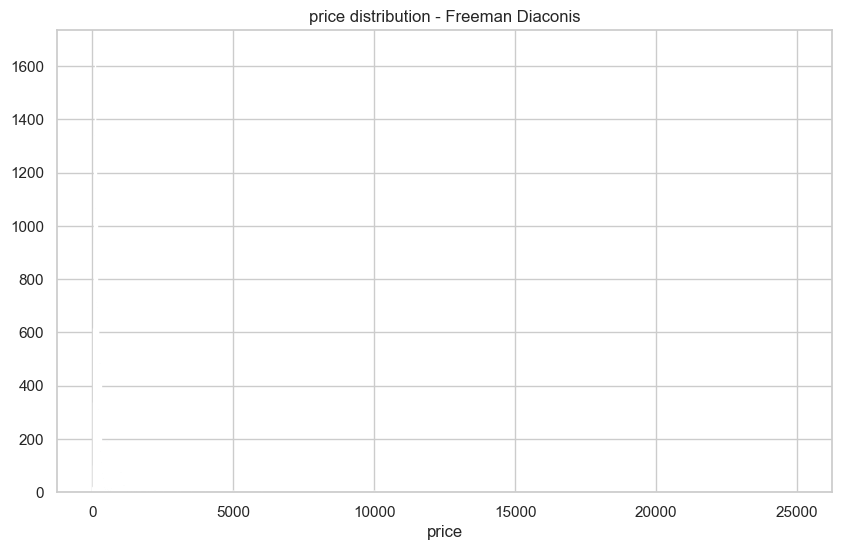

In [12]:
h = freeman_diaconis(all_listings.price)
plot_data = all_listings.price
variable_name = "price"
print("Freeman Diaconis: ", h)
mn = int(plot_data.min())
mx = int(plot_data.max())
bins = [i for i in range( mn, mx, h)]

figure = plt.figure(figsize=(10, 6))

axes = figure.add_subplot(1, 1, 1)
axes.hist(plot_data,bins=bins, color="darkslategray")
axes.set_title(variable_name + " distribution - Freeman Diaconis")
axes.set_xlabel(variable_name)

plt.show()
plt.close()

Yes - let's get rid of the 25000 listing and see if the histogram starts to make more sense

In [13]:
trimmed_listings = all_listings[all_listings.price < 1500]

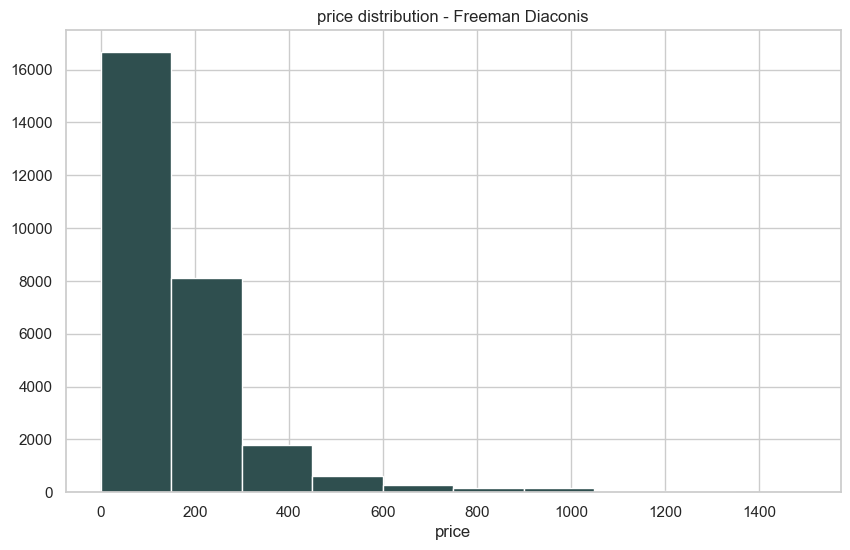

In [14]:
plot_data = trimmed_listings.price

figure = plt.figure(figsize=(10, 6))

axes = figure.add_subplot(1, 1, 1)
axes.hist(plot_data, color="darkslategray")
axes.set_title(variable_name + " distribution - Freeman Diaconis")
axes.set_xlabel(variable_name)

plt.show()
plt.close()

Removing listings below 1500 reveals a distribution with a very strong skew to the right. The distribution appears to be almost exponential which would not make much sense given our domain knowledge. Let's use Freeman Diaconis bins and limit the listings from 0-500

Freeman Diaconis:  7


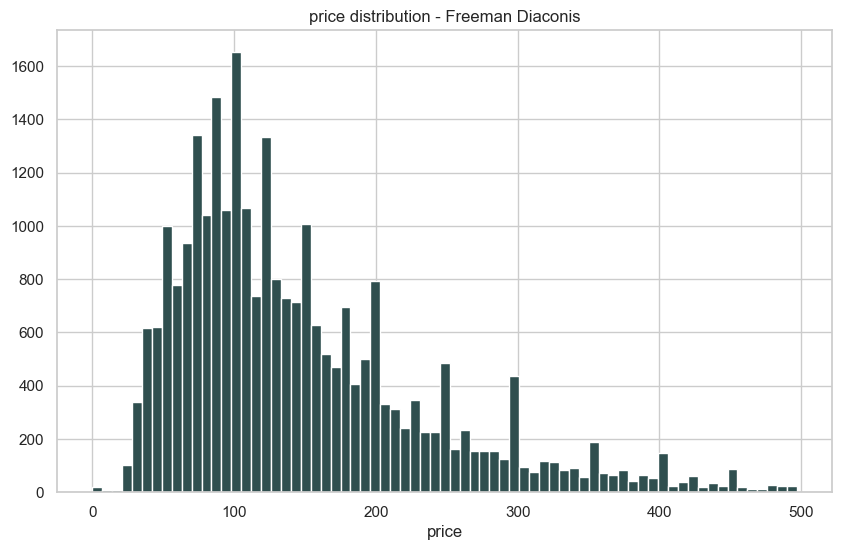

In [15]:
listings_below_500 = all_listings[all_listings.price < 500]

h = freeman_diaconis(listings_below_500.price)
plot_data = listings_below_500.price
variable_name = "price"
print("Freeman Diaconis: ", h)
mn = int(plot_data.min())
mx = int(plot_data.max())
bins = [i for i in range( mn, mx, h)]

figure = plt.figure(figsize=(10, 6))

axes = figure.add_subplot(1, 1, 1)
axes.hist(plot_data,bins=bins, color="darkslategray")
axes.set_title(variable_name + " distribution - Freeman Diaconis")
axes.set_xlabel(variable_name)

plt.show()
plt.close()

Looking at the above distribution, we see a that there is a strong skew to the right even when we remove all listings over 500 per night. This can be interpreted as the majority of AirBnBs having a nightly price that is between 85 and 200 per night but then increasingly expensive houses becomes less and less popular. 

Moving on to the single variable analysis of `neighborhoods`...

<a id="neighborhood"></a>
## Neighborhood

The neighborhood variable is the string name of the DMV neighborhood in which the AirBnB is located. The dataset description says that the AirBnBs in this dataset are all located within D.C. so we expect the neighborhood names to be all neighborhoods within the actual district. As for how many neighborhoods there will be, that depends on how granular the neighborhood boundaries are. It would make sense for AirBnB to default to some governmental agency to define the neighborhood boundaries because neighorhood boundaries are highly subjective and constantly changing in the colloquial sense. For that reason, I expect the number of neighborhoods to be somewhere between 20 and 40.

In [16]:
# read the result of an arbitrary SQL query to a Pandas DataFrame
neighborhoods = con.execute("SELECT * from neighborhoods").df()
neighborhoods.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39 entries, 0 to 38
Data columns (total 6 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   neighbourhood_group  0 non-null      object
 1   neighbourhood        39 non-null     object
 2   type_outer           39 non-null     object
 3   feature_type         39 non-null     object
 4   geometry_type        39 non-null     object
 5   coordinates          39 non-null     object
dtypes: object(6)
memory usage: 2.0+ KB


In [17]:
print(neighborhoods.neighbourhood)

0                  Brightwood Park, Crestwood, Petworth
1                         Brookland, Brentwood, Langdon
2                            Capitol Hill, Lincoln Park
3       Capitol View, Marshall Heights, Benning Heights
4        Cathedral Heights, McLean Gardens, Glover Park
5     Cleveland Park, Woodley Park, Massachusetts Av...
6     Colonial Village, Shepherd Park, North Portal ...
7     Columbia Heights, Mt. Pleasant, Pleasant Plain...
8      Congress Heights, Bellevue, Washington Highlands
9     Deanwood, Burrville, Grant Park, Lincoln Heigh...
10                             Douglas, Shipley Terrace
11    Downtown, Chinatown, Penn Quarters, Mount Vern...
12           Dupont Circle, Connecticut Avenue/K Street
13                         Eastland Gardens, Kenilworth
14    Edgewood, Bloomingdale, Truxton Circle, Eckington
15    Fairfax Village, Naylor Gardens, Hillcrest, Su...
16    Friendship Heights, American University Park, ...
17                      Georgetown, Burleith/Hil

There are 38 total neighbrohoods in this dataset. They appear to encompass multiple colloquially-known neighborhoods given that their names almost all consist of multiple names combined in a comma-separated list. They appear in alphabetical order and the index on right right column of the above print-out will correspond to some labels I use below.

The `neighborhoods` table also includes a `polygon` shape of the neighborhood using lat/lon points. Let's map those:

In [18]:
!pip install geopandas

In [19]:
import geopandas as gpd
from shapely.geometry import Polygon

p_list = []
for p in neighborhoods.coordinates:
  p_list.append(Polygon(p))

neighborhoods_gpd = gpd.GeoDataFrame(neighborhoods, crs='epsg:4326', geometry=p_list)       

neighborhoods_gpd['rep_point'] = neighborhoods_gpd['geometry'].apply(lambda x: x.representative_point().coords[:])
neighborhoods_gpd['rep_point'] = [coords[0] for coords in neighborhoods_gpd['rep_point']]

neighborhoods_gpd['alpha_index'] = list(range(1,len(neighborhoods_gpd.neighbourhood)+1))

neighborhoods_gpd.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 39 entries, 0 to 38
Data columns (total 9 columns):
 #   Column               Non-Null Count  Dtype   
---  ------               --------------  -----   
 0   neighbourhood_group  0 non-null      object  
 1   neighbourhood        39 non-null     object  
 2   type_outer           39 non-null     object  
 3   feature_type         39 non-null     object  
 4   geometry_type        39 non-null     object  
 5   coordinates          39 non-null     object  
 6   geometry             39 non-null     geometry
 7   rep_point            39 non-null     object  
 8   alpha_index          39 non-null     int64   
dtypes: geometry(1), int64(1), object(7)
memory usage: 2.9+ KB


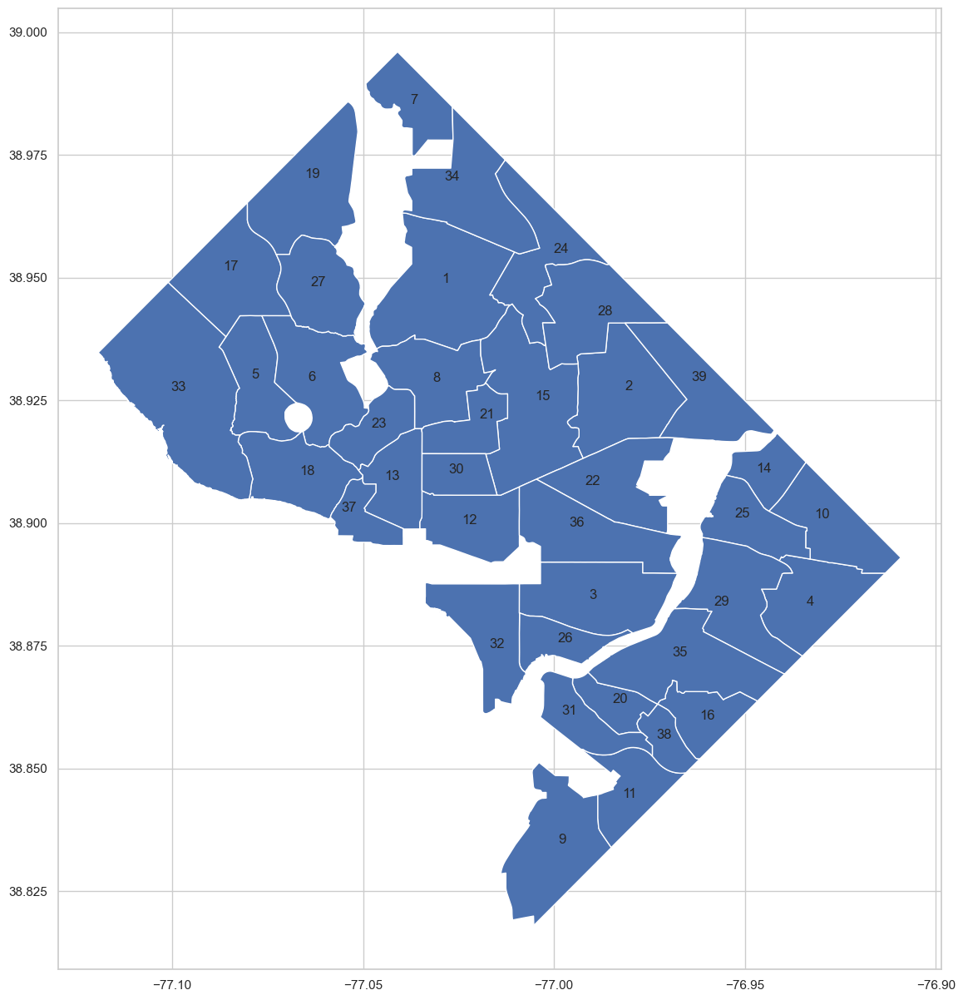

In [20]:
fig,ax = plt.subplots(figsize = (15,15))
neighborhoods_gpd.plot(ax=ax)
for idx, row in neighborhoods_gpd.iterrows():
    plt.annotate(row['alpha_index'], xy=row['rep_point'],
                 horizontalalignment='center')

plt.show()

From the above map, we can see that all of these neighborhoods exist within the federal borders of the District of Columbia  (up until now, we were unsure if these neighborhoods bled into the surrounding DMV area). The polygons are of diverse shapes and sizes.  

The white spots in the map correspond to neighborhoods clusters that are not represented in the AirBnB dataset. These are:
* Observatory Circle (small white circle in the northwest quadrant). Houses the US Naval Observatory and the house of the US Vice President.
* Rock Creek Park (long thin cluster extending from the top of the diamond to cluster 23). A national park.
* Walter Reed (trapazoidal polygon missing between 7 and 34). A military hospital.
* Arboretum, Anacostia River (long, river-shaped polygon starting between 31 and 32 and ending between 14 and 39). A river and a federally run arboretum.
* National Mall, Potomac River (The polygon missing from the entire southwest quadrant of the diamond, spanning from 33 to 9 and taking the horizontal rectanglular chunk from between 12, 36, 3, and 32). The national mall of the US Capitol and a large river between DC and Virginia.
* Joint Base, Anacostia Boilings (the misisng polygon west of 9 bordering the Potomac and Anacostia). A Naval and Joint Armed Forces base.
* Saint Elizabeth's (the rectangular polygon missing between 31, 11, and 9). A hospital.

Source: https://opendata.dc.gov/datasets/neighborhood-clusters/explore?location=38.855725%2C-77.000257%2C11.77.

We now move on to single variable EDA on variables that deal with data about the *host* of the AirBnB.

In [21]:
latest_hosts_unique = latest_listings.drop_duplicates(subset='host_id')

## <a id="host_info">Host Information</a>

We want to investigate the relationship between neighborhoods and the booked price of airbnbs in their area. We will start with individual variable analysis of `price` and `neighborhoods` and then do a pairwise analyis. To start this, we will load the data from the `listings` table and the `neighborhoods` table into their own Pandas dataframes to make them easier to work with

We also want the relationship between `price` and data that relates to the host like
* `host_since`
* `host_location`
* `host_response_time`
* `host_response_rate`
* `host_acceptance_rate`
* `host_is_superhost`
* `host_listings_count`
* `host_total_listings_count`
* `host_verifications`
* `host_has_profile_pic`
* `host_identity_verified`


### `host_since` <a id="host_since"></a>

This variable corresponds to the date on which the host became an AirBnB host. It is saved as a Pandas `datetime`. We can use this data to understand how many day/months/years each person has been a host. AirBnB is only about 14 years old so we expect the maximum number of years someone has been a host to be less than 14. Between 0 and 14 I expect most people to have been hosts between 0 and 7 years and fewer between 7 and 14 which would cause a skew to the right.

In [22]:
import datetime

In [23]:
timestamp = pd.Timestamp(datetime.datetime(2021, 10, 10))
res = timestamp.today()
latest_hosts_unique.days_host = (res - latest_hosts_unique.host_since) / np.timedelta64(1,'D')
latest_hosts_unique.years_host = (res - latest_hosts_unique.host_since) / np.timedelta64(1,'Y')
latest_hosts_unique.days_host

0        5125.016878
1        4381.016878
2        5109.016878
3        3877.016878
4        4255.016878
            ...     
10531     269.016878
10547    1647.016878
10549    1035.016878
10550    1562.016878
10554     332.016878
Name: host_since, Length: 5843, dtype: float64

In [24]:
latest_hosts_unique.days_host.describe()

count    5840.000000
mean     2509.856433
std       986.443234
min        90.016878
25%      2016.016878
50%      2585.016878
75%      3158.266878
max      5130.016878
Name: host_since, dtype: float64

In [25]:
latest_hosts_unique.years_host.describe()

count    5840.000000
mean        6.871754
std         2.700790
min         0.246458
25%         5.519667
50%         7.077536
75%         8.647041
max        14.045509
Name: host_since, dtype: float64

The minimum number of years is 0.23 years and the maximum is just over 14 which tracks. The mean is just under 7 years.

Freeman Diaconis:  0


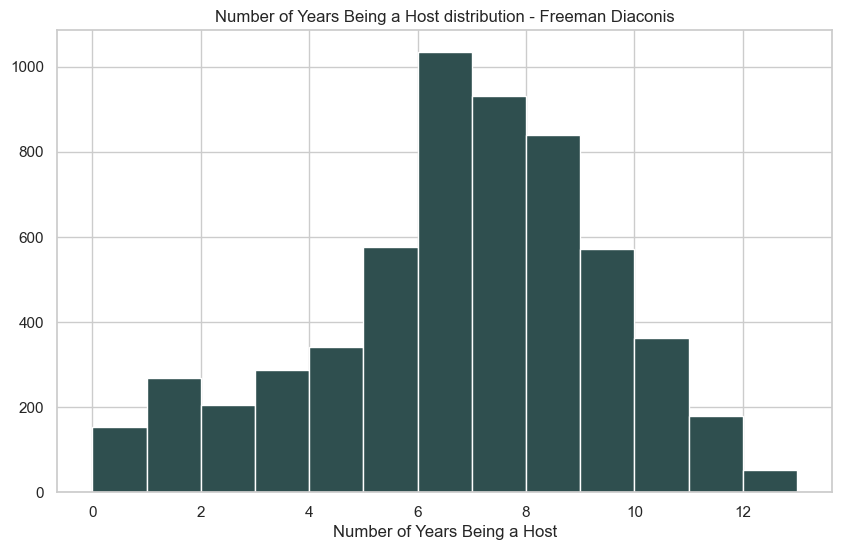

In [26]:
h = freeman_diaconis(latest_hosts_unique.years_host.dropna())
plot_data = latest_hosts_unique.years_host.dropna()
variable_name = "Number of Years Being a Host"
print("Freeman Diaconis: ", h)
mn = int(plot_data.min())
mx = int(plot_data.max())
bins = [i for i in range( mn, mx, 1)]

figure = plt.figure(figsize=(10, 6))

axes = figure.add_subplot(1, 1, 1)
axes.hist(plot_data,bins=bins, color="darkslategray")
axes.set_title(variable_name + " distribution - Freeman Diaconis")
axes.set_xlabel(variable_name)

plt.show()
plt.close()

This distribution is mostly symmetric with a slight skew to the left. The majority of the data is etween 6 and 9 years. Few hosts have been hosts for less than 4 years ore more than 10.5

### `host_location` <a id="host_location"></a>

This variable is a categorical string variable indicating where the host resides. I don't know if this data is self-reported or chosen from a selection. I would expect most hosts to live in D.C. because they own property within D.C.

In [27]:
latest_listings.host_location.value_counts(normalize=True)[:10]

Washington, DC                                     0.439045
Washington, District of Columbia, United States    0.227377
Houston, Texas, United States                      0.062631
US                                                 0.035714
New York, NY                                       0.031211
United States                                      0.012882
Arlington, VA                                      0.008065
Silver Spring, MD                                  0.007331
New York, New York, United States                  0.006075
Alexandria, Virginia, United States                0.005237
Name: host_location, dtype: float64

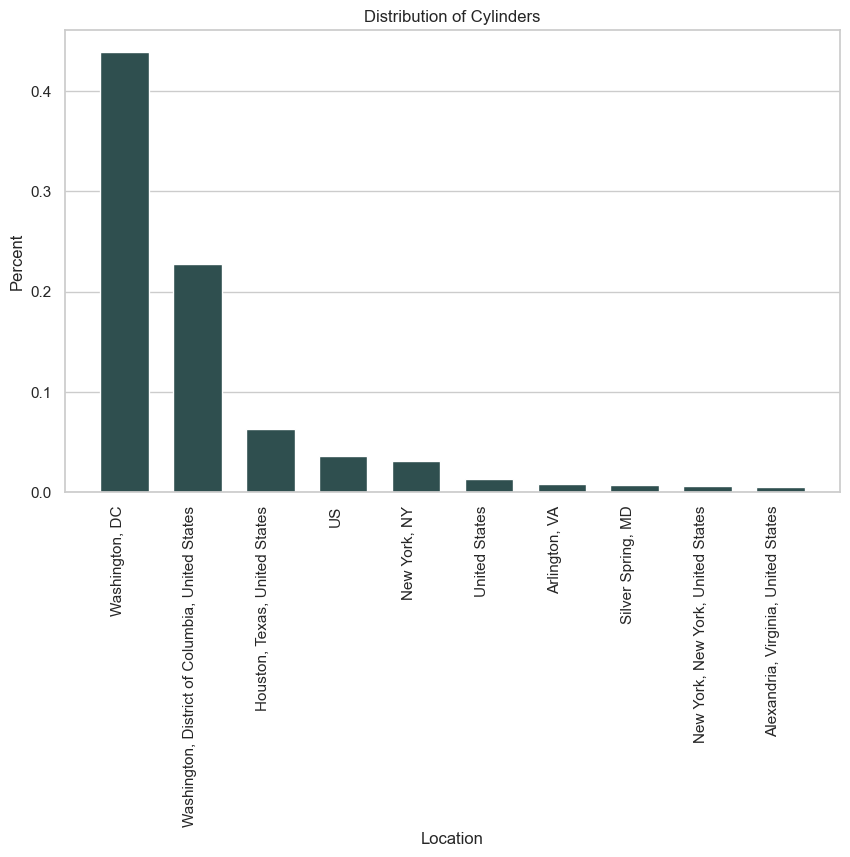

In [28]:
data = latest_listings.host_location.value_counts(normalize=True)[:10]
x = range( len(data))
width = 1/1.5

figure = plt.figure(figsize=(10, 6))

axes = figure.add_subplot(1, 1, 1)
axes.bar(x, data, width, align="center", color="darkslategray")
axes.set_xticks(list(range(len(dict(latest_listings.host_location.value_counts()[:10]).values()))))
axes.set_xticklabels(dict(latest_listings.host_location.value_counts()[:10]).keys())
axes.set_title( "Distribution of Host Locations")
axes.set_xlabel("Location")
axes.set_xticklabels(dict(latest_listings.host_location.value_counts()[:10]).keys(), rotation=90, ha='right')
axes.set_ylabel( "Percent")
axes.xaxis.grid(False)

plt.show()
plt.close()

This data is not very useful. There are overlapping and redundant categories - namely there is bboth a "Washington, District of Columbia, United States" AND a "Washington, DC" category. There is also a "US" and "United States" category which *might* mean these people live in D.C. or might mean anywhere else within the United States.

Regardless, the majority of hosts live within DC.

### `host_response_time` <a id="host_response_time"></a>

Host response time is the AirBnB autogenerated cateogorical variable assigned to each host based on their response time to customer messages. These categories include things like "within an hour" or "within a couple of days". I expect most hosts to respond "within a day" or "within a few hours" because there is an advantage in getting customer to trust/like you if you respond faster. 

In [29]:
latest_listings.host_response_time.value_counts()

within an hour        5525
N/A                   2946
within a few hours    1078
within a day           657
a few days or more     192
Name: host_response_time, dtype: int64

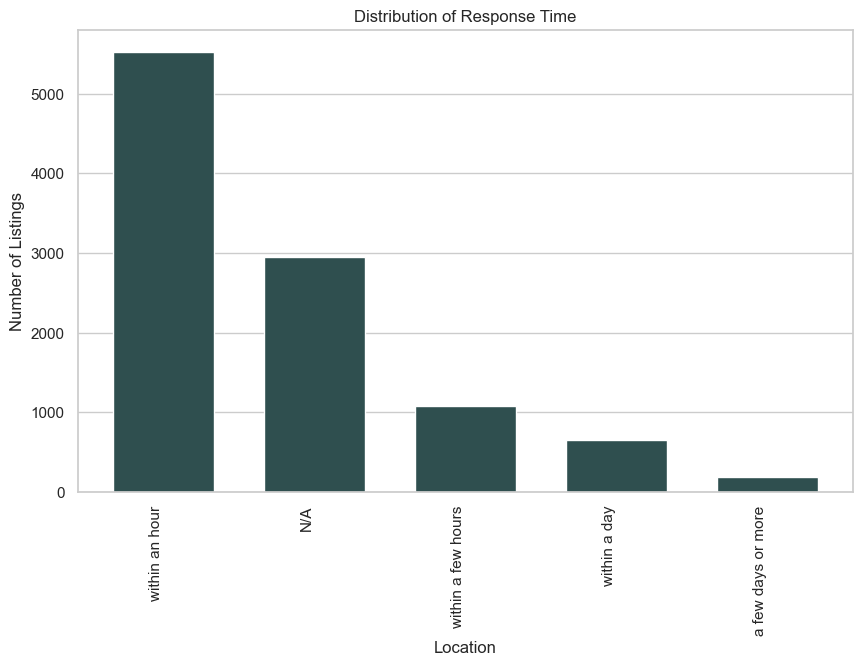

In [364]:
data = latest_listings.host_response_time.value_counts()
x = range( len(data))
width = 1/1.5

figure = plt.figure(figsize=(10, 6))
axes = figure.add_subplot(1, 1, 1)
axes.bar(x, data, width, align="center", color="darkslategray")
axes.set_xticks(list(range(len(dict(latest_listings.host_response_time.value_counts()).values()))))
axes.set_title( "Distribution of Response Time")
axes.set_xlabel("Location")
axes.set_xticklabels(dict(latest_listings.host_response_time.value_counts()).keys(), rotation=90, ha='right')
axes.set_ylabel( "Number of Listings")
axes.xaxis.grid(False)

plt.show()
plt.close()

There is a sizable portion of hosts within the "N/A" category. That aside, the clear majority of remaining hosts respond within the hour with subsequent categories having a decreasing frequency in order of length of time to respond.

### `host_response_rate` <a id="host_response_rate"></a>

Host response rate is the percentage of messages from customers that hosts respond to at all, regardless of time. This will be on a range of 0-100. I expect the mean number to be greater than 90% because hosts have an incentive to respond to every message from a potential customer in order to gain their business and current customers to maintain a high rating. 

In [31]:
latest_listings['host_response_rate'] = latest_listings['host_response_rate'].replace('N/A',np.NaN)
latest_listings['host_response_rate'] = latest_listings['host_response_rate'].replace('%', '', regex=True).astype(float)

In [32]:
latest_listings['host_response_rate'].describe()

count    7452.000000
mean       95.040794
std        15.631311
min         0.000000
25%       100.000000
50%       100.000000
75%       100.000000
max       100.000000
Name: host_response_rate, dtype: float64

Freeman Diaconis:  0


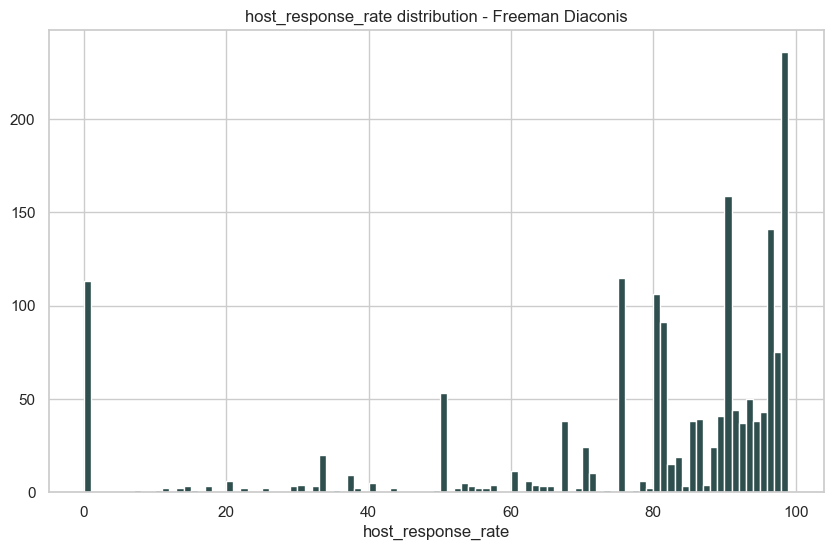

In [33]:
h = freeman_diaconis(latest_listings['host_response_rate'].dropna())
plot_data = latest_listings['host_response_rate'].dropna()
variable_name = "host_response_rate"
print("Freeman Diaconis: ", h)
mn = int(plot_data.min())
mx = int(plot_data.max())
bins = [i for i in range( mn, mx, 1)]

figure = plt.figure(figsize=(10, 6))

axes = figure.add_subplot(1, 1, 1)
axes.hist(plot_data,bins=bins, color="darkslategray")
axes.set_title(variable_name + " distribution - Freeman Diaconis")
axes.set_xlabel(variable_name)

plt.show()
plt.close()

The distribution is clearly skewed to the right. Almost ll the data is etween 80 and 100%. There is another mode at 0% which is presumably from rows within `listings` that have null values and/or hosts that are completely inactive on the website but do still have accounts as hosts.

### `host_acceptance_rate` <a id="host_acceptance_rate"></a>

Host acceptance rate is the rate of customer bids that this host accepts from 0-100. I expect this number to be high (>80%) because hosts have a monetary incentive to accept as many guests as possible throughout the year. I don't expect the IQR to be 100% like the last variable because hosts cannot say yes to everyone - especially for high-demand properties.

In [34]:
latest_listings['host_acceptance_rate'] = latest_listings['host_acceptance_rate'].replace('N/A',np.NaN)
latest_listings['host_acceptance_rate'] = latest_listings['host_acceptance_rate'].replace('%', '', regex=True).astype(float)

In [35]:
latest_listings['host_acceptance_rate'].describe()

count    8120.000000
mean       85.751108
std        24.362805
min         0.000000
25%        85.000000
50%        97.000000
75%       100.000000
max       100.000000
Name: host_acceptance_rate, dtype: float64

The mean acceptance rate is 85%. The median is 97% indicating that, once again, the mean acceptance rate is being skewed by a handful of low outliers - likely hosts with a zero acceptance rate.

Freeman Diaconis:  1


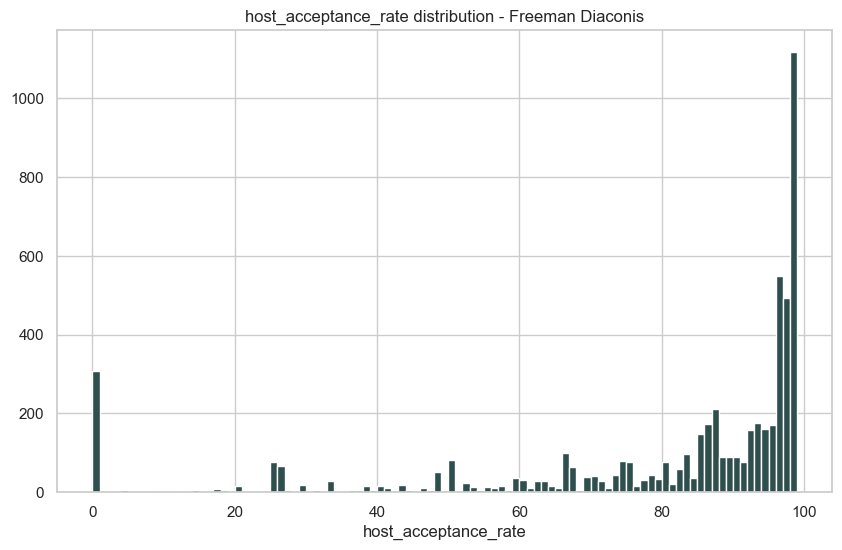

In [36]:
h = freeman_diaconis(latest_listings['host_acceptance_rate'].dropna())
plot_data = latest_listings['host_acceptance_rate'].dropna()
variable_name = "host_acceptance_rate"
print("Freeman Diaconis: ", h)
mn = int(plot_data.min())
mx = int(plot_data.max())
bins = [i for i in range( mn, mx, 1)]

figure = plt.figure(figsize=(10, 6))

axes = figure.add_subplot(1, 1, 1)
axes.hist(plot_data,bins=bins, color="darkslategray")
axes.set_title(variable_name + " distribution - Freeman Diaconis")
axes.set_xlabel(variable_name)

plt.show()
plt.close()

this distribution is highly skewed to the left once again. There are a handful of hosts with a 0% acceptance rate. This is likely from rows in `listings` that have all null values or from inactive hosts that still have desired property listings but never accept new guests.

### `host_is_superhost` <a id="host_is_superhost"></a>

This variable is a boolean variable indicating whether or not this host is a superhost. According to AirBnB, superhost status requires:
* Hostings at least 10 trips within the past year
* Having a response rate of at least 90%
* Having >80% of your trip ratings be 5 stars
* Not cancelling reserved reservations besides extenuating circumstances.

Based on past EDA and domain knowledge, these requirements are difficult to achieve. I expect there to be more non-superhosts than superhosts.

In [37]:
latest_listings.host_is_superhost.value_counts()

False    7950
True     2604
Name: host_is_superhost, dtype: int64

Only a quarter of hosts are superhosts.

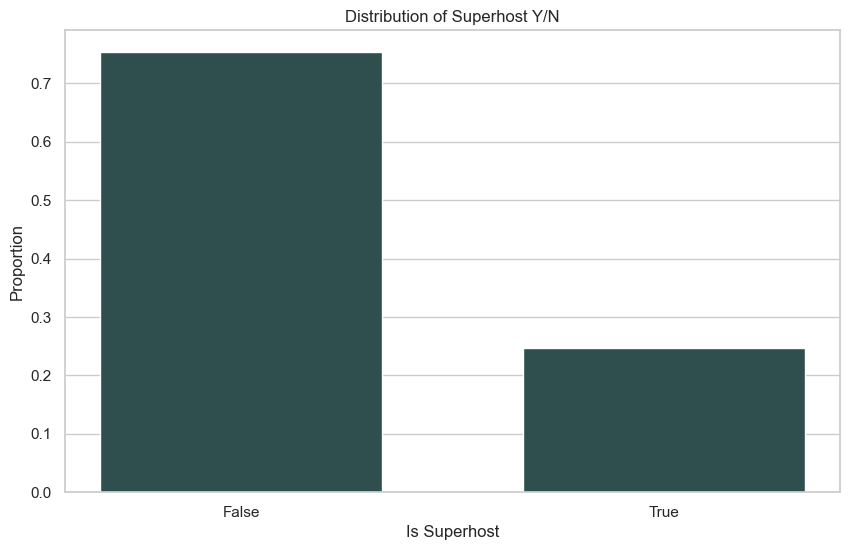

In [365]:
data = latest_listings.host_is_superhost.value_counts(normalize=True)
x = range( len(data))
width = 1/1.5

figure = plt.figure(figsize=(10, 6))
axes = figure.add_subplot(1, 1, 1)
axes.bar(x, data, width, align="center", color="darkslategray")
axes.set_xticks(list(range(len(dict(latest_listings.host_is_superhost.value_counts()).values()))))
axes.set_title( "Distribution of Superhost Y/N")
axes.set_xlabel("Is Superhost")
axes.set_xticklabels(dict(latest_listings.host_is_superhost.value_counts()).keys())
axes.set_ylabel( "Proportion")
axes.xaxis.grid(False)

plt.show()
plt.close()

75% of hosts within the last quarter are not superhosts, whereas 25% of them are.

### `host_listings_count` <a id="host_listings_count"></a>

This variable counts the number of listings that this host has within AirBnB. I expect this number to range from 1 to 25 with most hosts only having between 1 and 3 properties. 

In [39]:
latest_listings['host_listings_count'].describe()

count    10398.000000
mean       165.797750
std        676.694138
min          0.000000
25%          1.000000
50%          2.000000
75%         10.000000
max       4057.000000
Name: host_listings_count, dtype: float64

There are a couple of clear outliers and/or impossibilities. There should not be any hosts in the AirBnB database with 0 listings. The maximum number being >4000 seems to be an extreme outlier given that the IQR is between 1 and 10 listings. The mean is being heavily skewed by these high outliers.

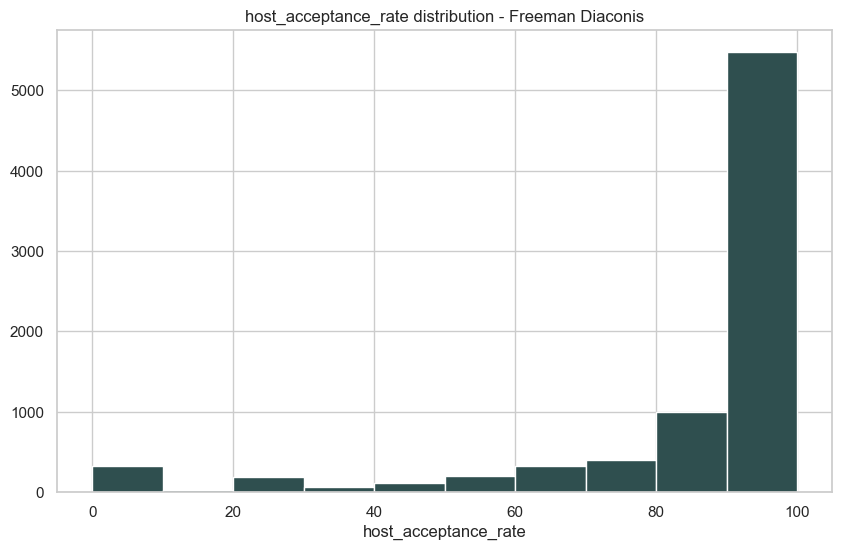

In [40]:
# h = freeman_diaconis(latest_listings['host_listings_count'].dropna())
# plot_data = latest_listings['host_listings_count'].dropna()
# variable_name = "host_listings_count"
# print("Freeman Diaconis: ", h)
# mn = int(plot_data.min())
# mx = int(plot_data.max())
# bins = [i for i in range( mn, mx, 1)]

figure = plt.figure(figsize=(10, 6))

axes = figure.add_subplot(1, 1, 1)
axes.hist(plot_data, color="darkslategray")
axes.set_title(variable_name + " distribution - Freeman Diaconis")
axes.set_xlabel(variable_name)

plt.show()
plt.close()

Clearly, most of the data is less than 500, and likely most of the data is less than 20. Let's chop off some of the very high values.

Freeman Diaconis:  0


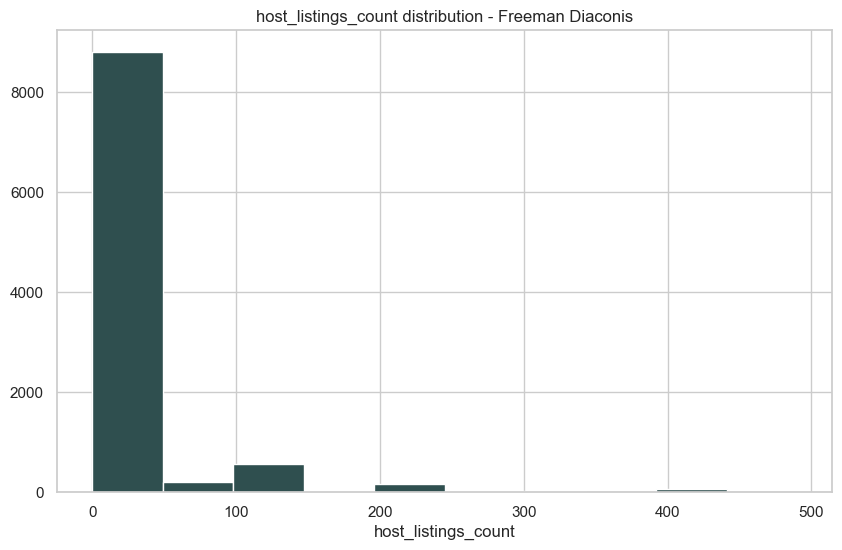

In [41]:
latest_listings.host_listings_count_under_500 = latest_listings.host_listings_count[latest_listings.host_listings_count < 500]
h = freeman_diaconis(latest_listings.host_listings_count_under_500.dropna())
plot_data = latest_listings.host_listings_count_under_500.dropna()
variable_name = "host_listings_count"
print("Freeman Diaconis: ", h)
mn = int(plot_data.min())
mx = int(plot_data.max())
bins = [i for i in range( mn, mx, 1)]

figure = plt.figure(figsize=(10, 6))

axes = figure.add_subplot(1, 1, 1)
axes.hist(plot_data, color="darkslategray")
axes.set_title(variable_name + " distribution - Freeman Diaconis")
axes.set_xlabel(variable_name)

plt.show()
plt.close()

There are a handful of hosts within the 50 to 250 range but clearly most of the data is less than 50.

Freeman Diaconis:  0


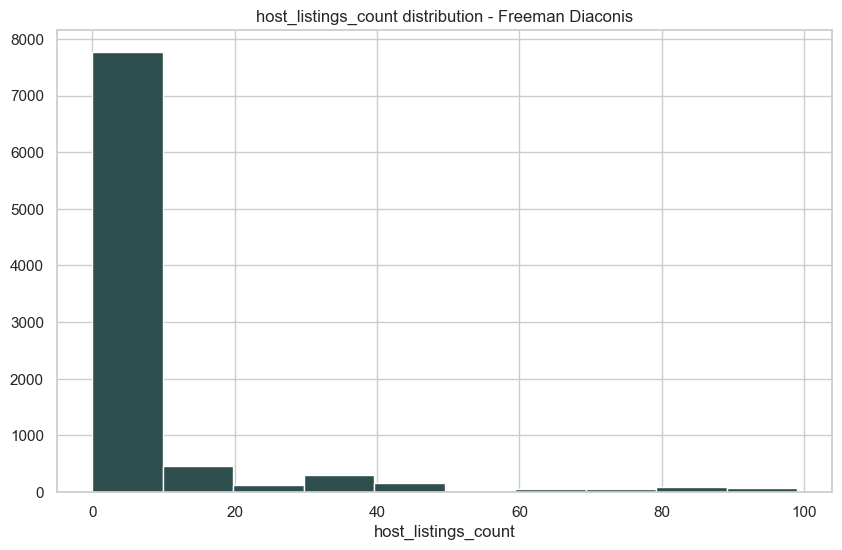

In [42]:
latest_listings.host_listings_count_under_100 = latest_listings.host_listings_count[latest_listings.host_listings_count < 100]
h = freeman_diaconis(latest_listings.host_listings_count_under_100.dropna())
plot_data = latest_listings.host_listings_count_under_100.dropna()
variable_name = "host_listings_count"
print("Freeman Diaconis: ", h)
mn = int(plot_data.min())
mx = int(plot_data.max())
bins = [i for i in range( mn, mx, 1)]

figure = plt.figure(figsize=(10, 6))

axes = figure.add_subplot(1, 1, 1)
axes.hist(plot_data, color="darkslategray")
axes.set_title(variable_name + " distribution - Freeman Diaconis")
axes.set_xlabel(variable_name)

plt.show()
plt.close()

More filtering...

Freeman Diaconis:  0


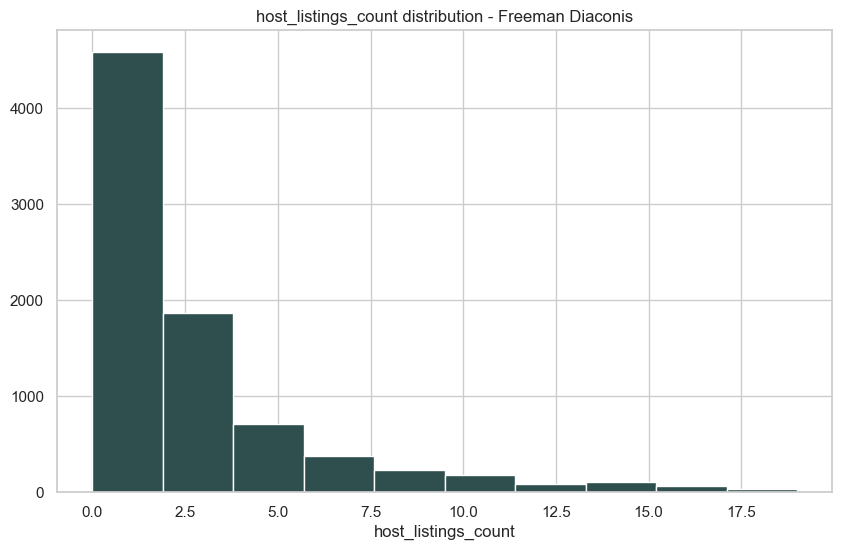

In [43]:
latest_listings.host_listings_count_under_20 = latest_listings.host_listings_count[latest_listings.host_listings_count < 20]
h = freeman_diaconis(latest_listings.host_listings_count_under_20.dropna())
plot_data = latest_listings.host_listings_count_under_20.dropna()
variable_name = "host_listings_count"
print("Freeman Diaconis: ", h)
mn = int(plot_data.min())
mx = int(plot_data.max())
bins = [i for i in range( mn, mx, 1)]

figure = plt.figure(figsize=(10, 6))

axes = figure.add_subplot(1, 1, 1)
axes.hist(plot_data, color="darkslategray")
axes.set_title(variable_name + " distribution - Freeman Diaconis")
axes.set_xlabel(variable_name)

plt.show()
plt.close()

When we look only at data between 0 and 20, we see that there is a clear exponential distribution of this variable. Most people have 1 listing. Some people have between 2 and 4. And then a handful of people have vetween 4 and 20 in a decreasing fashion.

### `host_total_listings_count` <a id="host_total_listings_count"></a>
UNUSED

### `host_verifications` <a id="host_verifications"></a>

This variable is a list of all the ways in which the host's identity has been verified. The popular avenues include things like "email" and "phone" via verification code but hosts also have the option of verifying via government IDs or any combination of things.

Because this variable is a list, I expect there to be hundres if not thousands of unique host_verification values. I expect "email" and "phone" to be the main avenues of verification because of its ease.

In [44]:
latest_listings.host_verifications.value_counts(normalize=True)[:10]

['email', 'phone']                                                                                    0.550095
['email', 'phone', 'work_email']                                                                      0.136080
['phone']                                                                                             0.051705
['email', 'phone', 'reviews', 'kba']                                                                  0.024716
['email', 'phone', 'reviews', 'jumio', 'government_id']                                               0.016004
None                                                                                                  0.015341
['email', 'phone', 'reviews']                                                                         0.014583
['email', 'phone', 'jumio', 'offline_government_id', 'selfie', 'government_id', 'identity_manual']    0.010511
['email', 'phone', 'reviews', 'jumio', 'offline_government_id', 'government_id']                      0.010133
[

There were too many unique host_verification values to display so I displayed the 10 most common ones. ['email', 'phone'] were the most common at 55%. The second most common was just ['phone']. After that, no combination of host_verification (though all including 'email' and 'phone' except for None) make up more than ~5% of the hosts.

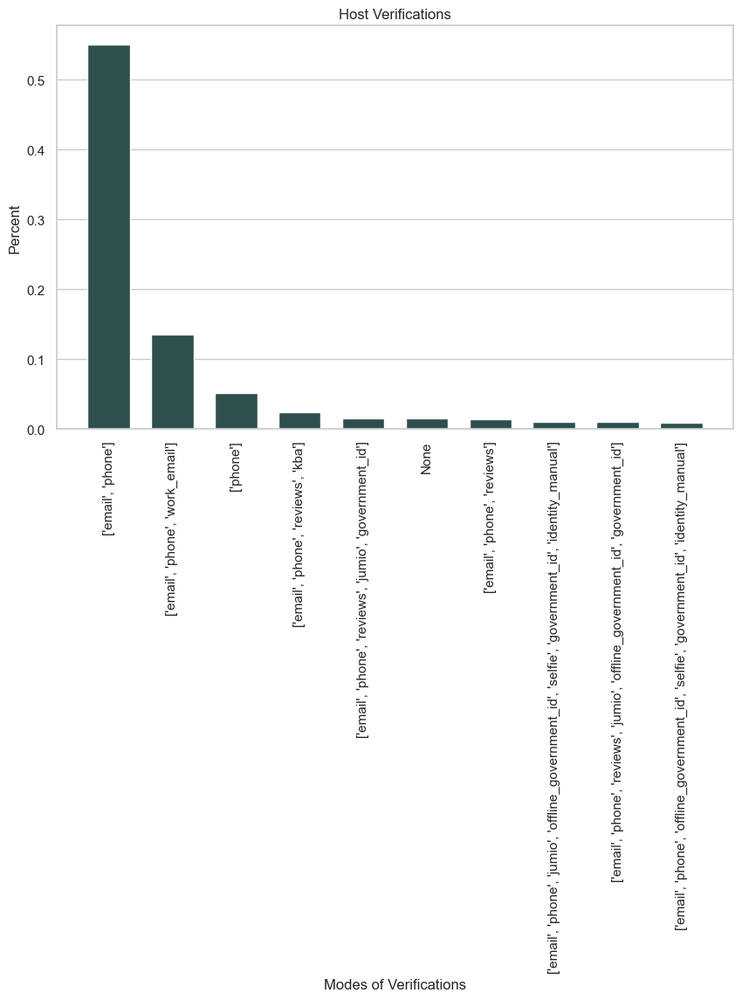

In [45]:
data = latest_listings.host_verifications.value_counts(normalize=True)[:10]
x = range( len(data))
width = 1/1.5

figure = plt.figure(figsize=(10, 6))
axes = figure.add_subplot(1, 1, 1)
axes.bar(x, data, width, align="center", color="darkslategray")
axes.set_xticks(list(range(len(dict(latest_listings.host_verifications.value_counts(normalize=True)[:10]).values()))))
axes.set_title( "Host Verifications")
axes.set_xlabel("Modes of Verifications")
axes.set_xticklabels(dict(latest_listings.host_verifications.value_counts(normalize=True)[:10]).keys(),rotation=90)
axes.set_ylabel( "Percent")
axes.xaxis.grid(False)

plt.show()
plt.close()

This chart shows the clear majority of host_verification being both email and phone.

### `host_has_profile_pic` <a id="host_has_profile_pic"></a>

This is a boolean variable indicating whether or not the host has a profile picture. According to AirBnB, all hosts are required to have a profile picture so I expect this variable to be almost 100% yes. Although there are null values in this dataset or junk rows that may present as "no"s.

In [46]:
latest_listings.host_has_profile_pic.value_counts()

True     10325
False       73
Name: host_has_profile_pic, dtype: int64

As expected, almost all hosts have a profile picture.

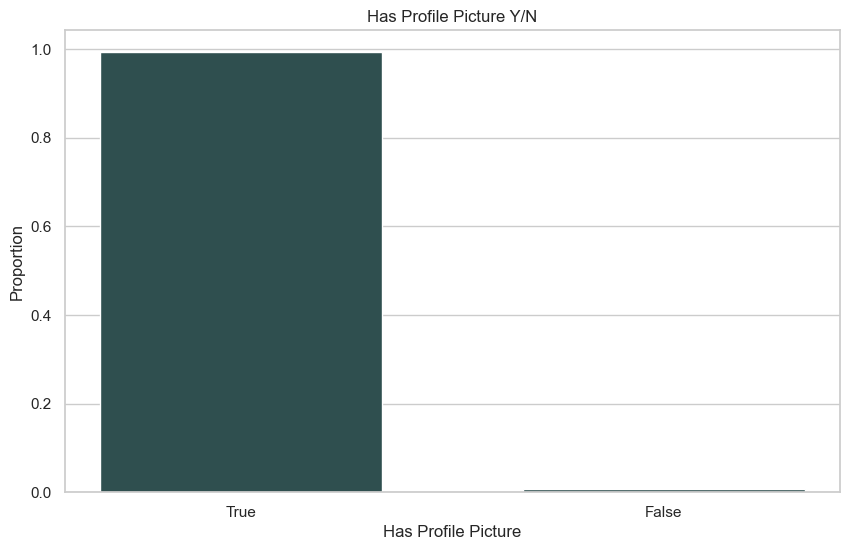

In [366]:
data = latest_listings.host_has_profile_pic.value_counts(normalize=True)
x = range( len(data))
width = 1/1.5

figure = plt.figure(figsize=(10, 6))
axes = figure.add_subplot(1, 1, 1)
axes.bar(x, data, width, align="center", color="darkslategray")
axes.set_xticks(list(range(len(dict(latest_listings.host_has_profile_pic.value_counts()).values()))))
axes.set_title( "Has Profile Picture Y/N")
axes.set_xlabel("Has Profile Picture")
axes.set_xticklabels(dict(latest_listings.host_has_profile_pic.value_counts()).keys())
axes.set_ylabel( "Proportion")
axes.xaxis.grid(False)

plt.show()
plt.close()

Almost 100% of hosts have a profile picture and only 73 do not.

### `host_identity_verified` <a id="host_identity_verified"></a>

This variable is another boolean indicating whether the host's identity has been verified. AirBnB's process for host identification involves hosts providing their name, date of birth, or government ID. 

I would expect a clear majority of hosts to have their identity verified because they have an incentive to build trust with potential customers because that would ostensibly make customers more likely to book a listing with them.

In [48]:
latest_listings.host_identity_verified.value_counts()

True     8675
False    1723
Name: host_identity_verified, dtype: int64

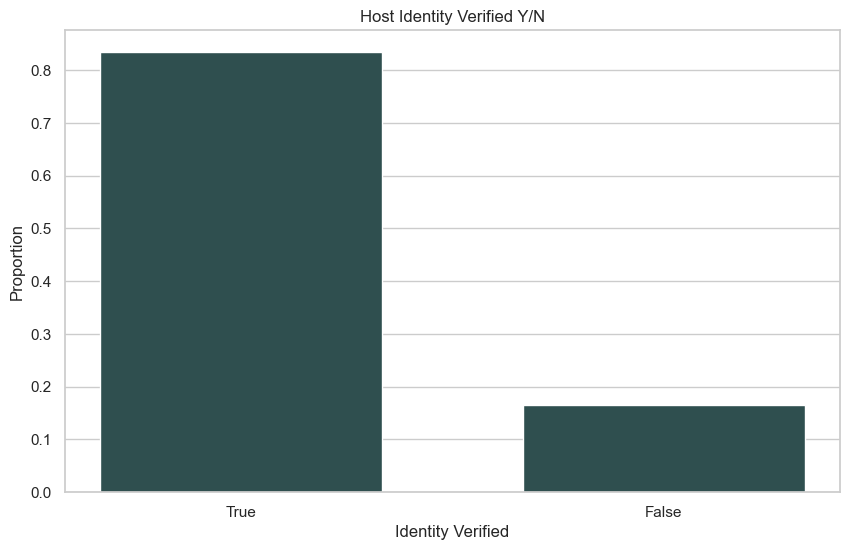

In [367]:
data = latest_listings.host_identity_verified.value_counts(normalize=True)
x = range( len(data))
width = 1/1.5

figure = plt.figure(figsize=(10, 6))
axes = figure.add_subplot(1, 1, 1)
axes.bar(x, data, width, align="center", color="darkslategray")
axes.set_xticks(list(range(len(dict(latest_listings.host_identity_verified.value_counts()).values()))))
axes.set_title( "Host Identity Verified Y/N")
axes.set_xlabel("Identity Verified")
axes.set_xticklabels(dict(latest_listings.host_identity_verified.value_counts()).keys())
axes.set_ylabel( "Proportion")
axes.xaxis.grid(False)

plt.show()
plt.close()

Almost 85% of hosts have had their identity verified and just over 15% of hosts have not - as expected.

## <a id="Rental_Info">Rental Information</a>
The following room descriptors give information about the rental property. How many rooms, bathrooms, and beds does it have? How many people can it accomodate? All things being equal, the more of these will mean a higher price to rent. 

* property_type - text
* room_type - text - currently in shared listings
* accomodates - integer
* bathrooms - text  (problem-- this is showing up as blanks)
* bathrooms_text - text
* bedrooms - integer
* beds- integer
* amenities - list in []- This could be expanded to individual columns


Target Variable
* price


For the following exploration, we will use the latest_listings table, which includes only one of each listing, taking the most recent data if there were duplicates in the data set.

First, we'll bring in the amenities information and look at it from a high level

In [50]:
con.execute("select property_type, room_type, accommodates, bathrooms, bathrooms_text, bedrooms, beds, amenities, price from latest_listings;")
listings = con.fetchall()
room_columns = ['property_type', 'room_type', 'accommodates', 'bathrooms', 'bathrooms_text', 'bedrooms', 'beds', 'amenities', 'price']
listings_df = pd.DataFrame(listings, columns=room_columns)
listings_df.head()

,property_type,room_type,accommodates,bathrooms,bathrooms_text,bedrooms,beds,amenities,price
0,Private room in home,Private room,1,None,1 private bath,1.0,1.0,"[""Dryer"", ""Smoke alarm"", ""Cooking basics"", ""In...",67.0
1,Private room in rental unit,Private room,1,None,2 shared baths,1.0,1.0,"[""Smoke alarm"", ""Cooking basics"", ""Bed linens""...",39.0
2,Private room in townhouse,Private room,3,None,1 private bath,1.0,2.0,"[""Dryer"", ""Smoke alarm"", ""Single level home"", ...",75.0
3,Entire condo,Entire home/apt,2,None,1.5 baths,1.0,1.0,"[""Dryer"", ""TV with standard cable"", ""Cooking b...",250.0
4,Private room in guest suite,Private room,3,None,1 private bath,1.0,2.0,"[""Dryer"", ""Smoke alarm"", ""Paid parking on prem...",113.0


In [51]:
trimmed_listings = listings_df[listings_df.price > 0]

### <a id="property_type">Property_Type </a>
First, we'll look at what this column describes.


Queries:
* select distinct room_type, property_type from listings order by room_type;  
* select count(property_type), property_type from listings group by property_type;  
* select distinct property_type from listings;  


In [52]:
listings_df.property_type.describe()

count                  10560
unique                    61
top       Entire rental unit
freq                    3488
Name: property_type, dtype: object

There are 61 distinct values for this column, with the most frequent item being "Entire rental unit."

Next, we'll look at the distribution of each category. Since there are 61 of these, we'll rely on a table to parse the info.

In [53]:
con.execute("select property_type, count(property_type) as prop_count from latest_listings group by property_type order by prop_count desc;")
distinct_property_types = con.fetchall()
print(tabulate(distinct_property_types, headers=['Property Type', 'Count'], tablefmt='fancy_grid'))

╒═════════════════════════════════════╤═════════╕
│ Property Type                       │   Count │
╞═════════════════════════════════════╪═════════╡
│ Entire rental unit                  │    3488 │
├─────────────────────────────────────┼─────────┤
│ Entire serviced apartment           │     889 │
├─────────────────────────────────────┼─────────┤
│ Entire townhouse                    │     811 │
├─────────────────────────────────────┼─────────┤
│ Entire home                         │     739 │
├─────────────────────────────────────┼─────────┤
│ Entire guest suite                  │     632 │
├─────────────────────────────────────┼─────────┤
│ Private room in home                │     606 │
├─────────────────────────────────────┼─────────┤
│ Entire condo                        │     595 │
├─────────────────────────────────────┼─────────┤
│ Private room in townhouse           │     522 │
├─────────────────────────────────────┼─────────┤
│ Private room in rental unit         │     449 │


The most frequent property types include "entire" in the description, initially indicating that you would have the unit to yourself.

This is a category for the listing that indicates:
1) Is this an apartment, condo, townhome, house, guesthouse, vacation home, etc?
2) Which part of category 1 does the renter get to themselves?

It should be separated into two descriptors if possible. Part 2 is covered by Room_Type below.


### <a id='room_type'>Room_Type</a>
The property type above seemed to include the "Room type". We'll see what it actually means:


In [54]:
con.execute("select distinct room_type from latest_listings;")
distrinct_room_types = con.fetchall()
distrinct_room_types

[('Private room',), ('Entire home/apt',), ('Shared room',), ('Hotel room',)]

This is a nice categorical in that there are few options:
* Entire home/apt
* Private room
* Shared room
* Hotel room

This covers part 2 of the "property type" above. 

Let's see the relationship between property_type and room_type

In [55]:
con.execute("select distinct room_type, property_type, count(property_type) as counts from latest_listings group by room_type, property_type order by room_type, counts desc;")
roomtype_proptype_counts = con.fetchall()
roomtype_proptype_counts_df = pd.DataFrame(roomtype_proptype_counts, columns=['room_type', 'property_type', 'property_type_counts'])

print(tabulate(roomtype_proptype_counts, headers=['room_type', 'property_type', 'counts'], tablefmt='pretty'))

+-----------------+-------------------------------------+--------+
|    room_type    |            property_type            | counts |
+-----------------+-------------------------------------+--------+
| Entire home/apt |         Entire rental unit          |  3488  |
| Entire home/apt |      Entire serviced apartment      |  889   |
| Entire home/apt |          Entire townhouse           |  811   |
| Entire home/apt |             Entire home             |  739   |
| Entire home/apt |         Entire guest suite          |  632   |
| Entire home/apt |            Entire condo             |  595   |
| Entire home/apt |       Entire residential home       |  307   |
| Entire home/apt |     Entire condominium (condo)      |  300   |
| Entire home/apt |          Entire guesthouse          |   83   |
| Entire home/apt |             Entire loft             |   51   |
| Entire home/apt |        Entire vacation home         |   17   |
| Entire home/apt |         Room in aparthotel          |   16

Each of the property types maps to a room type, and it looks like most of the listings in the Washington DC area are for Entire homes/apartments.

We'll plot the counts for each of these four types below:

Entire home/apt    7975
Private room       2399
Shared room         158
Hotel room           28
Name: room_type, dtype: int64


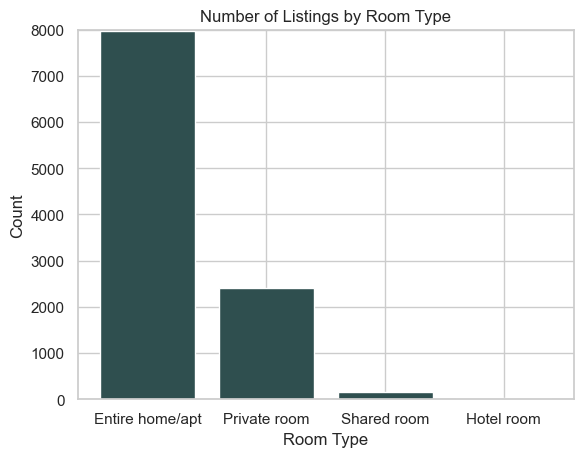

In [56]:
room_type_list = listings_df['room_type'].unique()
room_type_list

room_type_count = listings_df['room_type'].sort_index().value_counts()
print(room_type_count)

figure = plt.figure()
ax1 = figure.add_subplot(1,1,1)
ax1.bar(room_type_count.index, room_type_count, color=THEME)
ax1.set_xlabel("Room Type")
ax1.set_ylabel("Count")
ax1.set_title("Number of Listings by Room Type")
ax1.set_ylim(0,8000)
ax1.yaxis.grid( visible=True, which="major")
ax1.set_axisbelow(True)


Of the ~10,500 listings, almost 8000 were 'Entire home/apt', followed by 'Private room', then very few for 'Shared room' and 'Hotel room'.

### <a id="accomodates">Accomodates</a>

This describes the maximum capacity for the unit.

First, we'll look at the distribution.


+-------------+-----------------+
| Accomodates | Num of Listings |
+-------------+-----------------+
|      0      |        5        |
|      1      |      1007       |
|      2      |      3319       |
|      3      |      1487       |
|      4      |      2262       |
|      5      |       721       |
|      6      |       899       |
|      7      |       163       |
|      8      |       348       |
|      9      |       39        |
|     10      |       129       |
|     11      |       16        |
|     12      |       81        |
|     13      |       12        |
|     14      |       16        |
|     15      |        7        |
|     16      |       49        |
+-------------+-----------------+


Text(0.5, 1.0, 'Accomodates distribution')

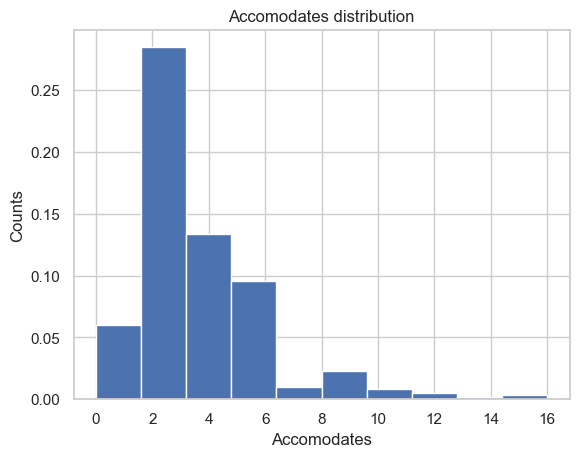

In [57]:
accommodates_count = listings_df['accommodates'].value_counts().sort_index()
accommodates_count = pd.DataFrame(accommodates_count)
print(tabulate(accommodates_count, headers=['Accomodates', 'Num of Listings'], tablefmt='pretty'))


figure = plt.figure()
ax1 = figure.add_subplot(1,1,1)
ax1.hist(listings_df['accommodates'],density=True)
ax1.set_xlabel('Accomodates')
ax1.set_ylabel('Counts')
ax1.set_title('Accomodates distribution')

More than a quarter of the listings are from the two to four range. There's an oddity where the a property accommodates 0.

In [58]:
listings_df[listings_df.accommodates == 0]

,property_type,room_type,accommodates,bathrooms,bathrooms_text,bedrooms,beds,amenities,price
3155,Room in hostel,Hotel room,0,None,None,NaN,NaN,"[""Long term stays allowed"", ""Smoke alarm"", ""Fi...",0.0
3273,Room in hostel,Hotel room,0,None,None,NaN,NaN,"[""Long term stays allowed"", ""Dryer"", ""Luggage ...",0.0
3589,Room in boutique hotel,Hotel room,0,None,None,NaN,NaN,"[""43\"" HDTV with Chromecast"", ""Long term stays...",0.0
6651,Room in boutique hotel,Hotel room,0,None,None,NaN,NaN,"[""Cooked-to-order breakfast available \u2014 $...",0.0
9869,Room in boutique hotel,Hotel room,0,None,None,NaN,NaN,"[""Heating"", ""Concierge"", ""Toiletries"", ""Fire e...",0.0


Looking at these listings, if accommodates is zero, there is no further information about the listing- The number of bathrooms, bedrooms, and beds are all blank, and the price is 0. This is unreliable, and cannot be used in prediction.

This condition can be used to filter out data that cannot be used in a model.

### <a id='bathrooms'> Bathrooms </a>

This is a text type variable.

__Problem__ This data shows up as blank in the source CSV data, so it will show up as a blank in our data warehouse.  

We may need to use the bathrooms_text to pull out this info.



### <a id='bathrooms_text'>bathrooms_text</a>

This includes
1. how many baths (counting half baths) are available to the renter
2. if the baths are 'shared' or not 

Both of these need to be pulled out in order for this to be of use.


In [59]:
listings_df.bathrooms_text.unique()

array(['1 private bath', '2 shared baths', '1.5 baths', '3 shared baths',
       '1 shared bath', '1 bath', None, '1.5 shared baths', '2.5 baths',
       '3 baths', '2 baths', '3.5 baths', '4 baths', '4.5 baths',
       '2.5 shared baths', '8 shared baths', '6 baths', '5 baths',
       '0 baths', '0 shared baths', '7 baths', '5.5 baths',
       '5.5 shared baths', '4.5 shared baths', '3.5 shared baths',
       'Half-bath', '5 shared baths', '15 baths', '4 shared baths',
       '6 shared baths', 'Shared half-bath', '7.5 baths',
       'Private half-bath', '11 shared baths', '11 baths', '6.5 baths',
       '50 shared baths'], dtype=object)

### <a id='bedrooms'>Bedrooms</a>
This is the number of bedrooms available to the renter, and is a numerical value.


+----------+-----------------+
| Bedrooms | Num of Listings |
+----------+-----------------+
|   1.0    |      6225       |
|   2.0    |      2089       |
|   3.0    |       822       |
|   4.0    |       324       |
|   5.0    |       90        |
|   6.0    |       34        |
|   7.0    |       10        |
|   8.0    |        1        |
|   9.0    |        3        |
|   11.0   |        1        |
|   15.0   |        1        |
+----------+-----------------+


Text(0.5, 1.0, 'Bedrooms distribution')

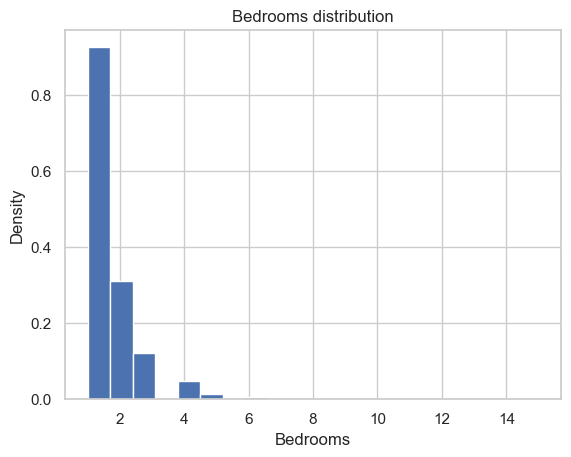

In [361]:
item_count = listings_df['bedrooms'].value_counts().sort_index()
item_count = pd.DataFrame(item_count)
print(tabulate(item_count, headers=['Bedrooms', 'Num of Listings'], tablefmt='pretty'))

figure = plt.figure()
ax1 = figure.add_subplot(1,1,1)
ax1.hist(listings_df['bedrooms'],density=True, bins=20)
ax1.set_xlabel('Bedrooms')
ax1.set_ylabel('Density')
ax1.set_title('Bedrooms distribution')

Roughly 80% of the listings are for 1-2 bedrooms.

### <a id='beds'>Beds</a>
This is the number of beds available to the renter, and is a numerical value.


+------+-----------------+
| beds | Num of Listings |
+------+-----------------+
| 1.0  |      5177       |
| 2.0  |      2953       |
| 3.0  |      1124       |
| 4.0  |       512       |
| 5.0  |       245       |
| 6.0  |       148       |
| 7.0  |       48        |
| 8.0  |       38        |
| 9.0  |       16        |
| 10.0 |        9        |
| 11.0 |        6        |
| 12.0 |       10        |
| 16.0 |        2        |
| 18.0 |        1        |
| 20.0 |        1        |
| 50.0 |        1        |
+------+-----------------+


Text(0.5, 1.0, 'Beds distribution')

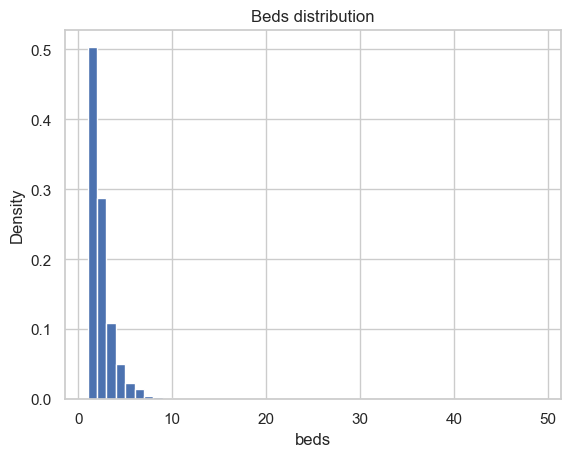

In [363]:
item_count = listings_df['beds'].value_counts().sort_index()
item_count = pd.DataFrame(item_count)
print(tabulate(item_count, headers=['beds', 'Num of Listings'], tablefmt='pretty'))

figure = plt.figure()
ax1 = figure.add_subplot(1,1,1)
ax1.hist(listings_df['beds'],density=True, bins=range(1,50,1))
ax1.set_xlabel('beds')
ax1.set_ylabel('Density')
ax1.set_title('Beds distribution')

The vast majority are for 1-2 beds, with a surprising maximum at 50.

### <a id='amenities'>Amenities</a>
This is a list of text items in a column, and could be expanded into individual columns with additional time.

The items seem fairly consistent.

In [61]:
listings_df.amenities.head()

0    ["Dryer", "Smoke alarm", "Cooking basics", "In...
1    ["Smoke alarm", "Cooking basics", "Bed linens"...
2    ["Dryer", "Smoke alarm", "Single level home", ...
3    ["Dryer", "TV with standard cable", "Cooking b...
4    ["Dryer", "Smoke alarm", "Paid parking on prem...
Name: amenities, dtype: object

## <a id='reviews'>Review Scores</a>

We want to investigate the reviews to price of airbnbs. For reviews we have many different factors that a guest can rate a host on. There is the overall review score and other sub-scores. The assumption is that a higher review score means the host can charge a higher price.

The variables we are interested in from the all listings table are reviews.
* review_scores_rating
* review_scores_accuracy
* review_scores_cleanliness
* review_scores_checkin
* review_scores_communication
* review_scores_location
* review_scores_value
* number_of_reviews
* number_of_reviews_ltm
* number_of_reviews_l30d
* reviews_per_month

### review_scores_rating

The data dictionary does not list the details on this variable. We'll have to explore what it might be and figure it our from there.

In [62]:
latest_listings.review_scores_rating.describe()

count    7740.000000
mean        4.680700
std         0.636749
min         0.000000
25%         4.660000
50%         4.850000
75%         4.970000
max         5.000000
Name: review_scores_rating, dtype: float64

There are 21844 review score listings so some of our listings don't have a review score listed. That is interesting. We may have to cull those null rows from our data to match the sizes of price and review scores. Most of the reviews are 4s with a few differences .637 std.

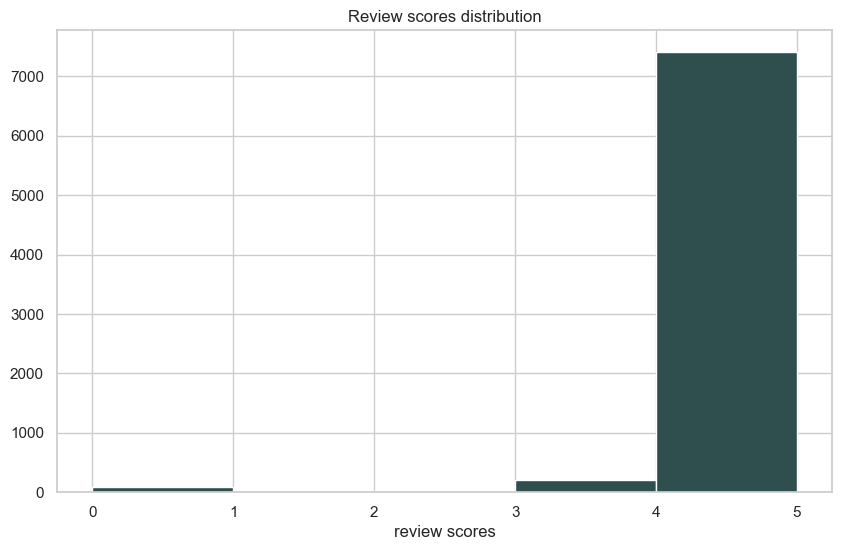

In [63]:
figure = plt.figure(figsize=(10, 6))

axes = figure.add_subplot(1, 1, 1)
axes.hist(latest_listings.review_scores_rating,bins=5, color="darkslategray")
axes.set_title("Review scores distribution")
axes.set_xlabel("review scores")

plt.show()
plt.close()

We have a few zeros but mostly 4's and 5's. Not all that interesting. 

### review_scores_accuracy

There is no entry for this in the data dictionary but I think it is basically the review score that measures how accurate the description of the listing was to the actual property that the guest was staying in. This is actually fairly important because it alerts someone if you are being shown fake images of a listing that is actually not the same as the one you are staying in.

In [64]:
latest_listings.review_scores_accuracy.describe()

count    7656.000000
mean        4.792516
std         0.397878
min         0.000000
25%         4.760000
50%         4.910000
75%         5.000000
max         5.000000
Name: review_scores_accuracy, dtype: float64

First thing I notice is the number of reviews is different for this one as well with only 21649 compared to 28000+ listings. It's also lower than our previous variable scores_rating. It's basically the same distribution of scores, mostly high 4s and 5s. 

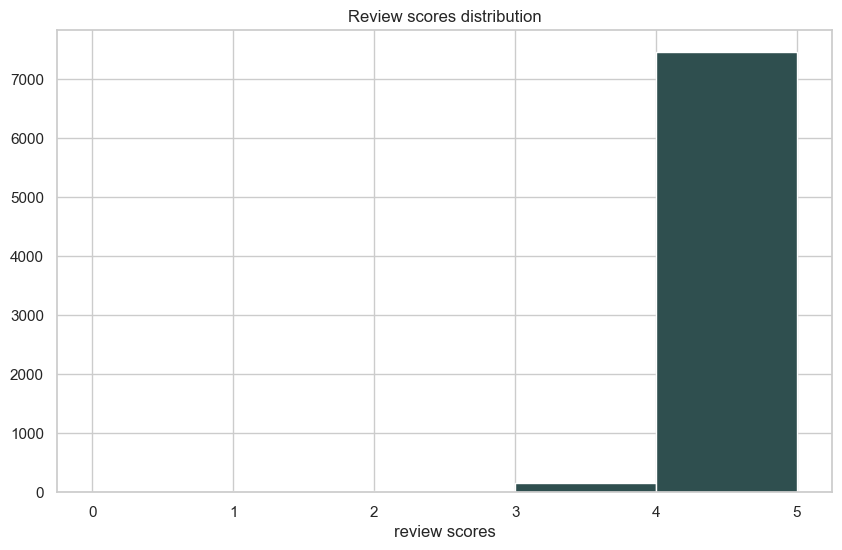

In [65]:
figure = plt.figure(figsize=(10, 6))

axes = figure.add_subplot(1, 1, 1)
axes.hist(latest_listings.review_scores_accuracy,bins=5, color="darkslategray")
axes.set_title("Review scores distribution")
axes.set_xlabel("review scores")

plt.show()
plt.close()

### review_scores_cleanliness

There is no entry for this in the data dictionary but I think it is basically the review score that measures how clean the property was when the guest stayed there.

In [66]:
latest_listings.review_scores_cleanliness.describe()

count    7657.000000
mean        4.734177
std         0.420437
min         0.000000
25%         4.670000
50%         4.870000
75%         5.000000
max         5.000000
Name: review_scores_cleanliness, dtype: float64

Again there is a different number of total reviews than the other review variables and total. It's basically the same distribution of scores, mostly high 4s and 5s.

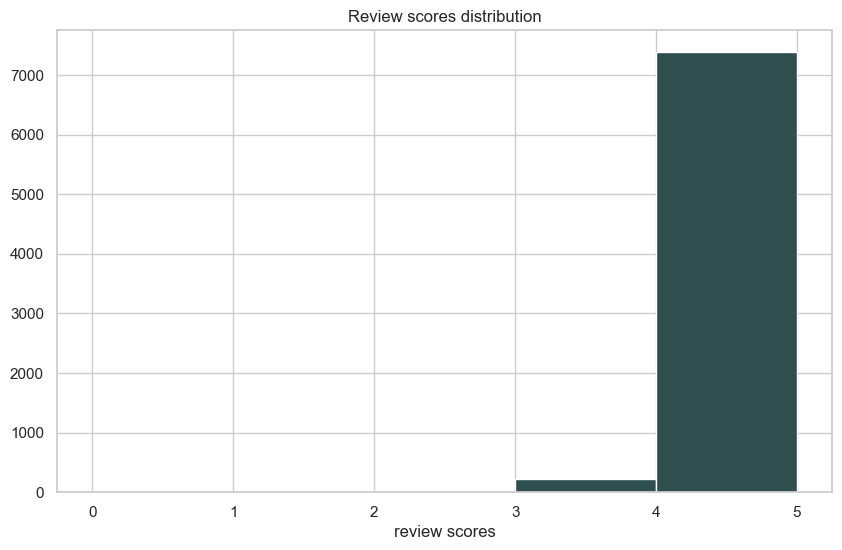

In [67]:
figure = plt.figure(figsize=(10, 6))

axes = figure.add_subplot(1, 1, 1)
axes.hist(latest_listings.review_scores_cleanliness,bins=5, color="darkslategray")
axes.set_title("Review scores distribution")
axes.set_xlabel("review scores")

plt.show()
plt.close()

### review_scores_checkin

There is no entry for this in the data dictionary but I think it is basically the review score that measures how easy and simple the check in process was for the property.

In [68]:
latest_listings.review_scores_checkin.describe()

count    7654.000000
mean        4.849888
std         0.359567
min         0.000000
25%         4.860000
50%         4.960000
75%         5.000000
max         5.000000
Name: review_scores_checkin, dtype: float64

Again there is a different number of total reviews than the other review variables and total. It's basically the same distribution of scores, mostly high 4s and 5s.

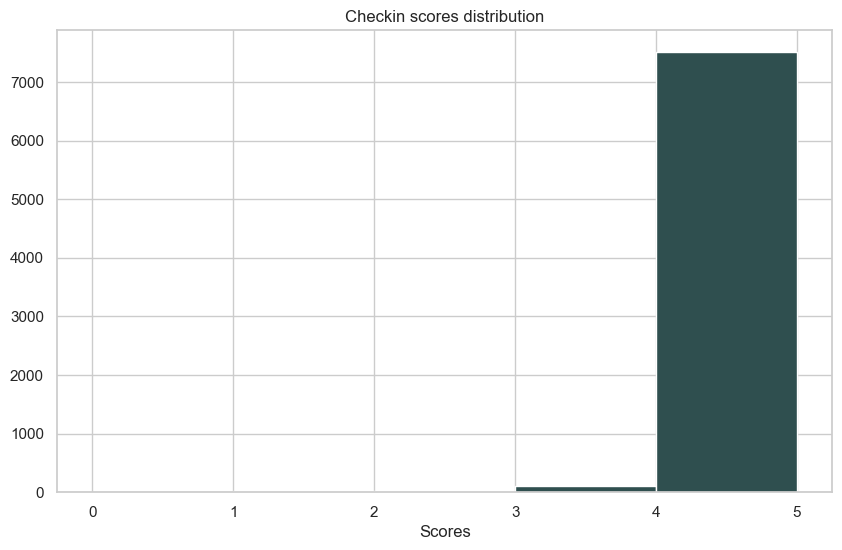

In [69]:
figure = plt.figure(figsize=(10, 6))

axes = figure.add_subplot(1, 1, 1)
axes.hist(latest_listings.review_scores_checkin,bins=5, color="darkslategray")
axes.set_title("Checkin scores distribution")
axes.set_xlabel("Scores")

plt.show()
plt.close()

### review_scores_communication

There is no entry for this in the data dictionary but I think it is basically the review score that measures how communicative the host was during the whole stay, from responding to questions pre-checkin and any thing else during the stay at the property.

In [70]:
latest_listings.review_scores_communication.describe()

count    7657.000000
mean        4.838004
std         0.378617
min         0.000000
25%         4.840000
50%         4.960000
75%         5.000000
max         5.000000
Name: review_scores_communication, dtype: float64

Again there is a different number of total reviews, but this one matches with the number who left a review for cleaning. It's basically the same distribution of scores, mostly high 4s and 5s.

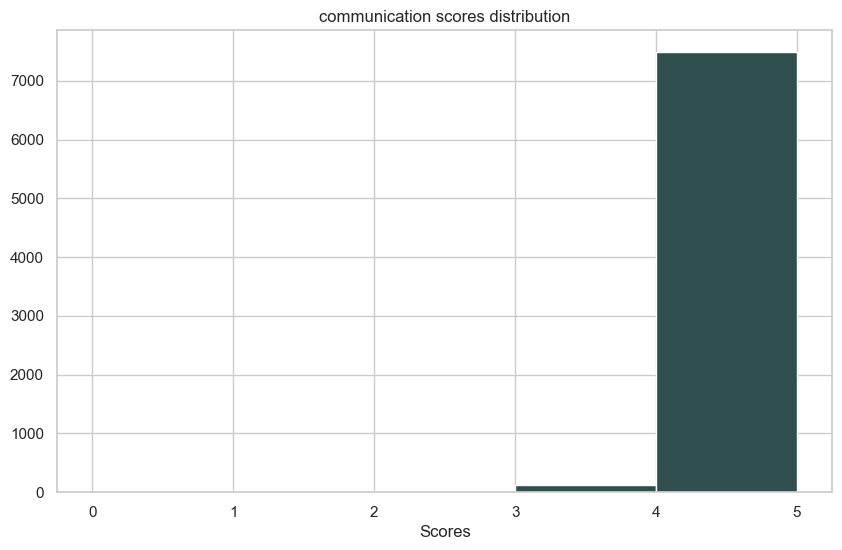

In [71]:
figure = plt.figure(figsize=(10, 6))

axes = figure.add_subplot(1, 1, 1)
axes.hist(latest_listings.review_scores_communication,bins=5, color="darkslategray")
axes.set_title("communication scores distribution")
axes.set_xlabel("Scores")

plt.show()
plt.close()

### review_scores_location

There is no entry for this in the data dictionary but I think it is basically the review score that measures the location and neighborhood the listing is in. This could be useful for our crime data comparison. 

In [72]:
latest_listings.review_scores_location.describe()

count    7655.000000
mean        4.780760
std         0.372359
min         0.000000
25%         4.715000
50%         4.900000
75%         5.000000
max         5.000000
Name: review_scores_location, dtype: float64

There is a different number of total reviews than the other review variables and total. It's basically the same distribution of scores, mostly high 4s and 5s.

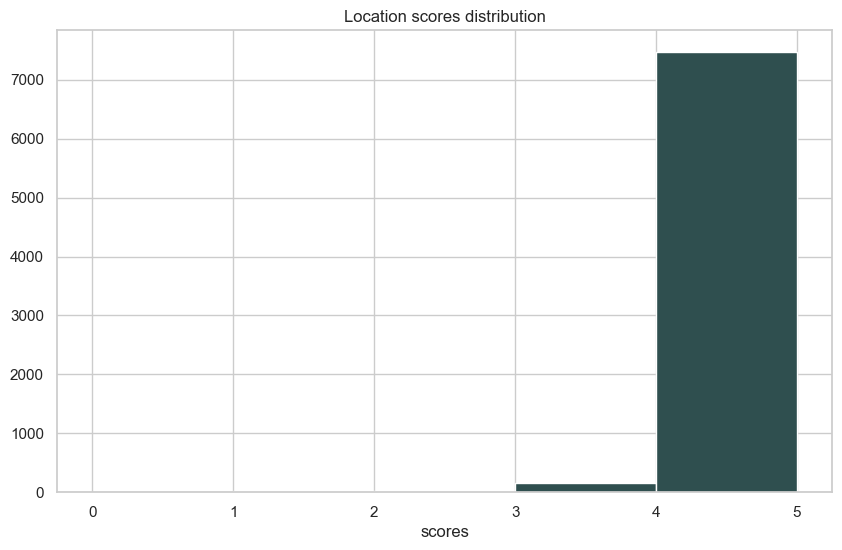

In [73]:
figure = plt.figure(figsize=(10, 6))

axes = figure.add_subplot(1, 1, 1)
axes.hist(latest_listings.review_scores_location,bins=5, color="darkslategray")
axes.set_title("Location scores distribution")
axes.set_xlabel("scores")

plt.show()
plt.close()

### review_scores_value

There is no entry for this in the data dictionary but I think it is basically the review score that measures the "bang for you buck" metric. Such as how affordable the space was, did the price per night match up well with the amenities and other things offered by the host.

In [74]:
latest_listings.review_scores_value.describe()

count    7652.000000
mean        4.697402
std         0.427266
min         0.000000
25%         4.640000
50%         4.800000
75%         4.920000
max         5.000000
Name: review_scores_value, dtype: float64

There is a different number of total reviews than the other review variables and total. It's basically the same distribution of scores, mostly high 4s and 5s.

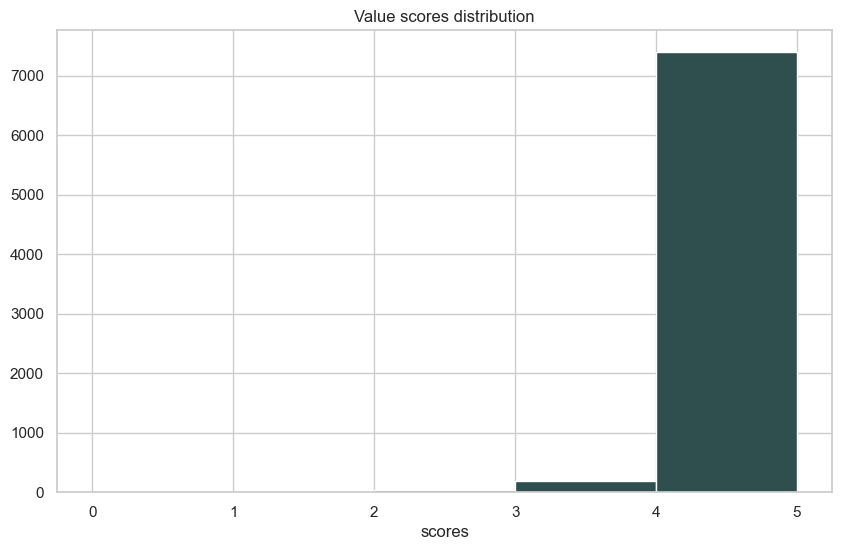

In [75]:
figure = plt.figure(figsize=(10, 6))

axes = figure.add_subplot(1, 1, 1)
axes.hist(latest_listings.review_scores_value,bins=5, color="darkslategray")
axes.set_title("Value scores distribution")
axes.set_xlabel("scores")

plt.show()
plt.close()

### number_of_reviews

The number of reviews the listing has.

In [76]:
latest_listings.number_of_reviews.describe()

count    10560.000000
mean        39.426136
std         74.913022
min          0.000000
25%          0.000000
50%          8.000000
75%         42.000000
max        875.000000
Name: number_of_reviews, dtype: float64

The mean is 44 reviews per listing with an std of 77, this is very skewed. It likely means there are a lot of properties that have been on airbnb for a long time, additionally, not many people leave reviews, I think the data estimates less than 30% leave a review after their stay. That would account for 1/4th having only 1 review and the median being 10 reviews. 

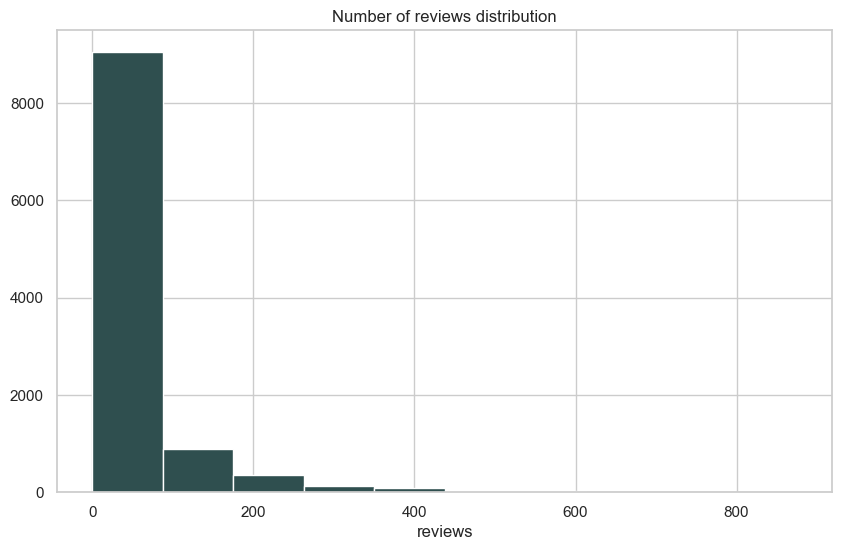

In [77]:
figure = plt.figure(figsize=(10, 6))

axes = figure.add_subplot(1, 1, 1)
axes.hist(latest_listings.number_of_reviews,bins=10, color="darkslategray")
axes.set_title("Number of reviews distribution")
axes.set_xlabel("reviews")

plt.show()
plt.close()

Let's look at just a range between 0-20 total reviews. 

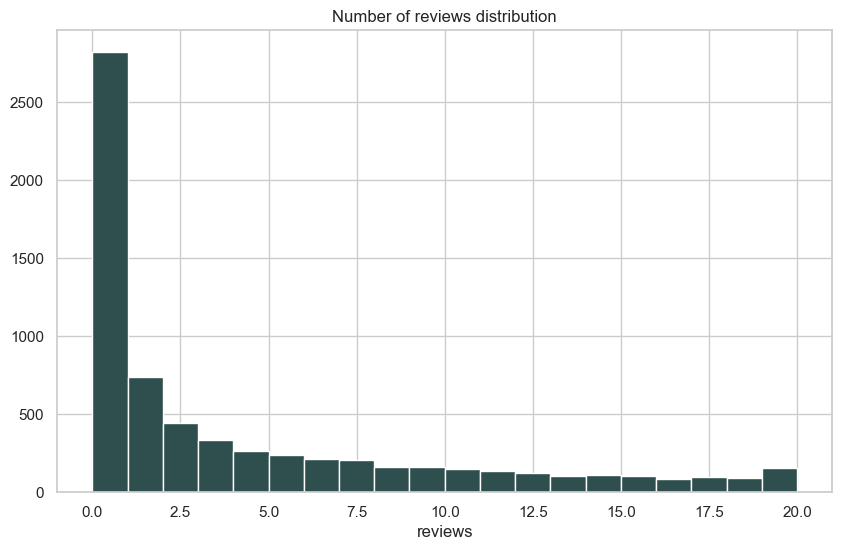

In [78]:
figure = plt.figure(figsize=(10, 6))

axes = figure.add_subplot(1, 1, 1)
axes.hist(latest_listings.number_of_reviews,range=[0,20],bins=20, color="darkslategray")
axes.set_title("Number of reviews distribution")
axes.set_xlabel("reviews")

plt.show()
plt.close()

This is interesting, it looks like a large number of properties have less than 2 total reviews. That's going to skew our data considerably. Let's see how many are zero reviews. 

In [79]:
print(latest_listings[latest_listings["number_of_reviews"] == 0 ]["number_of_reviews"])

37       0
49       0
68       0
94       0
129      0
        ..
10552    0
10555    0
10557    0
10558    0
10559    0
Name: number_of_reviews, Length: 2820, dtype: int32


It seems that 22% of our listings have 0 reviews! That's very high.

### number_of_reviews_ltm

The number of reviews the listing has (in the last 12 months). I'm hoping this matches our four quarters as measured. 

In [80]:
latest_listings.number_of_reviews_ltm.describe()

count    10560.000000
mean        10.165814
std         19.074238
min          0.000000
25%          0.000000
50%          1.000000
75%         12.000000
max        341.000000
Name: number_of_reviews_ltm, dtype: float64

In the last 12 months, there were a mean number of 11 reviews for our listings. The median is 2 and the 3rd quartile is 15. There is a min of 0 reviews and a max of 341 reviews, that's almost one review per day for that listing!

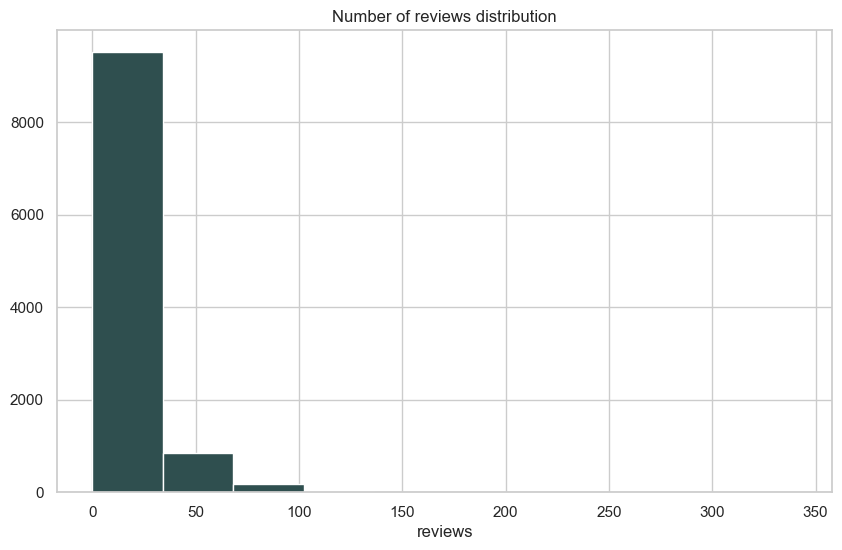

In [81]:
figure = plt.figure(figsize=(10, 6))

axes = figure.add_subplot(1, 1, 1)
axes.hist(latest_listings.number_of_reviews_ltm,bins=10, color="darkslategray")
axes.set_title("Number of reviews distribution")
axes.set_xlabel("reviews")

plt.show()
plt.close()

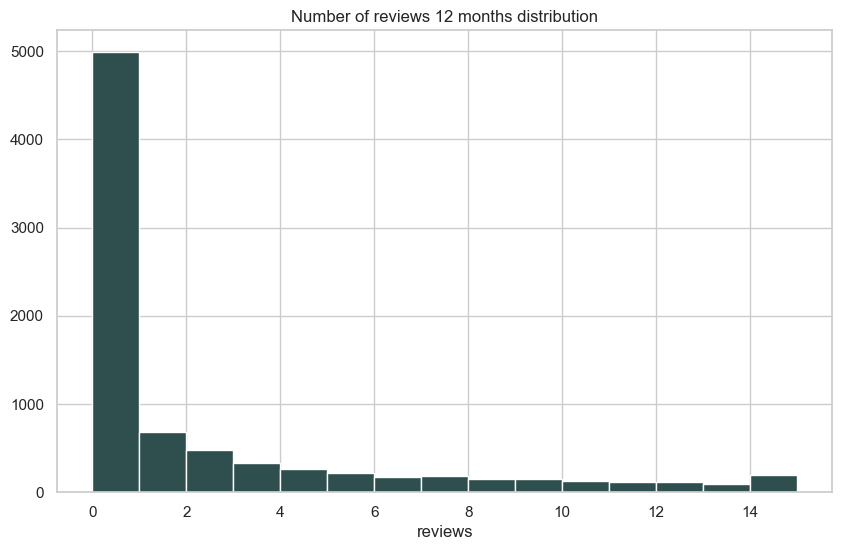

In [82]:
figure = plt.figure(figsize=(10, 6))

axes = figure.add_subplot(1, 1, 1)
axes.hist(latest_listings.number_of_reviews_ltm,range=[0,15],bins=15, color="darkslategray")
axes.set_title("Number of reviews 12 months distribution")
axes.set_xlabel("reviews")

plt.show()
plt.close()

### number_of_reviews_l30d

This variable is the number of reviews the listing has (in the last 30 days).

In [83]:
latest_listings.number_of_reviews_l30d.describe()

count    10560.000000
mean         0.768845
std          2.097824
min          0.000000
25%          0.000000
50%          0.000000
75%          1.000000
max        119.000000
Name: number_of_reviews_l30d, dtype: float64

In the last 30 months, there were a mean number of less than 1 reviews for our listings. The median is 0 and the 3rd quartile is 1. There is a min of 0 reviews and a max of 119 reviews.

### reviews_per_month

The number of reviews the listing has over the lifetime of the listing.

In [84]:
latest_listings.reviews_per_month.describe()

count    7740.000000
mean        1.602641
std         2.193940
min         0.010000
25%         0.240000
50%         0.940000
75%         2.340000
max       105.000000
Name: reviews_per_month, dtype: float64

In our listings there were a mean number of less than 1 reviews for the lifetime of listings. The median is 0 and the 3rd quartile is 2. There is a min of 0 reviews and a max of 105 reviews.

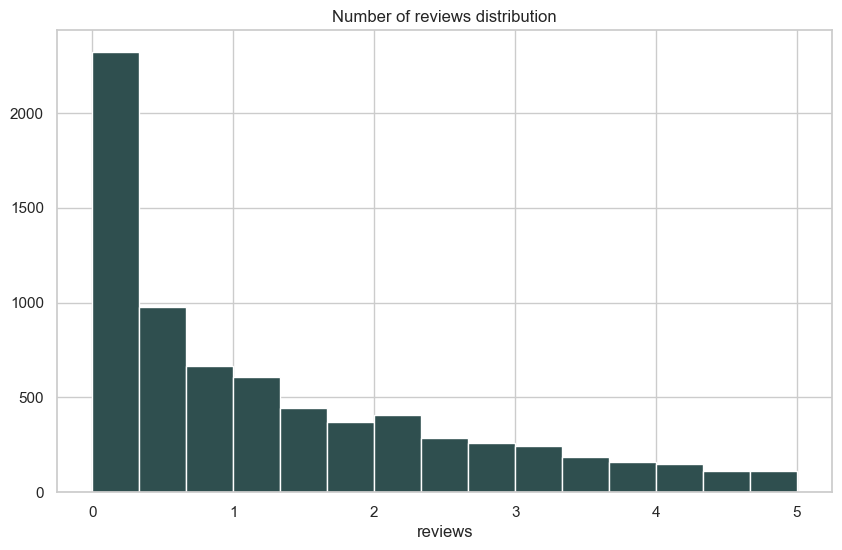

In [85]:
figure = plt.figure(figsize=(10, 6))

axes = figure.add_subplot(1, 1, 1)
axes.hist(latest_listings.reviews_per_month,range=[0,5],bins=15, color="darkslategray")
axes.set_title("Number of reviews distribution")
axes.set_xlabel("reviews")

plt.show()
plt.close()

## <a id='calendar'>Calendar Data</a>


We want to investigate calendar and price of airbnbs. EDA on calendar and price. 

The variables from the calendar table are:

    * listing_id
    * date
    * available
    * price
    * adjusted_price
    * minimum_nights
    * maximum_nights

In [86]:
calendar_listings = con.execute('SELECT * from calendar').df()
calendar_listings.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10245531 entries, 0 to 10245530
Data columns (total 7 columns):
 #   Column          Dtype         
---  ------          -----         
 0   listing_id      int64         
 1   date            datetime64[ns]
 2   available       object        
 3   price           float64       
 4   adjusted_price  float64       
 5   minimum_nights  float64       
 6   maximum_nights  float64       
dtypes: datetime64[ns](1), float64(4), int64(1), object(1)
memory usage: 547.2+ MB


The calendar table has 10 million rows. This is likely because we have an entry for each date a property is available on airbnb.

In [87]:
calendar_listings.head()

,listing_id,date,available,price,adjusted_price,minimum_nights,maximum_nights
0,3943,2021-12-15,t,70.0,70.0,2.0,1125.0
1,3943,2021-12-16,t,70.0,70.0,2.0,1125.0
2,3943,2021-12-17,f,70.0,70.0,2.0,1125.0
3,3943,2021-12-18,f,70.0,70.0,2.0,1125.0
4,3943,2021-12-19,t,70.0,70.0,2.0,1125.0


We have listing_id which is unique and for each data the the listing is available there is an entry for it in the database and a price. We want to see if there is any relationship between price. 

### <a id='date'>Date</a>

The date is when the listing was available for booking. Each day it was available is a new row. I don't think we are going to see much other than a lot of listings being available 365 days a year. This date does not tell us if the airbnb was actually booked, it just lists that the host made it available.

In [88]:
calendar_listings.date.describe()

count                10245531
unique                    639
top       2022-10-30 00:00:00
freq                    28070
first     2021-12-15 00:00:00
last      2023-09-14 00:00:00
Name: date, dtype: object

There are 639 unique dates, which is kind of strange since there are only 365 days in a year. Otherwise we have the first date as 2021-12-15 and the last date as 2023-09-14. I guess we have some recent data in there so maybe it is more than four quarters.

In [89]:
calendar_listings.date.value_counts()

2022-10-30    28070
2022-10-18    28070
2022-10-09    28070
2022-10-10    28070
2022-10-11    28070
              ...  
2023-09-07     6471
2023-09-06     6471
2023-09-05     6471
2023-09-03     6471
2023-09-14     4147
Name: date, Length: 639, dtype: int64

Most of our data is in 2022 and some listings in 2023. Not all that helpful information because we know that most of our listings were going to be available on most dates.

### <a id='available'>available</a>

This is if the listing was available on a certain date.

In [90]:
calendar_listings.available.value_counts()

f        2891664
false    2876089
t        2350089
true     2127689
Name: available, dtype: int64

I think this is interesting, it looks like there are t, f, true, false. I think some cleaning is needed to change all the 't' to true and all the 'f' to false. 

In [91]:
calendar_listings.available.replace("t",'true', inplace=True)

In [92]:
calendar_listings.available.replace("f",'false', inplace=True)

Let's run the counts again.

In [93]:
calendar_listings.available.value_counts()

false    5767753
true     4477778
Name: available, dtype: int64

It looks like half of our listings were available and the other half were not available on a certain date. Let's just drop all the listings that were unavailable because we don't to know pricing data for when a listing could be rented not on dates it could not be rented. 

In [94]:
calendar_listings_clean = calendar_listings[calendar_listings.available != 'false'] 

In [95]:
calendar_listings_clean.available.value_counts()

true    4477778
Name: available, dtype: int64

Now we only have the listings where our airbnb was available. We'll use this clean listings going forward.

### <a id='adjusted_price'>adjusted_price</a>

This is the adjusted price for a listing, I'm not exactly sure if this is different from price, from the data they appear to be identical. Let's use the same visualization method we did for price. 

In [96]:
calendar_listings.adjusted_price.describe().round()

count    10245520.0
mean          200.0
std           478.0
min             0.0
25%            85.0
50%           126.0
75%           200.0
max         60141.0
Name: adjusted_price, dtype: float64

It's actually identical to price. I think this might be redundant variable. I'm going to graph it to see if the shape of the data. 

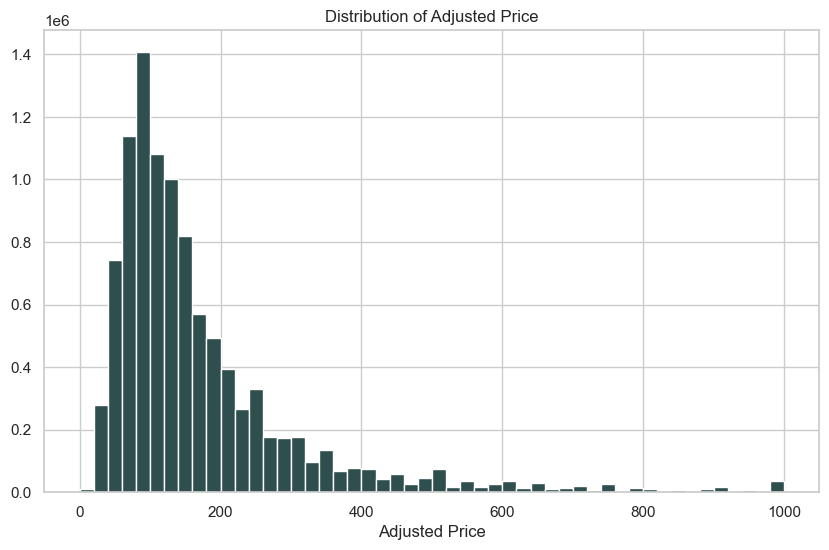

In [97]:
figure = plt.figure(figsize=(10, 6))

axes = figure.add_subplot(1, 1, 1)
axes.hist(calendar_listings.adjusted_price.round(),range=[0,1000], bins=50, color="darkslategray")
axes.set_title("Distribution of Adjusted Price")
axes.set_xlabel("Adjusted Price")

plt.show()
plt.close()

Looks the same as our price graph.

### <a id='minimum_nights'>minimum nights</a>

This is the number of minimum nights a listing has to be booked to confirm a booking with this host.

In [98]:
calendar_listings_clean.minimum_nights.describe().round()

count    4477176.0
mean          50.0
std          146.0
min            1.0
25%            2.0
50%            4.0
75%           31.0
max         1125.0
Name: minimum_nights, dtype: float64

This is interesting, the min number of nights is 1, the median is 4 nights, and the 3rd-quartile is 31, which means this is a short term rental or a month-month lease situation. The max number of minimum night is 1125! That's 3 years of rental! That does not conform to the airbnb service. The mean and std are not believable at 50 and 146, this is likely very skewed.

Let's plot a histogram of the data using a range because we know that most of our minimum nights is between 1-31, which 1125 as an outlier.  

To get the range we should use, I'm going to check how many listings have a min_night above 50. 

In [99]:
print(calendar_listings_clean[calendar_listings_clean["minimum_nights"] > 50 ]["minimum_nights"])

830          60.0
831          60.0
832          60.0
833          60.0
834          60.0
            ...  
10240231    120.0
10240232    120.0
10240233    120.0
10240234    120.0
10240235    120.0
Name: minimum_nights, Length: 582792, dtype: float64


That is 13% of our listings are above 50 days minimum, we need to pick a higher range. 

In [100]:
print(calendar_listings_clean[calendar_listings_clean["minimum_nights"] > 365 ]["minimum_nights"])

263265     600.0
263266     600.0
263267     600.0
263268     600.0
263269     600.0
           ...  
9929801    600.0
9929802    600.0
9929803    600.0
9929804    600.0
9929805    600.0
Name: minimum_nights, Length: 184058, dtype: float64


It looks like about 4% of our listings have a minimum nights requirement above 365 days. That's outside the range of our four querters so I'm going to use that as the cut-off. 

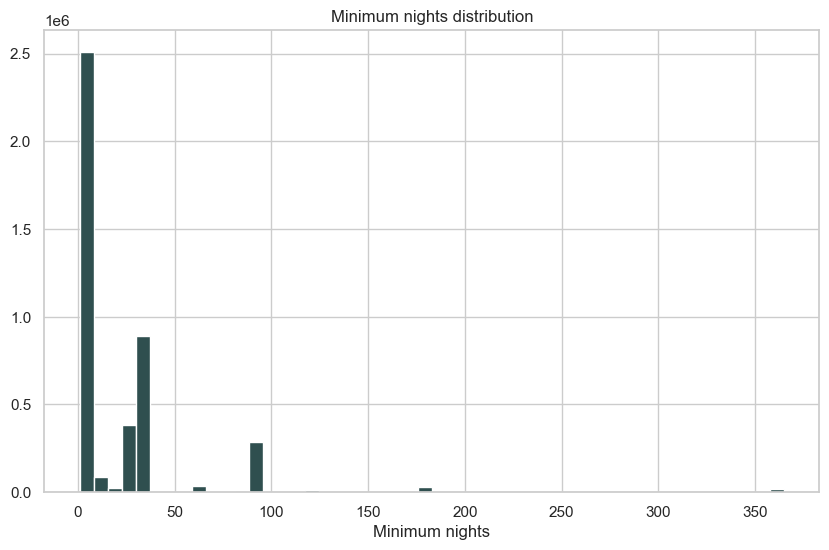

In [101]:
figure = plt.figure(figsize=(10, 6))

axes = figure.add_subplot(1, 1, 1)
axes.hist(calendar_listings_clean.minimum_nights,range=[1,365], bins=50, color="darkslategray")
axes.set_title("Minimum nights distribution")
axes.set_xlabel("Minimum nights")

plt.show()
plt.close()

Let's look at a smaller range so we can get a better sense of the data.

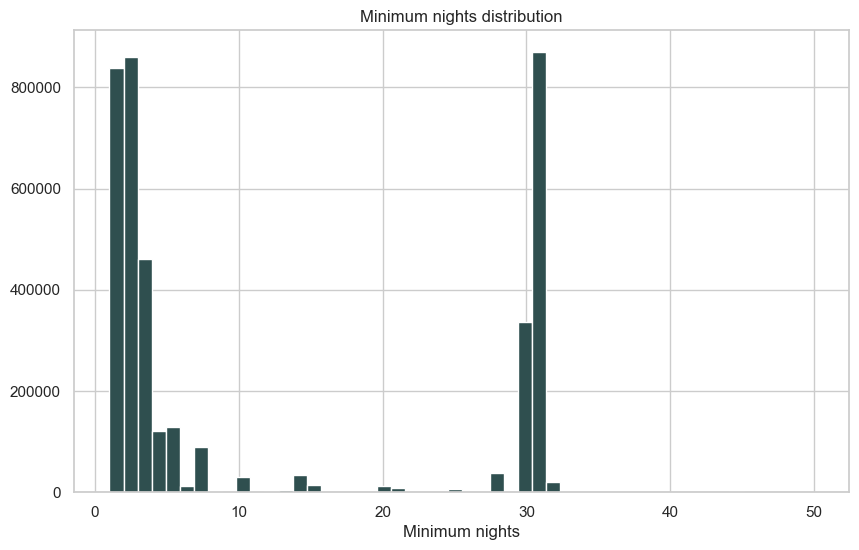

In [102]:
figure = plt.figure(figsize=(10, 6))

axes = figure.add_subplot(1, 1, 1)
axes.hist(calendar_listings_clean.minimum_nights,range=[1,50], bins=50, color="darkslategray")
axes.set_title("Minimum nights distribution")
axes.set_xlabel("Minimum nights")

plt.show()
plt.close()

We can see from the above graph that most of our listings have a minimum night of 1-3 and there is also a very large group that is equal to the 1-2 night minimum that requires 31 nights, that is basically a month-to-month lease.

### <a id='maximum_nights'>Maximum Nights</a>

The maximum nights variable is the max number of nights an airbnb can be rented to a single user in any consecutive number of days as set by the host. It's the opposite of the minimum, in that it is a limit not a requirement. 

In [103]:
calendar_listings_clean.maximum_nights.describe().round()

count    4.477176e+06
mean     1.535707e+07
std      1.809363e+08
min      1.000000e+00
25%      3.650000e+02
50%      1.125000e+03
75%      1.125000e+03
max      2.147484e+09
Name: maximum_nights, dtype: float64

In [104]:
calendar_listings_clean.maximum_nights.value_counts()

1125.0    2779234
365.0      809319
30.0        90254
90.0        74193
180.0       57057
           ...   
358.0          51
359.0          51
361.0          51
363.0          51
489.0           6
Name: maximum_nights, Length: 399, dtype: int64

This is very interesting in the way the majority of listings is set to maximum nights of 1125 nights, and another large portion is 365 nights, then 30 nights and so on. Let's visualize the data.

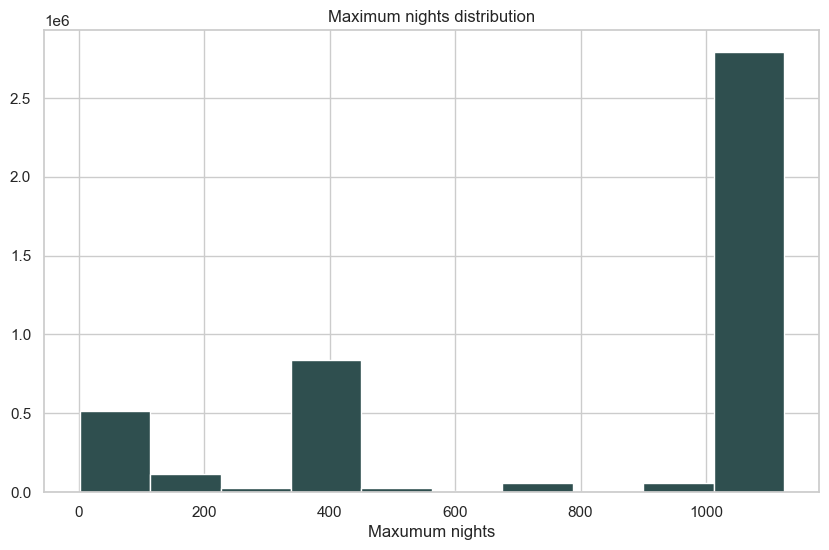

In [105]:
figure = plt.figure(figsize=(10, 6))

axes = figure.add_subplot(1, 1, 1)
axes.hist(calendar_listings_clean.maximum_nights,range=[1,1125], bins=10, color="darkslategray")
axes.set_title("Maximum nights distribution")
axes.set_xlabel("Maxumum nights")

plt.show()
plt.close()

The majority of hosts choose to use a maximum nights of 1125, which is a little over 3 years. Strange, but I guess if it is a maximum then most people who are booking don't actually select that many nights. It could just be a default setting that the majority of hosts don't change. I'm not familiar with how hosts on airbnb can set these settings. The other theory is that a lot of these rentals are full-time airbnbs not actual homes. I don't think most people want a stranger to stay in their house for 3 years straight. I could be wrong about that. 

## <a id='crime_data'>Crime Data</a>


The crime data includes location data, crime type, and datetime information. Each row is a single crime.

In [106]:
con.execute('select * from crimes;')
crime_data = con.fetch_df()
print(crime_data)

       column00 NEIGHBORHOOD_CLUSTER offensegroup  LONGITUDE  \
0             0           cluster 25      violent -77.002778   
1             1           cluster 26      violent -76.997326   
2             2           cluster 35      violent -76.964260   
3             3           cluster 39      violent -76.999896   
4             4            cluster 2     property -77.025347   
...         ...                  ...          ...        ...   
27606     27606            cluster 1     property -77.042324   
27607     27607            cluster 1     property -77.042369   
27608     27608           cluster 26     property -76.994963   
27609     27609           cluster 11     property -77.081165   
27610     27610           cluster 25     property -77.001314   

                     END_DATE                offense-text     SHIFT  \
0        9/7/2021, 2:18:00 PM                    homicide  midnight   
1       10/3/2021, 3:20:00 PM                     robbery   evening   
2       10/3/2021,

### <a id='neighborhood_cluster'>Neighborhood cluster</a>
Neighborhood cluster represents which neighbhor hood the crime happened. There are 45 clusters in this column and they can be matched to a specific neighbhor hood. The most frequent one is cluster 25. This value tied close to the neighbor hood name column. This is a categorical variable.

In [107]:
crime_data.NEIGHBORHOOD_CLUSTER.describe()

count          27609
unique            45
top       cluster 25
freq            2070
Name: NEIGHBORHOOD_CLUSTER, dtype: object

In [108]:
crime_data.NEIGHBORHOOD_CLUSTER.value_counts()

cluster 25    2070
cluster 8     2055
cluster 2     1788
cluster 3     1598
cluster 23    1335
cluster 6     1276
cluster 18    1270
cluster 7     1125
cluster 21    1115
cluster 26    1095
cluster 22     996
cluster 39     990
cluster 34     752
cluster 17     747
cluster 1      729
cluster 33     693
cluster 31     667
cluster 27     592
cluster 4      566
cluster 32     561
cluster 9      501
cluster 19     488
cluster 24     452
cluster 38     367
cluster 11     365
cluster 30     359
cluster 15     329
cluster 20     319
cluster 35     315
cluster 5      301
cluster 14     292
cluster 37     266
cluster 28     225
cluster 12     219
cluster 36     207
cluster 10     188
cluster 16     148
cluster 13      91
cluster 45      48
cluster 29      44
cluster 43      32
cluster 40      15
cluster 44       7
cluster 46       7
cluster 41       4
Name: NEIGHBORHOOD_CLUSTER, dtype: int64

### <a id='offense_group'>offense group</a>
There are two types of offense crime in this variable, Property and violent, so it's a categorical variable. We can see from the summary that majority of the offense is property.

In [109]:
crime_data.offensegroup.value_counts()

property    23567
violent      4044
Name: offensegroup, dtype: int64

### <a id='longitude'>Longtitude</a>
This is a pretty straightforward variable. It represents the longtitude of the crime. Longtitude is a continuous numerical data and let's a take a look at the summary of it.

In [110]:
crime_data.LONGITUDE.describe()

count    27611.000000
mean       -77.007869
std          0.034340
min        -77.112316
25%        -77.030787
50%        -77.010666
75%        -76.986919
max        -76.910021
Name: LONGITUDE, dtype: float64

The min here is -77.1123 and max is -76.9100. Since our crime data is based on DC area, so this make perfect sense. Now let's take a look at the distribution of it.

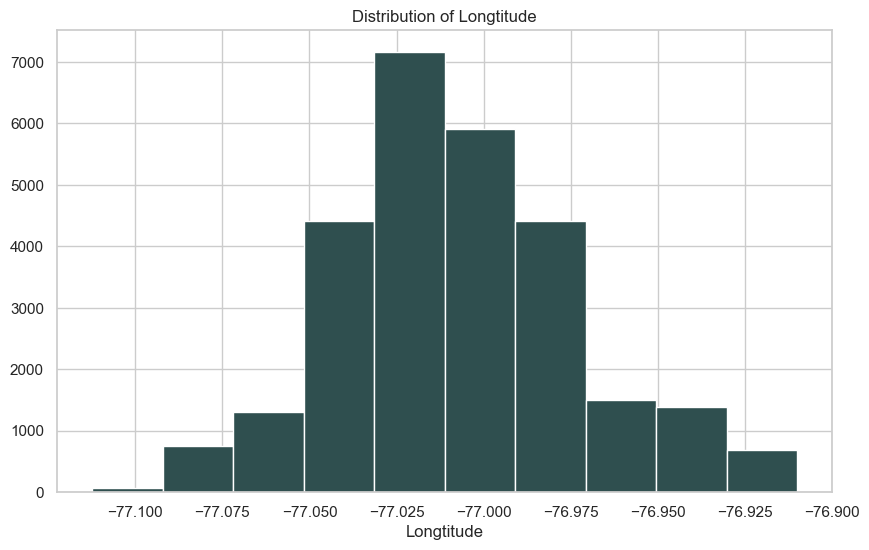

In [111]:
figure = plt.figure(figsize=(10, 6))

axes = figure.add_subplot(1, 1, 1)
axes.hist(crime_data.LONGITUDE, color="darkslategray")
axes.set_title("Distribution of Longtitude")
axes.set_xlabel("Longtitude")

plt.show()
plt.close()

Here the distribution looks very nearly normal. 50% of the crimes has the longtitude between -77.050 to -76.975.

### <a id='end_date'>end date</a>
This variable represents the time and date when the crime end. It's a date type.

In [112]:
crime_data.END_DATE.describe()

count                     25411
unique                    22106
top       5/25/2022, 7:00:00 AM
freq                          7
Name: END_DATE, dtype: object

### <a id='offense_text'>offense-text</a>
This is another variable to describle the type of crime. It's a categorical variable. Let's take a look at the summary of it.

In [113]:
crime_data['offense-text'].describe()

count           27611
unique              9
top       theft/other
freq            10783
Name: offense-text, dtype: object

In [114]:
crime_data['offense-text'].value_counts()

theft/other                   10783
theft f/auto                   8077
motor vehicle theft            3535
robbery                        2167
assault w/dangerous weapon     1499
burglary                       1168
homicide                        221
sex abuse                       157
arson                             4
Name: offense-text, dtype: int64

We can see there are 9 different types of offsense. Most of them are theft/other and theft/auto which aligned well with our offense group variable.

### <a id='shift'>Shift</a> ###
Shift means the time range for the crime happened. It's a oridinal variable and there are three values in it, day, midnight, evening. Let's take a look at the summary of it.

In [115]:
crime_data.SHIFT.value_counts()

evening     11109
day         10863
midnight     5639
Name: SHIFT, dtype: int64

We can see that majority of the crimes happened during evening and daytime.

### <a id='offensekey'>offense key </a>
Offense key is another variable describe the type of crimes. It's a aggregation of offensegroup and offense-text. It's also a categorical variable.

In [116]:
crime_data.offensekey.describe()

count                    27611
unique                       9
top       property|theft/other
freq                     10783
Name: offensekey, dtype: object

In [117]:
crime_data.offensekey.value_counts()

property|theft/other                  10783
property|theft f/auto                  8077
property|motor vehicle theft           3535
violent|robbery                        2167
violent|assault w/dangerous weapon     1499
property|burglary                      1168
violent|homicide                        221
violent|sex abuse                       157
property|arson                            4
Name: offensekey, dtype: int64

We can see that there are 9 unique types and the top 3 are property related crimes which are theft/other, theft/auto and motor vehicle theft.

### <a id='start_date'>start date </a>
Similar to end date, this variable represents the time and date when the crime start. It's a date type.

In [118]:
crime_data.START_DATE.describe()

count                   27602
unique                    459
top       2021-10-06 00:00:00
freq                      123
first     2010-05-28 00:00:00
last      2022-09-29 00:00:00
Name: START_DATE, dtype: object

### <a id='offense'>offense</a>
This variable describle the actual type of the crime which is similar to the offense-text. It's also a categorical variable.

In [119]:
crime_data.OFFENSE.describe()

count           27611
unique              9
top       theft/other
freq            10783
Name: OFFENSE, dtype: object

In [120]:
crime_data.OFFENSE.value_counts()

theft/other                   10783
theft f/auto                   8077
motor vehicle theft            3535
robbery                        2167
assault w/dangerous weapon     1499
burglary                       1168
homicide                        221
sex abuse                       157
arson                             4
Name: OFFENSE, dtype: int64

Similar to the results above for offense-text, there are 9 types of crimes.

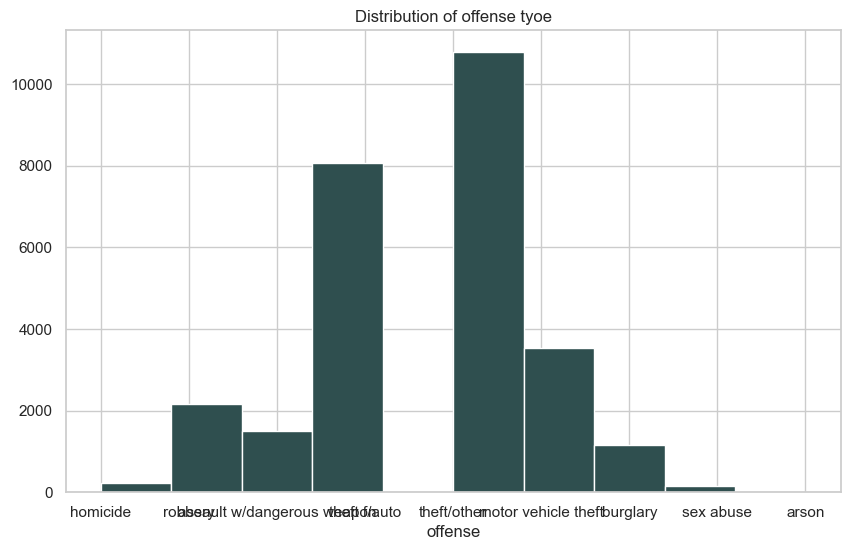

In [121]:
figure = plt.figure(figsize=(10, 6))

axes = figure.add_subplot(1, 1, 1)
axes.hist(crime_data.OFFENSE, color="darkslategray")
axes.set_title("Distribution of offense tyoe")
axes.set_xlabel("offense")

plt.show()
plt.close()

### <a id='method'>Method</a>
Method is the variable to describle how the crime was commited. It's a categorical variable. Let's take a look at the summary of it.

In [122]:
crime_data.METHOD.describe()

count      27611
unique         3
top       others
freq       24756
Name: METHOD, dtype: object

In [123]:
crime_data.METHOD.value_counts()

others    24756
gun        2333
knife       522
Name: METHOD, dtype: int64

We can see there are 3 methods in it, others, gun and knife. Most of them are others. 

### <a id='latitude'>Latitude</a>
Similar to Longtitude, This is a pretty straightforward variable. It represents the Latitude of the crime. Latitude is a continuous numerical data and let's a take a look at the summary of it.

In [124]:
crime_data.LATITUDE.describe()

count    27611.000000
mean        38.907542
std          0.029605
min         38.814659
25%         38.894325
50%         38.907235
75%         38.923862
max         38.994901
Name: LATITUDE, dtype: float64

The min here is 38.8147 and max is 38.9949. Since our crime data is based on DC area, so this make perfect sense. Now let's take a look at the distribution of it.

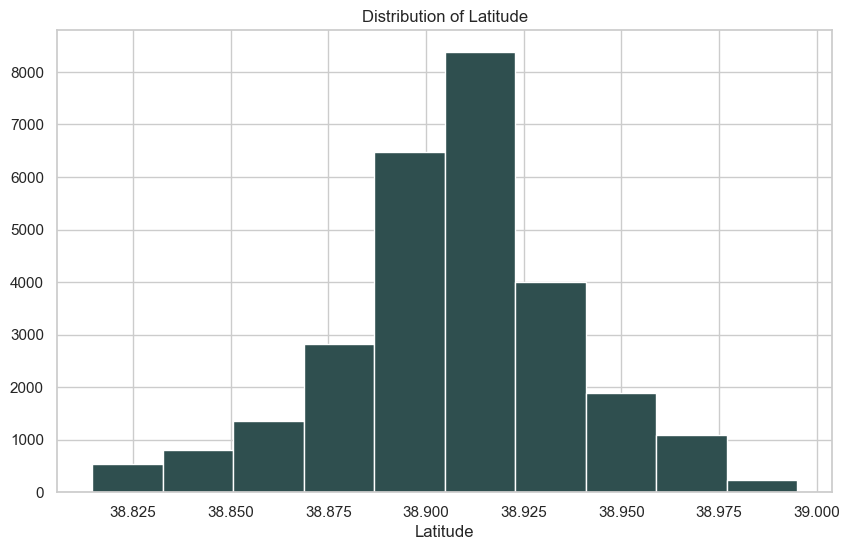

In [125]:
figure = plt.figure(figsize=(10, 6))

axes = figure.add_subplot(1, 1, 1)
axes.hist(crime_data.LATITUDE, color="darkslategray")
axes.set_title("Distribution of Latitude")
axes.set_xlabel("Latitude")

plt.show()
plt.close()

Here the distribution looks very nearly normal. 50% of the longtitude has the latitude between 38.875 to 38.925.

### <a id='neighborhood_name'>Neighborhood name </a>
This is a new variable we added to the dataset. This is the actual name for the neighborhood cluster. Let's take a look at the summary.

In [126]:
crime_data.NEIGHBORHOOD_NAME.describe()

count                                         27611
unique                                           46
top       Union Station, Stanton Park, Kingman Park
freq                                           2070
Name: NEIGHBORHOOD_NAME, dtype: object

In [127]:
crime_data.NEIGHBORHOOD_NAME.value_counts()

Union Station, Stanton Park, Kingman Park                                                            2070
Downtown, Chinatown, Penn Quarters, Mount Vernon Square, North Capitol Street                        2055
Columbia Heights, Mt. Pleasant, Pleasant Plains, Park View                                           1788
Howard University, Le Droit Park, Cardozo/Shaw                                                       1598
Ivy City, Arboretum, Trinidad, Carver Langston                                                       1335
Dupont Circle, Connecticut Avenue/K Street                                                           1276
Brightwood Park, Crestwood, Petworth                                                                 1270
Shaw, Logan Circle                                                                                   1125
Edgewood, Bloomingdale, Truxton Circle, Eckington                                                    1115
Capitol Hill, Lincoln Park                    

# Pairwise EDA - 
# <a id="pairwise_eda_price">Target Variable: price </a>


## Neighborhood v. Price

Let's look at the pairwise analysis of `neighborhood` and `price`. I expect AirBnB price to track general rent cost of the D.C. areas. Neighborhoods with higher rent will have a higher nightly AirBnB price on average and the reverse would be true for areas with low rent. From general domain knowledge about Washington D.C., I know that the downtown area and the Northwest quadrant have higher rents on average than the Northeast and Southeast quadrant. Therefore I expect AirBnB nightly prices to be higher on average in the downtown area and the Northwest quadrant. 

One thing we will need to be mindful of in doing this analysis is the comparison of *counts* of AirBnB listings in each neighborhood cluster. Some clusters might have a high density of AirBnBs and others will have much fewer. Let's get the counts in tabular form as well as plotting them on the D.C. map. First, we must remove duplicate listings.

In [128]:
# Code from Lab 5 Solution
def describe_by_category(data, numeric, categorical, transpose=False):
    grouped = data.groupby(categorical)
    grouped_y = grouped[numeric].describe()
    if transpose:
        print(grouped_y.transpose())
    else:
        print(grouped_y)

In [129]:
# Code from Module 5
def classify_correlation(r):
    r = abs(r)
    if r < 0.16:
        return "very weak"
    if r < 0.29:
        return "weak"
    if r < 0.49:
        return "low"
    if r < 0.69:
        return "moderate"
    if r < 0.89:
        return "strong"
    return "very strong"

In [130]:
# Code from Module 5
def correlation(data, x, y):
    print("Correlation coefficients:")
    r = stats.pearsonr(data[x], data[y])[0]
    print( "r   =", r, f"({classify_correlation(r)})")
    rho = stats.spearmanr(data[x], data[y])[0]
    print( "rho =", rho, f"({classify_correlation(rho)})")

In [131]:
# Code from Module 5
def lowess_scatter(data, x, y, jitter=0.0, skip_lowess=False):

    if skip_lowess:
        fit = np.polyfit(data[x], data[y], 1)
        line_x = np.linspace(data[x].min(), data[x].max(), 10)
        line = np.poly1d(fit)
        line_y = list(map(line, line_x))
    else:
        lowess = sm.nonparametric.lowess(data[y], data[x], frac=.3)
        line_x = list(zip(*lowess))[0]
        line_y = list(zip(*lowess))[1]

    figure = plt.figure(figsize=(10, 6))

    axes = figure.add_subplot(1, 1, 1)

    xs = data[x]
    if jitter > 0.0:
        xs = data[x] + stats.norm.rvs( 0, 0.5, data[x].size)

    axes.scatter(xs, data[y], marker="o", color="DimGray", alpha=0.5)
    axes.plot(line_x, line_y, color="DarkRed")

    title = "Plot of {0} v. {1}".format(x, y)
    if not skip_lowess:
        title += " with LOWESS"
    axes.set_title(title)
    axes.set_xlabel(x)
    axes.set_ylabel(y)

    plt.show()
    plt.close()

In [132]:
# Code from Module 5
def restyle_boxplot(patch):
    ## change color and linewidth of the whiskers
    for whisker in patch['whiskers']:
        whisker.set(color='#000000', linewidth=1)

    ## change color and linewidth of the caps
    for cap in patch['caps']:
        cap.set(color='#000000', linewidth=1)

    ## change color and linewidth of the medians
    for median in patch['medians']:
        median.set(color='#000000', linewidth=2)

    ## change the style of fliers and their fill
    for flier in patch['fliers']:
        flier.set(marker='o', color='#000000', alpha=0.2)

    for box in patch["boxes"]:
        box.set( facecolor='#FFFFFF', alpha=0.5)

In [133]:
# Code from Module 5
def multiboxplot(data, numeric, categorical, skip_data_points=True):
    figure = plt.figure(figsize=(30, 6))

    axes = figure.add_subplot(1, 1, 1)

    grouped = data.groupby(categorical)
    labels = pd.unique(data[categorical].values)
    labels.sort()
    grouped_data = [grouped[numeric].get_group( k) for k in labels]
    patch = axes.boxplot( grouped_data, labels=labels, patch_artist=True, zorder=1)
    restyle_boxplot( patch)

    if not skip_data_points:
        for i, k in enumerate(labels):
            subdata = grouped[numeric].get_group( k)
            x = np.random.normal(i + 1, 0.01, size=len(subdata))
            axes.plot(x, subdata, 'o', alpha=0.4, color="DimGray", zorder=2)

    axes.set_xlabel(categorical)
    axes.set_xticklabels(labels, rotation=90, ha='right')
    axes.set_ylabel(numeric)
    axes.set_title("Distribution of {0} by {1}".format(numeric, categorical))

    plt.show()
    plt.close()

## `neighborhood` vs. `price` <a id="neighborhood_vs_price"></a>

We want to look at the interaction between neighborhood and price. Just like non-rental, non-hospitality real estate, AirBnB nightly price will vary by neighborhood. Nicer neighborhoods will generally have more expensive AirBnBs whereas poorer neighborhoods will generally have cheaper AirBnBs. 

Other factors that contribute to the correlation between neighborhood and price is the amenity makeup of a neighborhood. Neighborhoods with more access to amenities and attractions will have more expensive AirBnBs. For this reason, I suspect that neighborhoods near the central business district (downtown) will have more expensive AirBnBs.

For the remainder of this analysis we will use only the latest listings from the most recent quarter.

In [134]:
latest_listings = con.execute("select * from latest_listings;").df()
latest_listings.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10560 entries, 0 to 10559
Data columns (total 74 columns):
 #   Column                                        Non-Null Count  Dtype         
---  ------                                        --------------  -----         
 0   id                                            10560 non-null  int64         
 1   listing_url                                   10560 non-null  object        
 2   scrape_id                                     10560 non-null  int64         
 3   last_scraped                                  10560 non-null  datetime64[ns]
 4   name                                          10559 non-null  object        
 5   description                                   10416 non-null  object        
 6   neighborhood_overview                         6559 non-null   object        
 7   picture_url                                   10560 non-null  object        
 8   host_id                                       10560 non-null  int3

In [135]:
latest_listings_gdf = gpd.GeoDataFrame(
    latest_listings, geometry=gpd.points_from_xy(latest_listings.longitude, latest_listings.latitude))

Let's look at where the AirBnBs are on the neighborhood map.

In [136]:
type(latest_listings_gdf.geometry)

geopandas.geoseries.GeoSeries

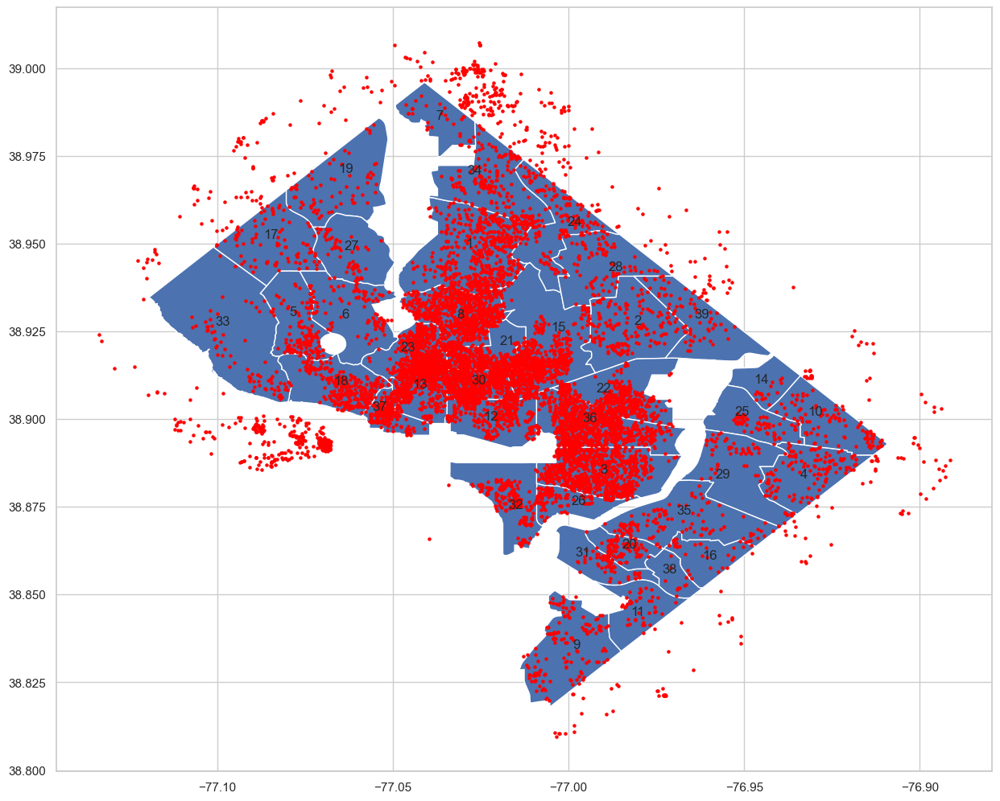

In [137]:
fig,ax = plt.subplots(figsize = (15,15))
base = neighborhoods_gpd.plot(ax=ax)
for idx, row in neighborhoods_gpd.iterrows():
    plt.annotate(row['alpha_index'], xy=row['rep_point'],
                 horizontalalignment='center')
    
latest_listings_gdf.geometry.plot(ax=base, marker='o', color='red', markersize=5);
    
plt.show()

It turns out there *are* listings that exist outside of the DC borders. There are listings in the Arlington are of Virginia and various parts of Maryland. The listing densities of each neighbrhood cluster vary immensely. The clusters close to the downtown/National Mall area have the highest density of AirBnBs. The density becomes smaller the further out you go from downtown. Let's look at the densities in tabular form:

In [138]:
describe_by_category(latest_listings, "price", "neighbourhood_cleansed", transpose=True)

neighbourhood_cleansed  Brightwood Park, Crestwood, Petworth  \
count                                             518.000000   
mean                                              142.733591   
std                                               161.809158   
min                                                20.000000   
25%                                                69.000000   
50%                                                95.000000   
75%                                               150.000000   
max                                              1500.000000   

neighbourhood_cleansed  Brookland, Brentwood, Langdon  \
count                                      152.000000   
mean                                       130.921053   
std                                        107.605087   
min                                         29.000000   
25%                                         70.000000   
50%                                         99.000000   
75%                     

This data is pretty hard to consume but we can see a stark difference in the `count` of AirBnBs per neighborhood cluster. Let's plot the average price for each neighborhood using box plots to get a better feel for the comparative price

In [139]:
latest_listings_below_1500 =  latest_listings[latest_listings.price < 1500]

In [140]:
latest_listings_below_500 =  latest_listings[latest_listings.price < 500]

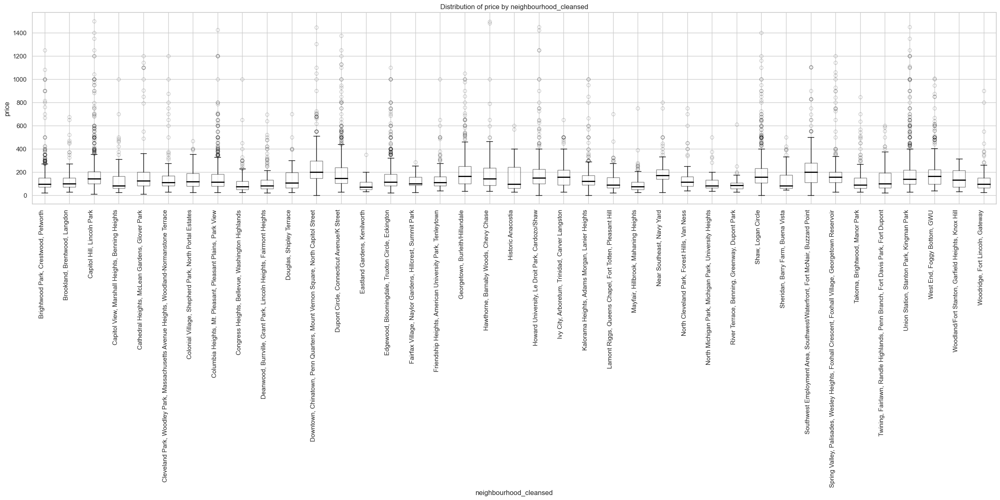

In [141]:
multiboxplot(latest_listings_below_1500, "price", "neighbourhood_cleansed")

From this plot, we can see that no neighborhood has a median nightly cost greater than ~200 USD. Some notably expensive neighborhoods include the Downtown Chinatown Penn Quarters are, Shaw Logan Circle, Georgetown, the Southwest Emplyment Area, Union Station, and West End. From my own experience living in D.C., all of these areas are near downtown, have good amenities, and are nicer neighborhoods than most.

I am now going to plot a heatmap of the average price of AirBnBs be neighborhood for (1) listings below 500 USD, (2) listings below 1500 USD, and (3) all listings.

### Price by neighborhood (only listings below 500 USD)

In [142]:
grouped = latest_listings_below_500.groupby("neighbourhood_cleansed")
labels = pd.unique(latest_listings_below_500["neighbourhood_cleansed"].values)
labels.sort()
grouped_data = [grouped["price"].get_group( k) for k in labels]
grouped_y = grouped['price'].describe()
avg_price_per_neighborhood = list(grouped_y.iloc[:, 1])
neighborhoods_gpd['avg_price'] = avg_price_per_neighborhood

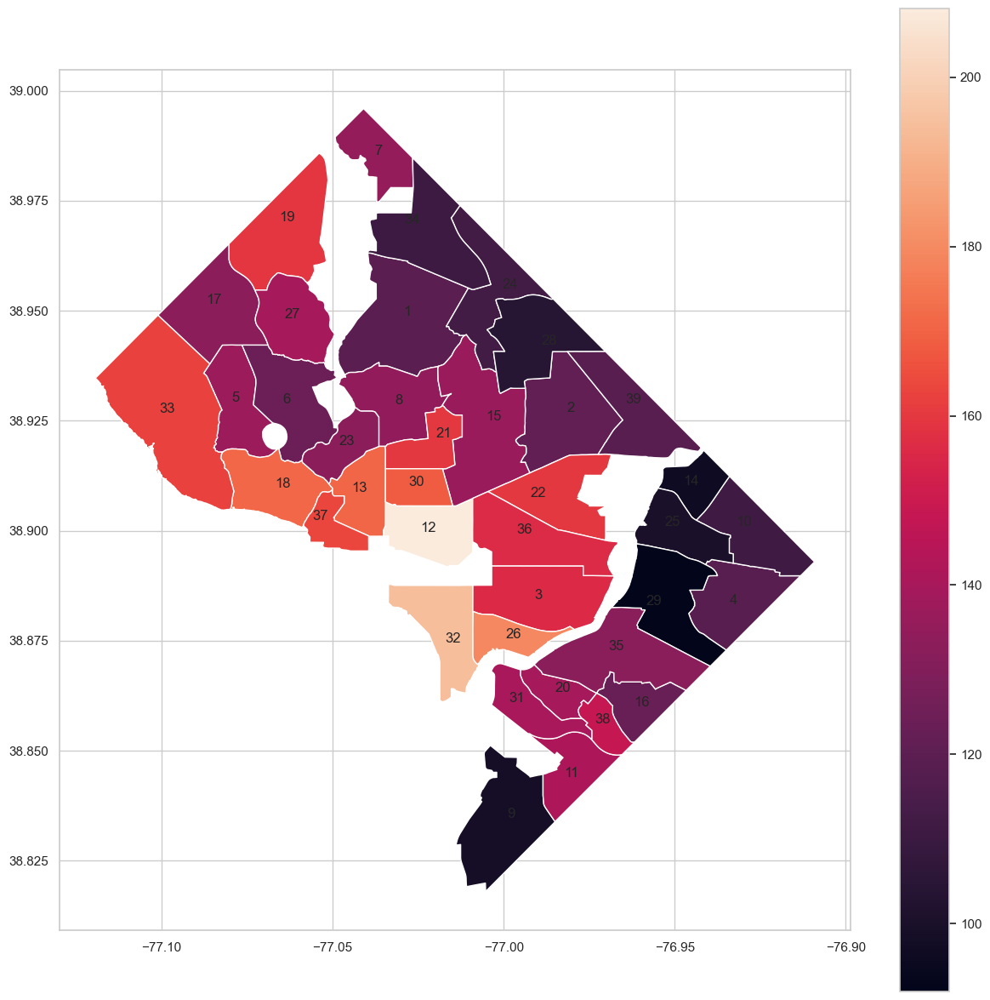

In [143]:
fig,ax = plt.subplots(figsize = (15,15))
base = neighborhoods_gpd.plot(ax=ax, column="avg_price",legend=True)
for idx, row in neighborhoods_gpd.iterrows():
    plt.annotate(row['alpha_index'], xy=row['rep_point'],
                 horizontalalignment='center')

### Price by neighborhood (only listings below 1500 USD)

In [144]:
grouped = latest_listings_below_1500.groupby("neighbourhood_cleansed")
labels = pd.unique(latest_listings_below_1500["neighbourhood_cleansed"].values)
labels.sort()
grouped_data = [grouped["price"].get_group( k) for k in labels]
grouped_y = grouped['price'].describe()
avg_price_per_neighborhood = list(grouped_y.iloc[:, 1])
neighborhoods_gpd['avg_price'] = avg_price_per_neighborhood

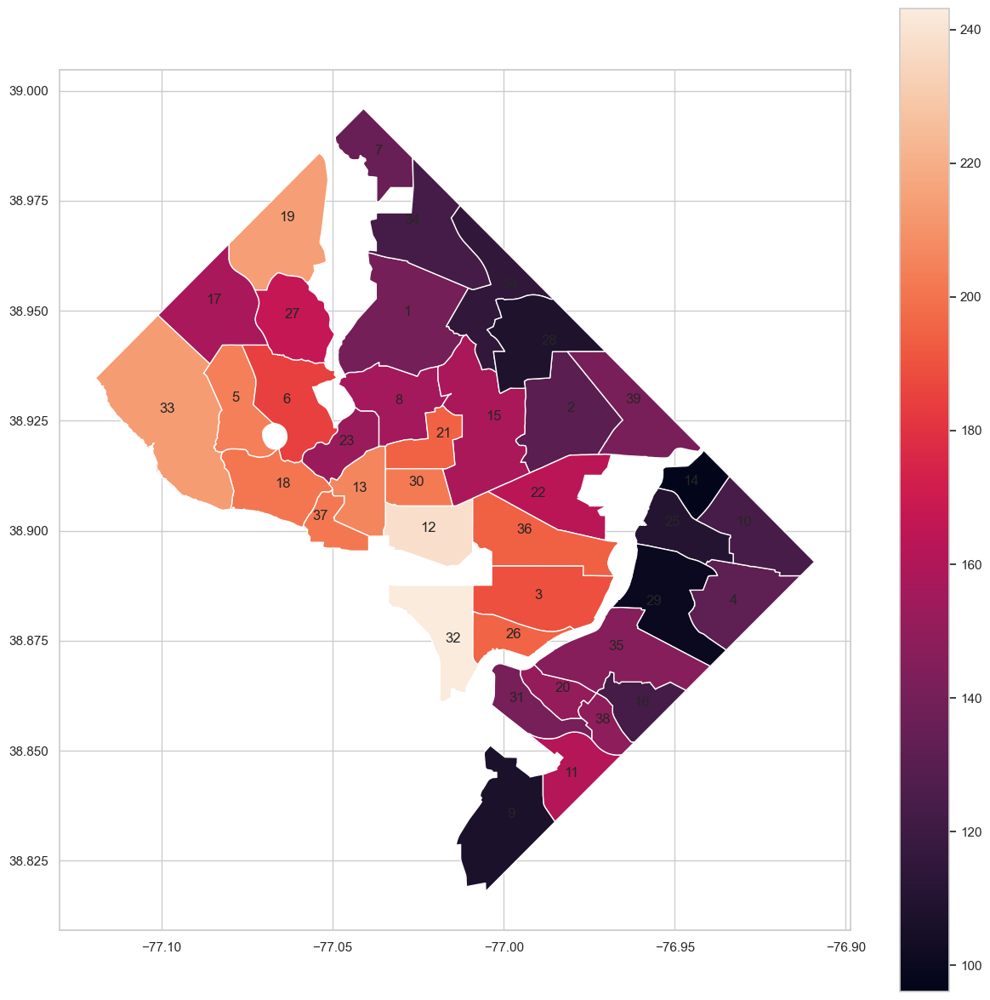

In [145]:
fig,ax = plt.subplots(figsize = (15,15))
base = neighborhoods_gpd.plot(ax=ax, column="avg_price",legend=True)
for idx, row in neighborhoods_gpd.iterrows():
    plt.annotate(row['alpha_index'], xy=row['rep_point'],
                 horizontalalignment='center')

### Price by neighborhood (all listings)

In [146]:
grouped = latest_listings.groupby("neighbourhood_cleansed")
labels = pd.unique(latest_listings["neighbourhood_cleansed"].values)
labels.sort()
grouped_data = [grouped["price"].get_group( k) for k in labels]
grouped_y = grouped['price'].describe()
avg_price_per_neighborhood = list(grouped_y.iloc[:, 1])
neighborhoods_gpd['avg_price'] = avg_price_per_neighborhood

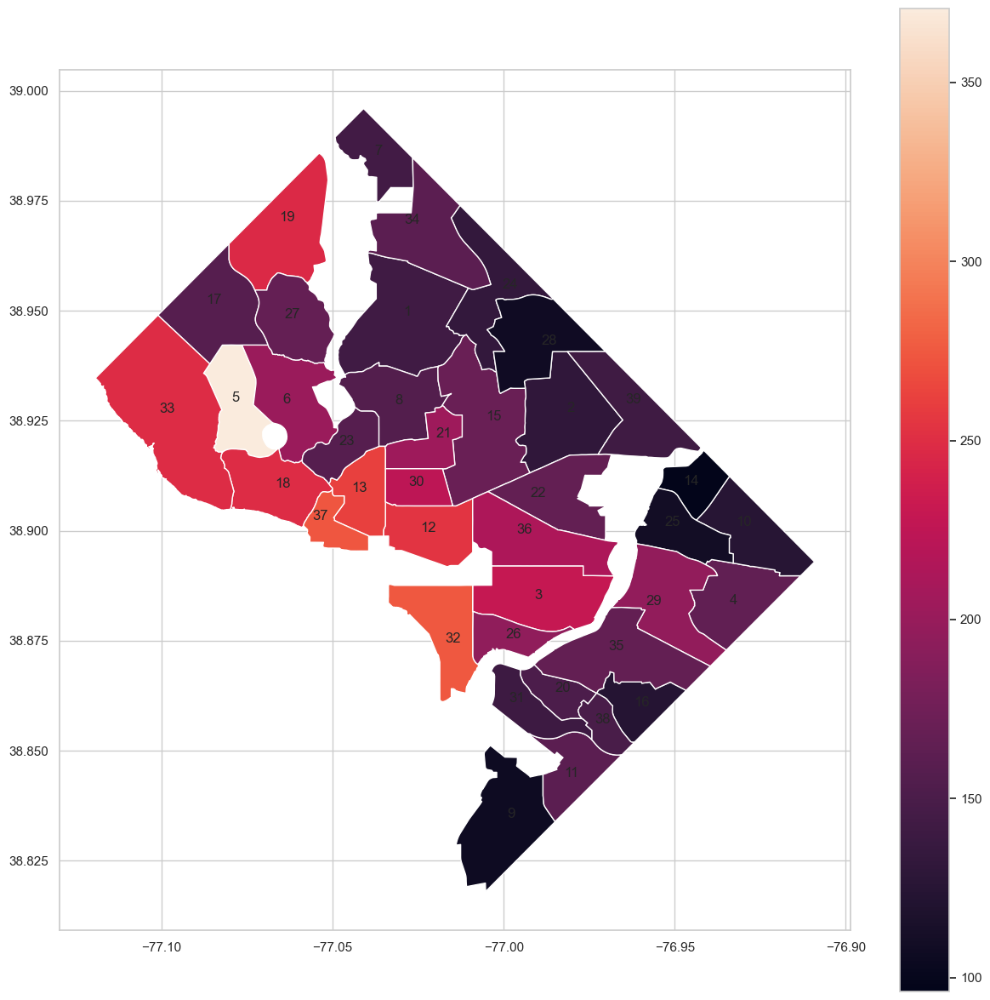

In [147]:
fig,ax = plt.subplots(figsize = (15,15))
base = neighborhoods_gpd.plot(ax=ax, column="avg_price",legend=True)
for idx, row in neighborhoods_gpd.iterrows():
    plt.annotate(row['alpha_index'], xy=row['rep_point'],
                 horizontalalignment='center')

Clearly, the outliers in the `all_listings` table skew the coloring of the map. However, all maps align with what was predicted in that areas near downtown and/or the NW quadrant of the city (especially near the Potomac) are most expensive. Areas in the NE and SE quadrant, especially areas further away radially from Downtown are less expensive.

In [148]:
latest_listings["years_host"] = (res - latest_listings.host_since) / np.timedelta64(1,'Y')

In [149]:
latest_listings['price'].isnull().values.any()

False

### Neighborhood Conclusion

We can definitely see that price varies by neighborhood. Northwest DC and the downtown area are more expensive while northeast DC and areas further away from Downtown are cheaper. We expect that neighborhood would be useful in a regression however with there being so many categories, we also expect that we could extract the same relevant information as it relates to price by using other location-based variables like `latitude` and `longitude`. 

## <a id='host_info_v_price'>Host Information v. Price</a>

### `host_since` vs `price` <a id="host_since_vs_price"></a>

We are now going to look at the relationship between how long someone has been a host and the price of their listings. I don't expect there to be any kind of strong correlation between the two.

In [150]:
latest_listings_non_null_host_since = latest_listings[latest_listings["years_host"].notnull()]

In [151]:
correlation(latest_listings_non_null_host_since, "price", "years_host")

Correlation coefficients:
r   = -0.0032471026963352477 (very weak)
rho = -0.08698568268122552 (very weak)


As I expected, there is almost zero correlation. Let's look at the scatterplot

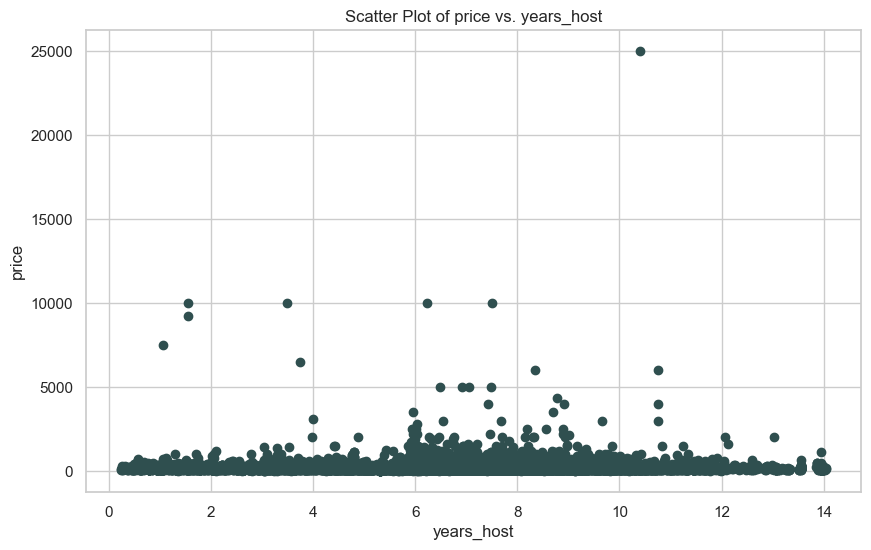

In [152]:
figure = plt.figure(figsize=(10, 6))

axes = figure.add_subplot(1, 1, 1)
axes.scatter( latest_listings_non_null_host_since.years_host, latest_listings_non_null_host_since.price, marker="o", color="darkslategray")

axes.set_ylabel("price")
axes.set_xlabel("years_host")
axes.set_title("Scatter Plot of price vs. years_host")

plt.show()
plt.close()

This plot shows the average price is almost a straight line across all years being a host. The outliers making it hard to see detail. Let's zoom in:

In [153]:
latest_listings_below_500["years_host"] = (res - latest_listings_below_500.host_since) / np.timedelta64(1,'Y')

In [154]:
latest_listings_non_null_host_since_below_500 = latest_listings_below_500[latest_listings_below_500["years_host"].notnull()]

In [155]:
correlation(latest_listings_non_null_host_since_below_500, "price", "years_host")

Correlation coefficients:
r   = -0.10565400632052659 (very weak)
rho = -0.11097828442186954 (very weak)


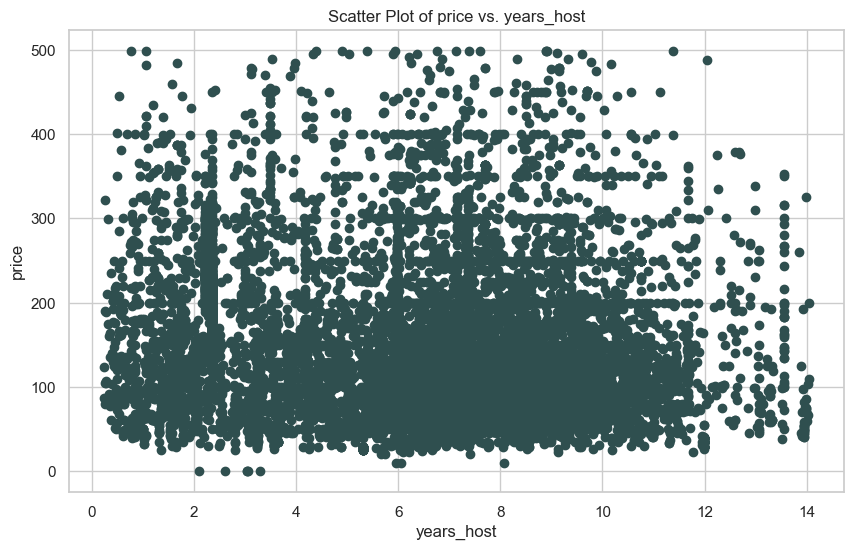

In [156]:
figure = plt.figure(figsize=(10, 6))

axes = figure.add_subplot(1, 1, 1)
axes.scatter( latest_listings_non_null_host_since_below_500.years_host, latest_listings_non_null_host_since_below_500.price, marker="o", color="darkslategray")

axes.set_ylabel("price")
axes.set_xlabel("years_host")
axes.set_title("Scatter Plot of price vs. years_host")

plt.show()
plt.close()

Even when we zoom in, there is clearly no correlation between year_host and price.

### `host_location` vs `price` <a id="host_location_vs_price"></a>

This one won't work because the data is ambiguous in category. There are several categories meaning the same thing like "DC" and "Washington DC" or "United States" and "US" all being separate categories.

### `host_response_time` vs `price` <a id="host_response_time_vs_price"></a>

I don't expect there to be a direct, causal relationship between these two variables. However, higher host response times likely correspond to a higher rating and overall stay experience which would in turn give the host leverage to raise the price of their AirBnB so I expect the relationship to be a slightly positive correlation.

In [157]:
describe_by_category(latest_listings_below_500, "price", "host_response_time", transpose=True)

host_response_time          N/A  a few days or more  within a day  \
count               2641.000000          182.000000    641.000000   
mean                 137.946611          124.197802    134.978159   
std                   94.925205           82.010068     81.423830   
min                    0.000000           25.000000     10.000000   
25%                   75.000000           65.000000     77.000000   
50%                  105.000000          100.000000    110.000000   
75%                  174.000000          150.000000    170.000000   
max                  499.000000          485.000000    499.000000   

host_response_time  within a few hours  within an hour  
count                      1047.000000     5344.000000  
mean                        117.108883      162.850299  
std                          82.213391       88.979790  
min                          22.000000        0.000000  
25%                          57.000000       95.000000  
50%                          95.0000

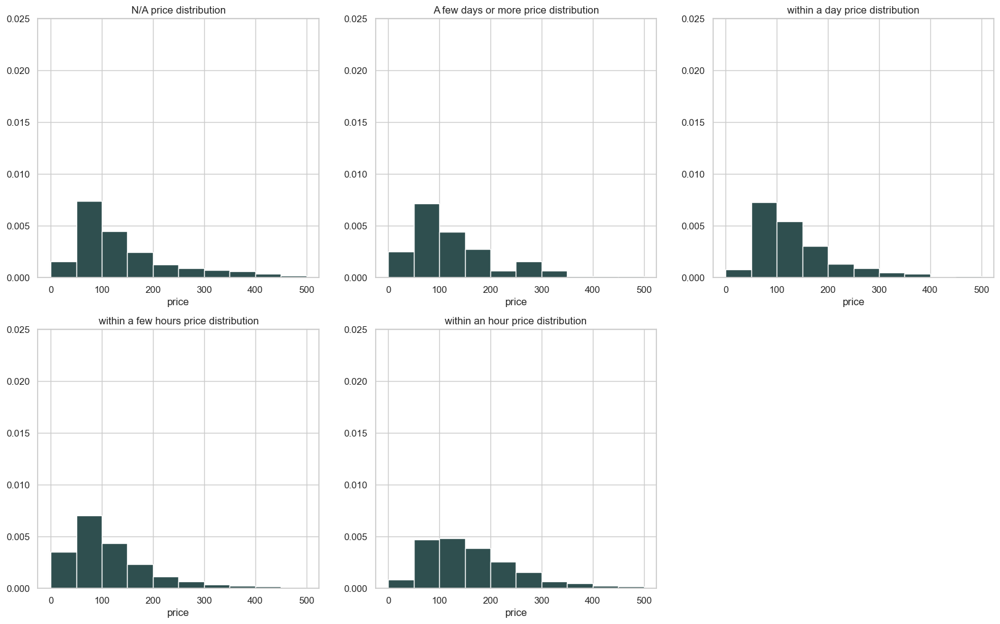

In [158]:
grouped = latest_listings_below_500.groupby("host_response_time")

figure = plt.figure(figsize=(20, 12))

axes = figure.add_subplot(2, 3, 1)
axes.hist(grouped["price"].get_group("N/A"),color="darkslategray",density=True, range=(0,500))
axes.set_ylim((0,0.025))
axes.set_title("N/A price distribution")
axes.set_xlabel("price")

axes = figure.add_subplot(2, 3, 2)
axes.hist(grouped["price"].get_group("a few days or more"),color="darkslategray",density=True, range=(0,500))
axes.set_ylim((0,0.025))
axes.set_title("A few days or more price distribution")
axes.set_xlabel("price")

axes = figure.add_subplot(2, 3, 3)
axes.hist(grouped["price"].get_group("within a day"),color="darkslategray",density=True, range=(0,500))
axes.set_ylim((0,0.025))
axes.set_title("within a day price distribution")
axes.set_xlabel("price")

axes = figure.add_subplot(2, 3, 4)
axes.hist(grouped["price"].get_group("within a few hours"),color="darkslategray",density=True, range=(0,500))
axes.set_ylim((0,0.025))
axes.set_title("within a few hours price distribution")
axes.set_xlabel("price")

axes = figure.add_subplot(2, 3, 5)
axes.hist(grouped["price"].get_group("within an hour"),color="darkslategray",density=True, range=(0,500))
axes.set_ylim((0,0.025))
axes.set_title("within an hour price distribution")
axes.set_xlabel("price")

plt.show()
plt.close()

Generally, the faster a host responds, the most expensive the AirBnB is nd the overall distribution of price is the same shape generally across all catogories.

### `host_response_rate` vs `price` <a id="host_respone_rate_vs_price"></a>

Similar to host response time, I expect host response rate has a positive correlation with rating which in turn gives the host leverage to raise the price of their listing.

In [159]:
latest_listings_below_500['host_response_rate'] = latest_listings_below_500['host_response_rate'].replace('N/A',np.NaN)
latest_listings_below_500['host_response_rate'] = latest_listings_below_500['host_response_rate'].replace('%', '', regex=True).astype(float)

In [160]:
latest_listings_below_500['host_response_rate'].isnull().values.any()

True

In [161]:
latest_listings_non_null_host_response_rate_below_500 = latest_listings_below_500[latest_listings_below_500["host_response_rate"].notnull()]

In [162]:
correlation(latest_listings_non_null_host_response_rate_below_500, "price", "host_response_rate")

Correlation coefficients:
r   = 0.07771063276548656 (very weak)
rho = 0.11987951077842735 (very weak)


The correlation is very weak but positive overall

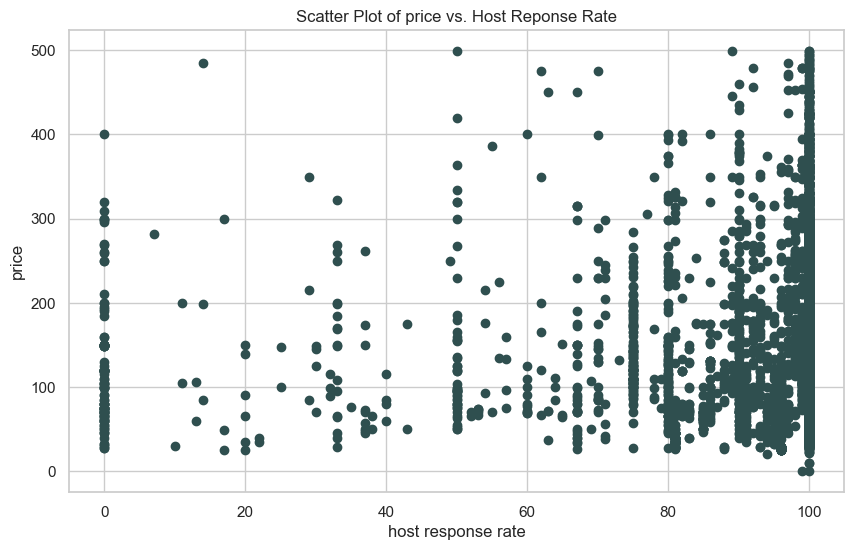

In [163]:
figure = plt.figure(figsize=(10, 6))

axes = figure.add_subplot(1, 1, 1)
axes.scatter( latest_listings_non_null_host_response_rate_below_500.host_response_rate, latest_listings_non_null_host_response_rate_below_500.price, marker="o", color="darkslategray")

axes.set_ylabel("price")
axes.set_xlabel("host response rate")
axes.set_title("Scatter Plot of price vs. Host Reponse Rate")

plt.show()
plt.close()

The scatterplot shows this slight positive correlation. The handful of 0% response rate hosts might be skewing this distribution.

### `host_acceptance_rate` vs `price` <a id="host_acceptance_rate_vs_price"></a>

Similar to host response time and rate, I expect host acceptance rate has a positive correlation with rating which in turn gives the host leverage to raise the price of their listing.

In [164]:
latest_listings_below_500['host_acceptance_rate'] = latest_listings_below_500['host_acceptance_rate'].replace('N/A',np.NaN)
latest_listings_below_500['host_acceptance_rate'] = latest_listings_below_500['host_acceptance_rate'].replace('%', '', regex=True).astype(float)

In [165]:
latest_listings_below_500['host_response_rate'].isnull().values.any()

True

In [166]:
latest_listings_non_null_host_acceptance_rate_below_500 = latest_listings_below_500[latest_listings_below_500["host_acceptance_rate"].notnull()]

In [167]:
correlation(latest_listings_non_null_host_acceptance_rate_below_500, "price", "host_acceptance_rate")

Correlation coefficients:
r   = 0.14181600177900086 (very weak)
rho = 0.07371328158619253 (very weak)


The correlation is very weak but overall positive

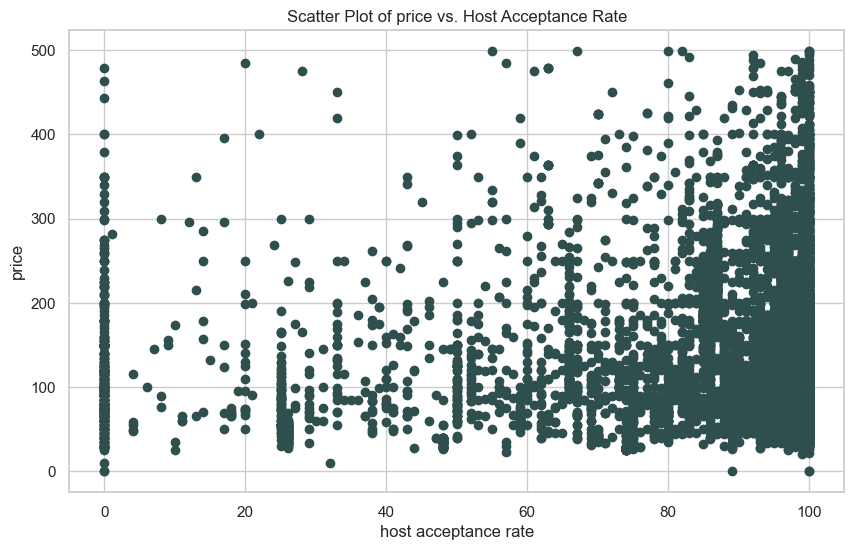

In [168]:
figure = plt.figure(figsize=(10, 6))

axes = figure.add_subplot(1, 1, 1)
axes.scatter( latest_listings_non_null_host_acceptance_rate_below_500.host_acceptance_rate, latest_listings_non_null_host_acceptance_rate_below_500.price, marker="o", color="darkslategray")

axes.set_ylabel("price")
axes.set_xlabel("host acceptance rate")
axes.set_title("Scatter Plot of price vs. Host Acceptance Rate")

plt.show()
plt.close()

The scatterplot shows this slight positive correlation. The handful of 0% response rate hosts might be skewing this distribution.

### `host_is_superhost` vs `price` <a id="host_is_superhost_vs_price"></a>

A host being a superhost requires that they have many positive traits. This would certainly give the host leverage to raise the price of their AirBnB. I expect there to be a weak positive correlation between the host being a superhost and price.

In [169]:
latest_listings_below_500['host_is_superhost'].isnull().values.any()

True

In [170]:
latest_listings_non_null_host_is_superhost_below_500 = latest_listings_below_500[latest_listings_below_500["host_is_superhost"].notnull()]

In [171]:
describe_by_category(latest_listings_below_500, "price", "host_is_superhost", transpose=True)

host_is_superhost        False         True
count              7509.000000  2499.000000
mean                149.125982   146.375350
std                  92.025995    84.974677
min                   0.000000    28.000000
25%                  80.000000    89.000000
50%                 125.000000   124.000000
75%                 200.000000   175.000000
max                 499.000000   499.000000


There actually appears to be a very very weak negative correlation. The average price of listings hosted by superhosts is slightly less than the average price of listings hosted by non superhosts.

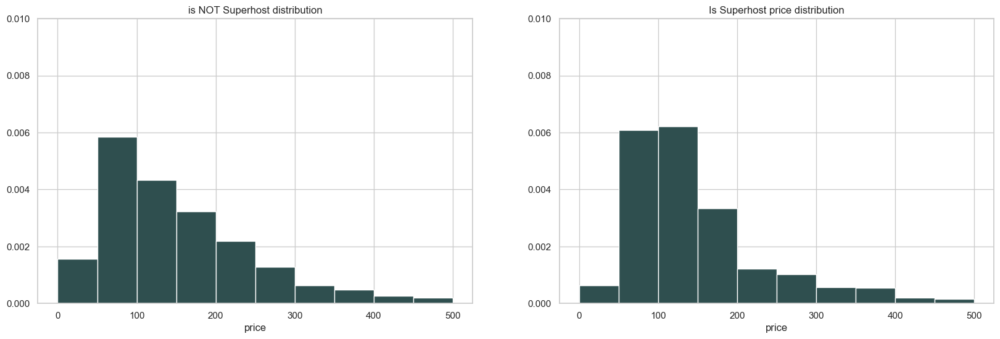

In [172]:
grouped = latest_listings_below_500.groupby("host_is_superhost")

figure = plt.figure(figsize=(20, 6))

axes = figure.add_subplot(1,2, 1)
axes.hist(grouped["price"].get_group(False),color="darkslategray",density=True, range=(0,500))
axes.set_ylim((0,0.01))
axes.set_title("is NOT Superhost distribution")
axes.set_xlabel("price")

axes = figure.add_subplot(1,2, 2)
axes.hist(grouped["price"].get_group(True),color="darkslategray",density=True, range=(0,500))
axes.set_ylim((0,0.01))
axes.set_title("Is Superhost price distribution")
axes.set_xlabel("price")

plt.show()
plt.close()

The overall distribution across the two categories is comparable. 

### `host_listings_count` vs `price` <a id="host_listings_count_vs_price"></a>

Host listings count has some potential plausible interactions with listing price. For one, hosts with multiple listings might be more real-estate savvy and know how to prep a home that is worth a higher nightly cost. Or these hosts might only  be able to afford multiple listings because they are all cheap real-estate which would mean these two variables have a negative correlation. 

In [173]:
latest_listings_below_500['host_listings_count'].isnull().values.any()

True

In [174]:
latest_listings_non_null_host_listings_count_below_500 = latest_listings_below_500[latest_listings_below_500["host_listings_count"].notnull()]

In [175]:
correlation(latest_listings_non_null_host_listings_count_below_500 , "price", "host_listings_count")

Correlation coefficients:
r   = 0.14389749392647586 (very weak)
rho = 0.14816794097130107 (very weak)


There is a positive correlation between these two variables. Hosts with more listings are more likely to have pricer AirBnBs.

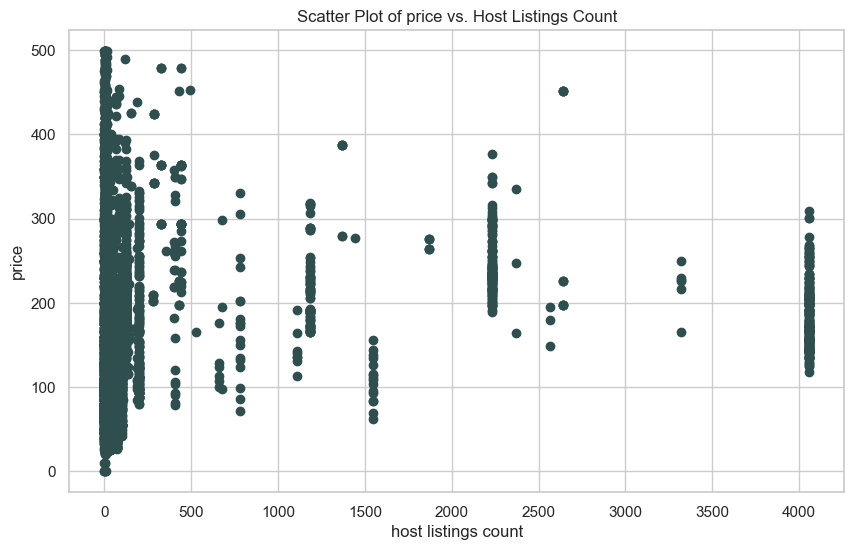

In [176]:
figure = plt.figure(figsize=(10, 6))

axes = figure.add_subplot(1, 1, 1)
axes.scatter( latest_listings_non_null_host_listings_count_below_500.host_listings_count, latest_listings_non_null_host_listings_count_below_500.price, marker="o", color="darkslategray")

axes.set_ylabel("price")
axes.set_xlabel("host listings count")
axes.set_title("Scatter Plot of price vs. Host Listings Count")

plt.show()
plt.close()

This scatterplot is a bit hard to read because of the outlying host counts at 4000+ listings. We can't really see a positive correlation. Let's zoom in to hosts with 0-20 listings.

In [177]:
latest_listings_below_500['host_listings_count_under_20'] = latest_listings_below_500.host_listings_count[latest_listings_below_500.host_listings_count < 20]

In [178]:
latest_listings_non_null_host_listings_under_20_count_below_500 = latest_listings_below_500[latest_listings_below_500["host_listings_count_under_20"].notnull()]

In [179]:
correlation(latest_listings_non_null_host_listings_under_20_count_below_500 , "price", "host_listings_count_under_20")

Correlation coefficients:
r   = 0.03678169211730996 (very weak)
rho = -0.010678801308667132 (very weak)


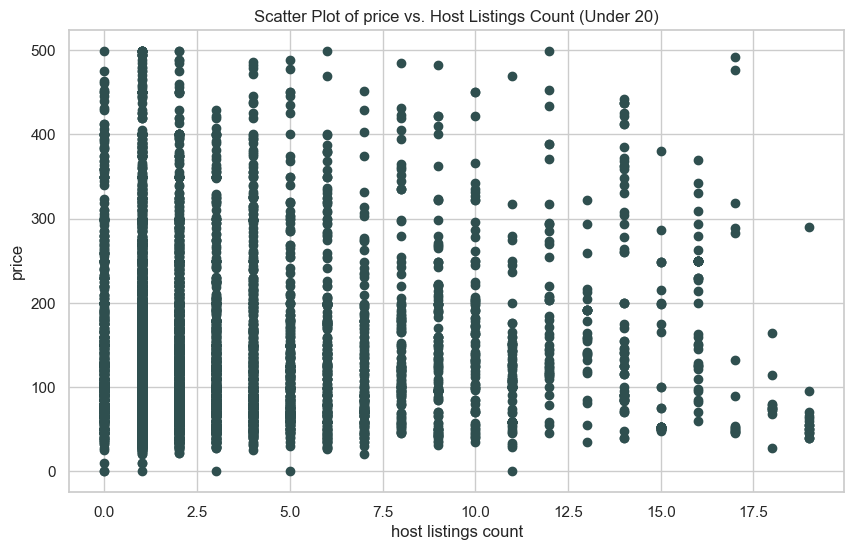

In [180]:
figure = plt.figure(figsize=(10, 6))

axes = figure.add_subplot(1, 1, 1)
axes.scatter( latest_listings_non_null_host_listings_under_20_count_below_500.host_listings_count_under_20, latest_listings_non_null_host_listings_under_20_count_below_500.price, marker="o", color="darkslategray")

axes.set_ylabel("price")
axes.set_xlabel("host listings count")
axes.set_title("Scatter Plot of price vs. Host Listings Count (Under 20)")

plt.show()
plt.close()

The scarcity of hosts with more than 5 listings is making this distribution almost appear to be trending downward. However, knowing that most data points exist between 0 and 2.5 listings we see that there is a slight positive correlation.

### `host_total_listings_count` vs `price` <a id="host_total_listings_count_vs_price"></a>

UNUSED

### `host_verifications` vs `price` <a id="host_verifications_vs_price"></a>
In a future iteration, this information could be pulled out in a useful way and explored.

In [181]:
latest_listings.host_verifications.value_counts(normalize=True)[:10]

['email', 'phone']                                                                                    0.550095
['email', 'phone', 'work_email']                                                                      0.136080
['phone']                                                                                             0.051705
['email', 'phone', 'reviews', 'kba']                                                                  0.024716
['email', 'phone', 'reviews', 'jumio', 'government_id']                                               0.016004
None                                                                                                  0.015341
['email', 'phone', 'reviews']                                                                         0.014583
['email', 'phone', 'jumio', 'offline_government_id', 'selfie', 'government_id', 'identity_manual']    0.010511
['email', 'phone', 'reviews', 'jumio', 'offline_government_id', 'government_id']                      0.010133
[

### `host_has_profile_pic` vs `price` <a id="host_has_profile_pic_vs_price"></a>

Hosts are required to have a profile picture. The hosts that don't likely have junk and/or null data. Regardless, hosts with profile pictures could be interpreted as more trustable than hosts without because of the personal element and identity verification element thus I expect a slight positive correlation.

In [182]:
describe_by_category(latest_listings_below_500, "price", "host_has_profile_pic", transpose=True)

host_has_profile_pic       False         True
count                  69.000000  9786.000000
mean                  142.130435   148.837114
std                    97.503380    90.770977
min                     0.000000     0.000000
25%                    80.000000    82.000000
50%                   107.000000   125.000000
75%                   161.000000   196.000000
max                   499.000000   499.000000


There is a ~6 USD difference in mean listing price favoring hosts with a profile picture.

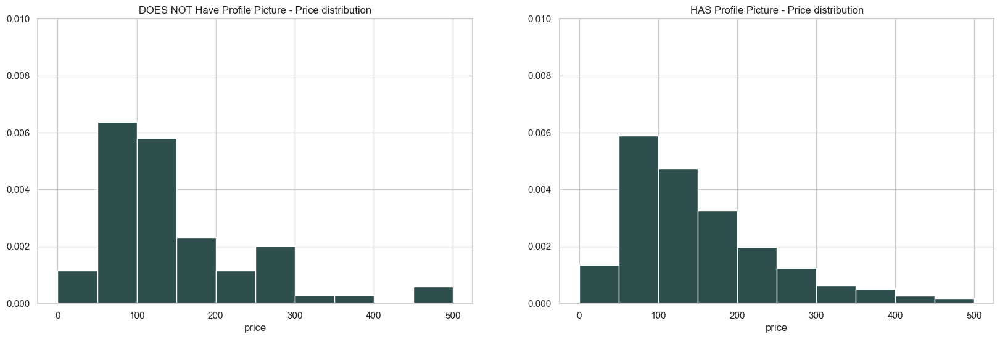

In [183]:
grouped = latest_listings_below_500.groupby("host_has_profile_pic")

figure = plt.figure(figsize=(20, 6))

axes = figure.add_subplot(1,2, 1)
axes.hist(grouped["price"].get_group(False),color="darkslategray",density=True, range=(0,500))
axes.set_ylim((0,0.01))
axes.set_title("DOES NOT Have Profile Picture - Price distribution")
axes.set_xlabel("price")

axes = figure.add_subplot(1,2, 2)
axes.hist(grouped["price"].get_group(True),color="darkslategray",density=True, range=(0,500))
axes.set_ylim((0,0.01))
axes.set_title("HAS Profile Picture - Price distribution")
axes.set_xlabel("price")

plt.show()
plt.close()

The two groups have similar distributions. There are much fewer host without a profile picture so the distribution looks a bit rougher.

### `host_identity_verified` vs `price` <a id="host_identity_verified_vs_price"></a>

Hosts having their identity verified could be perceived as more trustable and therefore customers might feel more inclined to give them money and they have leverage to increase the price of their listings. For that reason, I expect the correlation to be weak and positive.

In [184]:
describe_by_category(latest_listings_below_500, "price", "host_identity_verified", transpose=True)

host_identity_verified        False         True
count                   1577.000000  8278.000000
mean                     141.034876   150.267577
std                       91.445010    90.626311
min                        0.000000     0.000000
25%                       78.000000    84.000000
50%                      111.000000   126.000000
75%                      179.000000   198.000000
max                      499.000000   499.000000


As expected, the distribution is weak but positive.

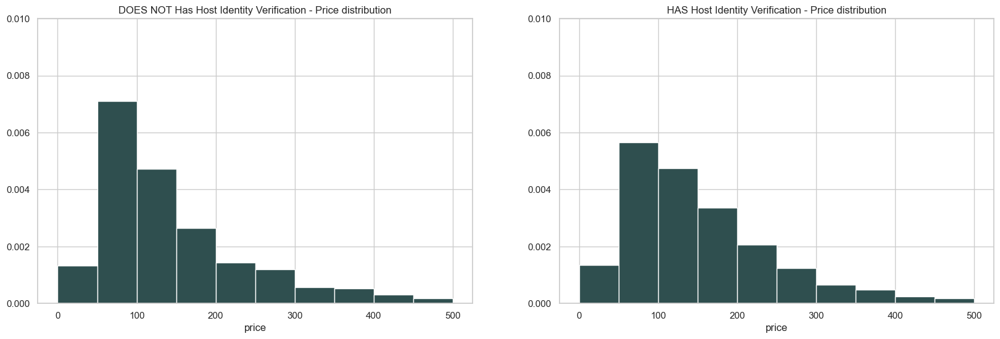

In [185]:
grouped = latest_listings_below_500.groupby("host_identity_verified")

figure = plt.figure(figsize=(20, 6))

axes = figure.add_subplot(1,2, 1)
axes.hist(grouped["price"].get_group(False),color="darkslategray",density=True, range=(0,500))
axes.set_ylim((0,0.01))
axes.set_title("DOES NOT Has Host Identity Verification - Price distribution")
axes.set_xlabel("price")

axes = figure.add_subplot(1,2, 2)
axes.hist(grouped["price"].get_group(True),color="darkslategray",density=True, range=(0,500))
axes.set_ylim((0,0.01))
axes.set_title("HAS Host Identity Verification - Price distribution")
axes.set_xlabel("price")

plt.show()
plt.close()

The distributions for both are unimodal and skewed to the right - both hosts with and without identity verification look very similar in distribution of price.

## Host Information Conclusion

Many of the host information variables have little to no correlation or predictive power with price. A few have very weak to weak correlations that could be potentially useful like
* `host_has_profile_picture`
* `host_acceptance_rate`
* `host_identity_verified`
* `host_listings_count`

And the correlations that we saw with these variables made sense with what we expected from domain knowledge. However, among the above variables with non-negligible correlations, only two have a tolerable either (1) split in category or (2) a reasonable distribution without too many outliers and those are
* `host_listings_count`
* `host_identity_verified`

## <a id='rental_info_v_price'>Rental Information v. Price</a>
In this section, we'll look at the relationship between the room descriptors and the target variable, price.


### <a id="room_type_vs_price">Room Type v. Price </a>

We expect an "entire home/apt" to price higher than a "private" room or "hotel room", which would price higher than a "shared room."


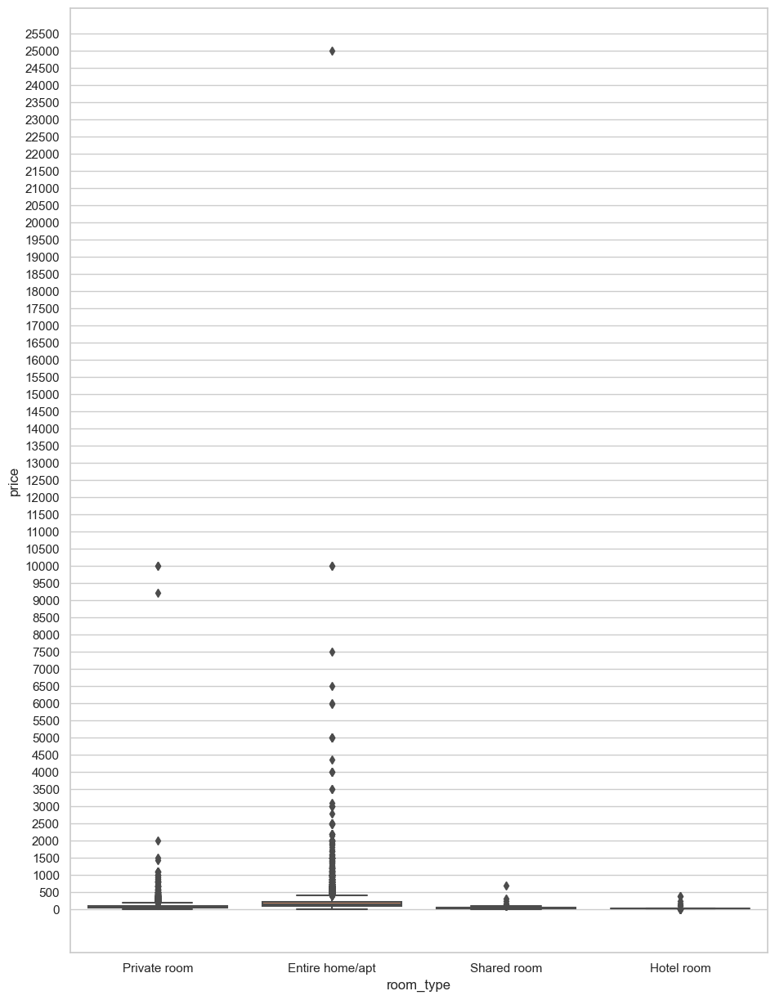

In [186]:
max_plot_price = 26000
fig = plt.figure(figsize=(11,15))
ax1 = fig.add_subplot(1,1,1)
sns.boxplot(x = 'room_type', y='price', data = listings_df)
ax1.set_yticks(range(0,max_plot_price,500))
plt.show()

The extreme values, especially the $25,000 listing, makes it hard to see the distribution of prices per room type.

These extreme values are real prices, and I am hesitant to throw them out.

We'll zoom into the majority of data points below.

In [187]:

def plot_box_cat(plot_df, x_name, y_name, y_lim, y_step):
    fig = plt.figure(figsize=(9,12))
    ax1 = fig.add_subplot(1,1,1)
    sns.boxplot(x = x_name, y=y_name, data = plot_df)
    ax1.set_yticks(range(0,y_lim,y_step))
    ax1.set(ylim=[0,y_lim])
    plt.show()

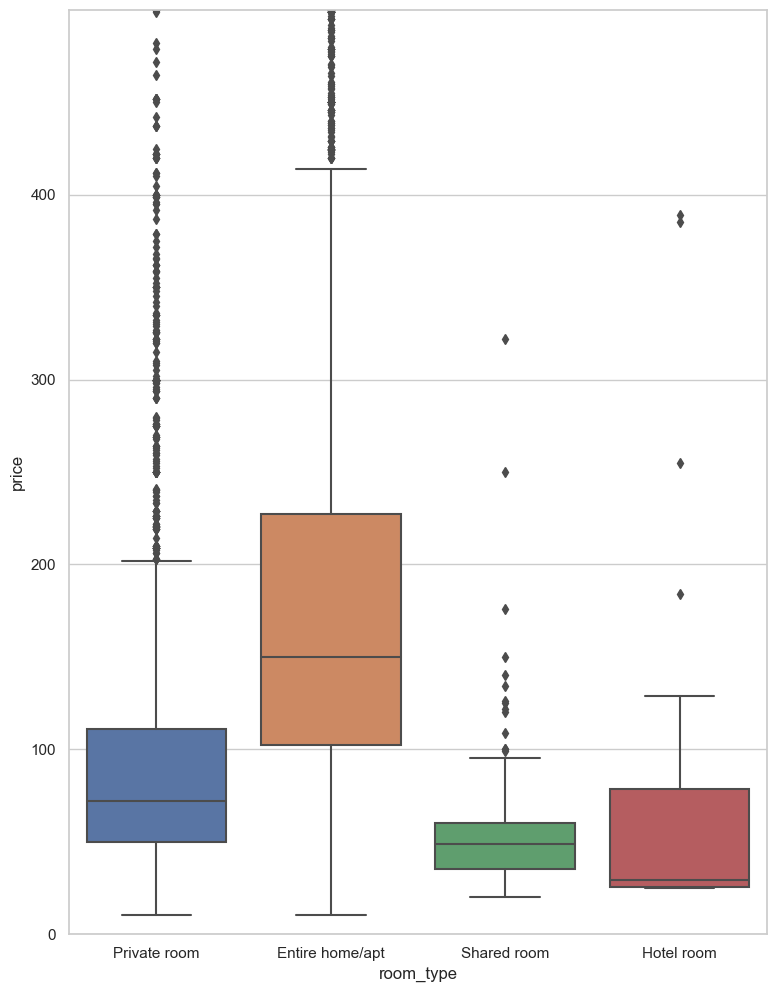

In [188]:
max_plot_price = 500
#plot_df = listings_df[listings_df.price < max_plot_price]
plot_df = listings_df[listings_df.price > 0]
plot_box_cat(plot_df, 'room_type', 'price', max_plot_price, 100)



As expected, the Entire home/apt is the most pricey. This is followed by private room. The shared room median is above the hotel room median. I expected the hotel room to follow the private room trend, but it did not. With 28 of the total ~10,500 listings being hotel rooms, there may be some issues here. _todo explain_

### <a id='accomodates_v_price'>Accomodates v Price</a>

We expect the price to increase as the maximum accomodation for a listing increases.

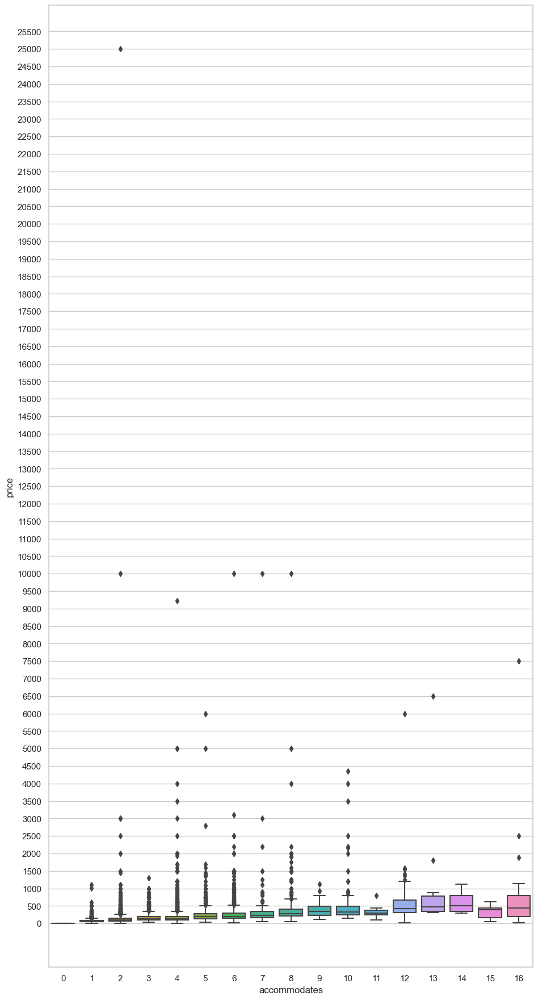

In [189]:
fig = plt.figure(figsize=(11,22))
ax1 = fig.add_subplot(1,1,1)
sns.boxplot(x = 'accommodates', y='price', data = listings_df)
ax1.set_yticks(range(0,26000,500))
plt.show()

Once again, the extreme values make it difficult to see the majority of the distributions. We'll limit the view in the next plot:

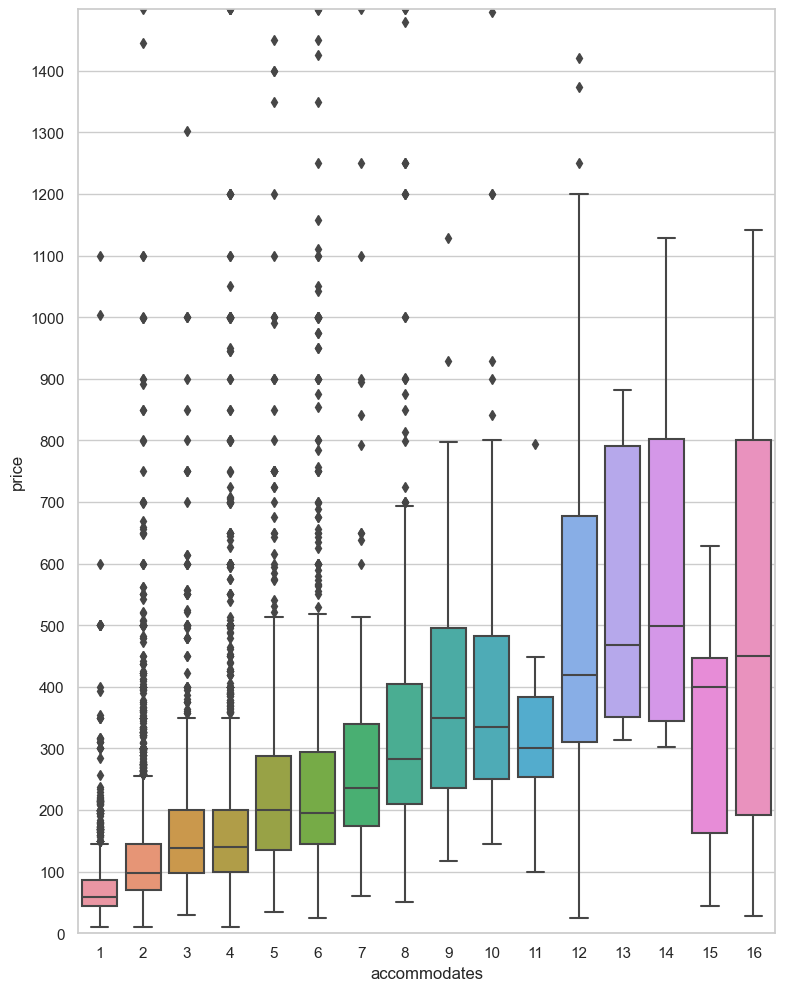

In [190]:
max_plot_price = 1500
#plot_df = listings_df[listings_df.price < max_plot_price]
plot_df = listings_df[listings_df.price > 0]
plot_box_cat(plot_df, 'accommodates', 'price', max_plot_price, 100)


The mean price tends to increase as the maximum accommodations increase. There is a wider distribution of prices as maximum accomodations increases as well. 

There may be another variable that can explain the distribution.

In [311]:
correlation(plot_df, "price", "accommodates")

Correlation coefficients:
r   = 0.23975703067904652 (weak)
rho = 0.5594564264798472 (moderate)


The Pearson's correlation coefficient is .24 (weak), and the spearman's correlation coefficient is .56 (moderate). There is an increasing monotonic relationship.

### <a id='bedrooms_v_price'>Bedrooms v. Price </a>
As with accomodations, we expect the price to increase as the number of bedrooms increases.

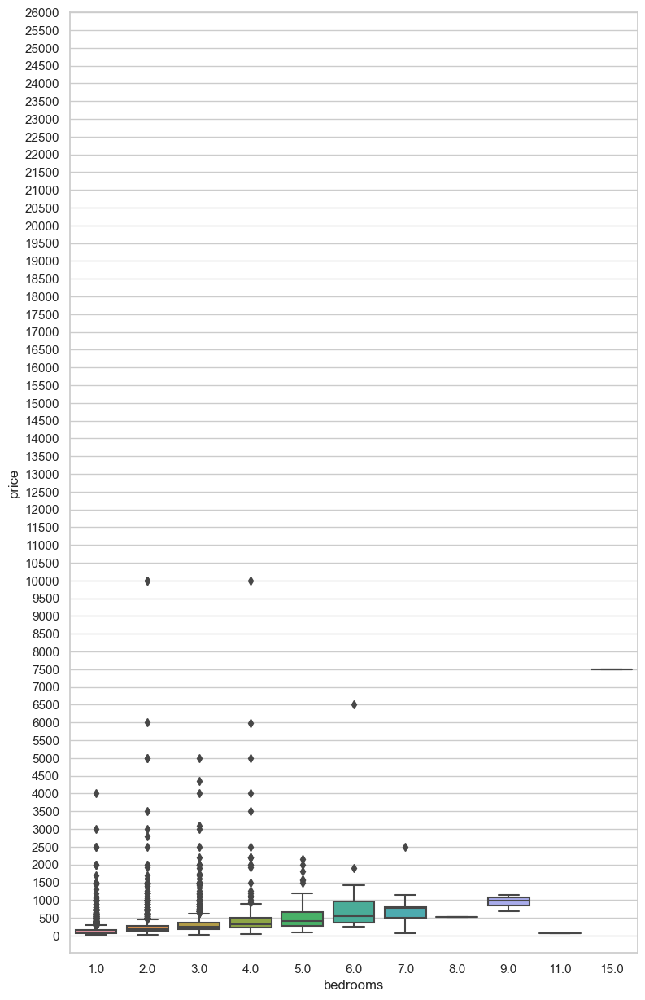

In [191]:
fig = plt.figure(figsize=(9,15))
ax1 = fig.add_subplot(1,1,1)
sns.boxplot(x = 'bedrooms', y='price', data = listings_df)
ax1.set_yticks(range(0,26500,500))
plt.show()

We can generally see an increase in the overall distribution of prices as we go up in bedrooms until about 8 bedrooms. There are more outliers from 1-4 bedrooms.

It's hard to see the majority if the distributions, so we'll zoom in:

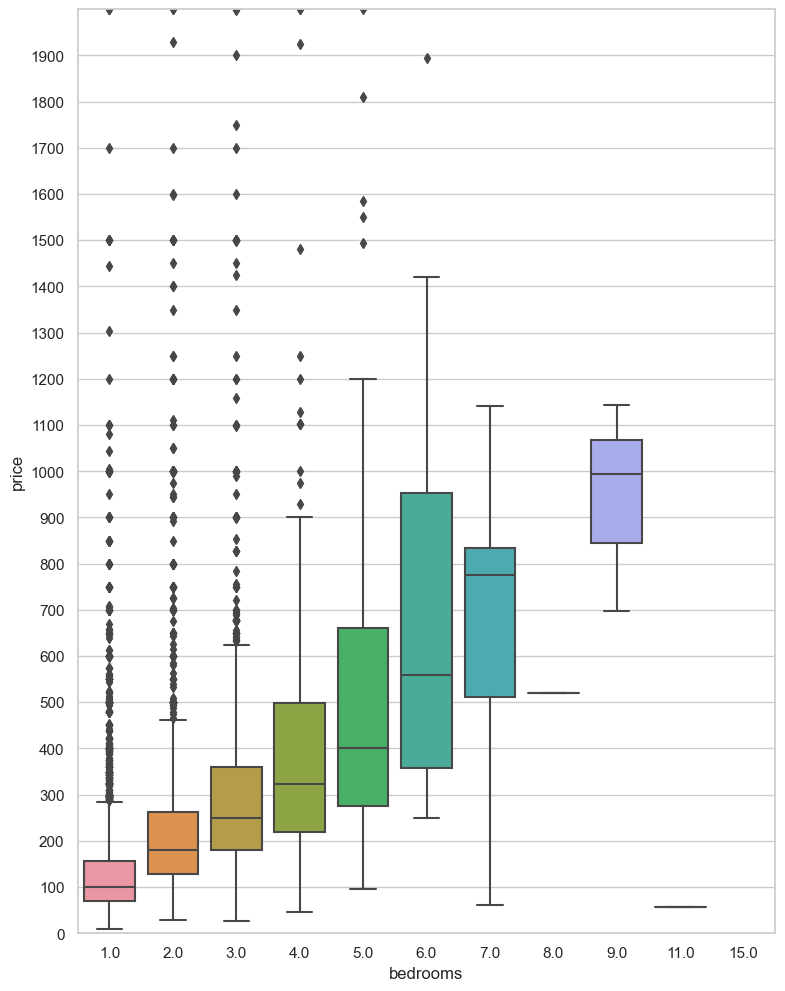

In [330]:
max_plot_price = 2000
#plot_df = listings_df[listings_df.price < max_plot_price]
plot_df = listings_df[listings_df.price > 0]
plot_box_cat(plot_df, 'bedrooms', 'price', max_plot_price, 100)


Here we can see rising averages and rising distributions as bedrooms increases.

In [358]:
plot_df = listings_df[listings_df[['price','bedrooms']].notnull().all(1)]

correlation(plot_df, "price", "bedrooms")
plot_df.shape


Correlation coefficients:
r   = 0.3480348197650736 (low)
rho = 0.5373803796400258 (moderate)


(9600, 9)

Here the pearson's correlation coefficient is .35 (low), and the spearman's correlation coefficient is .54 (moderate). This may be a good variable to use in modeling.

Note that there were around 800 rows that did not have data for number of bedrooms.

### <a id='beds_v_price'>Beds v. Price </a>
As with accomodations, we expect the price to increase as the number of beds increases.

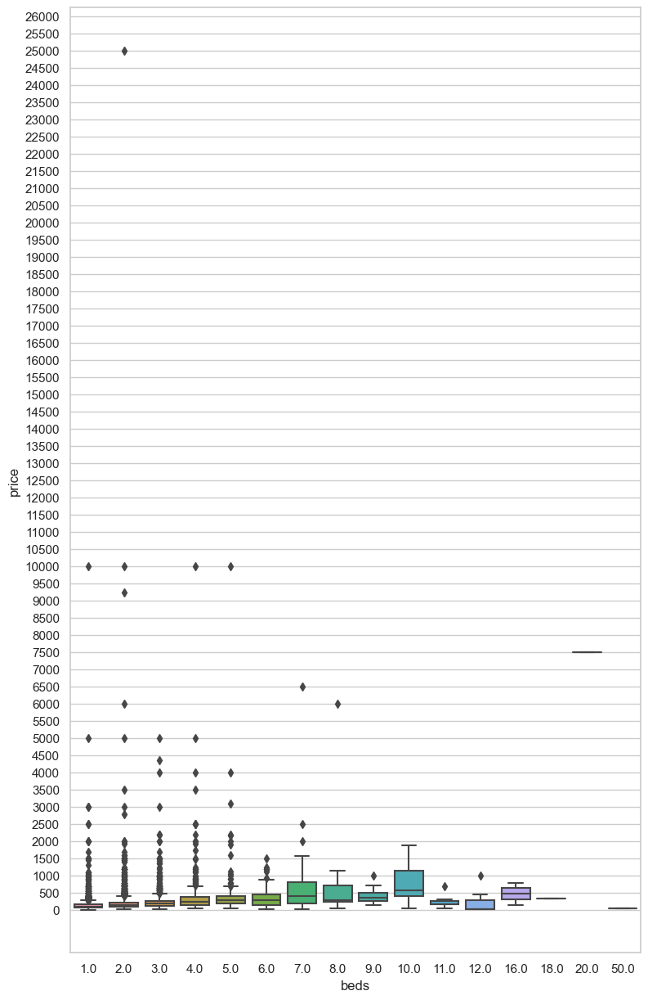

In [356]:
fig = plt.figure(figsize=(9,15))
ax1 = fig.add_subplot(1,1,1)
sns.boxplot(x = 'beds', y='price', data = listings_df)
ax1.set_yticks(range(0,26500,500))
plt.show()

Once again, this is difficult to make out due to the outliers compressing the other data in the plot. We'll zoom in further.

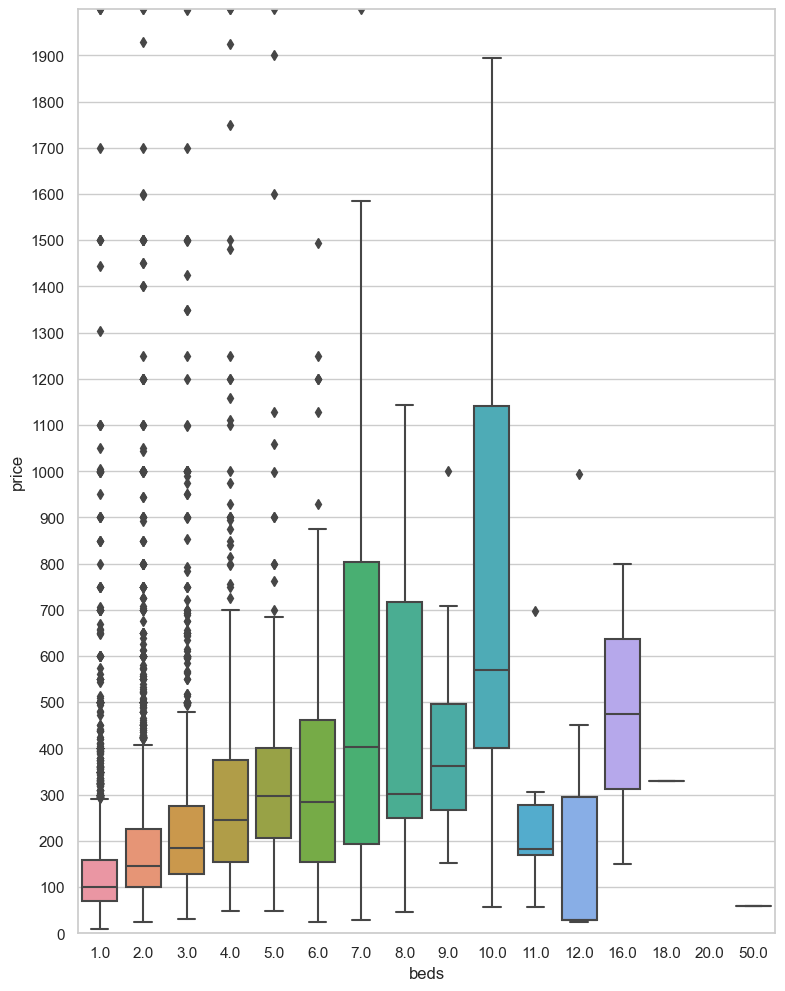

In [357]:
max_plot_price = 2000
plot_df = listings_df[listings_df.price > 0]
plot_box_cat(plot_df, 'beds', 'price', max_plot_price, 100)


This plot looks similar to the number of bedrooms.

In [359]:
plot_df = listings_df[listings_df[['price','beds']].notnull().all(1)]

correlation(plot_df, "price", "beds")
plot_df.shape

Correlation coefficients:
r   = 0.19648876526139203 (weak)
rho = 0.4389629698933788 (low)


(10291, 9)

This shows a weak Pearson's correlation (.2), and a low (.44) Spearman's correlation. The number of bedrooms had higher coefficients for both of these.

### <a id='rental_info_conclusion'>Rental Information Conclusion</a>

#### Room descriptors
* property_type 
* room_type - whole house > room > shared
* accomodates ->+ price
* bathrooms ->+ price  (actuals TBD)
* bedrooms ->+ price
* beds->+ price
* amenities (TBD)  

  
The numeric values are all related: accommodates, bathrooms, bedrooms, beds. The more people you can fit in, the higher the price is generally. The function criteria for "accommodates" isn't listed, but it should be a function of the number of bedrooms and bathrooms. Overall, as these increase, so does price.  

#### Filters
There were a number of rows that should be thrown away as errors because they cannot be true, and we have no way to correct them in the data. For the following criteria, we will drop the data:
* Price is 0
* Accommodates is 0


#### To do if additional time:
* extract bathrooms info
* "private v. shared?"
* extract amenities info

## <a id='review_scores_v_price'>Review Scores to Price</a>



### <a id='price_v_review_scores_accuracy'>review_scores_accuracy v. price</a>

The price comparison with review scores accuracy. Let's look at the correlation coefficient. 

In [193]:
latest_listings_review_scores_accuracy = latest_listings.review_scores_accuracy.fillna(0)

In [194]:
print("r   = ", stats.pearsonr(latest_listings.price, latest_listings_review_scores_accuracy)[0])
print("rho = ", stats.spearmanr(latest_listings.price, latest_listings_review_scores_accuracy)[0])

r   =  -0.12602909439305388
rho =  -0.13164155122712298


Pearson's correlation coefficient,  𝑟 , is only -0.12 which indicates a weak inverse relationship. Spearman's is interesting at -0.09 which might indicate that at least a weak inverse monotonic relationship. This is interesting because if means that as scores go up price goes down. I'm not sure why that would be the case.

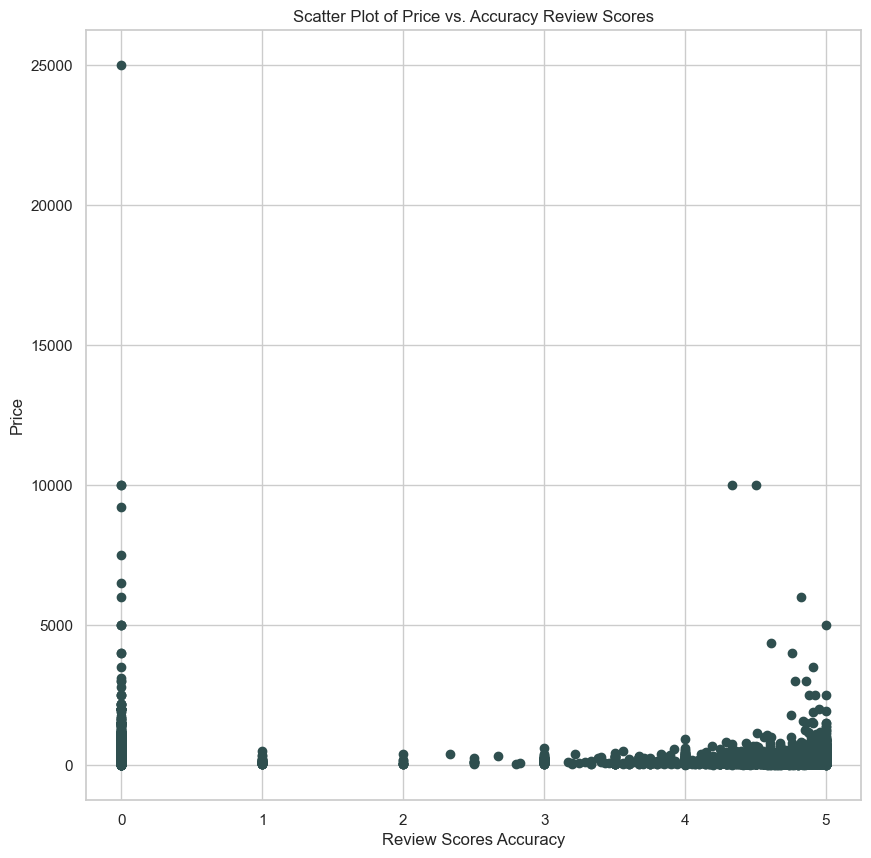

In [195]:
figure = plt.figure(figsize=(10, 10))

axes = figure.add_subplot(1, 1, 1)
axes.scatter(latest_listings_review_scores_accuracy, latest_listings.price, marker="o", color="darkslategray")

axes.set_ylabel("Price")
axes.set_xlabel("Review Scores Accuracy")
axes.set_title("Scatter Plot of Price vs. Accuracy Review Scores")

plt.show()
plt.close()

### <a id='review_scores_cleanliness_v_price'>review_scores_cleanliness v. price </a>

The price comparison with review scores cleanliness. Let's look at the correlation coefficient.

In [196]:
latest_listings_review_scores_cleanliness = latest_listings.review_scores_cleanliness.fillna(0)

In [197]:
print("r   = ", stats.pearsonr(latest_listings.price, latest_listings_review_scores_cleanliness)[0])
print("rho = ", stats.spearmanr(latest_listings.price, latest_listings_review_scores_cleanliness)[0])

r   =  -0.12376276237321365
rho =  -0.10307181975073734


Pearson's correlation coefficient, 𝑟 , is only -0.12 which indicates a weak inverse relationship. Spearman's is interesting at -0.06 which might indicate that at least a weak inverse monotonic relationship. This is interesting because if means that as scores go up price goes down. I'm not sure why that would be the case.

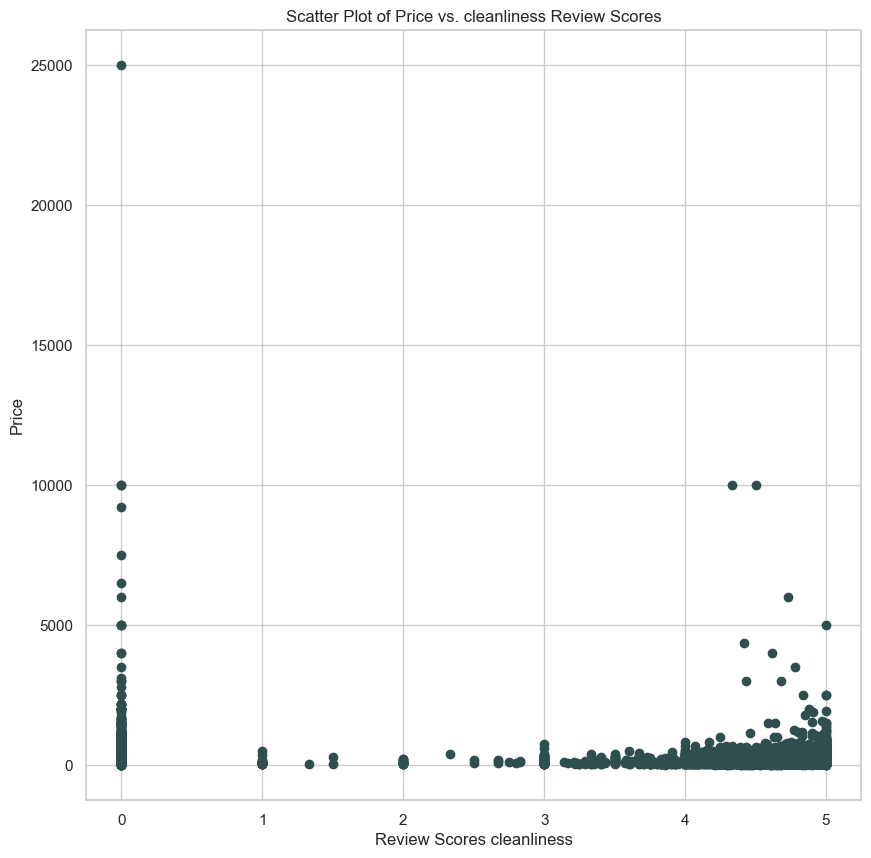

In [198]:
figure = plt.figure(figsize=(10, 10))

axes = figure.add_subplot(1, 1, 1)
axes.scatter(latest_listings_review_scores_cleanliness, latest_listings.price, marker="o", color="darkslategray")

axes.set_ylabel("Price")
axes.set_xlabel("Review Scores cleanliness")
axes.set_title("Scatter Plot of Price vs. cleanliness Review Scores")

plt.show()
plt.close()

These are all very similar graphics due to the way the ratings are all very similar as we saw from EDA. 

### <a id='review_scores_checkin_v_price'>review_scores_checkin v price</a>

In [199]:
latest_listings_review_scores_checkin = latest_listings.review_scores_checkin.fillna(0)

In [200]:
print("r   = ", stats.pearsonr(latest_listings.price, latest_listings_review_scores_checkin)[0])
print("rho = ", stats.spearmanr(latest_listings.price, latest_listings_review_scores_checkin)[0])

r   =  -0.12581865839149844
rho =  -0.14059317804934413


Pearson's correlation coefficient, 𝑟 , is only -0.12 which indicates a weak inverse relationship. Spearman's is interesting at -0.10 which might indicate that at least a weak inverse monotonic relationship. This is interesting because if means that as scores go up price goes down. I'm not sure why that would be the case.

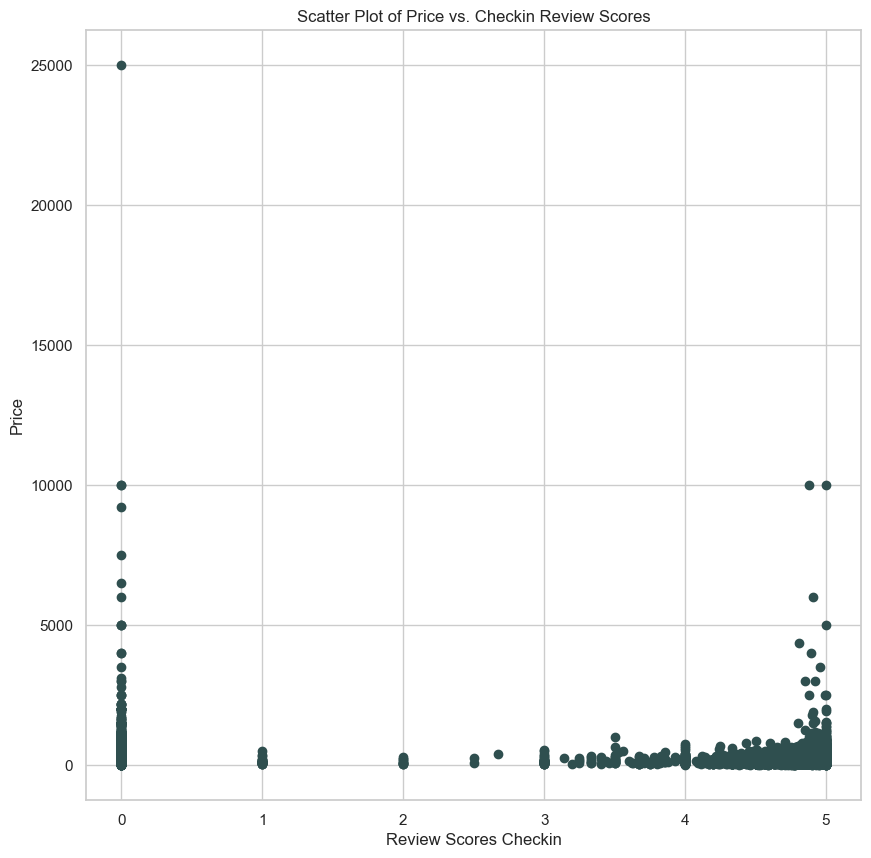

In [201]:
figure = plt.figure(figsize=(10, 10))

axes = figure.add_subplot(1, 1, 1)
axes.scatter(latest_listings_review_scores_checkin, latest_listings.price, marker="o", color="darkslategray")

axes.set_ylabel("Price")
axes.set_xlabel("Review Scores Checkin")
axes.set_title("Scatter Plot of Price vs. Checkin Review Scores")

plt.show()
plt.close()

### <a id='review_scores_communication_v_price'>review_scores_communication v. price</a>

In [202]:
latest_listings_review_scores_communication = latest_listings.review_scores_communication.fillna(0)

In [203]:
print("r   = ", stats.pearsonr(latest_listings.price, latest_listings_review_scores_communication)[0])
print("rho = ", stats.spearmanr(latest_listings.price, latest_listings_review_scores_communication)[0])

r   =  -0.1261376943145524
rho =  -0.14938704069855085


Pearson's correlation coefficient, 𝑟 , is only -0.13 which indicates a weak inverse relationship. Spearman's is interesting at -0.11 which might indicate that at least a weak inverse monotonic relationship. This is interesting because if means that as scores go up price goes down. I'm not sure why that would be the case.

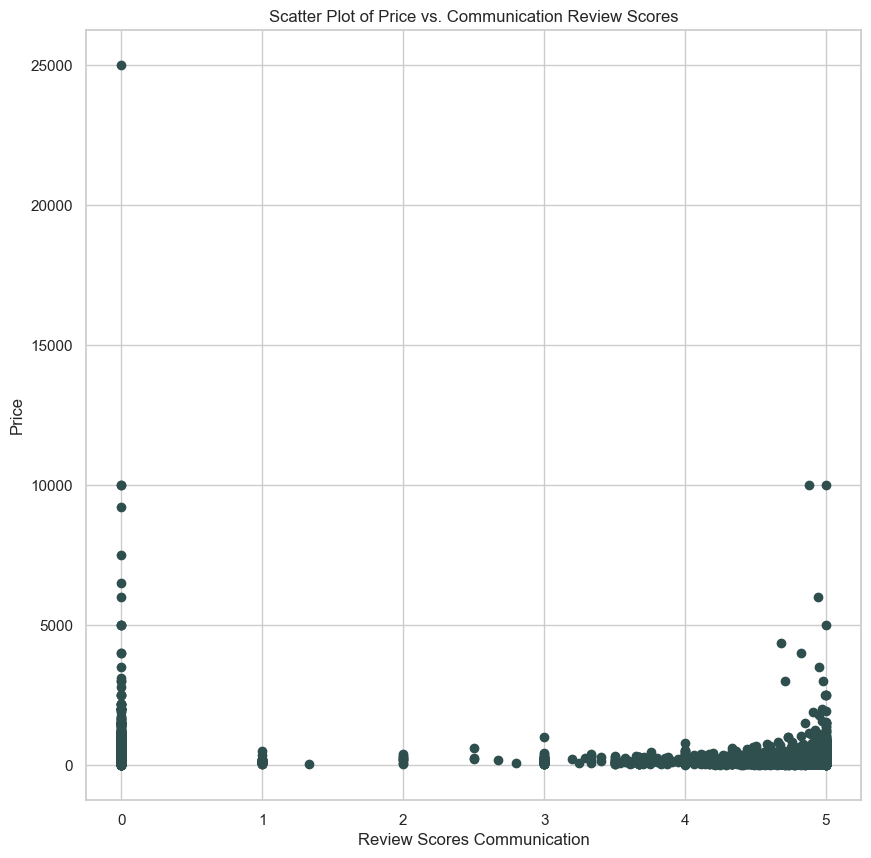

In [204]:
figure = plt.figure(figsize=(10, 10))

axes = figure.add_subplot(1, 1, 1)
axes.scatter(latest_listings_review_scores_communication, latest_listings.price, marker="o", color="darkslategray")

axes.set_ylabel("Price")
axes.set_xlabel("Review Scores Communication")
axes.set_title("Scatter Plot of Price vs. Communication Review Scores")

plt.show()
plt.close()

### <a id='review_scores_location_v_price'>review_scores_location v. price </a>

In [205]:
latest_listings_review_scores_location = latest_listings.review_scores_location.fillna(0)

In [206]:
print("r   = ", stats.pearsonr(latest_listings.price, latest_listings_review_scores_location)[0])
print("rho = ", stats.spearmanr(latest_listings.price, latest_listings_review_scores_location)[0])

r   =  -0.1220504458106642
rho =  -0.057916490848548705


Pearson's correlation coefficient, 𝑟 , is only -0.12 which indicates a weak inverse relationship. Spearman's is interesting at -0.004 which indicates a very weak inverse monotonic relationship.

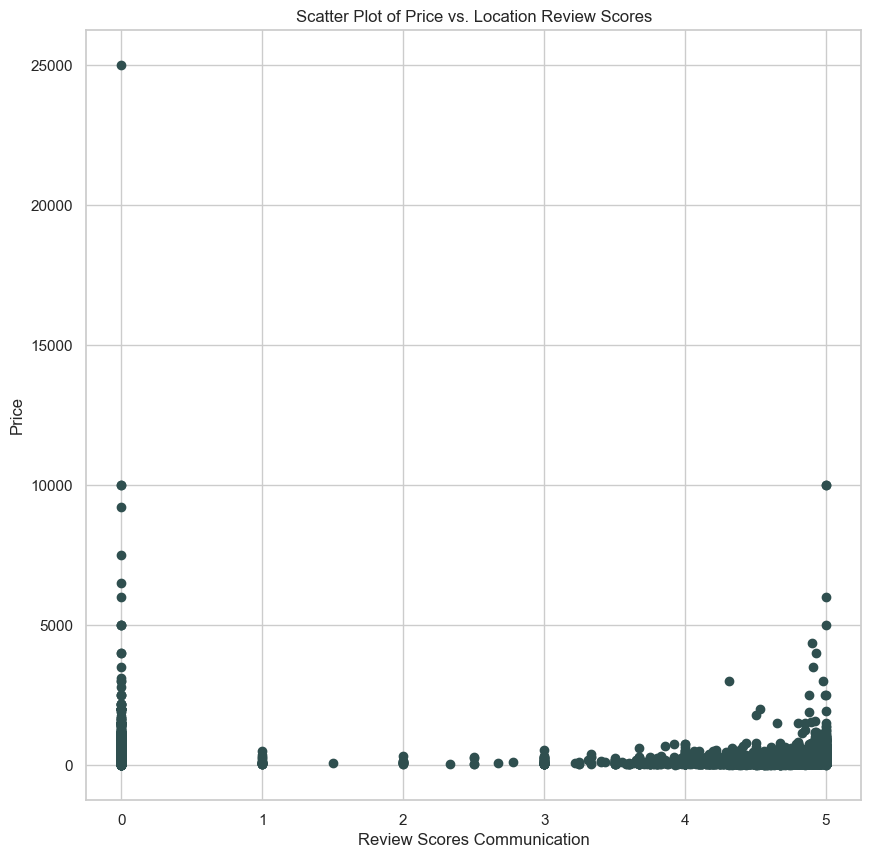

In [207]:
figure = plt.figure(figsize=(10, 10))

axes = figure.add_subplot(1, 1, 1)
axes.scatter(latest_listings_review_scores_location, latest_listings.price, marker="o", color="darkslategray")

axes.set_ylabel("Price")
axes.set_xlabel("Review Scores Communication")
axes.set_title("Scatter Plot of Price vs. Location Review Scores")

plt.show()
plt.close()

### <a id='review_scores_value_v_price'>review_scores_value v. price</a>

In [208]:
latest_listings_review_scores_value = latest_listings.review_scores_value.fillna(0)

In [209]:
print("r   = ", stats.pearsonr(latest_listings.price, latest_listings_review_scores_value)[0])
print("rho = ", stats.spearmanr(latest_listings.price, latest_listings_review_scores_value)[0])

r   =  -0.1264738737335838
rho =  -0.17001550939815196


Pearson's correlation coefficient, 𝑟 , is only -0.13 which indicates a weak inverse relationship. Spearman's is interesting at -0.14 which indicates a very weak inverse monotonic relationship.

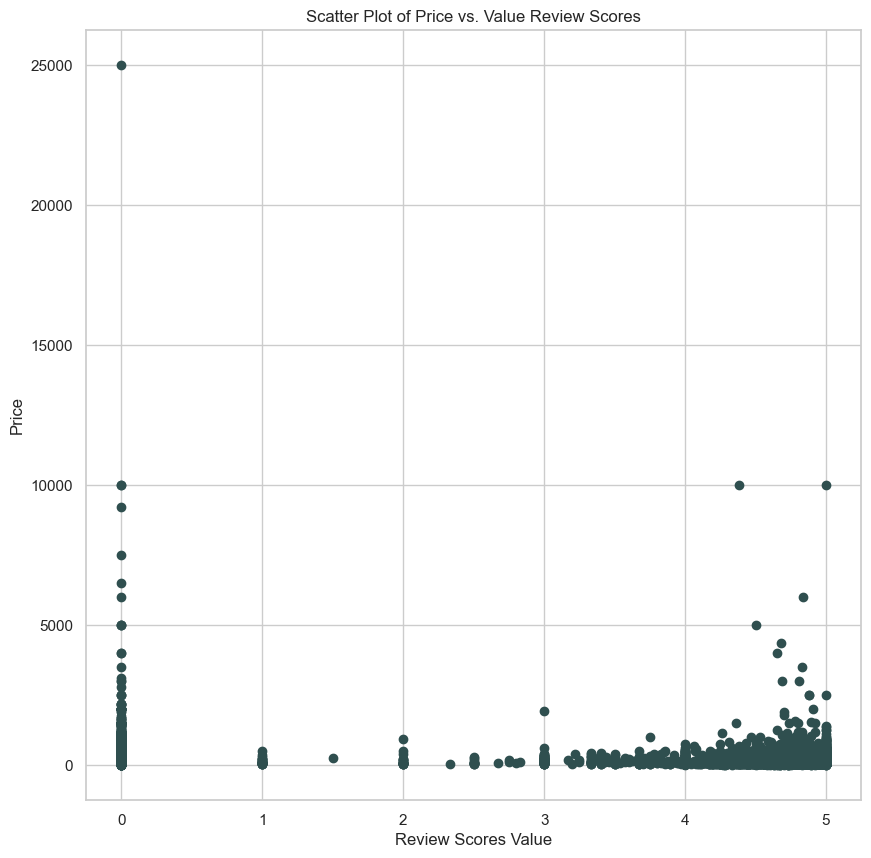

In [210]:
figure = plt.figure(figsize=(10, 10))

axes = figure.add_subplot(1, 1, 1)
axes.scatter(latest_listings_review_scores_value, latest_listings.price, marker="o", color="darkslategray")

axes.set_ylabel("Price")
axes.set_xlabel("Review Scores Value")
axes.set_title("Scatter Plot of Price vs. Value Review Scores")

plt.show()
plt.close()

### <a id='number_of_reviews_v_price '>number_of_reviews v price </a>

In [211]:
latest_listings_number_of_reviews = latest_listings.number_of_reviews.fillna(0)

In [212]:
print("r   = ", stats.pearsonr(latest_listings.price, latest_listings_number_of_reviews)[0])
print("rho = ", stats.spearmanr(latest_listings.price, latest_listings_number_of_reviews)[0])

r   =  -0.05603365411307578
rho =  -0.15113808981420673


Pearson's correlation coefficient, 𝑟 , is only -0.06 which indicates a weak inverse relationship. Spearman's is interesting at -0.14 which indicates a very weak inverse monotonic relationship.

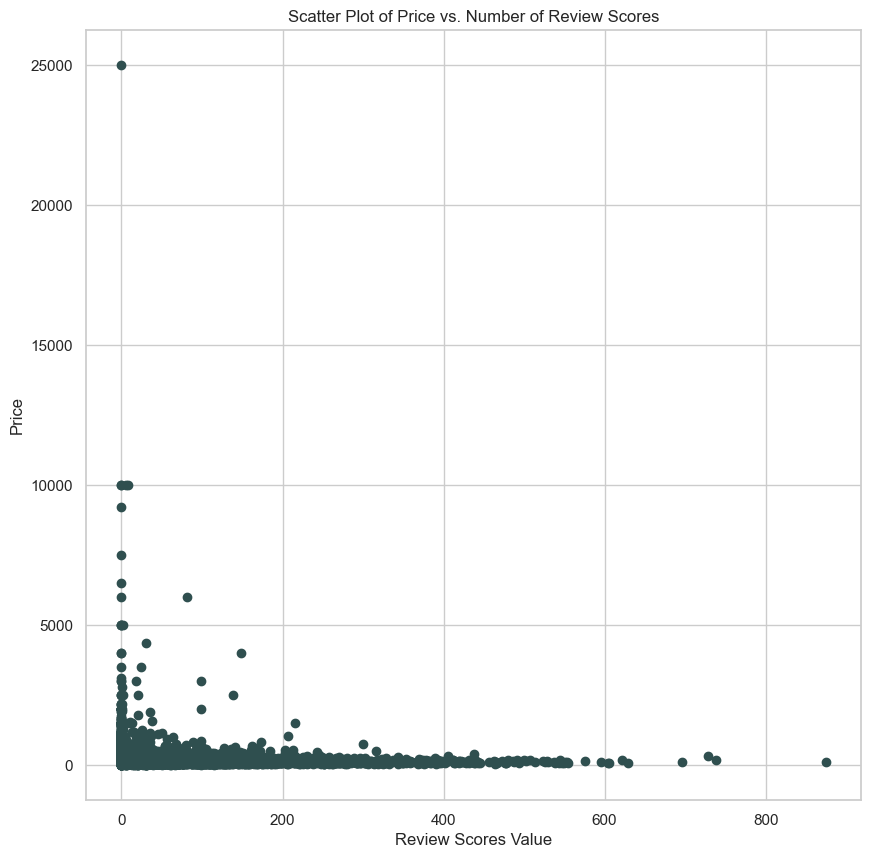

In [213]:
figure = plt.figure(figsize=(10, 10))

axes = figure.add_subplot(1, 1, 1)
axes.scatter(latest_listings_number_of_reviews, latest_listings.price, marker="o", color="darkslategray")

axes.set_ylabel("Price")
axes.set_xlabel("Review Scores Value")
axes.set_title("Scatter Plot of Price vs. Number of Review Scores")

plt.show()
plt.close()

### <a id='number_of_reviews_l30d_v_price'>number_of_reviews_l30d v. price</a>

In [214]:
latest_listings_number_of_reviews_l30d = latest_listings.number_of_reviews_l30d.fillna(0)

In [215]:
print("r   = ", stats.pearsonr(latest_listings.price, latest_listings_number_of_reviews_l30d)[0])
print("rho = ", stats.spearmanr(latest_listings.price, latest_listings_number_of_reviews_l30d)[0])

r   =  -0.038392251877214
rho =  -0.024724854697841612


Pearson's correlation coefficient, 𝑟 , is only -0.044 which indicates an extremely weak inverse relationship. Spearman's is interesting at -0.0009 which indicates there is not relationship. 

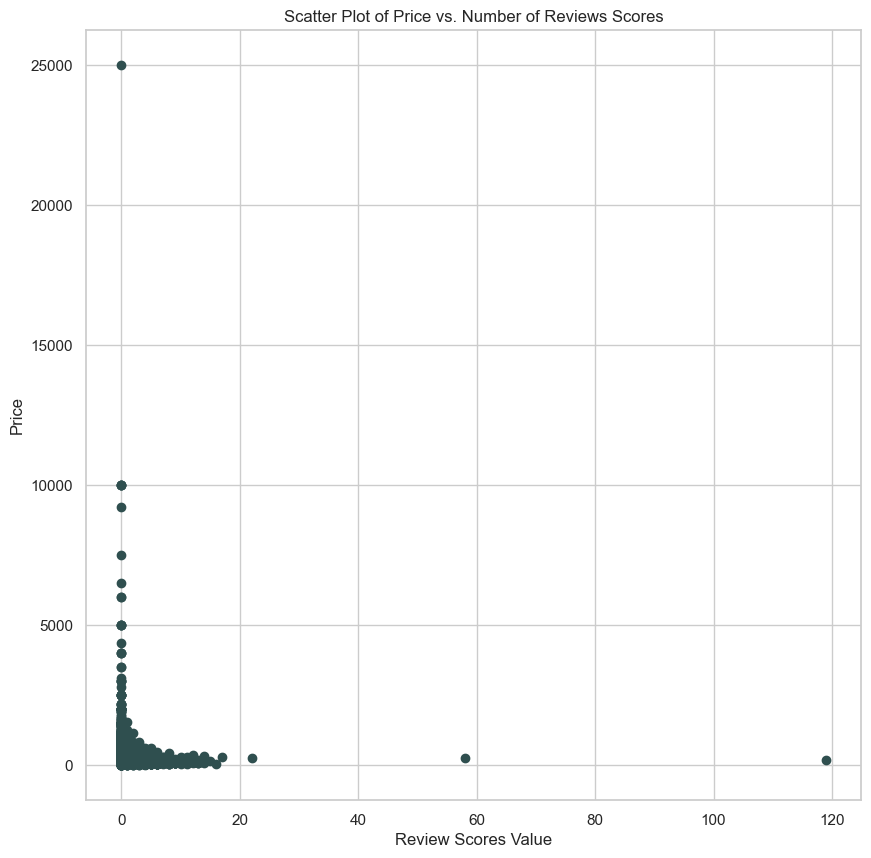

In [216]:
figure = plt.figure(figsize=(10, 10))

axes = figure.add_subplot(1, 1, 1)
axes.scatter(latest_listings_number_of_reviews_l30d, latest_listings.price, marker="o", color="darkslategray")

axes.set_ylabel("Price")
axes.set_xlabel("Review Scores Value")
axes.set_title("Scatter Plot of Price vs. Number of Reviews Scores")

plt.show()
plt.close()

### <a id='reviews_per_month_v_price'> reviews_per_month v. price</a>

In [217]:
latest_listings_reviews_per_month = latest_listings.reviews_per_month.fillna(0)

In [218]:
print("r   = ", stats.pearsonr(latest_listings.price, latest_listings_reviews_per_month)[0])
print("rho = ", stats.spearmanr(latest_listings.price, latest_listings_reviews_per_month)[0])

r   =  -0.05375820903811107
rho =  -0.1108883914557256


Pearson's correlation coefficient, 𝑟 , is only -0.062 which indicates an extremely weak inverse relationship. Spearman's is interesting at -0.096 which indicates there relationship.

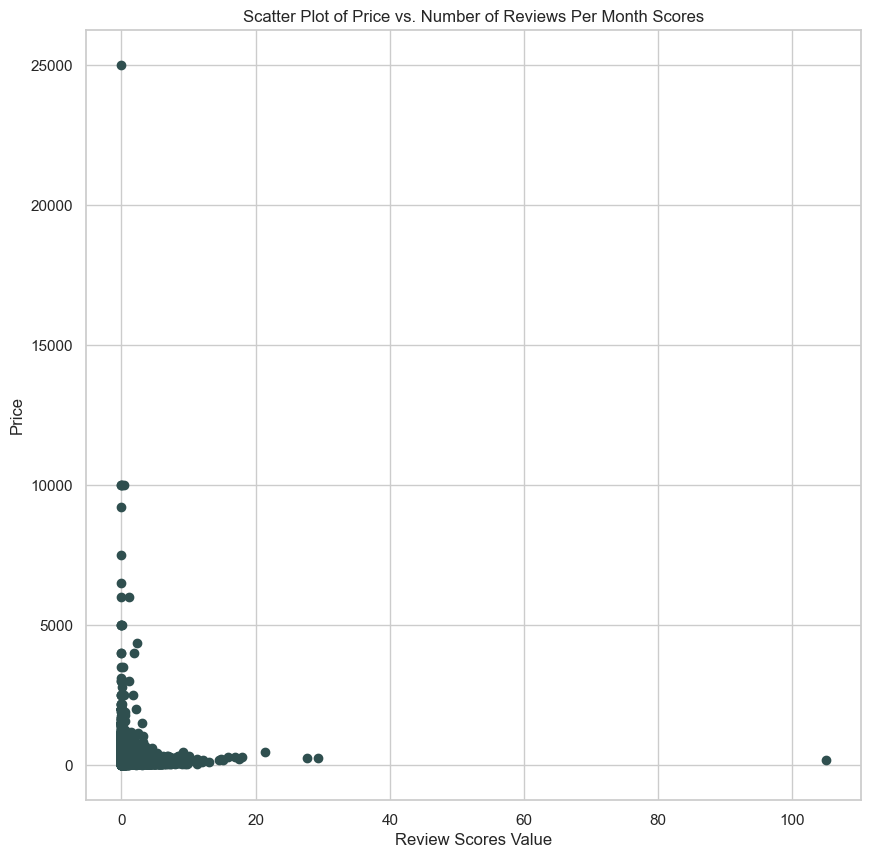

In [219]:
figure = plt.figure(figsize=(10, 10))

axes = figure.add_subplot(1, 1, 1)
axes.scatter(latest_listings_reviews_per_month, latest_listings.price, marker="o", color="darkslategray")

axes.set_ylabel("Price")
axes.set_xlabel("Review Scores Value")
axes.set_title("Scatter Plot of Price vs. Number of Reviews Per Month Scores")

plt.show()
plt.close()

## <a id='calendar_v_price'>Calendar Information v. Price</a>


### <a id='date_v_price'>Date v. Price</a>

Date seems like it could impact price and it is the main data point of this table. I assume prices increase at certain times of the year and decrease at other times based on demand. Let's look first at the correlation coefficients even though it might not be linear or monotonic. Note I'm using the clean version of the data frame because we just want to know the price for when our bnb is available to actually rent.

In [220]:
calendar_listings_clean.date = calendar_listings_clean.date = pd.to_datetime(calendar_listings_clean.date)

In [221]:
cal_listing_price_round = calendar_listings_clean.price.fillna(0)
cal_listing_price_round = cal_listing_price_round.astype(int)
print(cal_listing_price_round)

0            70
1            70
4            70
5            70
6            70
           ... 
10245161    110
10245162    110
10245163    110
10245164    139
10245165    139
Name: price, Length: 4477778, dtype: int64


In [222]:
print("r   = ", stats.pearsonr(cal_listing_price_round, mdates.date2num(calendar_listings_clean.date))[0])
print("rho = ", stats.spearmanr(cal_listing_price_round, mdates.date2num(calendar_listings_clean.date))[0])

r   =  0.0060778481013544165
rho =  0.01905936155012978


Pearson's correlation coefficient, $r$, is only 0.0061 which indicates an extremely weak positive relationship. Spearman's is more interesting at 0.019 which might indicate that at least a weak monotonic relationship. Let's plot the data:

In [223]:
figure = plt.figure(figsize=(100, 100))

axes = figure.add_subplot(1, 1, 1)
axes.scatter( calendar_listings_clean.date, cal_listing_price_round, marker="o", color="darkslategray")

axes.set_ylabel("Price")
axes.set_xlabel("Date")
axes.set_title("Scatter Plot of Price vs. Date")

plt.show()
plt.close()

It looks like there are distinct bands for a price and they stay consistent without increasing or decreasing. It might be worth flipping this graph and limiting the price to a range of 0-1000 dollars. 

In [224]:
figure = plt.figure(figsize=(100, 100))

axes = figure.add_subplot(2, 1, 1)
axes.hist(cal_listing_price_round,range=[0,1000], bins=50,color="darkslategray")
axes.set_title("Price distribution")
axes.set_xlabel("Price")

axes = figure.add_subplot(2, 1, 2)
axes.scatter( cal_listing_price_round, calendar_listings_clean.date, marker="o", color="darkslategray")

axes.set_ylabel("Date")
axes.set_xlabel("Price")
axes.set_title("Scatter Plot of Price vs. Date")

plt.xlim([0, 1000])
plt.show()
plt.close()

If we really zoom out on the data, we can see that at the lower price ranges, the date does not change the price at all. I think one reason for that is because the owners of airbnb are not business savvy, they don't have surge pricing like uber. A host renting out on airbnb sets a price they are comfortable with in terms of costs and the amount of profit they want to make and they set that price. Most hosts are not looking at which times of the year have a higher demand to set prices to capture demand. They keep prices uniform, as a set it and forget it strategy.  

In some of the higher bands, we can see that there are certain times of the year were the pricing does shift a little bit, higher or lower depending on the time of year. That could be due to seasonality, or some other factor not accounted for in our data.

### <a id='available_v_price'>Available v. Price</a>

This variable is true or false so I don't think we will see much of a correlation with price.

In [225]:
def describe_by_category(data, numeric, categorical, transpose=False):
    grouped = data.groupby(categorical)
    grouped_y = grouped[numeric].describe().round()
    if transpose:
        print(grouped_y.transpose())
    else:
        print(grouped_y)

In [226]:
describe_by_category(calendar_listings, "price", "available", transpose=True)

available      false       true
count      5767753.0  4477767.0
mean           200.0      202.0
std            393.0      577.0
min              0.0       10.0
25%             85.0       88.0
50%            125.0      133.0
75%            200.0      212.0
max          24999.0    60141.0


This is interesting, the fist thing we see is that when a property is not available for rent it can have a minimum price of `$0`, but when it is available the minimum price is `$10`. I think the other summary statistics are based on that difference, which leads to a skewed result for mean between the false and true category. The max value is also different between the categories but that is meaningless because if the bnb is not available to rent, then it can have any price. 

### <a id='minimum_nights_v_price'>Minimum Nights</a>

The minimum night might be a good variable comparison to price because if the minimum night is low, we might assume a slightly higher price compared to one where the minimum nights is high, since the cost overall for a guest is higher for those bookings.

Remove any null/nan values

In [227]:
cal_listing_min_night_clean = calendar_listings_clean.minimum_nights.fillna(0)

In [228]:
print("r   = ", stats.pearsonr(cal_listing_price_round, cal_listing_min_night_clean)[0])
print("rho = ", stats.spearmanr(cal_listing_price_round, cal_listing_min_night_clean)[0])

r   =  -0.01355788514248648
rho =  -0.07099643599974306


Pearson's correlation coefficient, $r$, is only -0.014 which indicates a weak inverse relationship. Spearman's is more interesting at -0.07 which might indicate that at least a weak inverse monotonic relationship. I think our assumption was partly correct because the inverse relationship means that as minimum nights goes up, prices goes down. Let's plot the data:

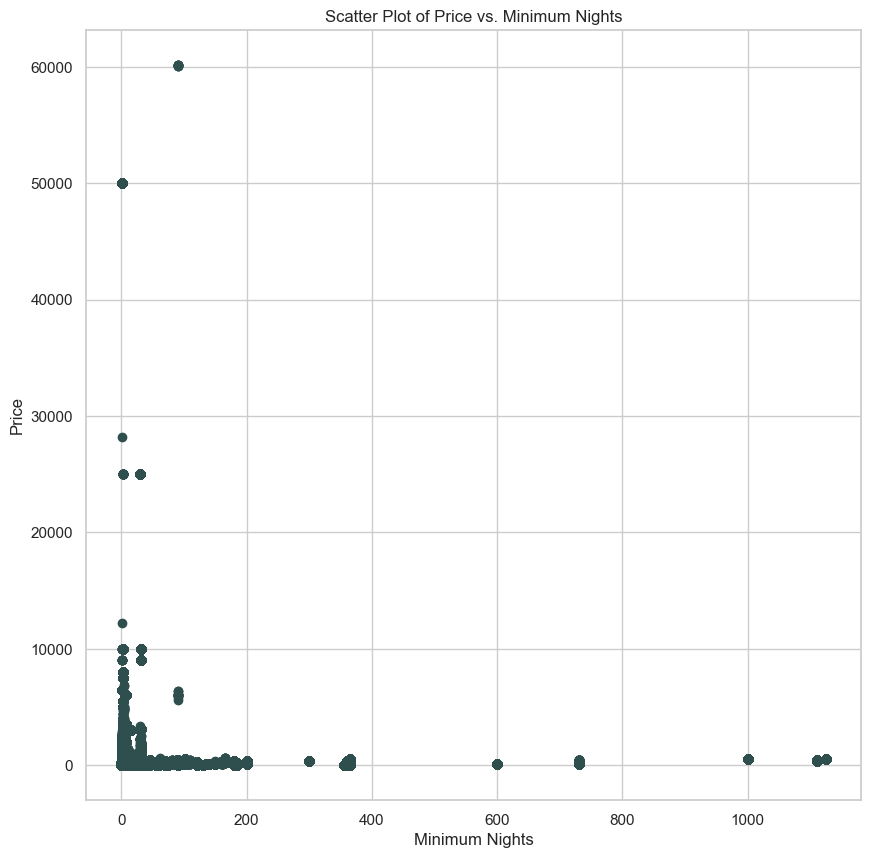

In [229]:
figure = plt.figure(figsize=(10, 10))

axes = figure.add_subplot(1, 1, 1)
axes.scatter(cal_listing_min_night_clean, cal_listing_price_round, marker="o", color="darkslategray")

axes.set_ylabel("Price")
axes.set_xlabel("Minimum Nights")
axes.set_title("Scatter Plot of Price vs. Minimum Nights")

plt.show()
plt.close()

Let's plot this with a limit of 365 days. 

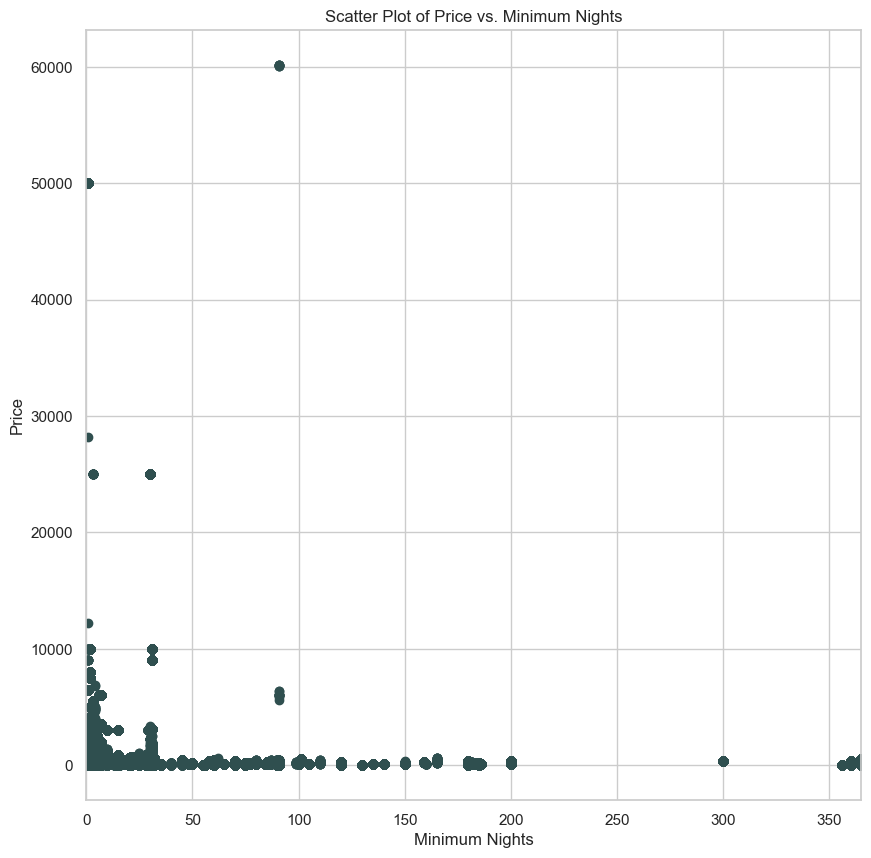

In [230]:
figure = plt.figure(figsize=(10, 10))

axes = figure.add_subplot(1, 1, 1)
axes.scatter(cal_listing_min_night_clean, cal_listing_price_round, marker="o", color="darkslategray")

axes.set_ylabel("Price")
axes.set_xlabel("Minimum Nights")
axes.set_title("Scatter Plot of Price vs. Minimum Nights")

plt.xlim([0, 365])
plt.show()
plt.close()

Let's plot if from the other direction. 

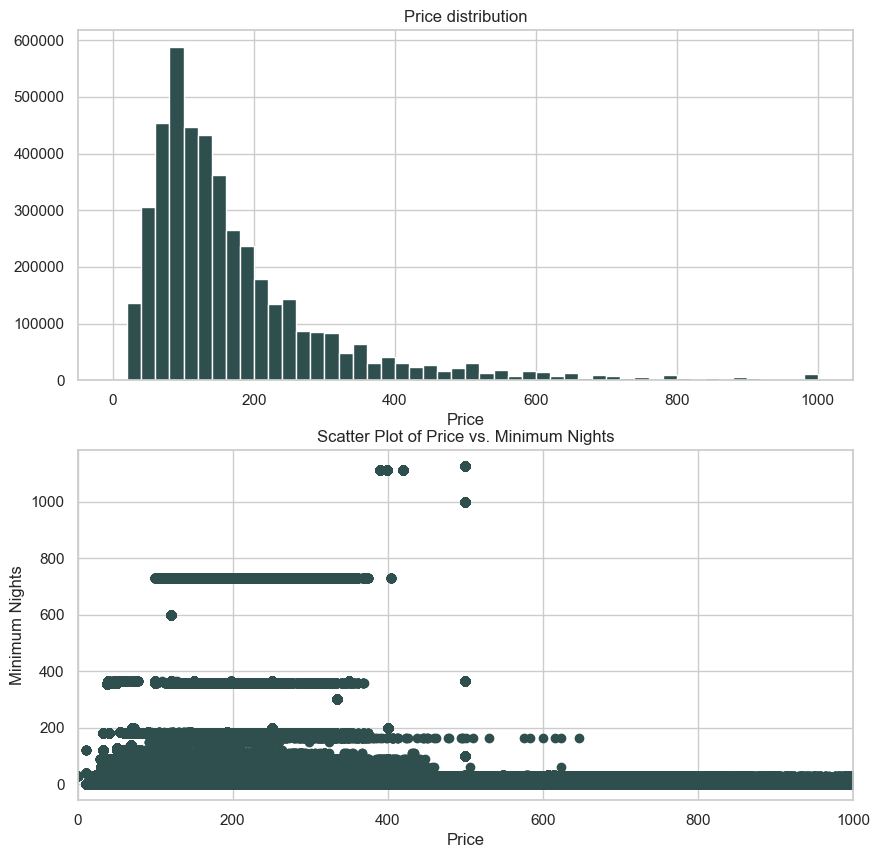

In [231]:
figure = plt.figure(figsize=(10, 10))

axes = figure.add_subplot(2, 1, 1)
axes.hist(cal_listing_price_round,range=[0,1000], bins=50,color="darkslategray")
axes.set_title("Price distribution")
axes.set_xlabel("Price")

axes = figure.add_subplot(2, 1, 2)
axes.scatter( cal_listing_price_round, cal_listing_min_night_clean, marker="o", color="darkslategray")

axes.set_ylabel("Minimum Nights")
axes.set_xlabel("Price")
axes.set_title("Scatter Plot of Price vs. Minimum Nights")

plt.xlim([0, 1000])
plt.show()
plt.close()

We can see from the above scatter plot that there is a wide range of prices with 0 minimum nights but as we get higher in the minimum nights required, the price does start to have a lower maximum price number, especially as we get to the higher minimum nights. 

Let's look at a slice of this data where the minimum nights is set to 0-31 and price is 0-1000 that should cover 90% of our data.

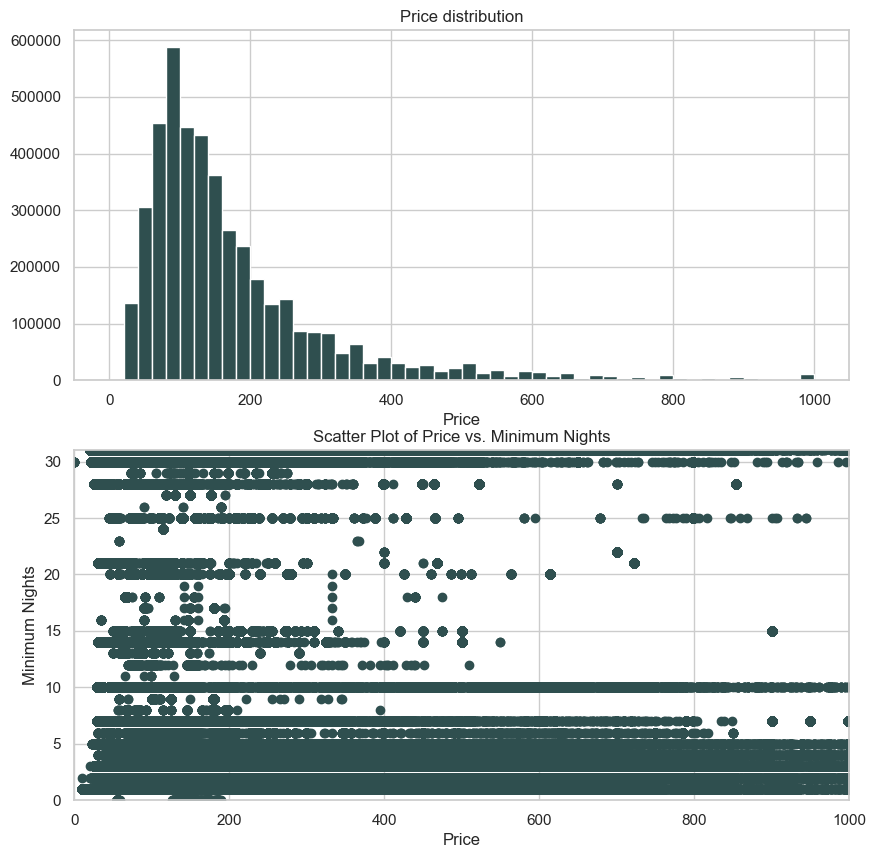

In [232]:
figure = plt.figure(figsize=(10, 10))

axes = figure.add_subplot(2, 1, 1)
axes.hist(cal_listing_price_round,range=[0,1000], bins=50,color="darkslategray")
axes.set_title("Price distribution")
axes.set_xlabel("Price")

axes = figure.add_subplot(2, 1, 2)
axes.scatter( cal_listing_price_round, cal_listing_min_night_clean, marker="o", color="darkslategray")

axes.set_ylabel("Minimum Nights")
axes.set_xlabel("Price")
axes.set_title("Scatter Plot of Price vs. Minimum Nights")

plt.xlim([0, 1000])
plt.ylim([0, 31])
plt.show()
plt.close()

We can see that there are specific bands at 0-5, and 10 nights. At seven night minimum the prices are lower and as we go up, the prices listed are most scattered. At 31 night minimum we see the prices start to look like the 0 night minimum. I find that very odd because that is almost like a month-to-month lease. However, it does look like those airbnbs are just priced for continuous stay. They are not competing with single night pricing because most hosts don't actually offer 31 days of straight bookings even if they have availability. The 31 night minimum listings can charge any price because they are filling a niche in the market for bnbs.  

### <a id='max_nights_v_price'>Maximum Nights v. Price</a>

The maximum nights is the max number of nights a person can book a bnb. We saw from our EDA that a majority of our listings have it set at 1125 which is over 3 years! I think this might be the default setting and many don't bother changing it. I suspect we might see some correlation but since this is a maximum, I don't think it will capture the nuances of the data and how people actually book airbnb stays for short terms. 

In [233]:
cal_listing_max_night_clean = calendar_listings_clean.maximum_nights.fillna(0)

In [234]:
print("r   = ", stats.pearsonr(cal_listing_price_round, cal_listing_max_night_clean)[0])
print("rho = ", stats.spearmanr(cal_listing_price_round, cal_listing_max_night_clean)[0])

r   =  0.021802403289782005
rho =  0.1254607606639578


Pearson's correlation coefficient, $r$, is only 0.022 which indicates a weak positive relationship. Spearman's is more interesting at 0.12 which might indicate a weak monotonic relationship. That is actually the highest we have gotten from our calendar data EDA so far. Let's plot the data:

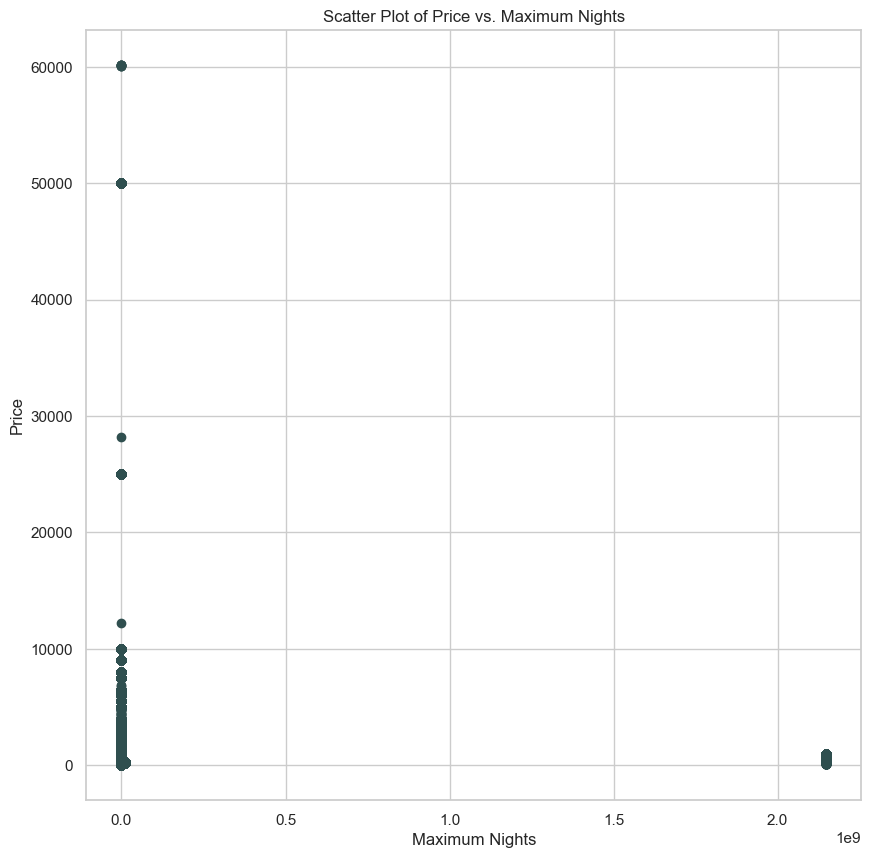

In [235]:
figure = plt.figure(figsize=(10, 10))

axes = figure.add_subplot(1, 1, 1)
axes.scatter(cal_listing_max_night_clean, cal_listing_price_round, marker="o", color="darkslategray")

axes.set_ylabel("Price")
axes.set_xlabel("Maximum Nights")
axes.set_title("Scatter Plot of Price vs. Maximum Nights")

plt.show()
plt.close()

Let's replot this with some better bounds such as price limited to $0-1000 and maximum nights 0-365

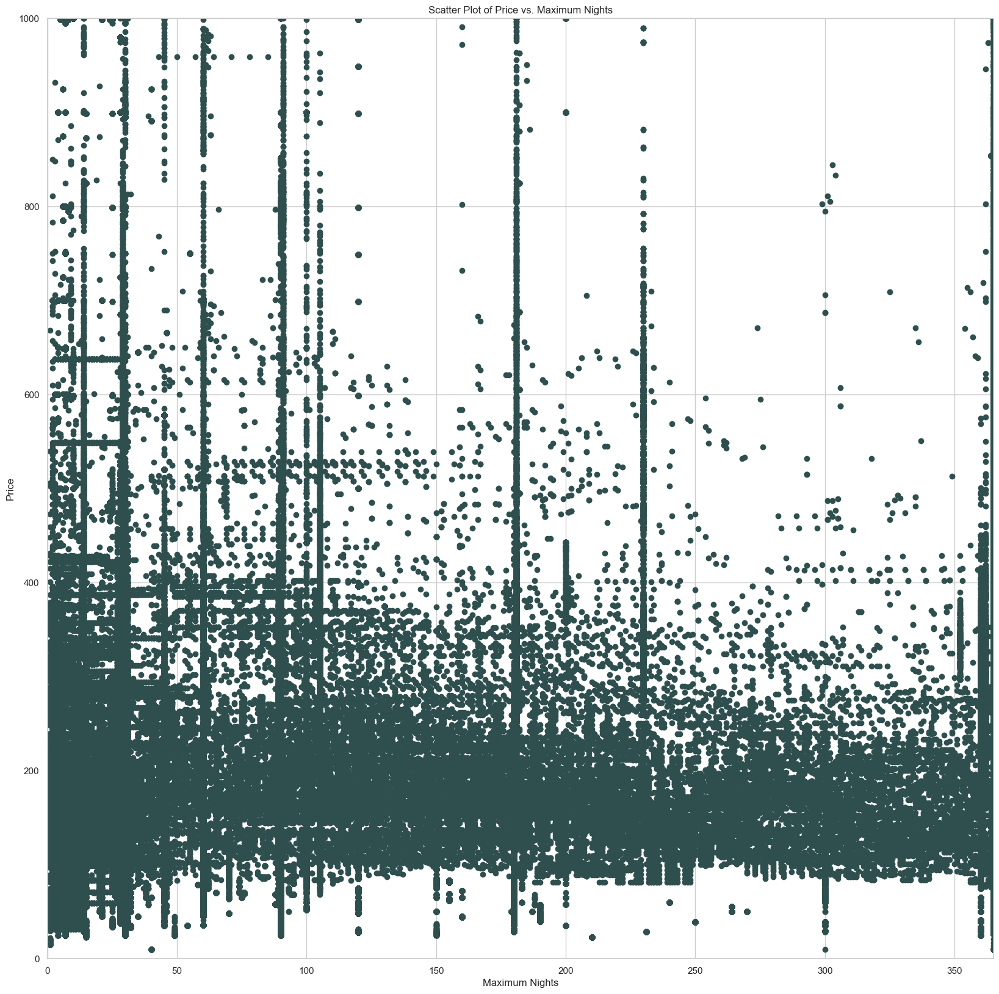

In [236]:
figure = plt.figure(figsize=(20, 20))

axes = figure.add_subplot(1, 1, 1)
axes.scatter(cal_listing_max_night_clean, cal_listing_price_round, marker="o", color="darkslategray")

axes.set_ylabel("Price")
axes.set_xlabel("Maximum Nights")
axes.set_title("Scatter Plot of Price vs. Maximum Nights")

plt.xlim([0, 365])
plt.ylim([0, 1000])
plt.show()
plt.close()

We get a better sense of the bands in pricing vs. maximum nights. I'm not certain how useful this data is because it does not have a clear pattern. It's difficult to work with maximums because not of the behavior is not going to be captured in this variable. If we could learn what the average number of nights someone was booking a listing, that would be more helpful than a maximum. I think a host is more likely to adjust their price if they are seeing low average booking compared to availability over the maximum nights setting which is likely a default that most hosts just leave as is.

### <a id='cal_data_v_price'>Calendar Data v. Price Conclusion</a>
<todo>
The calendar data didn't yield any obvious relationships to price.


## <a id='crimes_v_price'>Crimes v. Price</a>
We expect that areas with higher crime will be less desirable, leading to a lower price. There is the possibility that areas more heavily affected by crime will not be represented in the data set, resulting in a survivorship bias.

### `total crimes` vs `price` <a id="total_crimes_vs_price"></a>
[back to list](#pairwise)

The first comparison of crime and price will be the total count of crimes per neighborhood to price. 

In [ ]:
rel = con.execute("select * from crimes")
crimes = rel.df()

In [ ]:
crimes

,column00,NEIGHBORHOOD_CLUSTER,offensegroup,LONGITUDE,END_DATE,offense-text,SHIFT,offensekey,START_DATE,OFFENSE,METHOD,LATITUDE,NEIGHBORHOOD_NAME
0,0,cluster 25,violent,-77.002778,"9/7/2021, 2:18:00 PM",homicide,midnight,violent|homicide,2021-09-07,homicide,others,38.897331,"Union Station, Stanton Park, Kingman Park"
1,1,cluster 26,violent,-76.997326,"10/3/2021, 3:20:00 PM",robbery,evening,violent|robbery,2021-10-03,robbery,others,38.881269,"Capitol Hill, Lincoln Park"
2,2,cluster 35,violent,-76.964260,"10/3/2021, 6:40:00 PM",robbery,evening,violent|robbery,2021-10-03,robbery,gun,38.858661,"Fairfax Village, Naylor Gardens, Hillcrest, Su..."
3,3,cluster 39,violent,-76.999896,"10/11/2021, 8:52:00 PM",assault w/dangerous weapon,midnight,violent|assault w/dangerous weapon,2021-10-11,assault w/dangerous weapon,others,38.831632,"Congress Heights, Bellevue, Washington Highlands"
4,4,cluster 2,property,-77.025347,"10/2/2021, 11:01:00 PM",theft f/auto,evening,property|theft f/auto,2021-10-02,theft f/auto,others,38.922290,"Columbia Heights, Mt. Pleasant, Pleasant Plain..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...
27606,27606,cluster 1,property,-77.042324,"7/21/2022, 7:00:00 PM",theft/other,midnight,property|theft/other,2022-07-21,theft/other,others,38.926303,"Kalorama Heights, Adams Morgan, Lanier Heights"
27607,27607,cluster 1,property,-77.042369,"8/12/2022, 6:30:00 AM",theft/other,midnight,property|theft/other,2022-08-11,theft/other,others,38.924303,"Kalorama Heights, Adams Morgan, Lanier Heights"
27608,27608,cluster 26,property,-76.994963,"8/12/2022, 9:00:00 AM",theft f/auto,midnight,property|theft f/auto,2022-08-12,theft f/auto,others,38.891322,"Capitol Hill, Lincoln Park"
27609,27609,cluster 11,property,-77.081165,"5/31/2022, 7:00:00 AM",theft f/auto,day,property|theft f/auto,2022-05-26,theft f/auto,others,38.955947,"Friendship Heights, American University Park, ..."


A new column is added that has the count of crimes for each neighborhood.

In [ ]:
crimes["total_crimes"] = crimes.groupby("NEIGHBORHOOD_NAME")["NEIGHBORHOOD_NAME"].transform('count')

In [ ]:
crimes

,column00,NEIGHBORHOOD_CLUSTER,offensegroup,LONGITUDE,END_DATE,offense-text,SHIFT,offensekey,START_DATE,OFFENSE,METHOD,LATITUDE,NEIGHBORHOOD_NAME,total_crimes
0,0,cluster 25,violent,-77.002778,"9/7/2021, 2:18:00 PM",homicide,midnight,violent|homicide,2021-09-07,homicide,others,38.897331,"Union Station, Stanton Park, Kingman Park",2070
1,1,cluster 26,violent,-76.997326,"10/3/2021, 3:20:00 PM",robbery,evening,violent|robbery,2021-10-03,robbery,others,38.881269,"Capitol Hill, Lincoln Park",1095
2,2,cluster 35,violent,-76.964260,"10/3/2021, 6:40:00 PM",robbery,evening,violent|robbery,2021-10-03,robbery,gun,38.858661,"Fairfax Village, Naylor Gardens, Hillcrest, Su...",315
3,3,cluster 39,violent,-76.999896,"10/11/2021, 8:52:00 PM",assault w/dangerous weapon,midnight,violent|assault w/dangerous weapon,2021-10-11,assault w/dangerous weapon,others,38.831632,"Congress Heights, Bellevue, Washington Highlands",990
4,4,cluster 2,property,-77.025347,"10/2/2021, 11:01:00 PM",theft f/auto,evening,property|theft f/auto,2021-10-02,theft f/auto,others,38.922290,"Columbia Heights, Mt. Pleasant, Pleasant Plain...",1788
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27606,27606,cluster 1,property,-77.042324,"7/21/2022, 7:00:00 PM",theft/other,midnight,property|theft/other,2022-07-21,theft/other,others,38.926303,"Kalorama Heights, Adams Morgan, Lanier Heights",729
27607,27607,cluster 1,property,-77.042369,"8/12/2022, 6:30:00 AM",theft/other,midnight,property|theft/other,2022-08-11,theft/other,others,38.924303,"Kalorama Heights, Adams Morgan, Lanier Heights",729
27608,27608,cluster 26,property,-76.994963,"8/12/2022, 9:00:00 AM",theft f/auto,midnight,property|theft f/auto,2022-08-12,theft f/auto,others,38.891322,"Capitol Hill, Lincoln Park",1095
27609,27609,cluster 11,property,-77.081165,"5/31/2022, 7:00:00 AM",theft f/auto,day,property|theft f/auto,2022-05-26,theft f/auto,others,38.955947,"Friendship Heights, American University Park, ...",365


Next we want to be able to compare prices to crime so we have to add prices to the same dataframe. As the listing ids aren't going to be useful for the crimes database, the average for each neighborhood will be used. Any rows with NAs are dropped. 

In [ ]:
prices = latest_listings[["id", "price", "neighbourhood_cleansed"]]
prices = prices.dropna()
prices

,id,price,neighbourhood_cleansed
0,3686,67.0,Historic Anacostia
1,841260,39.0,"Brightwood Park, Crestwood, Petworth"
2,3943,75.0,"Edgewood, Bloomingdale, Truxton Circle, Eckington"
3,842418,250.0,"Downtown, Chinatown, Penn Quarters, Mount Vern..."
4,860336,113.0,"Dupont Circle, Connecticut Avenue/K Street"
...,...,...,...
10555,575127175076906151,224.0,"Shaw, Logan Circle"
10556,576837177349185342,187.0,"Ivy City, Arboretum, Trinidad, Carver Langston"
10557,583504299700938360,305.0,"Deanwood, Burrville, Grant Park, Lincoln Heigh..."
10558,48252468,192.0,"Colonial Village, Shepherd Park, North Portal ..."


A new column is added:

In [ ]:
prices["avg_price"] = prices.groupby("neighbourhood_cleansed")["price"].transform("mean")
prices

,id,price,neighbourhood_cleansed,avg_price
0,3686,67.0,Historic Anacostia,151.233766
1,841260,39.0,"Brightwood Park, Crestwood, Petworth",142.733591
2,3943,75.0,"Edgewood, Bloomingdale, Truxton Circle, Eckington",171.148545
3,842418,250.0,"Downtown, Chinatown, Penn Quarters, Mount Vern...",254.383929
4,860336,113.0,"Dupont Circle, Connecticut Avenue/K Street",262.198238
...,...,...,...,...
10555,575127175076906151,224.0,"Shaw, Logan Circle",223.815951
10556,576837177349185342,187.0,"Ivy City, Arboretum, Trinidad, Carver Langston",166.836812
10557,583504299700938360,305.0,"Deanwood, Burrville, Grant Park, Lincoln Heigh...",124.220690
10558,48252468,192.0,"Colonial Village, Shepherd Park, North Portal ...",144.356784


Only using the relevant columns and removing duplicates:

In [ ]:
price_neigh  = prices[["neighbourhood_cleansed", "avg_price"]]
price_neigh = price_neigh.drop_duplicates()
price_neigh

,neighbourhood_cleansed,avg_price
0,Historic Anacostia,151.233766
1,"Brightwood Park, Crestwood, Petworth",142.733591
2,"Edgewood, Bloomingdale, Truxton Circle, Eckington",171.148545
3,"Downtown, Chinatown, Penn Quarters, Mount Vern...",254.383929
4,"Dupont Circle, Connecticut Avenue/K Street",262.198238
5,"Howard University, Le Droit Park, Cardozo/Shaw",203.638961
6,"Douglas, Shipley Terrace",161.063830
7,"Lamont Riggs, Queens Chapel, Fort Totten, Plea...",132.696970
8,"Columbia Heights, Mt. Pleasant, Pleasant Plain...",155.922889
9,"Friendship Heights, American University Park, ...",157.533333


Adding the price column to the crimes dataframe:

In [ ]:
crimes = crimes.join(price_neigh.set_index("neighbourhood_cleansed"), on="NEIGHBORHOOD_NAME")
crimes = crimes.dropna()

In [ ]:
crimes.head()

,column00,NEIGHBORHOOD_CLUSTER,offensegroup,LONGITUDE,END_DATE,offense-text,SHIFT,offensekey,START_DATE,OFFENSE,METHOD,LATITUDE,NEIGHBORHOOD_NAME,total_crimes,avg_price
0,0,cluster 25,violent,-77.002778,"9/7/2021, 2:18:00 PM",homicide,midnight,violent|homicide,2021-09-07,homicide,others,38.897331,"Union Station, Stanton Park, Kingman Park",2070,213.681243
1,1,cluster 26,violent,-76.997326,"10/3/2021, 3:20:00 PM",robbery,evening,violent|robbery,2021-10-03,robbery,others,38.881269,"Capitol Hill, Lincoln Park",1095,230.157343
2,2,cluster 35,violent,-76.964260,"10/3/2021, 6:40:00 PM",robbery,evening,violent|robbery,2021-10-03,robbery,gun,38.858661,"Fairfax Village, Naylor Gardens, Hillcrest, Su...",315,123.060606
3,3,cluster 39,violent,-76.999896,"10/11/2021, 8:52:00 PM",assault w/dangerous weapon,midnight,violent|assault w/dangerous weapon,2021-10-11,assault w/dangerous weapon,others,38.831632,"Congress Heights, Bellevue, Washington Highlands",990,106.824561
4,4,cluster 2,property,-77.025347,"10/2/2021, 11:01:00 PM",theft f/auto,evening,property|theft f/auto,2021-10-02,theft f/auto,others,38.922290,"Columbia Heights, Mt. Pleasant, Pleasant Plain...",1788,155.922889


Now we have average price and total crime counts per neighborhood. 

In [ ]:
total_crimes = crimes["total_crimes"]
avg_price = crimes["avg_price"]

In [ ]:
print("r   = ", stats.pearsonr(avg_price, total_crimes)[0])
print("rho = ", stats.spearmanr(avg_price, total_crimes)[0])

r   =  0.27412944848629983
rho =  0.33422917462614293


This is not a very strong correlation, though it is positive. It's possible that higher crimes and higher prices are correlated simply because of population density, but we would need more data to determine that relationship.

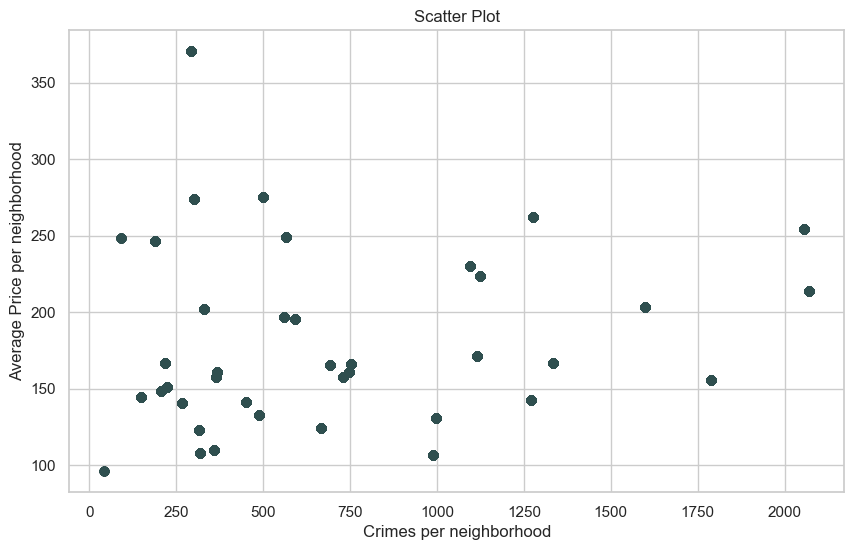

In [ ]:
figure = plt.figure(figsize=(10, 6))

axes = figure.add_subplot(1, 1, 1)
axes.scatter(total_crimes, avg_price, marker="o", color="darkslategray")

axes.set_ylabel("Average Price per neighborhood")
axes.set_xlabel("Crimes per neighborhood")
axes.set_title("Scatter Plot")

plt.show()
plt.close()

The slight correlation is visible here, though it is slight.

### `total types of crimes` vs `price` <a id="total_types_crimes_vs_price"></a>  
[back to list](#pairwise)

This is the total of each type of crime versus price. 

In [ ]:
crimes.head()

,column00,NEIGHBORHOOD_CLUSTER,offensegroup,LONGITUDE,END_DATE,offense-text,SHIFT,offensekey,START_DATE,OFFENSE,METHOD,LATITUDE,NEIGHBORHOOD_NAME,total_crimes,avg_price
0,0,cluster 25,violent,-77.002778,"9/7/2021, 2:18:00 PM",homicide,midnight,violent|homicide,2021-09-07,homicide,others,38.897331,"Union Station, Stanton Park, Kingman Park",2070,213.681243
1,1,cluster 26,violent,-76.997326,"10/3/2021, 3:20:00 PM",robbery,evening,violent|robbery,2021-10-03,robbery,others,38.881269,"Capitol Hill, Lincoln Park",1095,230.157343
2,2,cluster 35,violent,-76.964260,"10/3/2021, 6:40:00 PM",robbery,evening,violent|robbery,2021-10-03,robbery,gun,38.858661,"Fairfax Village, Naylor Gardens, Hillcrest, Su...",315,123.060606
3,3,cluster 39,violent,-76.999896,"10/11/2021, 8:52:00 PM",assault w/dangerous weapon,midnight,violent|assault w/dangerous weapon,2021-10-11,assault w/dangerous weapon,others,38.831632,"Congress Heights, Bellevue, Washington Highlands",990,106.824561
4,4,cluster 2,property,-77.025347,"10/2/2021, 11:01:00 PM",theft f/auto,evening,property|theft f/auto,2021-10-02,theft f/auto,others,38.922290,"Columbia Heights, Mt. Pleasant, Pleasant Plain...",1788,155.922889


We want to look at the each offense. 

In [ ]:
crimes = pd.concat([crimes, pd.get_dummies(crimes["OFFENSE"], prefix="offense")], axis=1)

Renaming the columns.

In [ ]:
crimes = crimes.rename(columns={"offense_assault w/dangerous weapon":"offense_assault_dangerous_weapon", "offense_motor vehicle theft":"offense_motor_vehicle_theft", "offense_sex abuse":"offense_sex_abuse", "offense_theft f/auto":"offense_theft_auto", "offense_theft/other":"offense_theft_other"})
crimes

,column00,NEIGHBORHOOD_CLUSTER,offensegroup,LONGITUDE,END_DATE,offense-text,SHIFT,offensekey,START_DATE,OFFENSE,...,avg_price,offense_arson,offense_assault_dangerous_weapon,offense_burglary,offense_homicide,offense_motor_vehicle_theft,offense_robbery,offense_sex_abuse,offense_theft_auto,offense_theft_other
0,0,cluster 25,violent,-77.002778,"9/7/2021, 2:18:00 PM",homicide,midnight,violent|homicide,2021-09-07,homicide,...,213.681243,0,0,0,1,0,0,0,0,0
1,1,cluster 26,violent,-76.997326,"10/3/2021, 3:20:00 PM",robbery,evening,violent|robbery,2021-10-03,robbery,...,230.157343,0,0,0,0,0,1,0,0,0
2,2,cluster 35,violent,-76.964260,"10/3/2021, 6:40:00 PM",robbery,evening,violent|robbery,2021-10-03,robbery,...,123.060606,0,0,0,0,0,1,0,0,0
3,3,cluster 39,violent,-76.999896,"10/11/2021, 8:52:00 PM",assault w/dangerous weapon,midnight,violent|assault w/dangerous weapon,2021-10-11,assault w/dangerous weapon,...,106.824561,0,1,0,0,0,0,0,0,0
4,4,cluster 2,property,-77.025347,"10/2/2021, 11:01:00 PM",theft f/auto,evening,property|theft f/auto,2021-10-02,theft f/auto,...,155.922889,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27606,27606,cluster 1,property,-77.042324,"7/21/2022, 7:00:00 PM",theft/other,midnight,property|theft/other,2022-07-21,theft/other,...,157.829480,0,0,0,0,0,0,0,0,1
27607,27607,cluster 1,property,-77.042369,"8/12/2022, 6:30:00 AM",theft/other,midnight,property|theft/other,2022-08-11,theft/other,...,157.829480,0,0,0,0,0,0,0,0,1
27608,27608,cluster 26,property,-76.994963,"8/12/2022, 9:00:00 AM",theft f/auto,midnight,property|theft f/auto,2022-08-12,theft f/auto,...,230.157343,0,0,0,0,0,0,0,1,0
27609,27609,cluster 11,property,-77.081165,"5/31/2022, 7:00:00 AM",theft f/auto,day,property|theft f/auto,2022-05-26,theft f/auto,...,157.533333,0,0,0,0,0,0,0,1,0


In [ ]:
crimes["OFFENSE"].unique()

array(['homicide', 'robbery', 'assault w/dangerous weapon',
       'theft f/auto', 'theft/other', 'motor vehicle theft', 'burglary',
       'sex abuse', 'arson'], dtype=object)

Now taking the average for each neighborhood per offense. 

In [ ]:
crimes["total_offense_arson"] = crimes.groupby("NEIGHBORHOOD_NAME")["offense_arson"].transform("sum")

In [ ]:
crimes["total_offense_assault_dangerous_weapon"] = crimes.groupby("NEIGHBORHOOD_NAME")["offense_assault_dangerous_weapon"].transform("sum")

In [ ]:
crimes["total_offense_burglary"] = crimes.groupby("NEIGHBORHOOD_NAME")["offense_burglary"].transform("sum")

In [ ]:
crimes["total_offense_homicide"] = crimes.groupby("NEIGHBORHOOD_NAME")["offense_homicide"].transform("sum")

In [ ]:
crimes["total_offense_motor_vehicle_theft"] = crimes.groupby("NEIGHBORHOOD_NAME")["offense_motor_vehicle_theft"].transform("sum")

In [ ]:
crimes["total_offense_robbery"] = crimes.groupby("NEIGHBORHOOD_NAME")["offense_robbery"].transform("sum")

In [ ]:
crimes["total_offense_sex_abuse"] = crimes.groupby("NEIGHBORHOOD_NAME")["offense_sex_abuse"].transform("sum")

In [ ]:
crimes["total_offense_theft_auto"] = crimes.groupby("NEIGHBORHOOD_NAME")["offense_theft_auto"].transform("sum")

In [ ]:
crimes["total_offense_theft_other"] = crimes.groupby("NEIGHBORHOOD_NAME")["offense_theft_other"].transform("sum")

In [ ]:
crimes.head()

,column00,NEIGHBORHOOD_CLUSTER,offensegroup,LONGITUDE,END_DATE,offense-text,SHIFT,offensekey,START_DATE,OFFENSE,...,offense_theft_other,total_offense_arson,total_offense_assault_dangerous_weapon,total_offense_burglary,total_offense_homicide,total_offense_motor_vehicle_theft,total_offense_robbery,total_offense_sex_abuse,total_offense_theft_auto,total_offense_theft_other
0,0,cluster 25,violent,-77.002778,"9/7/2021, 2:18:00 PM",homicide,midnight,violent|homicide,2021-09-07,homicide,...,0,0,55,78,8,349.0,139,12,521.0,772.0
1,1,cluster 26,violent,-76.997326,"10/3/2021, 3:20:00 PM",robbery,evening,violent|robbery,2021-10-03,robbery,...,0,1,23,36,4,110.0,82,3,283.0,503.0
2,2,cluster 35,violent,-76.964260,"10/3/2021, 6:40:00 PM",robbery,evening,violent|robbery,2021-10-03,robbery,...,0,0,13,8,3,42.0,33,2,100.0,85.0
3,3,cluster 39,violent,-76.999896,"10/11/2021, 8:52:00 PM",assault w/dangerous weapon,midnight,violent|assault w/dangerous weapon,2021-10-11,assault w/dangerous weapon,...,0,1,132,50,27,160.0,109,7,135.0,213.0
4,4,cluster 2,property,-77.025347,"10/2/2021, 11:01:00 PM",theft f/auto,evening,property|theft f/auto,2021-10-02,theft f/auto,...,0,0,51,51,5,182.0,131,6,516.0,703.0


In [ ]:
offense_sum = crimes["total_offense_arson"]

In [ ]:
print("r   = ", stats.pearsonr(avg_price, offense_sum)[0])
print("rho = ", stats.spearmanr(avg_price, offense_sum)[0])

r   =  -0.11866420773468095
rho =  -0.0629486848558514


There is a slight negative correlation between arson crimes and average price. 

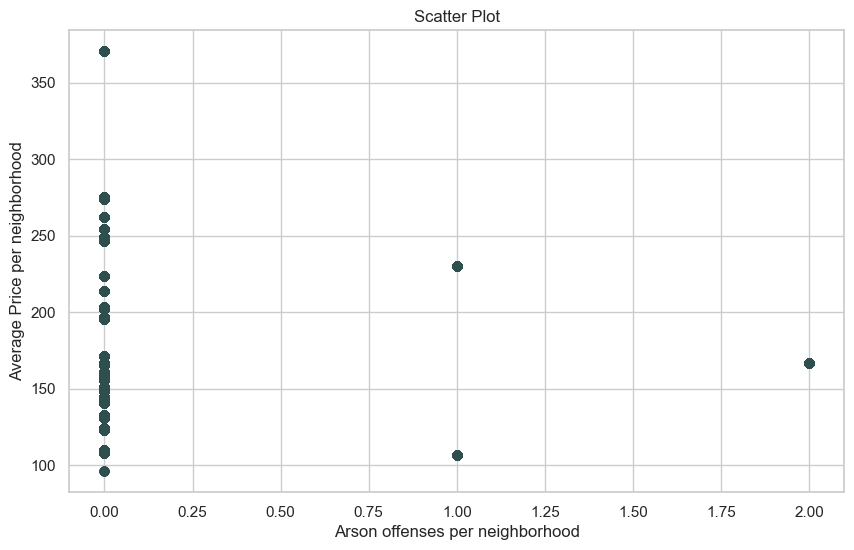

In [ ]:
figure = plt.figure(figsize=(10, 6))

axes = figure.add_subplot(1, 1, 1)
axes.scatter(offense_sum, avg_price, marker="o", color="darkslategray")

axes.set_ylabel("Average Price per neighborhood")
axes.set_xlabel("Arson offenses per neighborhood")
axes.set_title("Scatter Plot")

plt.show()
plt.close()

There are too few arson offenses to really draw conclusions. 

In [ ]:
offense_sum = crimes["total_offense_assault_dangerous_weapon"]

In [ ]:
print("r   = ", stats.pearsonr(avg_price, offense_sum)[0])
print("rho = ", stats.spearmanr(avg_price, offense_sum)[0])

r   =  -0.3407583655881117
rho =  -0.19319826732628786


There is a slight positive correlation between assault with a dangerous weapon crimes and average price. 

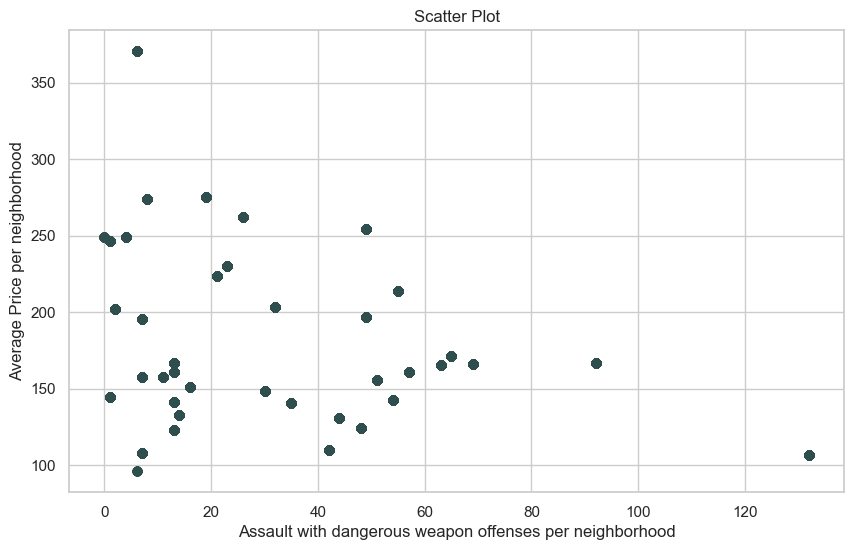

In [ ]:
figure = plt.figure(figsize=(10, 6))

axes = figure.add_subplot(1, 1, 1)
axes.scatter(offense_sum, avg_price, marker="o", color="darkslategray")

axes.set_ylabel("Average Price per neighborhood")
axes.set_xlabel("Assault with dangerous weapon offenses per neighborhood")
axes.set_title("Scatter Plot")

plt.show()
plt.close()

There is a slight positive correlation. It's possible that, similar to total crimes, the more populous or dense a neighborhood is, the more crime there is and the higher the prices, but without price depending on crime or vice versa. 

In [ ]:
offense_sum = crimes["total_offense_burglary"]

In [ ]:
print("r   = ", stats.pearsonr(avg_price, offense_sum)[0])
print("rho = ", stats.spearmanr(avg_price, offense_sum)[0])

r   =  0.07607149159269273
rho =  0.12415044676181282


There is a slight positive correlation between burglary crimes and average price. 

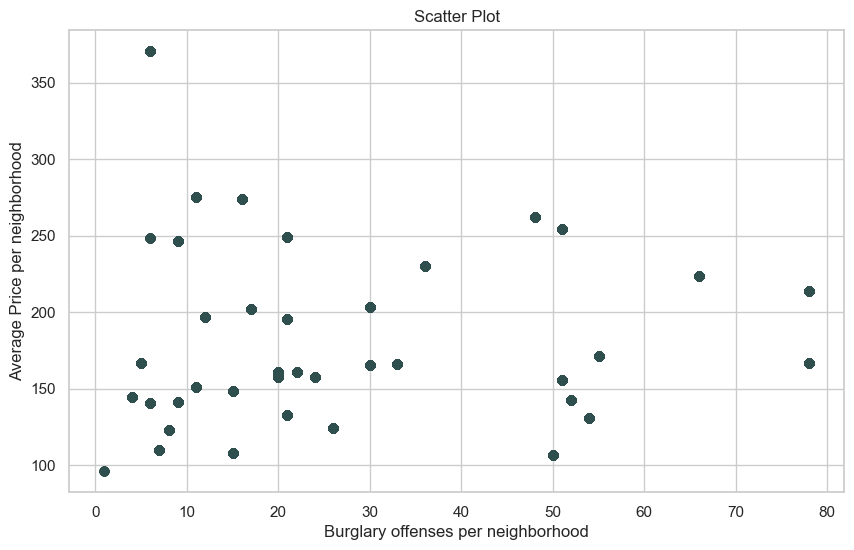

In [ ]:
figure = plt.figure(figsize=(10, 6))

axes = figure.add_subplot(1, 1, 1)
axes.scatter(offense_sum, avg_price, marker="o", color="darkslategray")

axes.set_ylabel("Average Price per neighborhood")
axes.set_xlabel("Burglary offenses per neighborhood")
axes.set_title("Scatter Plot")

plt.show()
plt.close()

There is possibly a very slight positive correlation. 

In [ ]:
offense_sum = crimes["total_offense_homicide"]

In [ ]:
print("r   = ", stats.pearsonr(avg_price, offense_sum)[0])
print("rho = ", stats.spearmanr(avg_price, offense_sum)[0])

r   =  -0.4522426066294376
rho =  -0.4193329909486742


There is a medium negative correlation between homicide crimes and average price. 

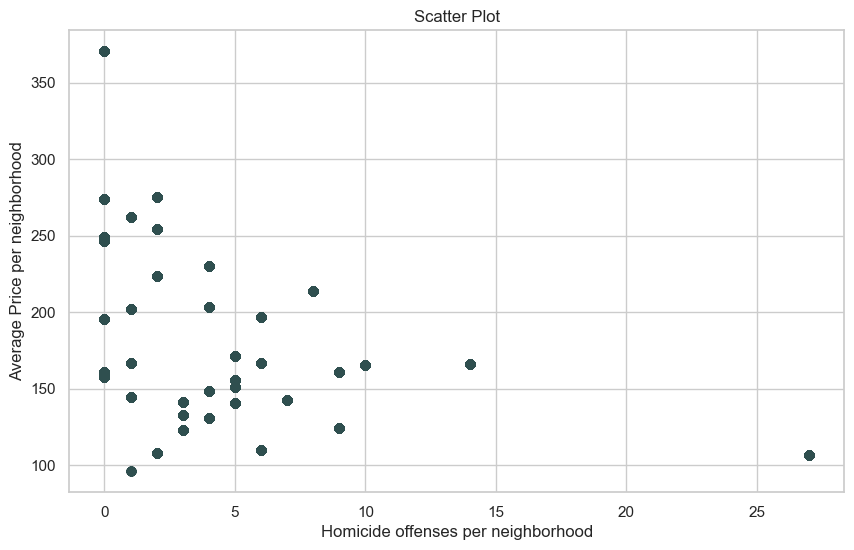

In [ ]:
figure = plt.figure(figsize=(10, 6))

axes = figure.add_subplot(1, 1, 1)
axes.scatter(offense_sum, avg_price, marker="o", color="darkslategray")

axes.set_ylabel("Average Price per neighborhood")
axes.set_xlabel("Homicide offenses per neighborhood")
axes.set_title("Scatter Plot")

plt.show()
plt.close()

There does appear to be a negative correlation between homicide and price. 

In [ ]:
offense_sum = crimes["total_offense_motor_vehicle_theft"]

In [ ]:
print("r   = ", stats.pearsonr(avg_price, offense_sum)[0])
print("rho = ", stats.spearmanr(avg_price, offense_sum)[0])

r   =  0.08516232954716864
rho =  0.11592847942971346


There is a slight positive correlation between motor vehicle theft crimes and average price. 

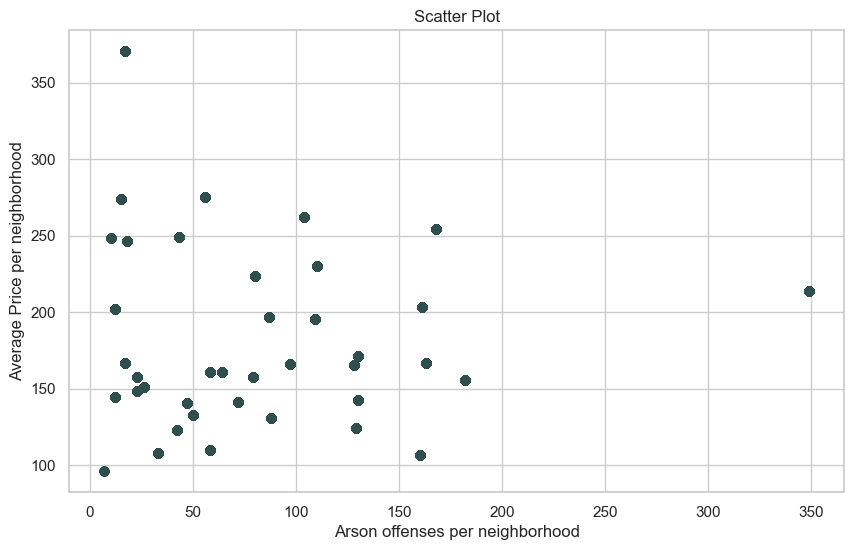

In [ ]:
figure = plt.figure(figsize=(10, 6))

axes = figure.add_subplot(1, 1, 1)
axes.scatter(offense_sum, avg_price, marker="o", color="darkslategray")

axes.set_ylabel("Average Price per neighborhood")
axes.set_xlabel("Arson offenses per neighborhood")
axes.set_title("Scatter Plot")

plt.show()
plt.close()

There does not appear to be a strong correlation. 

In [ ]:
offense_sum = crimes["total_offense_robbery"]

In [ ]:
print("r   = ", stats.pearsonr(avg_price, offense_sum)[0])
print("rho = ", stats.spearmanr(avg_price, offense_sum)[0])

r   =  -0.08478055618637731
rho =  0.01861935538151312


There is a slight negative correlation between robbery crimes and average price. 

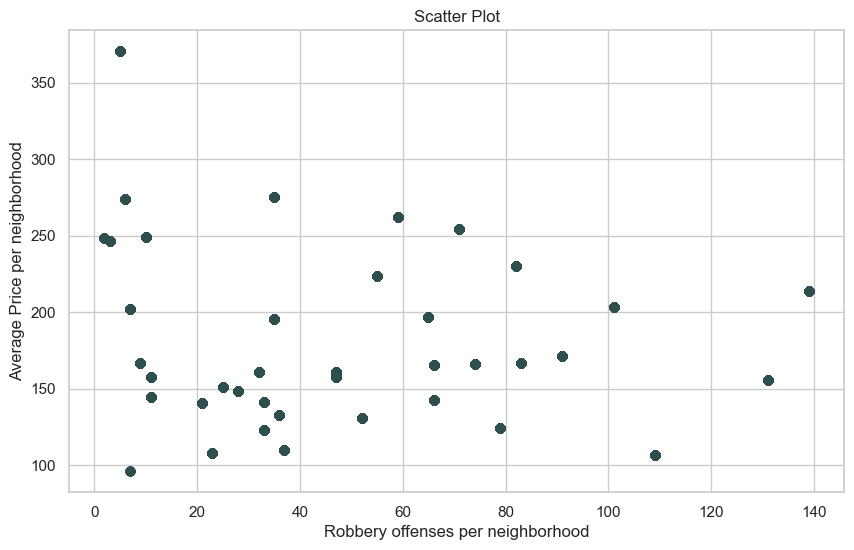

In [ ]:
figure = plt.figure(figsize=(10, 6))

axes = figure.add_subplot(1, 1, 1)
axes.scatter(offense_sum, avg_price, marker="o", color="darkslategray")

axes.set_ylabel("Average Price per neighborhood")
axes.set_xlabel("Robbery offenses per neighborhood")
axes.set_title("Scatter Plot")

plt.show()
plt.close()

There is not an obvious correlation. 

In [ ]:
offense_sum = crimes["total_offense_sex_abuse"]

In [ ]:
print("r   = ", stats.pearsonr(avg_price, offense_sum)[0])
print("rho = ", stats.spearmanr(avg_price, offense_sum)[0])

r   =  0.08486037004194362
rho =  0.21899182451401208


There is a slight positive correlation between sex abuse crimes and average price. 

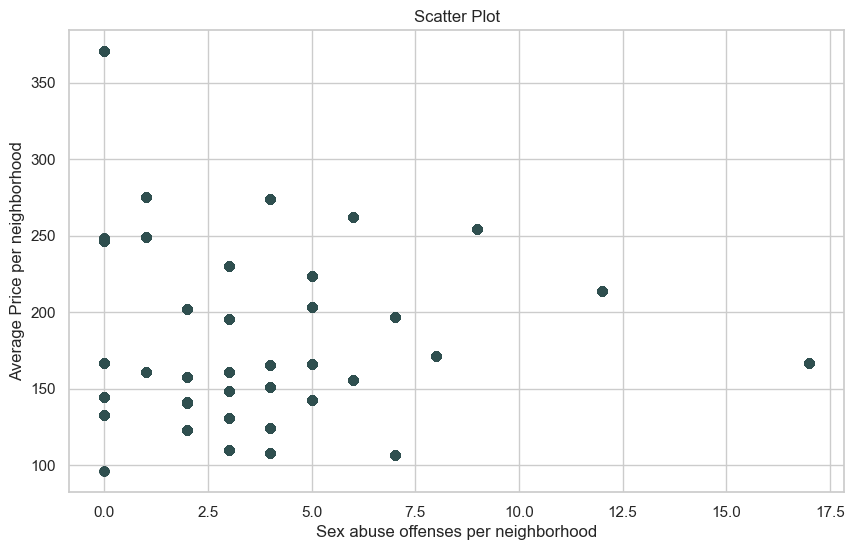

In [ ]:
figure = plt.figure(figsize=(10, 6))

axes = figure.add_subplot(1, 1, 1)
axes.scatter(offense_sum, avg_price, marker="o", color="darkslategray")

axes.set_ylabel("Average Price per neighborhood")
axes.set_xlabel("Sex abuse offenses per neighborhood")
axes.set_title("Scatter Plot")

plt.show()
plt.close()

Just based on the chart there would appear to be a slight negative correlation, though it is probably that there is not enough data or there is not a correlation. 

In [ ]:
offense_sum = crimes["total_offense_theft_auto"]

In [ ]:
print("r   = ", stats.pearsonr(avg_price, offense_sum)[0])
print("rho = ", stats.spearmanr(avg_price, offense_sum)[0])

r   =  0.28750469985174165
rho =  0.35221021086374615


There is a slight/medium positive correlation between auto theft crimes and average price. 

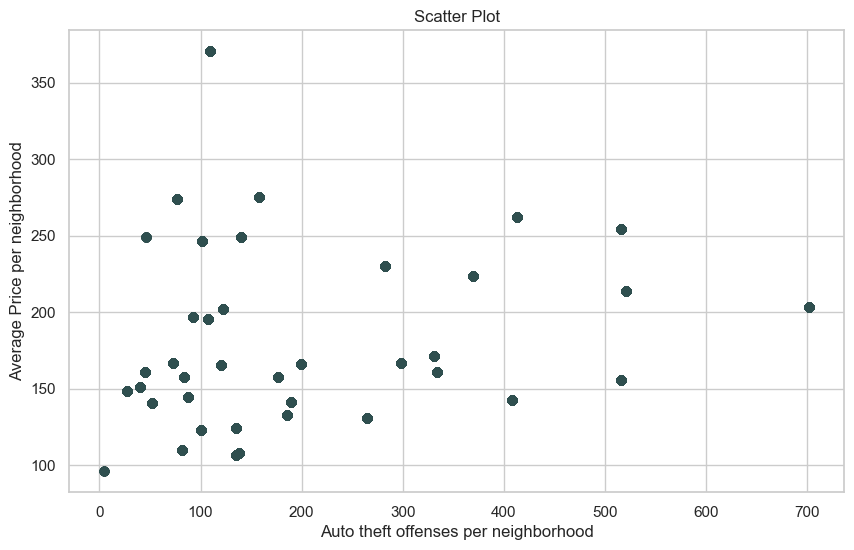

In [ ]:
figure = plt.figure(figsize=(10, 6))

axes = figure.add_subplot(1, 1, 1)
axes.scatter(offense_sum, avg_price, marker="o", color="darkslategray")

axes.set_ylabel("Average Price per neighborhood")
axes.set_xlabel("Auto theft offenses per neighborhood")
axes.set_title("Scatter Plot")

plt.show()
plt.close()

There appears to be a slight positive correlation. 

In [ ]:
offense_sum = crimes["total_offense_theft_other"]

In [ ]:
print("r   = ", stats.pearsonr(avg_price, offense_sum)[0])
print("rho = ", stats.spearmanr(avg_price, offense_sum)[0])

r   =  0.42715443232910466
rho =  0.47560561790571704


There is a medium positive correlation between other theft crimes and average price. 

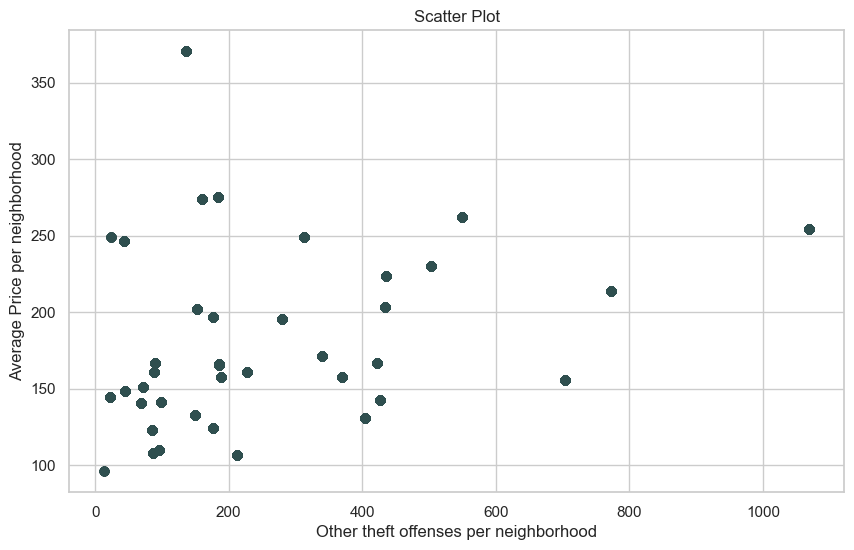

In [ ]:
figure = plt.figure(figsize=(10, 6))

axes = figure.add_subplot(1, 1, 1)
axes.scatter(offense_sum, avg_price, marker="o", color="darkslategray")

axes.set_ylabel("Average Price per neighborhood")
axes.set_xlabel("Other theft offenses per neighborhood")
axes.set_title("Scatter Plot")

plt.show()
plt.close()

There does appear to be a slight positive correlation. 

Overall there appear to be some crimes that do show a correlation between average price per neighborhood and total offenses per neighborhood. There are some offenses that do not appear to have a correlation. However, we don't know if there are unknown confounding variables, so it may be unhelpful to use these variables in the model. 

### `offense types` vs `price` <a id="offense_type_vs_price"></a>  
[back to list](#pairwise)

This is if the crime is a property crime or a violent crimes. The sums of each per neighbohood will be added as columns.

In [ ]:
crimes.head()

,column00,NEIGHBORHOOD_CLUSTER,offensegroup,LONGITUDE,END_DATE,offense-text,SHIFT,offensekey,START_DATE,OFFENSE,...,offense_theft_other,total_offense_arson,total_offense_assault_dangerous_weapon,total_offense_burglary,total_offense_homicide,total_offense_motor_vehicle_theft,total_offense_robbery,total_offense_sex_abuse,total_offense_theft_auto,total_offense_theft_other
0,0,cluster 25,violent,-77.002778,"9/7/2021, 2:18:00 PM",homicide,midnight,violent|homicide,2021-09-07,homicide,...,0,0,55,78,8,349.0,139,12,521.0,772.0
1,1,cluster 26,violent,-76.997326,"10/3/2021, 3:20:00 PM",robbery,evening,violent|robbery,2021-10-03,robbery,...,0,1,23,36,4,110.0,82,3,283.0,503.0
2,2,cluster 35,violent,-76.964260,"10/3/2021, 6:40:00 PM",robbery,evening,violent|robbery,2021-10-03,robbery,...,0,0,13,8,3,42.0,33,2,100.0,85.0
3,3,cluster 39,violent,-76.999896,"10/11/2021, 8:52:00 PM",assault w/dangerous weapon,midnight,violent|assault w/dangerous weapon,2021-10-11,assault w/dangerous weapon,...,0,1,132,50,27,160.0,109,7,135.0,213.0
4,4,cluster 2,property,-77.025347,"10/2/2021, 11:01:00 PM",theft f/auto,evening,property|theft f/auto,2021-10-02,theft f/auto,...,0,0,51,51,5,182.0,131,6,516.0,703.0


Confirming that there are just the two expected values. 

In [ ]:
crimes["offensegroup"].unique()

array(['violent', 'property'], dtype=object)

Adding dummy variables. 

In [ ]:
crimes = pd.concat([crimes, pd.get_dummies(crimes["offensegroup"], prefix="off_type")], axis=1)

In [ ]:
crimes.head()

,column00,NEIGHBORHOOD_CLUSTER,offensegroup,LONGITUDE,END_DATE,offense-text,SHIFT,offensekey,START_DATE,OFFENSE,...,total_offense_assault_dangerous_weapon,total_offense_burglary,total_offense_homicide,total_offense_motor_vehicle_theft,total_offense_robbery,total_offense_sex_abuse,total_offense_theft_auto,total_offense_theft_other,off_type_property,off_type_violent
0,0,cluster 25,violent,-77.002778,"9/7/2021, 2:18:00 PM",homicide,midnight,violent|homicide,2021-09-07,homicide,...,55,78,8,349.0,139,12,521.0,772.0,0,1
1,1,cluster 26,violent,-76.997326,"10/3/2021, 3:20:00 PM",robbery,evening,violent|robbery,2021-10-03,robbery,...,23,36,4,110.0,82,3,283.0,503.0,0,1
2,2,cluster 35,violent,-76.964260,"10/3/2021, 6:40:00 PM",robbery,evening,violent|robbery,2021-10-03,robbery,...,13,8,3,42.0,33,2,100.0,85.0,0,1
3,3,cluster 39,violent,-76.999896,"10/11/2021, 8:52:00 PM",assault w/dangerous weapon,midnight,violent|assault w/dangerous weapon,2021-10-11,assault w/dangerous weapon,...,132,50,27,160.0,109,7,135.0,213.0,0,1
4,4,cluster 2,property,-77.025347,"10/2/2021, 11:01:00 PM",theft f/auto,evening,property|theft f/auto,2021-10-02,theft f/auto,...,51,51,5,182.0,131,6,516.0,703.0,1,0


Summing the values for each type per neighborhood.

In [ ]:
crimes["total_property"] = crimes.groupby("NEIGHBORHOOD_NAME")["off_type_property"].transform("sum")

In [ ]:
crimes["total_violent"] = crimes.groupby("NEIGHBORHOOD_NAME")["off_type_violent"].transform("sum")

In [ ]:
crimes.head()

,column00,NEIGHBORHOOD_CLUSTER,offensegroup,LONGITUDE,END_DATE,offense-text,SHIFT,offensekey,START_DATE,OFFENSE,...,total_offense_homicide,total_offense_motor_vehicle_theft,total_offense_robbery,total_offense_sex_abuse,total_offense_theft_auto,total_offense_theft_other,off_type_property,off_type_violent,total_property,total_violent
0,0,cluster 25,violent,-77.002778,"9/7/2021, 2:18:00 PM",homicide,midnight,violent|homicide,2021-09-07,homicide,...,8,349.0,139,12,521.0,772.0,0,1,1720.0,214.0
1,1,cluster 26,violent,-76.997326,"10/3/2021, 3:20:00 PM",robbery,evening,violent|robbery,2021-10-03,robbery,...,4,110.0,82,3,283.0,503.0,0,1,933.0,112.0
2,2,cluster 35,violent,-76.964260,"10/3/2021, 6:40:00 PM",robbery,evening,violent|robbery,2021-10-03,robbery,...,3,42.0,33,2,100.0,85.0,0,1,235.0,51.0
3,3,cluster 39,violent,-76.999896,"10/11/2021, 8:52:00 PM",assault w/dangerous weapon,midnight,violent|assault w/dangerous weapon,2021-10-11,assault w/dangerous weapon,...,27,160.0,109,7,135.0,213.0,0,1,559.0,275.0
4,4,cluster 2,property,-77.025347,"10/2/2021, 11:01:00 PM",theft f/auto,evening,property|theft f/auto,2021-10-02,theft f/auto,...,5,182.0,131,6,516.0,703.0,1,0,1452.0,193.0


In [ ]:
total_type = crimes["total_property"]

In [ ]:
print("r   = ", stats.pearsonr(avg_price, total_type)[0])
print("rho = ", stats.spearmanr(avg_price, total_type)[0])

r   =  0.3511584011434403
rho =  0.3852270390342173


There is a medium positive correlation between property crimes and average price. 

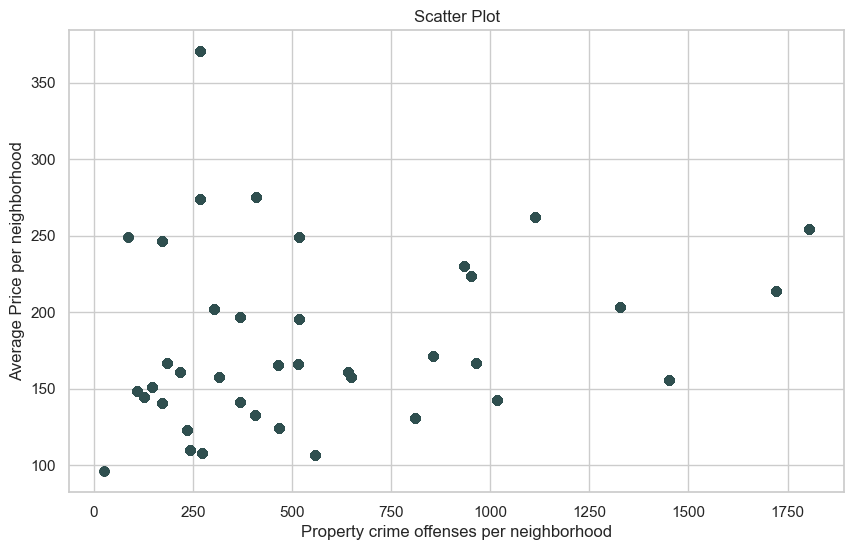

In [ ]:
figure = plt.figure(figsize=(10, 6))

axes = figure.add_subplot(1, 1, 1)
axes.scatter(total_type, avg_price, marker="o", color="darkslategray")

axes.set_ylabel("Average Price per neighborhood")
axes.set_xlabel("Property crime offenses per neighborhood")
axes.set_title("Scatter Plot")

plt.show()
plt.close()

There does appear to be a positive correlation. 

In [ ]:
total_type = crimes["total_violent"]

In [ ]:
print("r   = ", stats.pearsonr(avg_price, total_type)[0])
print("rho = ", stats.spearmanr(avg_price, total_type)[0])

r   =  -0.2260143766404761
rho =  -0.12378245872988368


There is a slight/medium negative correlation between violent crimes and average price. 

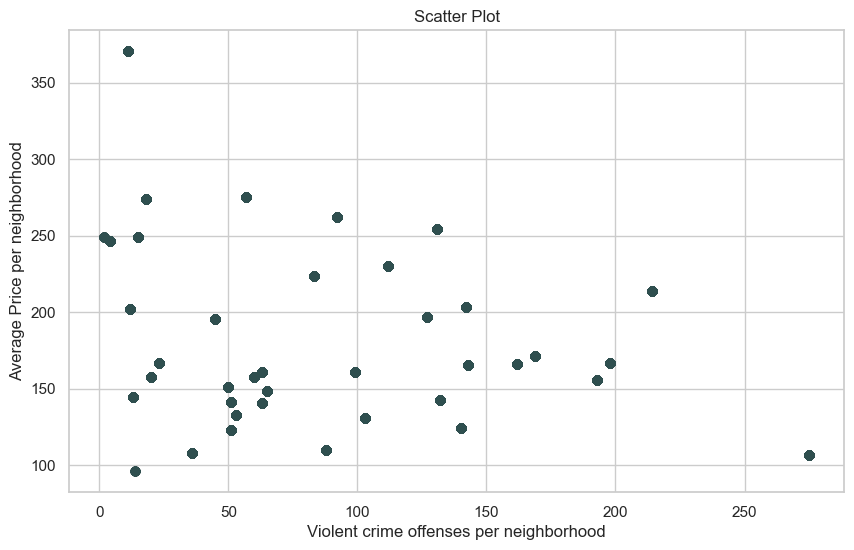

In [ ]:
figure = plt.figure(figsize=(10, 6))

axes = figure.add_subplot(1, 1, 1)
axes.scatter(total_type, avg_price, marker="o", color="darkslategray")

axes.set_ylabel("Average Price per neighborhood")
axes.set_xlabel("Violent crime offenses per neighborhood")
axes.set_title("Scatter Plot")

plt.show()
plt.close()

There does appear to be a negative correlation, though it appears less obvious than the property crime appears positive. 

Violent crimes appear to be negatively correlated with price and property crime positively correlated. This makes some intuitive sense, as areas with violent crime would not be popular with tourists, but areas of higher population density that attract property crime may still have higher prices. 

## `method` vs `price` <a id="method_vs_price"></a>  
[back to list](#pairwise)

The method of the crime will be compared to the price. 

In [ ]:
crimes["METHOD"].unique()

array(['others', 'gun', 'knife'], dtype=object)

The values for this variable are as expected, so we'll make dummy variables. 

In [ ]:
crimes = pd.concat([crimes, pd.get_dummies(crimes["METHOD"], prefix="method")], axis=1)

In [ ]:
crimes.head()

,column00,NEIGHBORHOOD_CLUSTER,offensegroup,LONGITUDE,END_DATE,offense-text,SHIFT,offensekey,START_DATE,OFFENSE,...,total_offense_sex_abuse,total_offense_theft_auto,total_offense_theft_other,off_type_property,off_type_violent,total_property,total_violent,method_gun,method_knife,method_others
0,0,cluster 25,violent,-77.002778,"9/7/2021, 2:18:00 PM",homicide,midnight,violent|homicide,2021-09-07,homicide,...,12,521.0,772.0,0,1,1720.0,214.0,0,0,1
1,1,cluster 26,violent,-76.997326,"10/3/2021, 3:20:00 PM",robbery,evening,violent|robbery,2021-10-03,robbery,...,3,283.0,503.0,0,1,933.0,112.0,0,0,1
2,2,cluster 35,violent,-76.964260,"10/3/2021, 6:40:00 PM",robbery,evening,violent|robbery,2021-10-03,robbery,...,2,100.0,85.0,0,1,235.0,51.0,1,0,0
3,3,cluster 39,violent,-76.999896,"10/11/2021, 8:52:00 PM",assault w/dangerous weapon,midnight,violent|assault w/dangerous weapon,2021-10-11,assault w/dangerous weapon,...,7,135.0,213.0,0,1,559.0,275.0,0,0,1
4,4,cluster 2,property,-77.025347,"10/2/2021, 11:01:00 PM",theft f/auto,evening,property|theft f/auto,2021-10-02,theft f/auto,...,6,516.0,703.0,1,0,1452.0,193.0,0,0,1


Summing the values for each method per neighborhood.

In [ ]:
crimes["total_gun"] = crimes.groupby("NEIGHBORHOOD_NAME")["method_gun"].transform("sum")

In [ ]:
crimes["total_knife"] = crimes.groupby("NEIGHBORHOOD_NAME")["method_knife"].transform("sum")

In [ ]:
crimes["total_others"] = crimes.groupby("NEIGHBORHOOD_NAME")["method_others"].transform("sum")

In [ ]:
crimes.head()

,column00,NEIGHBORHOOD_CLUSTER,offensegroup,LONGITUDE,END_DATE,offense-text,SHIFT,offensekey,START_DATE,OFFENSE,...,off_type_property,off_type_violent,total_property,total_violent,method_gun,method_knife,method_others,total_gun,total_knife,total_others
0,0,cluster 25,violent,-77.002778,"9/7/2021, 2:18:00 PM",homicide,midnight,violent|homicide,2021-09-07,homicide,...,0,1,1720.0,214.0,0,0,1,116,28,1790.0
1,1,cluster 26,violent,-76.997326,"10/3/2021, 3:20:00 PM",robbery,evening,violent|robbery,2021-10-03,robbery,...,0,1,933.0,112.0,0,0,1,57,9,979.0
2,2,cluster 35,violent,-76.964260,"10/3/2021, 6:40:00 PM",robbery,evening,violent|robbery,2021-10-03,robbery,...,0,1,235.0,51.0,1,0,0,42,2,242.0
3,3,cluster 39,violent,-76.999896,"10/11/2021, 8:52:00 PM",assault w/dangerous weapon,midnight,violent|assault w/dangerous weapon,2021-10-11,assault w/dangerous weapon,...,0,1,559.0,275.0,0,0,1,190,37,607.0
4,4,cluster 2,property,-77.025347,"10/2/2021, 11:01:00 PM",theft f/auto,evening,property|theft f/auto,2021-10-02,theft f/auto,...,1,0,1452.0,193.0,0,0,1,94,27,1524.0


In [ ]:
total_method = crimes["total_gun"]

In [ ]:
print("r   = ", stats.pearsonr(avg_price, total_method)[0])
print("rho = ", stats.spearmanr(avg_price, total_method)[0])

r   =  -0.41188814871023266
rho =  -0.2945376995157476


There is a medium negative correlation between gun crimes and average price. 

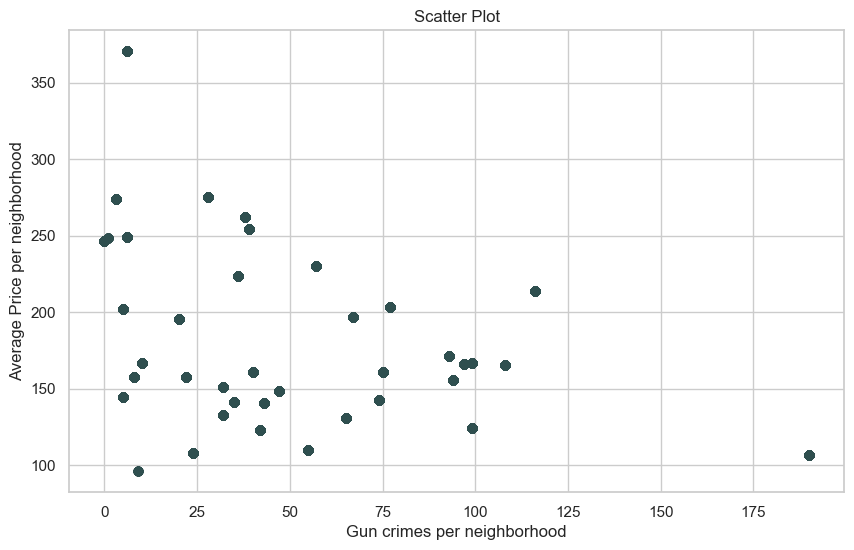

In [ ]:
figure = plt.figure(figsize=(10, 6))

axes = figure.add_subplot(1, 1, 1)
axes.scatter(total_method, avg_price, marker="o", color="darkslategray")

axes.set_ylabel("Average Price per neighborhood")
axes.set_xlabel("Gun crimes per neighborhood")
axes.set_title("Scatter Plot")

plt.show()
plt.close()

The chart does appear to be a negative correlation. 

In [ ]:
total_method = crimes["total_knife"]

In [ ]:
print("r   = ", stats.pearsonr(avg_price, total_method)[0])
print("rho = ", stats.spearmanr(avg_price, total_method)[0])

r   =  -0.11715637516060458
rho =  -0.0033041250964812737


There is a slight negative correlation between knife crimes and average price. 

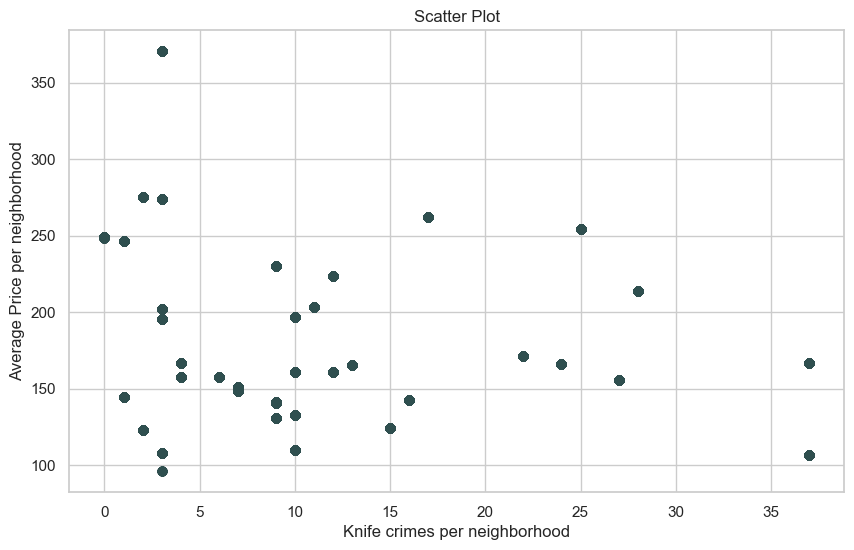

In [ ]:
figure = plt.figure(figsize=(10, 6))

axes = figure.add_subplot(1, 1, 1)
axes.scatter(total_method, avg_price, marker="o", color="darkslategray")

axes.set_ylabel("Average Price per neighborhood")
axes.set_xlabel("Knife crimes per neighborhood")
axes.set_title("Scatter Plot")

plt.show()
plt.close()

The chart appears to have a slight negative correlation. 

In [ ]:
total_method = crimes["total_others"]

In [ ]:
print("r   = ", stats.pearsonr(avg_price, total_method)[0])
print("rho = ", stats.spearmanr(avg_price, total_method)[0])

r   =  0.34433289936254874
rho =  0.3842336057132542


There is a slight positive correlation between other crimes and average price. 

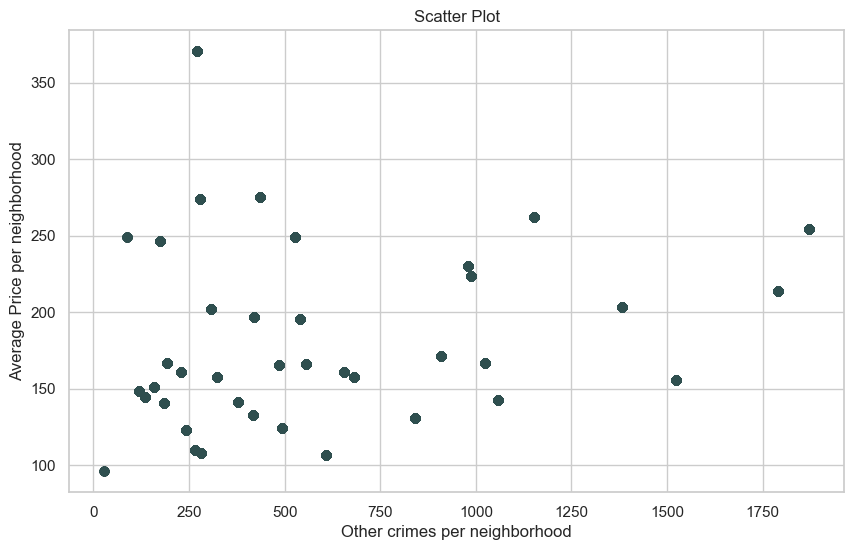

In [ ]:
figure = plt.figure(figsize=(10, 6))

axes = figure.add_subplot(1, 1, 1)
axes.scatter(total_method, avg_price, marker="o", color="darkslategray")

axes.set_ylabel("Average Price per neighborhood")
axes.set_xlabel("Other crimes per neighborhood")
axes.set_title("Scatter Plot")

plt.show()
plt.close()

The chart appears to have a positive correlation. 

There seems to be a negative correlation between gun and knife crimes and prices and a positive correlation between other method crimes and price. This seems to fit with the previous comparison, that violent crime is negatively correlated with price and property crime positively correlated. There is probably a breakdown to very specific types or ratios of crimes in a neighborhood that are more closely related to price. There is also perhaps more crime/population data that would explain these numbers that are not available in the data we have. 

### `shift` vs `price` <a id="shift_vs_price"></a>  
[back to list](#pairwise)

The shift variable is what time of day that the crime occurs. 

In [ ]:
crimes["SHIFT"].unique()

array(['midnight', 'evening', 'day'], dtype=object)

As the values are expected, we will create a dummy variable. 

In [ ]:
crimes = pd.concat([crimes, pd.get_dummies(crimes["SHIFT"], prefix="shift")], axis=1)

In [ ]:
crimes.head()

,column00,NEIGHBORHOOD_CLUSTER,offensegroup,LONGITUDE,END_DATE,offense-text,SHIFT,offensekey,START_DATE,OFFENSE,...,total_violent,method_gun,method_knife,method_others,total_gun,total_knife,total_others,shift_day,shift_evening,shift_midnight
0,0,cluster 25,violent,-77.002778,"9/7/2021, 2:18:00 PM",homicide,midnight,violent|homicide,2021-09-07,homicide,...,214.0,0,0,1,116,28,1790.0,0,0,1
1,1,cluster 26,violent,-76.997326,"10/3/2021, 3:20:00 PM",robbery,evening,violent|robbery,2021-10-03,robbery,...,112.0,0,0,1,57,9,979.0,0,1,0
2,2,cluster 35,violent,-76.964260,"10/3/2021, 6:40:00 PM",robbery,evening,violent|robbery,2021-10-03,robbery,...,51.0,1,0,0,42,2,242.0,0,1,0
3,3,cluster 39,violent,-76.999896,"10/11/2021, 8:52:00 PM",assault w/dangerous weapon,midnight,violent|assault w/dangerous weapon,2021-10-11,assault w/dangerous weapon,...,275.0,0,0,1,190,37,607.0,0,0,1
4,4,cluster 2,property,-77.025347,"10/2/2021, 11:01:00 PM",theft f/auto,evening,property|theft f/auto,2021-10-02,theft f/auto,...,193.0,0,0,1,94,27,1524.0,0,1,0


Summing the values for each method per neighborhood.

In [ ]:
crimes["total_day"] = crimes.groupby("NEIGHBORHOOD_NAME")["shift_day"].transform("sum")

In [ ]:
crimes["total_evening"] = crimes.groupby("NEIGHBORHOOD_NAME")["shift_evening"].transform("sum")

In [ ]:
crimes["total_midnight"] = crimes.groupby("NEIGHBORHOOD_NAME")["shift_midnight"].transform("sum")

In [ ]:
crimes.head()

,column00,NEIGHBORHOOD_CLUSTER,offensegroup,LONGITUDE,END_DATE,offense-text,SHIFT,offensekey,START_DATE,OFFENSE,...,method_others,total_gun,total_knife,total_others,shift_day,shift_evening,shift_midnight,total_day,total_evening,total_midnight
0,0,cluster 25,violent,-77.002778,"9/7/2021, 2:18:00 PM",homicide,midnight,violent|homicide,2021-09-07,homicide,...,1,116,28,1790.0,0,0,1,805.0,763.0,366.0
1,1,cluster 26,violent,-76.997326,"10/3/2021, 3:20:00 PM",robbery,evening,violent|robbery,2021-10-03,robbery,...,1,57,9,979.0,0,1,0,491.0,390.0,164.0
2,2,cluster 35,violent,-76.964260,"10/3/2021, 6:40:00 PM",robbery,evening,violent|robbery,2021-10-03,robbery,...,0,42,2,242.0,0,1,0,136.0,107.0,43.0
3,3,cluster 39,violent,-76.999896,"10/11/2021, 8:52:00 PM",assault w/dangerous weapon,midnight,violent|assault w/dangerous weapon,2021-10-11,assault w/dangerous weapon,...,1,190,37,607.0,0,0,1,260.0,326.0,248.0
4,4,cluster 2,property,-77.025347,"10/2/2021, 11:01:00 PM",theft f/auto,evening,property|theft f/auto,2021-10-02,theft f/auto,...,1,94,27,1524.0,0,1,0,689.0,619.0,337.0


In [ ]:
total_shift = crimes["total_day"]

In [ ]:
print("r   = ", stats.pearsonr(avg_price, total_shift)[0])
print("rho = ", stats.spearmanr(avg_price, total_shift)[0])

r   =  0.3183165635613544
rho =  0.4089085328652436


There is a medium negative correlation between day crimes and average price. 

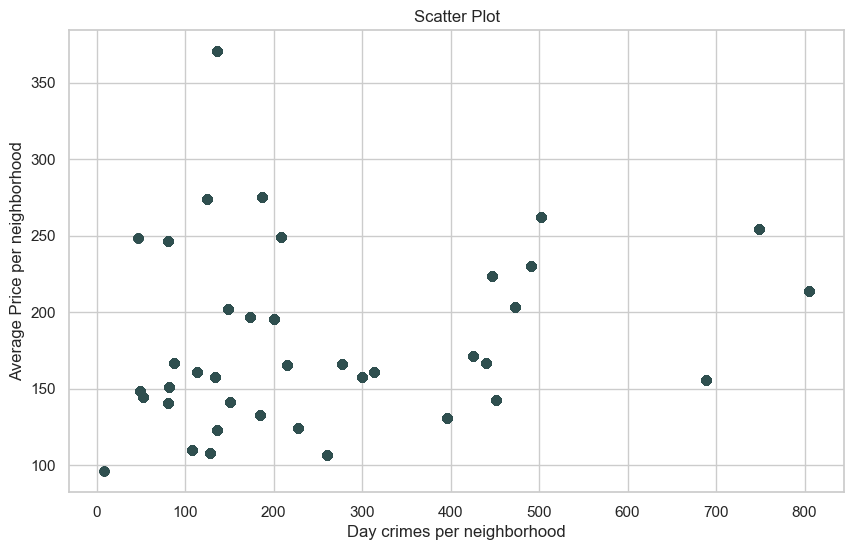

In [ ]:
figure = plt.figure(figsize=(10, 6))

axes = figure.add_subplot(1, 1, 1)
axes.scatter(total_shift, avg_price, marker="o", color="darkslategray")

axes.set_ylabel("Average Price per neighborhood")
axes.set_xlabel("Day crimes per neighborhood")
axes.set_title("Scatter Plot")

plt.show()
plt.close()

The chart does appear to be a positive correlation. 

In [ ]:
total_shift = crimes["total_evening"]

In [ ]:
print("r   = ", stats.pearsonr(avg_price, total_shift)[0])
print("rho = ", stats.spearmanr(avg_price, total_shift)[0])

r   =  0.30880183928877897
rho =  0.337923881227923


There is a medium/slight positive correlation between evening crimes and average price. 

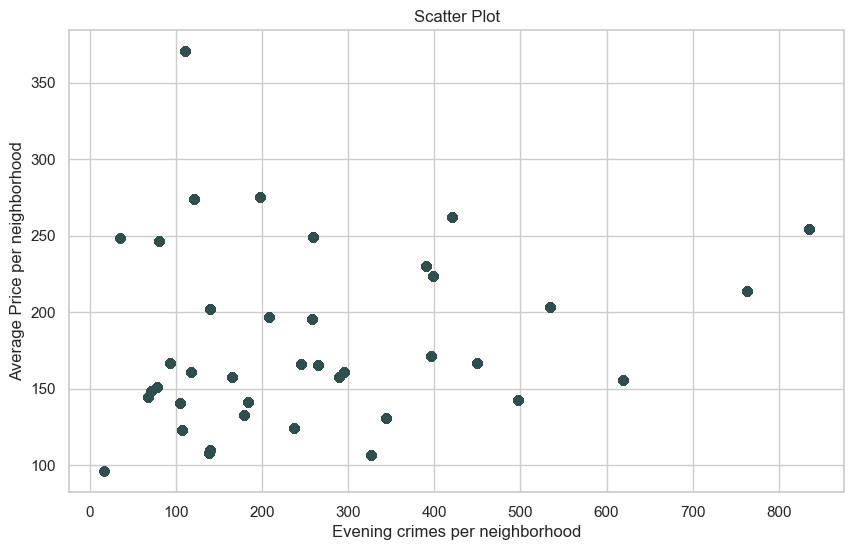

In [ ]:
figure = plt.figure(figsize=(10, 6))

axes = figure.add_subplot(1, 1, 1)
axes.scatter(total_shift, avg_price, marker="o", color="darkslategray")

axes.set_ylabel("Average Price per neighborhood")
axes.set_xlabel("Evening crimes per neighborhood")
axes.set_title("Scatter Plot")

plt.show()
plt.close()

The chart appears to have a slight positive correlation. 

In [ ]:
total_shift = crimes["total_midnight"]

In [ ]:
print("r   = ", stats.pearsonr(avg_price, total_shift)[0])
print("rho = ", stats.spearmanr(avg_price, total_shift)[0])

r   =  0.20845253952901385
rho =  0.2663572018757196


There is a slight positive correlation between midnight crimes and average price. 

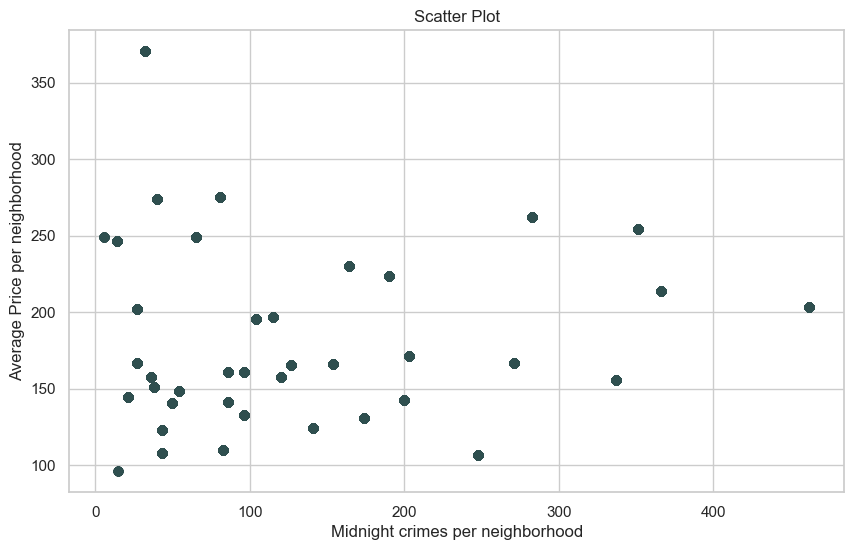

In [ ]:
figure = plt.figure(figsize=(10, 6))

axes = figure.add_subplot(1, 1, 1)
axes.scatter(total_shift, avg_price, marker="o", color="darkslategray")

axes.set_ylabel("Average Price per neighborhood")
axes.set_xlabel("Midnight crimes per neighborhood")
axes.set_title("Scatter Plot")

plt.show()
plt.close()

The chart appears to have a slight positive correlation. 

There appears to be a slight positive correlation between each time of day and price. The highest positive correlation is day, then evening, then midnight, which if we assume that more violent crimes are committed at night, makes sense. Overall these numbers are similar to those of the overall crime totals. 

The crime data does appear to be correlated with price, but without more information on how population distribution affects both price and crime, it may not be useful in helping to predict prices. 

# ========================================
# Backup section IGNORE
# ========================================

## Rating (`review_scores_rating`) <a id="rating"></a>

In [237]:
latest_listings["review_scores_rating"].describe()

count    7740.000000
mean        4.680700
std         0.636749
min         0.000000
25%         4.660000
50%         4.850000
75%         4.970000
max         5.000000
Name: review_scores_rating, dtype: float64

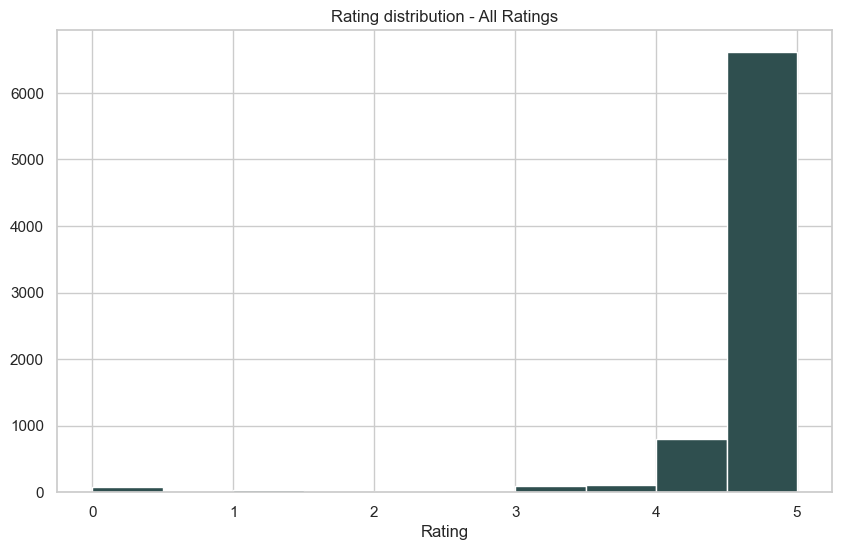

In [238]:
# h = freeman_diaconis(latest_listings["review_scores_rating"].dropna())
plot_data = latest_listings["review_scores_rating"].dropna()
variable_name = "Rating"
# print("Freeman Diaconis: ", h)
# mn = int(plot_data.min())
# mx = int(plot_data.max())
# bins = [i for i in range( mn, mx, h)]

figure = plt.figure(figsize=(10, 6))

axes = figure.add_subplot(1, 1, 1)
axes.hist(plot_data, color="darkslategray")
axes.set_title(variable_name + " distribution - All Ratings")
axes.set_xlabel(variable_name)

plt.show()
plt.close()

TODO: discuss

# Pairwise EDA - Target Variable: Rating <a id="pairwise_eda_rating"></a>

In [239]:
describe_by_category(latest_listings, "review_scores_rating", "neighbourhood_cleansed", transpose=True)

neighbourhood_cleansed  Brightwood Park, Crestwood, Petworth  \
count                                                  416.0   
mean                                                     5.0   
std                                                      1.0   
min                                                      0.0   
25%                                                      5.0   
50%                                                      5.0   
75%                                                      5.0   
max                                                      5.0   

neighbourhood_cleansed  Brookland, Brentwood, Langdon  \
count                                           130.0   
mean                                              5.0   
std                                               0.0   
min                                               3.0   
25%                                               5.0   
50%                                               5.0   
75%                     

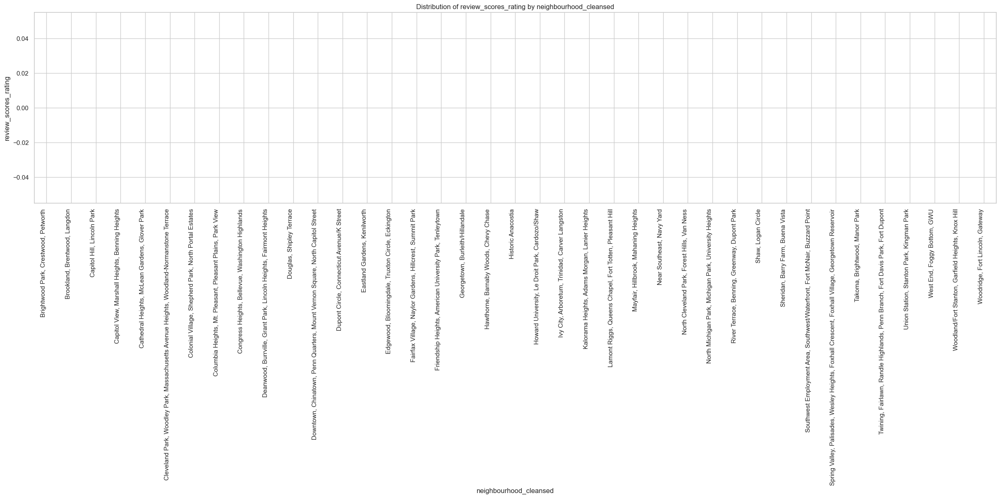

In [240]:
multiboxplot(latest_listings, "review_scores_rating", "neighbourhood_cleansed") # TODO data not showing up

TODO: Discuss

### 'neighborhood' vs 'rating' <a id="neighborhood_vs_rating"></a>

In [241]:
grouped = latest_listings.groupby("neighbourhood_cleansed")
labels = pd.unique(latest_listings_below_500["neighbourhood_cleansed"].values)
labels.sort()
grouped_data = [grouped["review_scores_rating"].get_group( k) for k in labels]
grouped_y = grouped['review_scores_rating'].describe()
avg_review_per_neighborhood = list(grouped_y.iloc[:, 1])
neighborhoods_gpd['avg_rating'] = avg_review_per_neighborhood

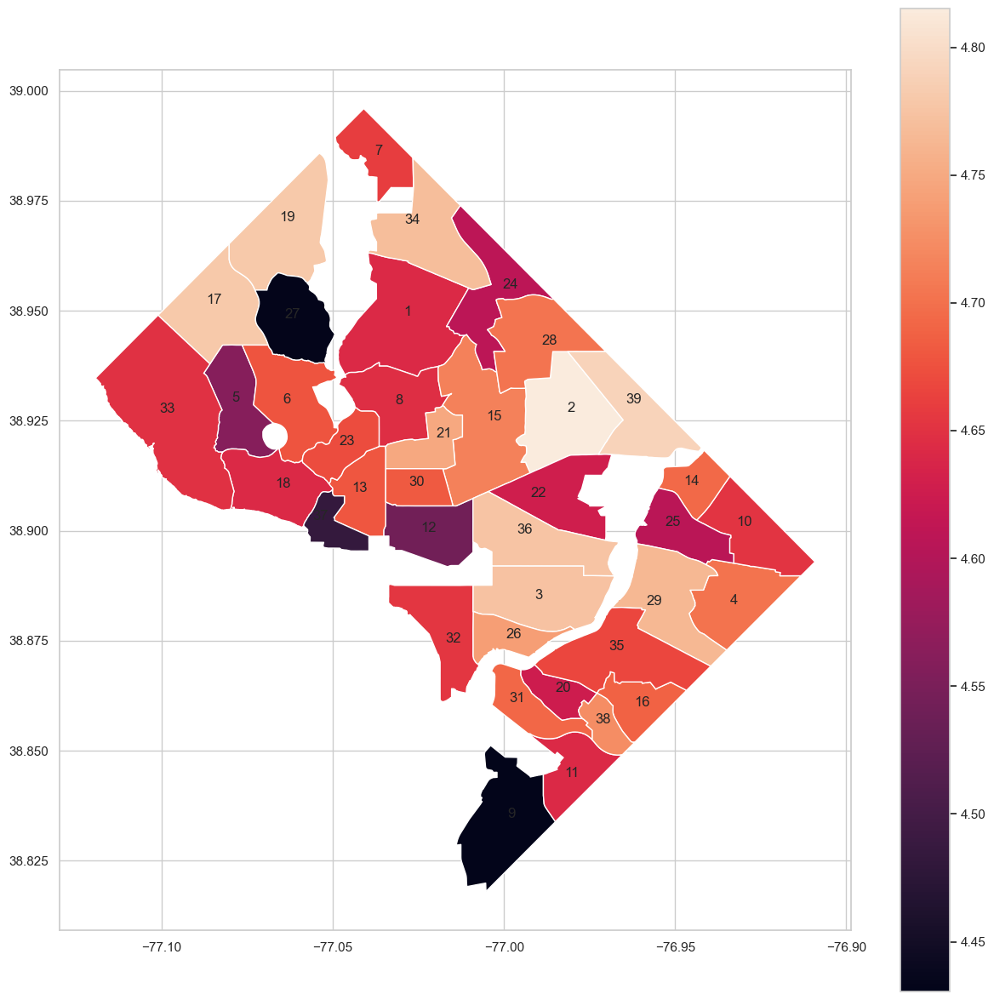

In [242]:
fig,ax = plt.subplots(figsize = (15,15))
base = neighborhoods_gpd.plot(ax=ax, column="avg_rating",legend=True)
for idx, row in neighborhoods_gpd.iterrows():
    plt.annotate(row['alpha_index'], xy=row['rep_point'],
                 horizontalalignment='center')

TODO: Discuss

In [243]:
latest_listings["years_host"] = (res - latest_listings.host_since) / np.timedelta64(1,'Y')

In [244]:
latest_listings['review_scores_rating'].isnull().values.any()

True

## `host_since` vs `review_scores_rating` <a id="host_since_vs_rating"></a>

In [245]:
latest_listings_non_null_host_since = latest_listings[(latest_listings["years_host"].notnull()) & (latest_listings["review_scores_rating"].notnull())]

In [246]:
correlation(latest_listings_non_null_host_since, "review_scores_rating", "years_host")

Correlation coefficients:
r   = 0.07123508406852085 (very weak)
rho = 0.0920592965742376 (very weak)


As I expected, the correlation is strong and negative.

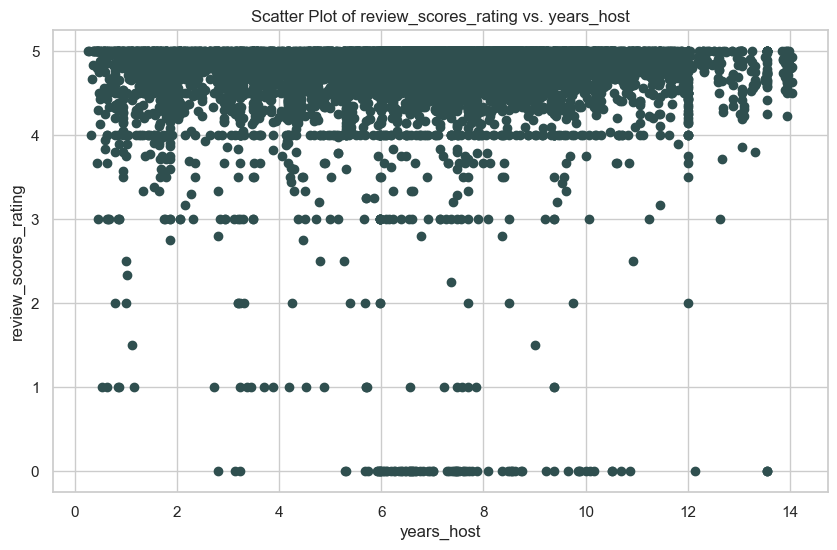

In [247]:
figure = plt.figure(figsize=(10, 6))

axes = figure.add_subplot(1, 1, 1)
axes.scatter( latest_listings_non_null_host_since.years_host, latest_listings_non_null_host_since.review_scores_rating, marker="o", color="darkslategray")

axes.set_ylabel("review_scores_rating")
axes.set_xlabel("years_host")
axes.set_title("Scatter Plot of review_scores_rating vs. years_host")

plt.show()
plt.close()

TODO: Discuss

## `host_location` vs `review_scores_rating` <a id="host_location_vs_rating"></a>
 
This one won't work because the data is ambiguous in category. There are several categories meaning the same thing like "DC" and "Washington DC" or "United States" and "US" all being separate categories.

## `host_response_time` vs `review_scores_rating` <a id="host_response_time_vs_rating"></a>

In [248]:
describe_by_category(latest_listings, "review_scores_rating", "host_response_time", transpose=True)

host_response_time     N/A  a few days or more  within a day  \
count               2010.0               136.0         477.0   
mean                   5.0                 4.0           5.0   
std                    1.0                 1.0           1.0   
min                    0.0                 0.0           0.0   
25%                    5.0                 5.0           5.0   
50%                    5.0                 5.0           5.0   
75%                    5.0                 5.0           5.0   
max                    5.0                 5.0           5.0   

host_response_time  within a few hours  within an hour  
count                            830.0          4156.0  
mean                               5.0             5.0  
std                                1.0             0.0  
min                                0.0             0.0  
25%                                5.0             5.0  
50%                                5.0             5.0  
75%                     

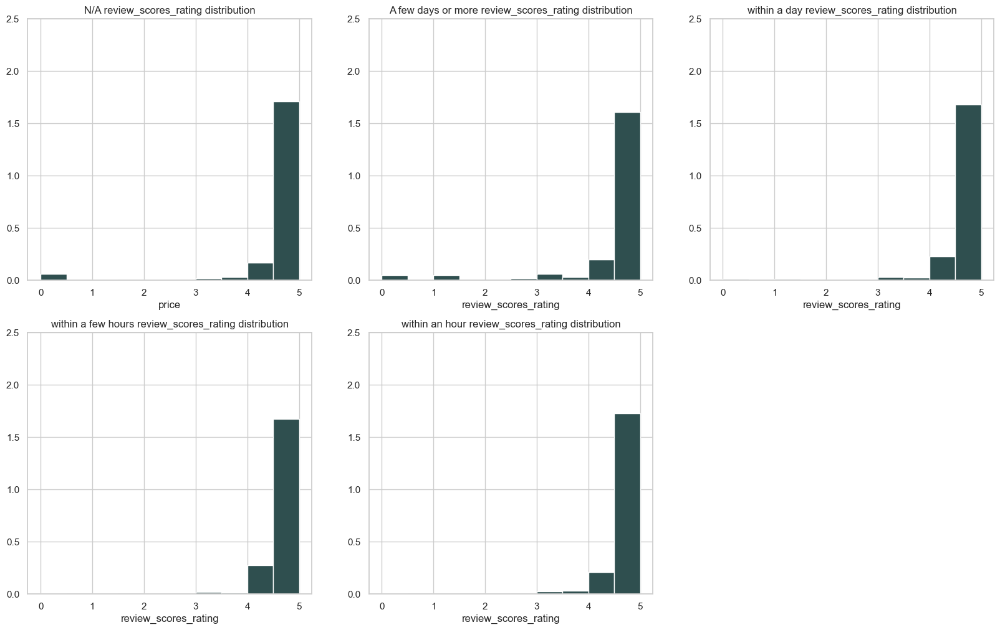

In [249]:
grouped = latest_listings_below_500.groupby("host_response_time")

figure = plt.figure(figsize=(20, 12))

axes = figure.add_subplot(2, 3, 1)
axes.hist(grouped["review_scores_rating"].get_group("N/A"),color="darkslategray",density=True, range=(0,5))
axes.set_ylim((0,2.5))
axes.set_title("N/A review_scores_rating distribution")
axes.set_xlabel("price")

axes = figure.add_subplot(2, 3, 2)
axes.hist(grouped["review_scores_rating"].get_group("a few days or more"),color="darkslategray",density=True, range=(0,5))
axes.set_ylim((0,2.5))
axes.set_title("A few days or more review_scores_rating distribution")
axes.set_xlabel("review_scores_rating")

axes = figure.add_subplot(2, 3, 3)
axes.hist(grouped["review_scores_rating"].get_group("within a day"),color="darkslategray",density=True, range=(0,5))
axes.set_ylim((0,2.5))
axes.set_title("within a day review_scores_rating distribution")
axes.set_xlabel("review_scores_rating")

axes = figure.add_subplot(2, 3, 4)
axes.hist(grouped["review_scores_rating"].get_group("within a few hours"),color="darkslategray",density=True, range=(0,5))
axes.set_ylim((0,2.5))
axes.set_title("within a few hours review_scores_rating distribution")
axes.set_xlabel("review_scores_rating")

axes = figure.add_subplot(2, 3, 5)
axes.hist(grouped["review_scores_rating"].get_group("within an hour"),color="darkslategray",density=True, range=(0,5))
axes.set_ylim((0,2.5))
axes.set_title("within an hour review_scores_rating distribution")
axes.set_xlabel("review_scores_rating")

plt.show()
plt.close()

TODO: Discuss

## `host_response_rate` vs `review_scores_rating` <a id="host_response_rate_vs_rating"></a>

In [250]:
latest_listings['host_response_rate'] = latest_listings['host_response_rate'].replace('N/A',np.NaN)
latest_listings['host_response_rate'] = latest_listings['host_response_rate'].replace('%', '', regex=True).astype(float)

In [251]:
latest_listings['host_response_rate'].isnull().values.any()

True

In [252]:
latest_listings_non_null_host_response_rate = latest_listings[latest_listings["host_response_rate"].notnull() & (latest_listings["review_scores_rating"].notnull())]

In [253]:
correlation(latest_listings_non_null_host_response_rate, "review_scores_rating", "host_response_rate")

Correlation coefficients:
r   = 0.12900964402565684 (very weak)
rho = 0.17953795586786078 (weak)


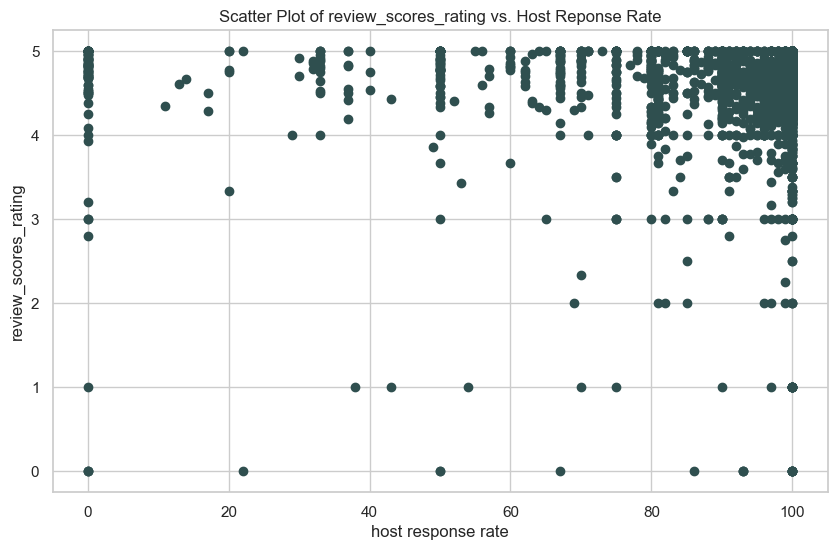

In [254]:
figure = plt.figure(figsize=(10, 6))

axes = figure.add_subplot(1, 1, 1)
axes.scatter( latest_listings_non_null_host_response_rate.host_response_rate, latest_listings_non_null_host_response_rate.review_scores_rating, marker="o", color="darkslategray")

axes.set_ylabel("review_scores_rating")
axes.set_xlabel("host response rate")
axes.set_title("Scatter Plot of review_scores_rating vs. Host Reponse Rate")

plt.show()
plt.close()

TODO: Discuss

## `host_acceptance_rate` vs `review_scores_rating` <a id="host_acceptance_rate_vs_rating"></a>

In [255]:
latest_listings['host_acceptance_rate'] = latest_listings['host_acceptance_rate'].replace('N/A',np.NaN)
latest_listings['host_acceptance_rate'] = latest_listings['host_acceptance_rate'].replace('%', '', regex=True).astype(float)

In [256]:
latest_listings['host_response_rate'].isnull().values.any()

True

In [257]:
latest_listings_non_null_host_acceptance_rate = latest_listings[latest_listings["host_acceptance_rate"].notnull() & (latest_listings["review_scores_rating"].notnull())]

In [258]:
correlation(latest_listings_non_null_host_acceptance_rate, "review_scores_rating", "host_acceptance_rate")

Correlation coefficients:
r   = 0.08305911272581257 (very weak)
rho = 0.02339755258475468 (very weak)


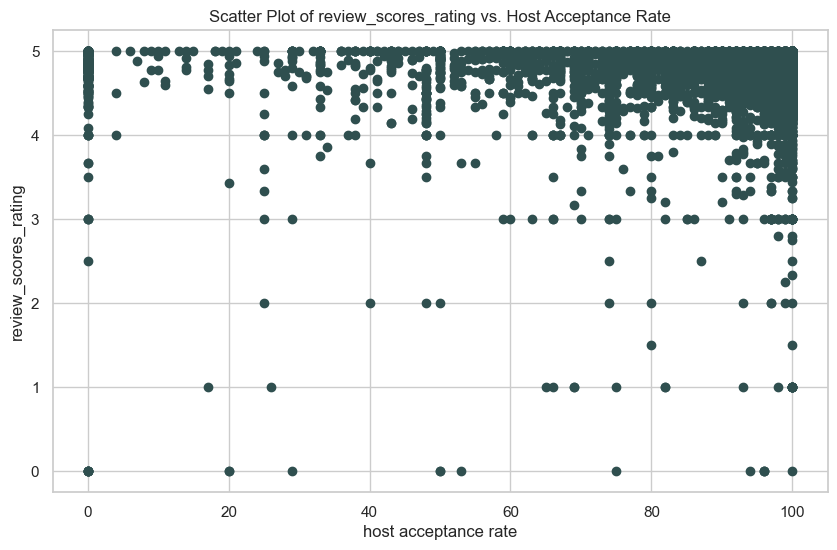

In [259]:
figure = plt.figure(figsize=(10, 6))

axes = figure.add_subplot(1, 1, 1)
axes.scatter( latest_listings_non_null_host_acceptance_rate.host_acceptance_rate, latest_listings_non_null_host_acceptance_rate.review_scores_rating, marker="o", color="darkslategray")

axes.set_ylabel("review_scores_rating")
axes.set_xlabel("host acceptance rate")
axes.set_title("Scatter Plot of review_scores_rating vs. Host Acceptance Rate")

plt.show()
plt.close()

TODO: Discuss

## `host_is_superhost` vs `review_scores_rating` <a id="host_is_superhost_vs_rating"></a>

In [260]:
latest_listings['host_is_superhost'].isnull().values.any()

True

In [261]:
latest_listings_non_null_host_is_superhost = latest_listings[latest_listings["host_is_superhost"].notnull()]

In [262]:
describe_by_category(latest_listings, "review_scores_rating", "host_is_superhost", transpose=True)

host_is_superhost   False    True
count              5228.0  2509.0
mean                  5.0     5.0
std                   1.0     0.0
min                   0.0     2.0
25%                   5.0     5.0
50%                   5.0     5.0
75%                   5.0     5.0
max                   5.0     5.0


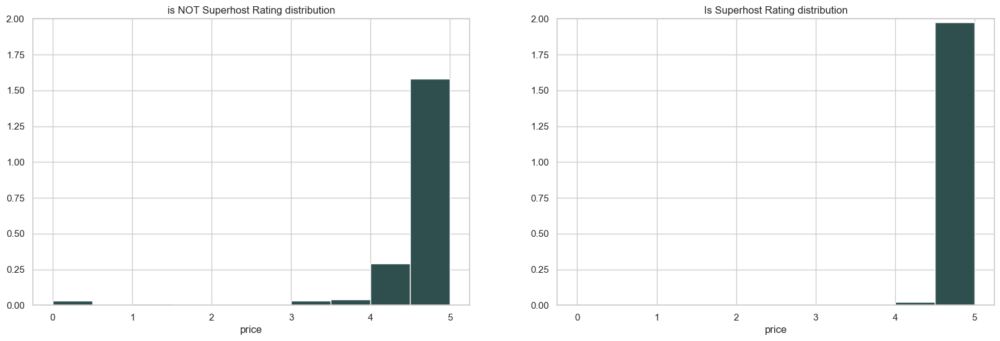

In [263]:
grouped = latest_listings.groupby("host_is_superhost")

figure = plt.figure(figsize=(20, 6))

axes = figure.add_subplot(1,2, 1)
axes.hist(grouped["review_scores_rating"].get_group(False),color="darkslategray",density=True, range=(0,5))
axes.set_ylim((0,2))
axes.set_title("is NOT Superhost Rating distribution")
axes.set_xlabel("price")

axes = figure.add_subplot(1,2, 2)
axes.hist(grouped["review_scores_rating"].get_group(True),color="darkslategray",density=True, range=(0,5))
axes.set_ylim((0,2))
axes.set_title("Is Superhost Rating distribution")
axes.set_xlabel("price")

plt.show()
plt.close()

TODO: Discuss

## `host_listings_count` vs `review_scores_rating` <a id="host_listings_count_vs_rating"></a>

In [264]:
latest_listings['host_listings_count'].isnull().values.any()

True

In [265]:
latest_listings_non_null_host_listings_count = latest_listings[latest_listings["host_listings_count"].notnull() & (latest_listings["review_scores_rating"].notnull())]

In [266]:
correlation(latest_listings_non_null_host_listings_count , "review_scores_rating", "host_listings_count")

Correlation coefficients:
r   = -0.04056181809422287 (very weak)
rho = -0.21680666425614878 (weak)


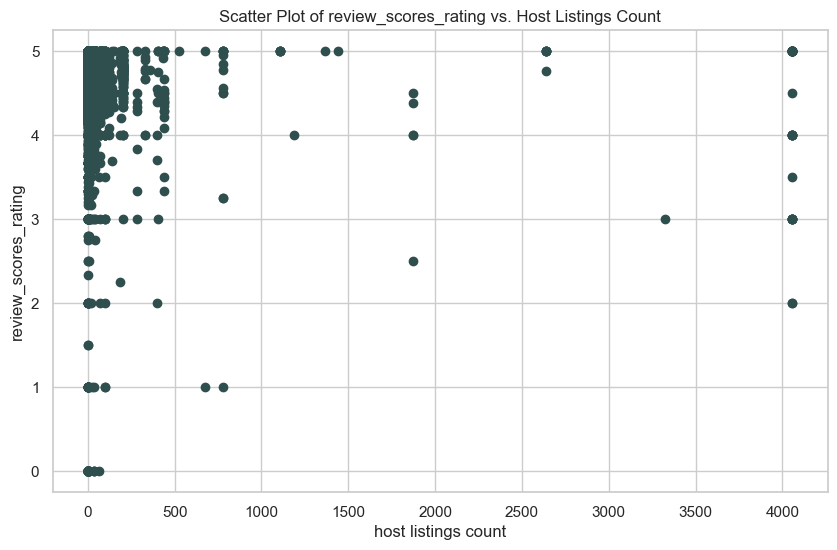

In [267]:
figure = plt.figure(figsize=(10, 6))

axes = figure.add_subplot(1, 1, 1)
axes.scatter( latest_listings_non_null_host_listings_count.host_listings_count, latest_listings_non_null_host_listings_count.review_scores_rating, marker="o", color="darkslategray")

axes.set_ylabel("review_scores_rating")
axes.set_xlabel("host listings count")
axes.set_title("Scatter Plot of review_scores_rating vs. Host Listings Count")

plt.show()
plt.close()

TODO: Discuss

In [268]:
latest_listings['host_listings_count_under_20'] = latest_listings.host_listings_count[latest_listings.host_listings_count < 20]

In [269]:
latest_listings_non_null_host_listings_under_20_count = latest_listings[latest_listings["host_listings_count_under_20"].notnull() & (latest_listings["review_scores_rating"].notnull())]

In [270]:
correlation(latest_listings_non_null_host_listings_under_20_count , "review_scores_rating", "host_listings_count_under_20")

Correlation coefficients:
r   = -0.019969452346313973 (very weak)
rho = -0.1829743493894682 (weak)


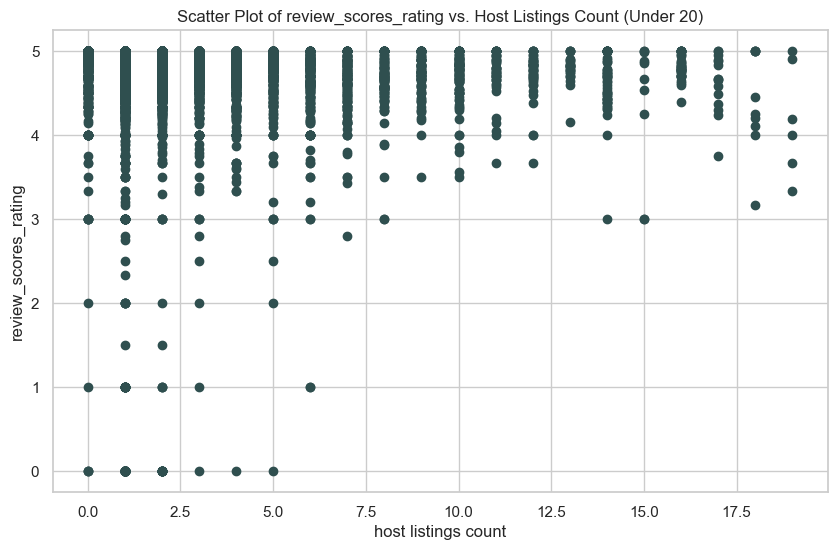

In [271]:
figure = plt.figure(figsize=(10, 6))

axes = figure.add_subplot(1, 1, 1)
axes.scatter( latest_listings_non_null_host_listings_under_20_count.host_listings_count_under_20, latest_listings_non_null_host_listings_under_20_count.review_scores_rating, marker="o", color="darkslategray")

axes.set_ylabel("review_scores_rating")
axes.set_xlabel("host listings count")
axes.set_title("Scatter Plot of review_scores_rating vs. Host Listings Count (Under 20)")

plt.show()
plt.close()

TODO: Discuss

## `host_total_listings_count` vs `review_scores_rating` <a id="host_total_listings_count_vs_rating"></a>
UNUSED

## `host_verifications` vs `review_scores_rating` <a id="host_verifications_vs_rating"></a>

In [272]:
latest_listings.host_verifications.value_counts(normalize=True)[:10]

['email', 'phone']                                                                                    0.550095
['email', 'phone', 'work_email']                                                                      0.136080
['phone']                                                                                             0.051705
['email', 'phone', 'reviews', 'kba']                                                                  0.024716
['email', 'phone', 'reviews', 'jumio', 'government_id']                                               0.016004
None                                                                                                  0.015341
['email', 'phone', 'reviews']                                                                         0.014583
['email', 'phone', 'jumio', 'offline_government_id', 'selfie', 'government_id', 'identity_manual']    0.010511
['email', 'phone', 'reviews', 'jumio', 'offline_government_id', 'government_id']                      0.010133
[

## `host_has_profile_pic` vs `review_scores_rating` <a id="host_has_profile_pic_vs_rating"></a>

In [273]:
describe_by_category(latest_listings, "review_scores_rating", "host_has_profile_pic", transpose=True)

host_has_profile_pic  False    True
count                  43.0  7566.0
mean                    5.0     5.0
std                     1.0     1.0
min                     2.0     0.0
25%                     4.0     5.0
50%                     5.0     5.0
75%                     5.0     5.0
max                     5.0     5.0


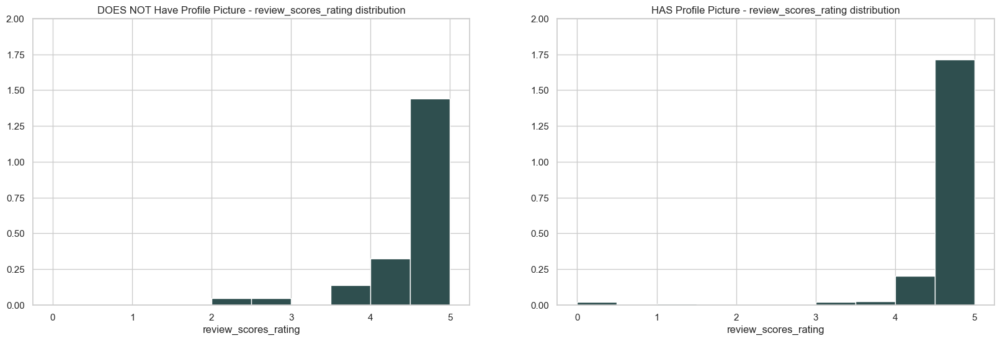

In [274]:
grouped = latest_listings.groupby("host_has_profile_pic")

figure = plt.figure(figsize=(20, 6))

axes = figure.add_subplot(1,2, 1)
axes.hist(grouped["review_scores_rating"].get_group(False),color="darkslategray",density=True, range=(0,5))
axes.set_ylim((0,2))
axes.set_title("DOES NOT Have Profile Picture - review_scores_rating distribution")
axes.set_xlabel("review_scores_rating")

axes = figure.add_subplot(1,2, 2)
axes.hist(grouped["review_scores_rating"].get_group(True),color="darkslategray",density=True, range=(0,5))
axes.set_ylim((0,2))
axes.set_title("HAS Profile Picture - review_scores_rating distribution")
axes.set_xlabel("review_scores_rating")

plt.show()
plt.close()

TODO: Discuss

## `host_identity_verified` vs `host_identity_verified` <a id="host_identity_verified_vs_rating"></a>

In [275]:
describe_by_category(latest_listings, "review_scores_rating", "host_identity_verified", transpose=True)

host_identity_verified   False    True
count                   1253.0  6356.0
mean                       5.0     5.0
std                        1.0     1.0
min                        0.0     0.0
25%                        5.0     5.0
50%                        5.0     5.0
75%                        5.0     5.0
max                        5.0     5.0


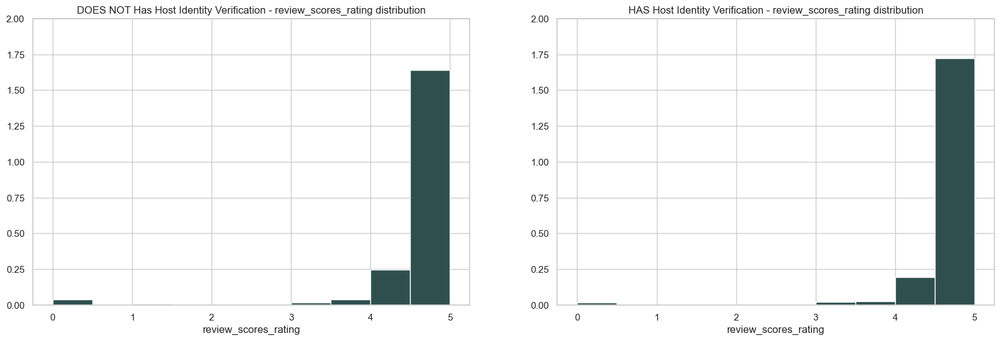

In [276]:
grouped = latest_listings.groupby("host_identity_verified")

figure = plt.figure(figsize=(20, 6))

axes = figure.add_subplot(1,2, 1)
axes.hist(grouped["review_scores_rating"].get_group(False),color="darkslategray",density=True, range=(0,5))
axes.set_ylim((0,2))
axes.set_title("DOES NOT Has Host Identity Verification - review_scores_rating distribution")
axes.set_xlabel("review_scores_rating")

axes = figure.add_subplot(1,2, 2)
axes.hist(grouped["review_scores_rating"].get_group(True),color="darkslategray",density=True, range=(0,5))
axes.set_ylim((0,2))
axes.set_title("HAS Host Identity Verification - review_scores_rating distribution")
axes.set_xlabel("review_scores_rating")

plt.show()
plt.close()

TODO: Discuss

Let's start with single variable

In [277]:
con.execute('select * from crimes;')
crime_data = con.fetch_df()
print(crime_data)

       column00 NEIGHBORHOOD_CLUSTER offensegroup  LONGITUDE  \
0             0           cluster 25      violent -77.002778   
1             1           cluster 26      violent -76.997326   
2             2           cluster 35      violent -76.964260   
3             3           cluster 39      violent -76.999896   
4             4            cluster 2     property -77.025347   
...         ...                  ...          ...        ...   
27606     27606            cluster 1     property -77.042324   
27607     27607            cluster 1     property -77.042369   
27608     27608           cluster 26     property -76.994963   
27609     27609           cluster 11     property -77.081165   
27610     27610           cluster 25     property -77.001314   

                     END_DATE                offense-text     SHIFT  \
0        9/7/2021, 2:18:00 PM                    homicide  midnight   
1       10/3/2021, 3:20:00 PM                     robbery   evening   
2       10/3/2021,

### Neighborhood cluster ###
Neighborhood cluster represents which neighbhor hood the crime happened. There are 45 clusters in this column and they can be matched to a specific neighbhor hood. The most frequent one is cluster 25. This value tied close to the neighbor hood name column. This is a categorical variable.

In [278]:
crime_data.NEIGHBORHOOD_CLUSTER.describe()

count          27609
unique            45
top       cluster 25
freq            2070
Name: NEIGHBORHOOD_CLUSTER, dtype: object

In [279]:
crime_data.NEIGHBORHOOD_CLUSTER.value_counts()

cluster 25    2070
cluster 8     2055
cluster 2     1788
cluster 3     1598
cluster 23    1335
cluster 6     1276
cluster 18    1270
cluster 7     1125
cluster 21    1115
cluster 26    1095
cluster 22     996
cluster 39     990
cluster 34     752
cluster 17     747
cluster 1      729
cluster 33     693
cluster 31     667
cluster 27     592
cluster 4      566
cluster 32     561
cluster 9      501
cluster 19     488
cluster 24     452
cluster 38     367
cluster 11     365
cluster 30     359
cluster 15     329
cluster 20     319
cluster 35     315
cluster 5      301
cluster 14     292
cluster 37     266
cluster 28     225
cluster 12     219
cluster 36     207
cluster 10     188
cluster 16     148
cluster 13      91
cluster 45      48
cluster 29      44
cluster 43      32
cluster 40      15
cluster 44       7
cluster 46       7
cluster 41       4
Name: NEIGHBORHOOD_CLUSTER, dtype: int64

### offense group ###
There are two types of offense crime in this variable, Property and violent, so it's a categorical variable. We can see from the summary that majority of the offense is property.

In [280]:
crime_data.offensegroup.value_counts()

property    23567
violent      4044
Name: offensegroup, dtype: int64

### Longtitude ###
This is a pretty straightforward variable. It represents the longtitude of the crime. Longtitude is a continuous numerical data and let's a take a look at the summary of it.

In [281]:
crime_data.LONGITUDE.describe()

count    27611.000000
mean       -77.007869
std          0.034340
min        -77.112316
25%        -77.030787
50%        -77.010666
75%        -76.986919
max        -76.910021
Name: LONGITUDE, dtype: float64

The min here is -77.1123 and max is -76.9100. Since our crime data is based on DC area, so this make perfect sense. Now let's take a look at the distribution of it.

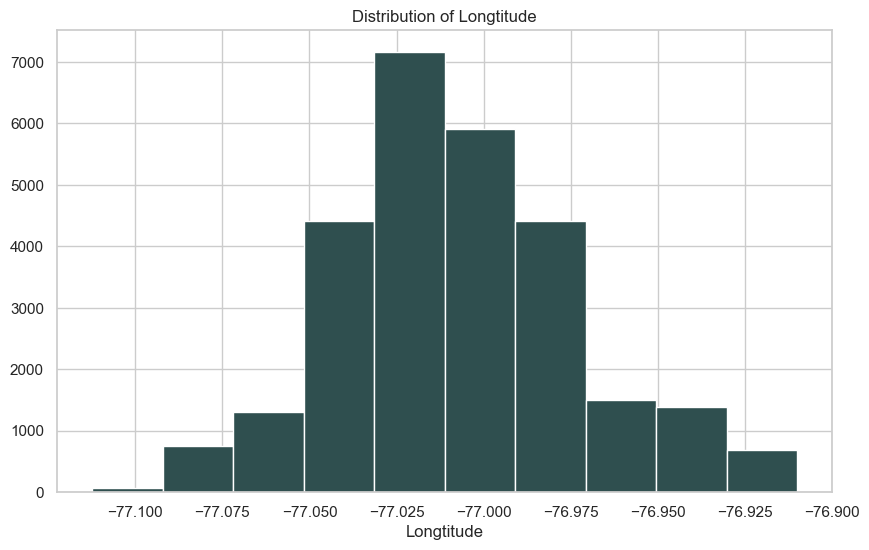

In [282]:
figure = plt.figure(figsize=(10, 6))

axes = figure.add_subplot(1, 1, 1)
axes.hist(crime_data.LONGITUDE, color="darkslategray")
axes.set_title("Distribution of Longtitude")
axes.set_xlabel("Longtitude")

plt.show()
plt.close()

Here the distribution looks very nearly normal. 50% of the crimes has the longtitude between -77.050 to -76.975.

### end date ###
This variable represents the time and date when the crime end. It's a date type.

In [283]:
crime_data.END_DATE.describe()

count                     25411
unique                    22106
top       5/25/2022, 7:00:00 AM
freq                          7
Name: END_DATE, dtype: object

### offense-text ###
This is another variable to describle the type of crime. It's a categorical variable. Let's take a look at the summary of it.

In [284]:
crime_data['offense-text'].describe()

count           27611
unique              9
top       theft/other
freq            10783
Name: offense-text, dtype: object

In [285]:
crime_data['offense-text'].value_counts()

theft/other                   10783
theft f/auto                   8077
motor vehicle theft            3535
robbery                        2167
assault w/dangerous weapon     1499
burglary                       1168
homicide                        221
sex abuse                       157
arson                             4
Name: offense-text, dtype: int64

We can see there are 9 different types of offsense. Most of them are theft/other and theft/auto which aligned well with our offense group variable.

### Shift ###
Shift means the time range for the crime happened. It's a oridinal variable and there are three values in it, day, midnight, evening. Let's take a look at the summary of it.

In [286]:
crime_data.SHIFT.value_counts()

evening     11109
day         10863
midnight     5639
Name: SHIFT, dtype: int64

We can see that majority of the crimes happened during evening and daytime.

### offense key ##
Offense key is another variable describe the type of crimes. It's a aggregation of offensegroup and offense-text. It's also a categorical variable.

In [287]:
crime_data.offensekey.describe()

count                    27611
unique                       9
top       property|theft/other
freq                     10783
Name: offensekey, dtype: object

In [288]:
crime_data.offensekey.value_counts()

property|theft/other                  10783
property|theft f/auto                  8077
property|motor vehicle theft           3535
violent|robbery                        2167
violent|assault w/dangerous weapon     1499
property|burglary                      1168
violent|homicide                        221
violent|sex abuse                       157
property|arson                            4
Name: offensekey, dtype: int64

We can see that there are 9 unique types and the top 3 are property related crimes which are theft/other, theft/auto and motor vehicle theft.

### start date ###
Similar to end date, this variable represents the time and date when the crime start. It's a date type.

In [289]:
crime_data.START_DATE.describe()

count                   27602
unique                    459
top       2021-10-06 00:00:00
freq                      123
first     2010-05-28 00:00:00
last      2022-09-29 00:00:00
Name: START_DATE, dtype: object

### offense ###
This variable describle the actual type of the crime which is similar to the offense-text. It's also a categorical variable.

In [290]:
crime_data.OFFENSE.describe()

count           27611
unique              9
top       theft/other
freq            10783
Name: OFFENSE, dtype: object

In [291]:
crime_data.OFFENSE.value_counts()

theft/other                   10783
theft f/auto                   8077
motor vehicle theft            3535
robbery                        2167
assault w/dangerous weapon     1499
burglary                       1168
homicide                        221
sex abuse                       157
arson                             4
Name: OFFENSE, dtype: int64

Similar to the results above for offense-text, there are 9 types of crimes.

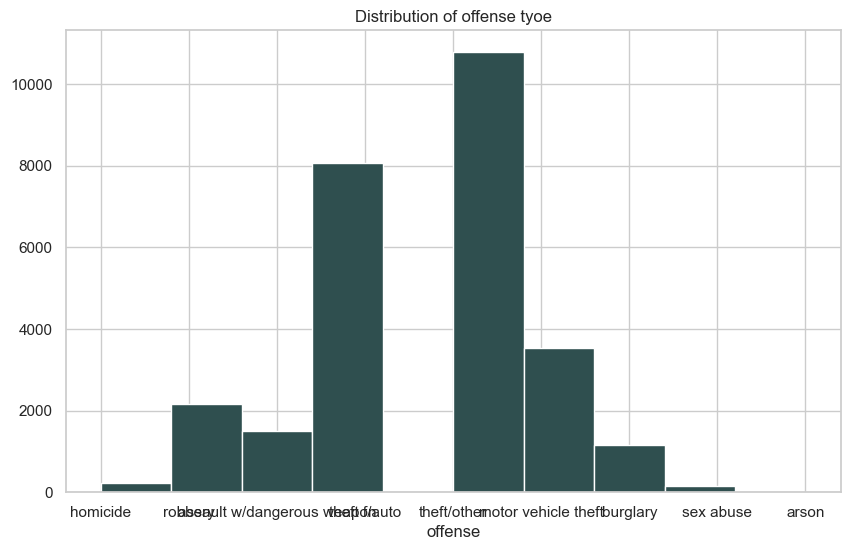

In [292]:
figure = plt.figure(figsize=(10, 6))

axes = figure.add_subplot(1, 1, 1)
axes.hist(crime_data.OFFENSE, color="darkslategray")
axes.set_title("Distribution of offense tyoe")
axes.set_xlabel("offense")

plt.show()
plt.close()

### Method ###
Method is the variable to describle how the crime was commited. It's a categorical variable. Let's take a look at the summary of it.

In [293]:
crime_data.METHOD.describe()

count      27611
unique         3
top       others
freq       24756
Name: METHOD, dtype: object

In [294]:
crime_data.METHOD.value_counts()

others    24756
gun        2333
knife       522
Name: METHOD, dtype: int64

We can see there are 3 methods in it, others, gun and knife. Most of them are others. 

### Latitude ###
Similar to Longtitude, This is a pretty straightforward variable. It represents the Latitude of the crime. Latitude is a continuous numerical data and let's a take a look at the summary of it.

In [295]:
crime_data.LATITUDE.describe()

count    27611.000000
mean        38.907542
std          0.029605
min         38.814659
25%         38.894325
50%         38.907235
75%         38.923862
max         38.994901
Name: LATITUDE, dtype: float64

The min here is 38.8147 and max is 38.9949. Since our crime data is based on DC area, so this make perfect sense. Now let's take a look at the distribution of it.

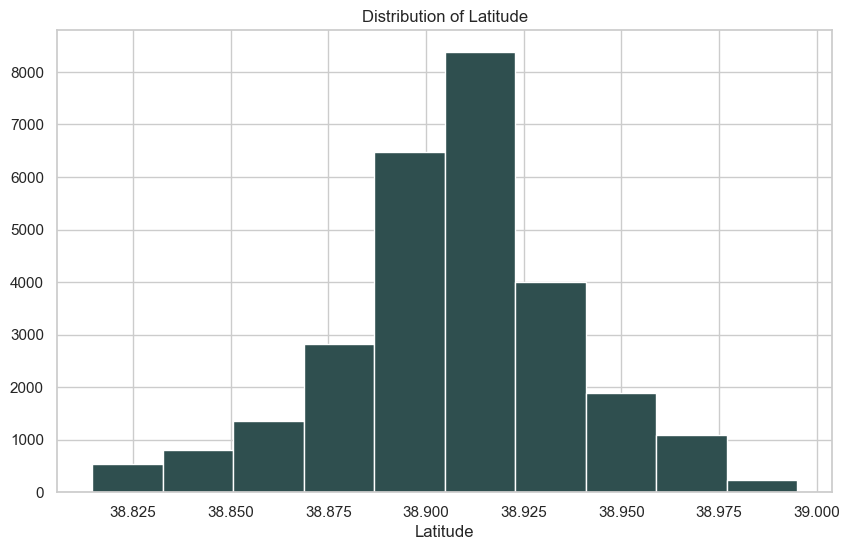

In [296]:
figure = plt.figure(figsize=(10, 6))

axes = figure.add_subplot(1, 1, 1)
axes.hist(crime_data.LATITUDE, color="darkslategray")
axes.set_title("Distribution of Latitude")
axes.set_xlabel("Latitude")

plt.show()
plt.close()

Here the distribution looks very nearly normal. 50% of the longtitude has the latitude between 38.875 to 38.925.

### Neighborhood name ###
This is a new variable we added to the dataset. This is the actual name for the neighborhood cluster. Let's take a look at the summary.

In [297]:
crime_data.NEIGHBORHOOD_NAME.describe()

count                                         27611
unique                                           46
top       Union Station, Stanton Park, Kingman Park
freq                                           2070
Name: NEIGHBORHOOD_NAME, dtype: object

In [298]:
crime_data.NEIGHBORHOOD_NAME.value_counts()

Union Station, Stanton Park, Kingman Park                                                            2070
Downtown, Chinatown, Penn Quarters, Mount Vernon Square, North Capitol Street                        2055
Columbia Heights, Mt. Pleasant, Pleasant Plains, Park View                                           1788
Howard University, Le Droit Park, Cardozo/Shaw                                                       1598
Ivy City, Arboretum, Trinidad, Carver Langston                                                       1335
Dupont Circle, Connecticut Avenue/K Street                                                           1276
Brightwood Park, Crestwood, Petworth                                                                 1270
Shaw, Logan Circle                                                                                   1125
Edgewood, Bloomingdale, Truxton Circle, Eckington                                                    1115
Capitol Hill, Lincoln Park                    

We can see that the downtown area, union station and columbia heights area seems like pretty dangerous. They are the most crimes happened in the Washington D.C. Let's plot the crimes on the map and see how it looks like.

In [299]:
crime_gdf = gpd.GeoDataFrame(
    crime_data, geometry=gpd.points_from_xy(crime_data.LONGITUDE, crime_data.LATITUDE))

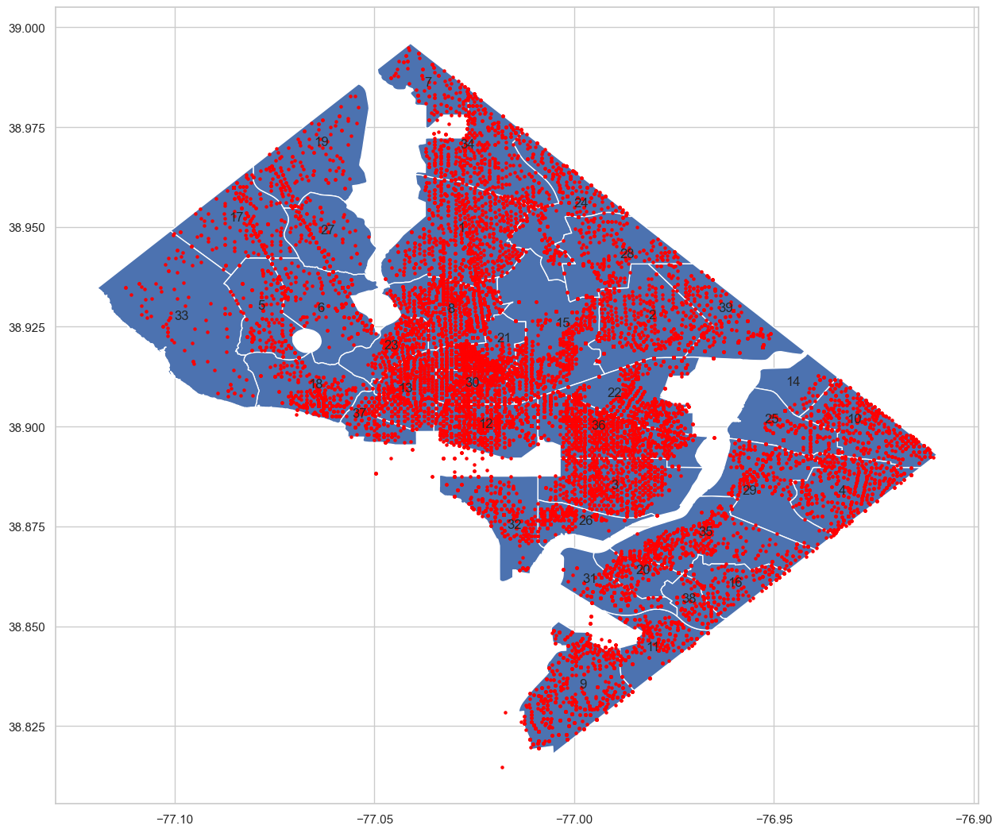

In [300]:
fig,ax = plt.subplots(figsize = (15,15))
base = neighborhoods_gpd.plot(ax=ax)
for idx, row in neighborhoods_gpd.iterrows():
    plt.annotate(row['alpha_index'], xy=row['rep_point'],
                 horizontalalignment='center')
    
crime_gdf.geometry.plot(ax=base, marker='o', color='red', markersize=5);
    
plt.show()

We can see from the map above, that majority of the crimes happened in the downtown area which aligned with our data.

### Reviews VS Crime ###

We are trying to analyze the relationship between the criminal data and reviews data. Given that reviews dataset only include the review id, reviewer id and comments. It will be hard to quantify them. We will focus on the review scores and total reviews.

We are curious to see if the total crimes happened in a specific neighborhood has any relationships with the review score and total reviews for the airbnb listings in that neighborhood.

There is one specific review for the airbnb is called review_scores_location, we will get the average value for this score for each neighborhood and together combined with the total crimes for the neighborhood.

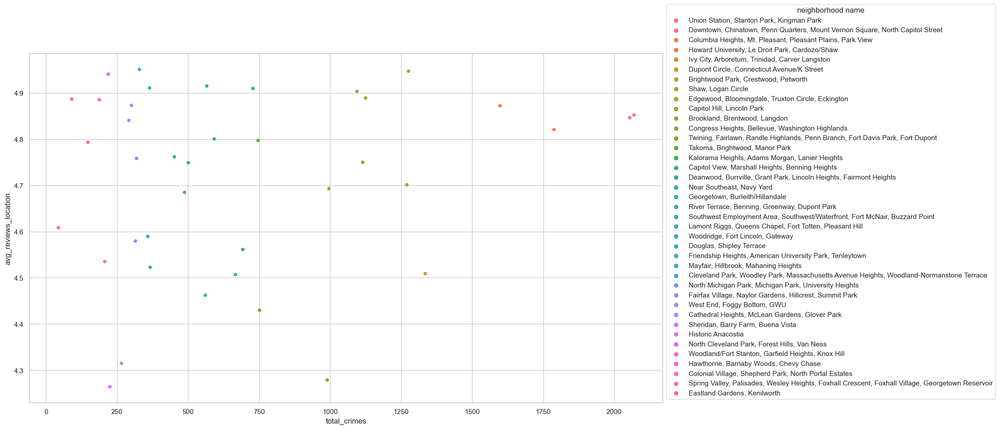

In [301]:
crime_results = con.execute("""
select 
neighborhood_name as neighborhood, count(column00) as total_crimes 
from crimes 
group by neighborhood_name 
order by total_crimes desc;""").df()

location_review = con.execute("""
select neighbourhood_cleansed as neighborhood, avg(review_scores_location) as avg_reviews_location 
from all_listings 
group by neighbourhood_cleansed
order by avg_reviews_location desc;
""").df()

crime_review = pd.merge(crime_results, location_review, on='neighborhood')

figure = plt.figure(figsize=(18, 10))
sns.scatterplot(x=crime_review.total_crimes, 
y=crime_review.avg_reviews_location, 
hue=crime_review.neighborhood)
plt.legend(bbox_to_anchor=(1, 0),loc="lower left", title="neighborhood name")

We can see from the figure that it seems like there is no strong relationship between the average location review scores with the total crimes. The neighborhood with most crimes is Union station, stanton Park, Kingman Park has a fairly high average location review scores. The neighborhood with the lowest location review scores don't have that many crimes happened.

What about the overall scores? maybe there is a relationship between them.

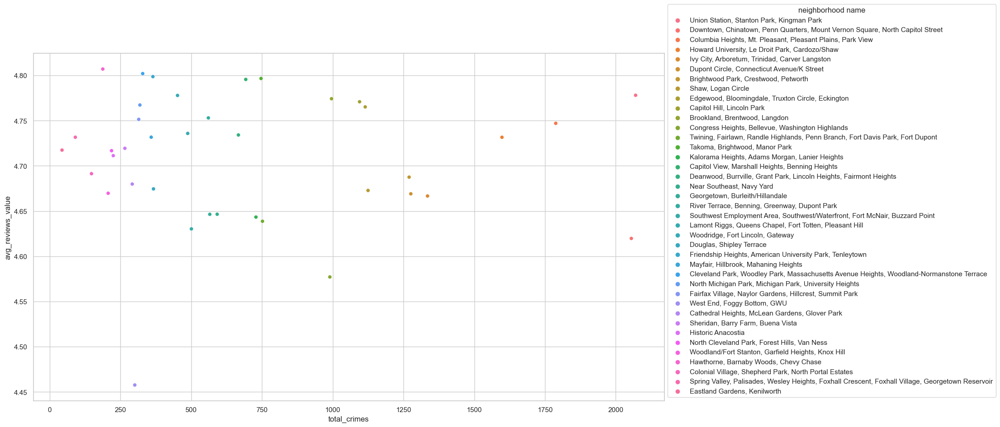

In [302]:
total_review = con.execute("""
select neighbourhood_cleansed as neighborhood, avg(review_scores_value) as avg_reviews_value 
from all_listings 
group by neighbourhood_cleansed
order by avg_reviews_value desc;
""").df()

crime_review = pd.merge(crime_results, total_review, on='neighborhood')

figure = plt.figure(figsize=(18, 10))
sns.scatterplot(x=crime_review.total_crimes, 
y=crime_review.avg_reviews_value, 
hue=crime_review.neighborhood)
plt.legend(bbox_to_anchor=(1, 0),loc="lower left", title="neighborhood name")

We still don't see a strong relationship with them. The neighborhood with less crimes does not have a very high rating score.

Let's check the cleanliness score and see if this has any relationship with the crimes.

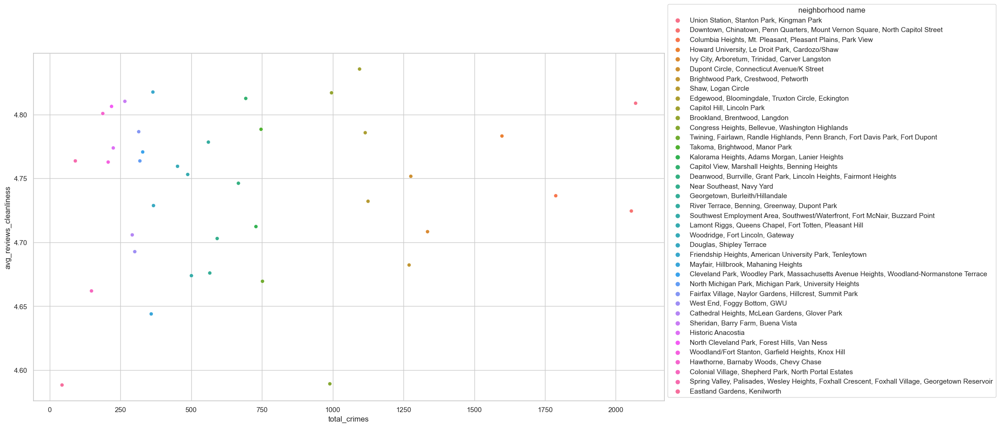

In [303]:
cleanliness_review = con.execute("""
select neighbourhood_cleansed as neighborhood, avg(review_scores_cleanliness) as avg_reviews_cleanliness 
from all_listings 
group by neighbourhood_cleansed
order by avg_reviews_cleanliness desc;
""").df()

crime_review = pd.merge(crime_results, cleanliness_review, on='neighborhood')

figure = plt.figure(figsize=(18, 10))
sns.scatterplot(x=crime_review.total_crimes, 
y=crime_review.avg_reviews_cleanliness, 
hue=crime_review.neighborhood)
plt.legend(bbox_to_anchor=(1, 0),loc="lower left", title="neighborhood name")

It seems like there is still no strong relationship between those two variables.

Let's take a look at the review score rating and see if there are any relationship with the total crimes.

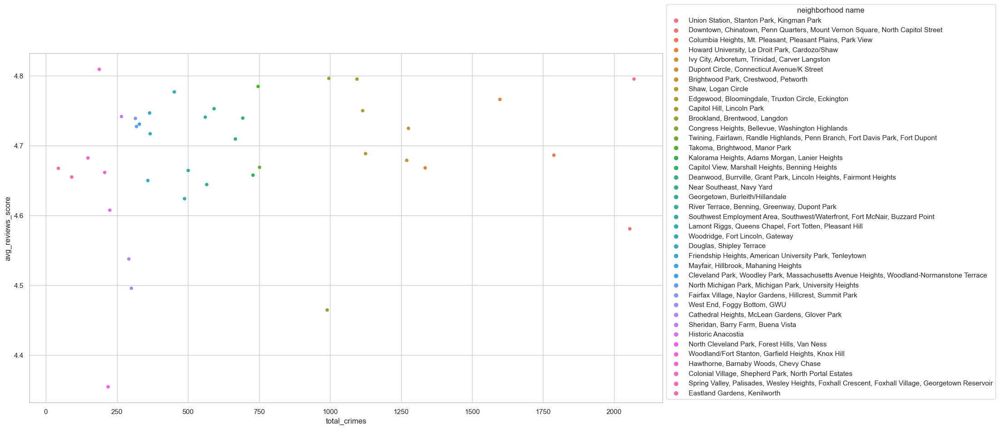

In [304]:
score_review = con.execute("""
select neighbourhood_cleansed as neighborhood, avg(review_scores_rating) as avg_reviews_score
from all_listings 
group by neighbourhood_cleansed
order by avg_reviews_score desc;
""").df()

crime_review = pd.merge(crime_results, score_review, on='neighborhood')

figure = plt.figure(figsize=(18, 10))
sns.scatterplot(x=crime_review.total_crimes, 
y=crime_review.avg_reviews_score, 
hue=crime_review.neighborhood)
plt.legend(bbox_to_anchor=(1, 0),loc="lower left", title="neighborhood name")

similar to the previous results, we don't see a strong trending between the score rating and total crimes for each neighborhood.

Let's now take a look at the communication score.

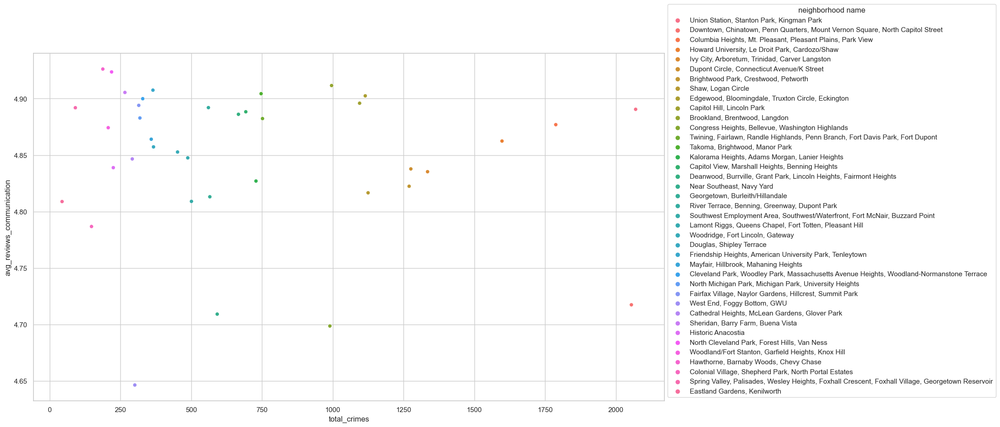

In [305]:
communication_review = con.execute("""
select neighbourhood_cleansed as neighborhood, avg(review_scores_communication) as avg_reviews_communication
from all_listings 
group by neighbourhood_cleansed
order by avg_reviews_communication desc;
""").df()

crime_review = pd.merge(crime_results, communication_review, on='neighborhood')

figure = plt.figure(figsize=(18, 10))
sns.scatterplot(x=crime_review.total_crimes, 
y=crime_review.avg_reviews_communication, 
hue=crime_review.neighborhood)
plt.legend(bbox_to_anchor=(1, 0),loc="lower left", title="neighborhood name")

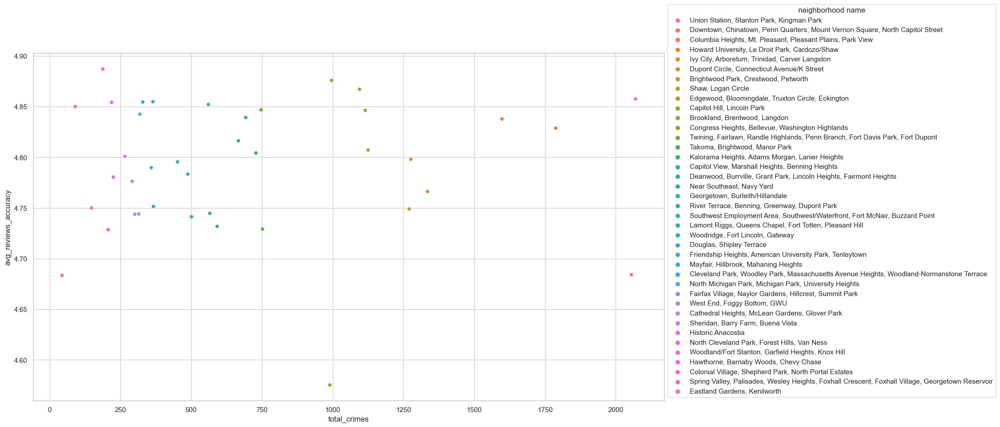

In [306]:
accuracy_review = con.execute("""
select neighbourhood_cleansed as neighborhood, avg(review_scores_accuracy) as avg_reviews_accuracy
from all_listings 
group by neighbourhood_cleansed
order by avg_reviews_accuracy desc;
""").df()

crime_review = pd.merge(crime_results, accuracy_review, on='neighborhood')

figure = plt.figure(figsize=(18, 10))
sns.scatterplot(x=crime_review.total_crimes, 
y=crime_review.avg_reviews_accuracy, 
hue=crime_review.neighborhood)
plt.legend(bbox_to_anchor=(1, 0),loc="lower left", title="neighborhood name")

For the accuracy review score, we found that there is no strong relationship. The dots are fairly discrete on the graph.

We still didn't see a strong relationship between them. 

Now let's take a look at the total reviews. Total reviews represents the number of reviews the listing has. Let's if there is a relationship between the total review and the total crimes for each neighborhood.

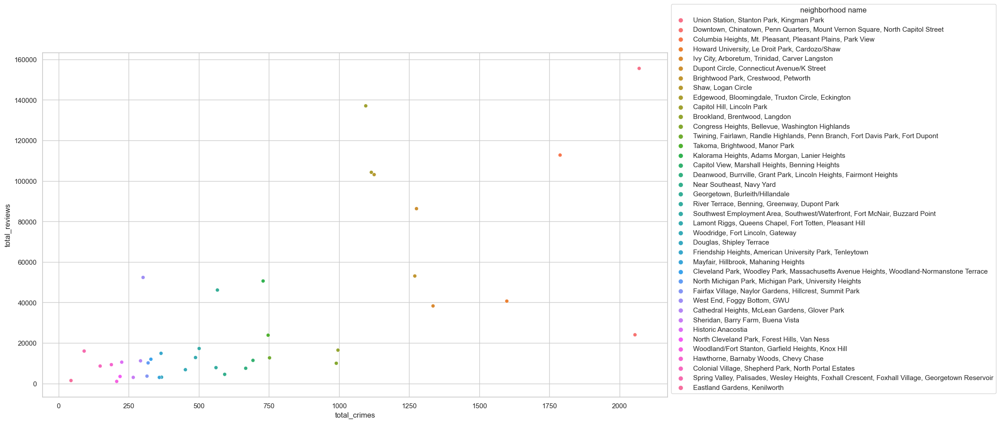

In [307]:
review_sum = con.execute("""
select neighbourhood_cleansed as neighborhood, sum(number_of_reviews) as total_reviews from all_listings 
group by neighbourhood_cleansed
order by total_reviews desc;
""").df()

crime_review = pd.merge(crime_results, review_sum, on='neighborhood')

figure = plt.figure(figsize=(18, 10))
sns.scatterplot(x=crime_review.total_crimes, 
y=crime_review.total_reviews, 
hue=crime_review.neighborhood)
plt.legend(bbox_to_anchor=(1, 0),loc="lower left", title="neighborhood name")

In this graph, we saw a very interesting up trending. It seems like the airbnb listings located in the neighborhood with more crimes will receive more reviews from the tenants. It maybe because there are more tenents choose to stay in those areas. 

Let's see if this aligned well with the reviews per month variable.

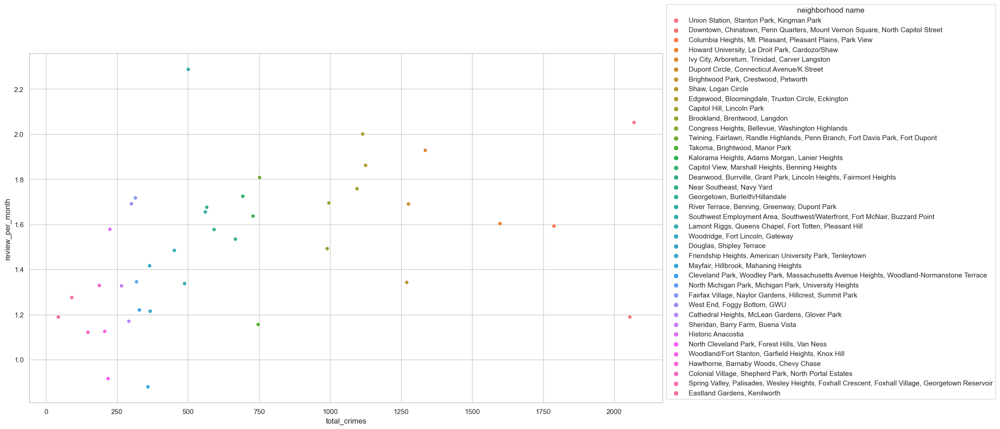

In [308]:
review_per_month = con.execute("""
select neighbourhood_cleansed as neighborhood, avg(reviews_per_month) as review_per_month from all_listings 
group by neighbourhood_cleansed
order by review_per_month desc;
""").df()

crime_review = pd.merge(crime_results, review_per_month, on='neighborhood')

figure = plt.figure(figsize=(18, 10))
sns.scatterplot(x=crime_review.total_crimes, 
y=crime_review.review_per_month, 
hue=crime_review.neighborhood)
plt.legend(bbox_to_anchor=(1, 0),loc="lower left", title="neighborhood name")

We can still see this trending similarly with reviews received per month for each listing. It seems like the listings in those ares which has more crimes will have more reviews received.

Based on our further research, we found this [dataset](https://datacenter.kidscount.org/data/tables/7380-population-by-age-group-by-neighborhood#detailed/3/any/false/573,869,36,868,867,133/3608,3490,3566,3567,3568,3569,3570,3571,3572,3573,3574,3575,3576,3577,3578,3579,3580,3581,3582,3583,3584,3585,3586,3587,3588,3589,3590,3591,3592,3593,3594,3595,3596,3597,3598,3599,3600,3601,3602,3603,3604|214,213,354/14461) which represents the population by age group of Washington D.C. We can see that union station, Downtown and Columbia Heights has the most population in the city of D.C. and this could explain the trending we find above.

# Table of Contents Archive

* [Information](#information)
* [Data Loading](#dataloading)
* [Single Variable EDA](#singlevariableeda)
    - [price](#price)
    - [neighborhood](#neighborhood)
    - [Host Information]
        - [host_since](#host_since)
        - [host_location](#host_location)
        - [host_response_time](#host_response_time)
        - [host_response_rate](#host_respone_rate)
        - [host_acceptance_rate](#host_acceptance_rate)
        - [host_is_superhost](#host_is_superhost)
        - [host_listings_count](#host_listings_count)
        - [host_total_listings_count](#host_total_listings_count)
        - [host_verifications](#host_verifications)
        - [host_has_profile_pic](#host_has_profile_pic)
        - [host_identity_verified](#host_identity_verified)
    - [Rental Information](#Rental_Info)
        - [property_type](#property_type)
        - [room_type](#room_type)
        - [accomodates](#accomodates)
        - [bathrooms](#bathrooms)
        - [bathrooms_text](#bathroom_text)
        - [bedrooms](#bedrooms)
        - [amenities](#amenities)
    - [Review Scores]
    - [Calendar Data]
    - [Crime Information]
* [Pairwise EDA - Target Variable: price](#pairwise_eda_price)
    - [neighborhood vs. price](#neighborhood_vs_price)
    - [Host Information]
        - [host_since vs. price](#host_since_vs_price)
        - [host_location vs. price](#host_location_vs_price)
        - [host_response_time vs. price](#host_response_time_vs_price)
        - [host_response_rate vs. price](#host_respone_rate_vs_price)
        - [host_acceptance_rate vs. price](#host_acceptance_rate_vs_price)
        - [host_is_superhost vs. price](#host_is_superhost_vs_price)
        - [host_listings_count vs. price](#host_listings_count_vs_price)
        - [host_total_listings_count vs. price](#host_total_listings_count_vs_price)
        - [host_verifications vs. price](#host_verifications_vs_price)
        - [host_has_profile_pic vs. price](#host_has_profile_pic_vs_price)
        - [host_identity_verified vs. price](#host_identity_verified_vs_price)
    - [Rental Information]
        - [Room Type v Price](#room_type_vs_price)
        - [Accomodates v Price](#accomodates_v_price)
        - [Bedrooms v Price](#bedrooms_v_price)
* [Exploration Conclusion]

    - [Review Scores]
    - [Crime Information]

_Skipped_
* [Pairwise EDA - Target Variable: rating](#pairwise_eda_rating)
    - [neighborhood vs. rating](#neighborhood_vs_rating)
    - [host_since vs. rating](#host_since_vs_rating)
    - [host_location vs. rating](#host_location_vs_rating)
    - [host_response_time vs. rating](#host_response_time_vs_rating)
    - [host_response_rate vs. rating](#host_respone_rate_vs_rating)
    - [host_acceptance_rate vs. rating](#host_acceptance_rate_vs_rating)
    - [host_is_superhost vs. rating](#host_is_superhost_vs_rating)
    - [host_listings_count vs. rating](#host_listings_count_vs_rating)
    - [host_total_listings_count vs. rating](#host_total_listings_count_vs_rating)
    - [host_verifications vs. rating](#host_verifications_vs_rating)
    - [host_has_profile_pic vs. rating](#host_has_profile_pic_vs_rating)
    - [host_identity_verified vs. rating](#host_identity_verified_vs_rating)

# Close Connection

In [309]:
con.close()